# Imports
to add
- for roll -- show % contango vs backwardation and maybe highlight periods
- short term MA (rolling 1/2) long term value (roll M12/13): see book for value definition
- Maybe use it as a stop loss strategy replacement

In [1]:
# ---------------------------------------------------------------------
# Imports
# ---------------------------------------------------------------------
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import mpl_toolkits
from mpl_toolkits.mplot3d import Axes3D  # noqa
import matplotlib.dates as mdates
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import re

import sys, os
from pathlib import Path

# 1) where we are right now
CWD = Path.cwd()  # /Users/.../Systematic_Energy_Trading/futures_strategies

# 2) project root = parent of current folder
PROJECT_ROOT = CWD.parent  # /Users/.../Systematic_Energy_Trading

# 3) put *project root* at the very front of sys.path
sys.path.insert(0, str(PROJECT_ROOT))

# 4) quick check
print("CWD:", CWD)
print("PROJECT_ROOT:", PROJECT_ROOT)
print("rolling.py exists?:", (PROJECT_ROOT / "energy/strategies/rolling.py").exists())



from energy.strategies.rolling import (
    rolling_pnl,
    roll_EL,
    RollingStrategy,
    roll_EOM_NGL,
    roll_EOM_EOM_expiry,
    roll_EOM_midmonth_expiry,
    roll_EOM_dynamic_brent,
)
from energy.strategies.momentum import (
    momentum
)

from energy.strategies.value import (
    value,
    statistical_arbitrage
)

from energy.strategies.portfolios import (
    equal_weight_static, risk_parity_static, risk_parity_dynamic, mvo
)
from energy.strategies.carry import carry
from energy.analytics.metrics import metrics
from energy.preprocess.expiry_calendar import expiry_calendar
from energy.preprocess.read_data import read_data
from energy.preprocess.drop_dupes import drop_dupes

plt.style.use("seaborn-v0_8-whitegrid")

data_path = "../data/Commods.xlsx"
calendar_path = "../data/expiry_calendars.xlsx"



CWD: /Users/markbogorad/Desktop/Quant_Projects/Systematic_Energy_Trading/futures_strategies
PROJECT_ROOT: /Users/markbogorad/Desktop/Quant_Projects/Systematic_Energy_Trading
rolling.py exists?: True


# Set Commodities (6-pack+NGLs)
- Parameters for Scaling & T-cost

In [2]:
# roughly set to 0.01%-0.05%

# COMMODITIES = {
#     "Propane": ("BAP", 100, 1000, 0.001),
#     "Ethane":  ("CAP", 100, 1000, 0.001),
#     "Butane":  ("DAE", 100, 1000, 0.001),
#     "WTI":     ("CL", 100, 1000, 0.01),
#     "Brent":   ("CO", 100, 1000, 0.01),
#     "ULSD":    ("HO", 100, 1000, 0.05),
#     "RBOB":    ("XB", 100, 1000, 0.02),
#     "Gasoil":  ("QS", 100, 1000, 0.02), 
#     "Natgas":  ("NG", 100, 1000, 0.001), 
# }

# No t-cost

COMMODITIES = {
    "Propane": ("BAP", 100, 1000, 0),
    "Ethane":  ("CAP", 100, 1000, 0),
    "Butane":  ("DAE", 100, 1000, 0),
    "WTI":     ("CL", 100, 1000, 0),
    "Brent":   ("CO", 100, 1000, 0),
    "ULSD":    ("HO", 100, 1000, 0),
    "RBOB":    ("XB", 100, 1000, 0),
    "Gasoil":  ("QS", 100, 1000, 0), 
    "Natgas":  ("NG", 100, 1000, 0), 
}

NORMALIZATION = {
    # NGLs are quoted in ¢/gal  → $/bbl  = c/gal 100 * 0.42
    "Propane": 0.42*100,
    "Ethane":  0.42*100,
    "Butane":  0.42*100,

    # Refineds are quoted in $/gal → $/bbl = $/gal * 42, 
    # since already scaling by 100 per lot, the multiplier is 0.42
    "RBOB":   0.42,
    "ULSD":   0.42,

    # Crudes already in $/bbl
    "WTI":     1.0,
    "Brent":   1.0,

    # ICE Gasoil in $/metric ton → $/bbl ≈ $/ton / 7.45
    "Gasoil":  1.0 / 7.45,   # ≈ 0.134228

    # Natgas in $/MMBtu → $/bbl-equiv ≈ $/MMBtu * 5.8
    "Natgas":  5.8,
}

roll_window = 5

CLEAN_DATA = {}
all_ma_results = {}
all_carry_results = {}


# Rolling Futures + Drop Dupes on All

In [3]:
_FCOL_PATTERN = re.compile(r"^F\d+$")

def load_prices(commodity_name: str, ticker: str, *, normalize: bool = True) -> pd.DataFrame:
    sheet_name = f"{commodity_name} ({ticker})"
    df = read_data(data_path, sheet=sheet_name)
    df = drop_dupes(df).sort_index()

    if normalize:
        scale = NORMALIZATION.get(commodity_name, 1.0)
        if scale != 1.0:
            fcols = [c for c in df.columns if _FCOL_PATTERN.match(str(c))]
            if fcols:
                df.loc[:, fcols] = df[fcols] * scale
        # remember what we did
        df.attrs["norm_scale"] = scale
    else:
        df.attrs["norm_scale"] = 1.0

    return df


def load_expiry(ticker: str) -> pd.DatetimeIndex:
    return expiry_calendar(ticker, calendar_path)



## NGLs Roll

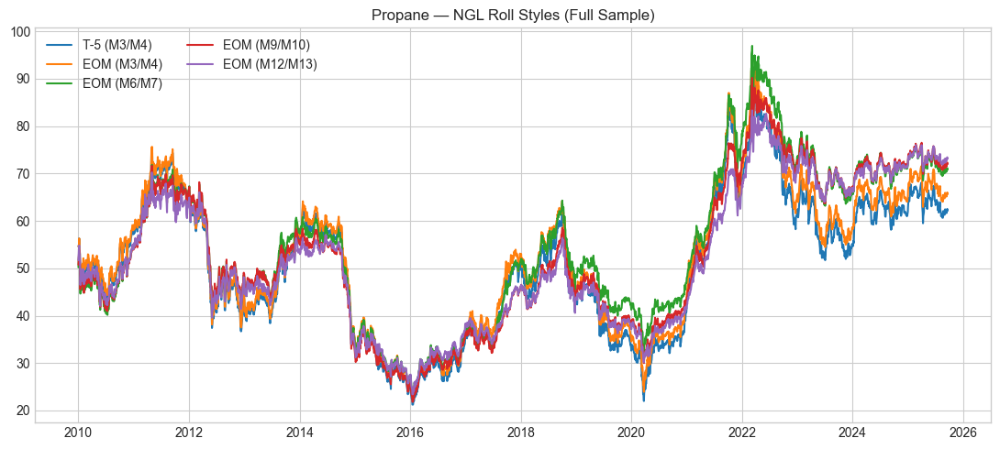

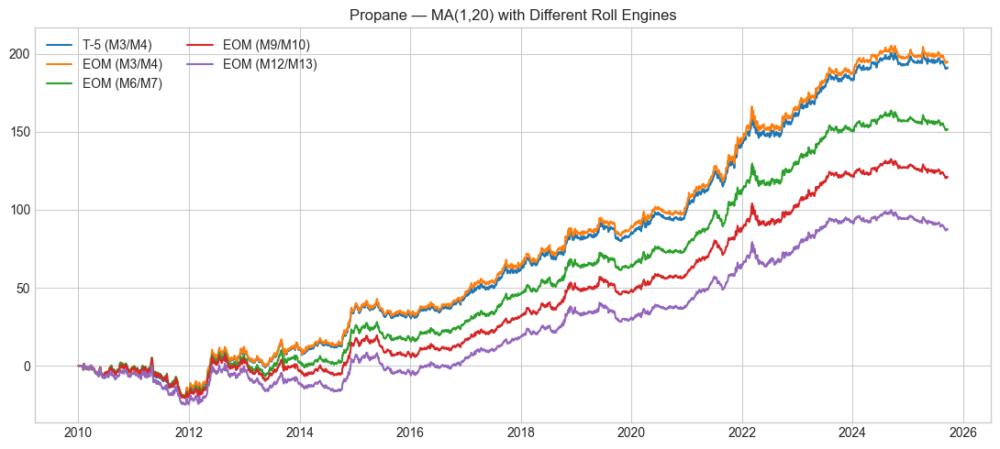

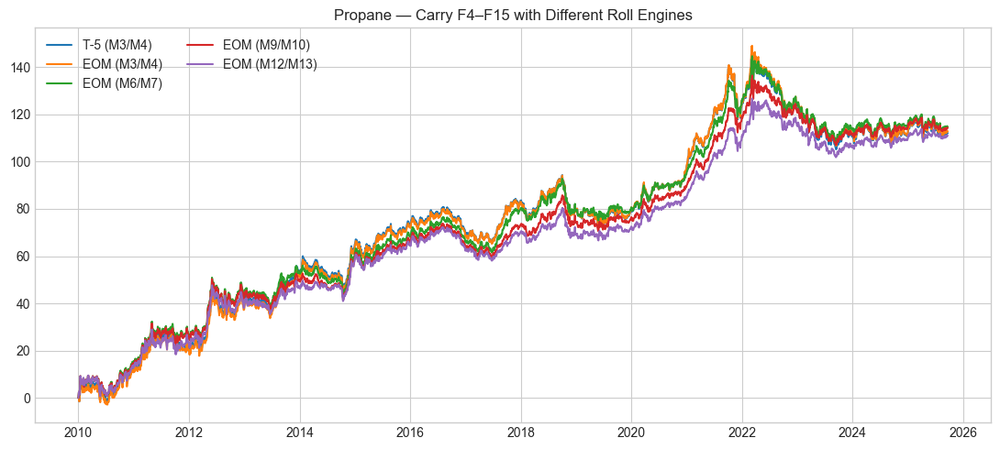

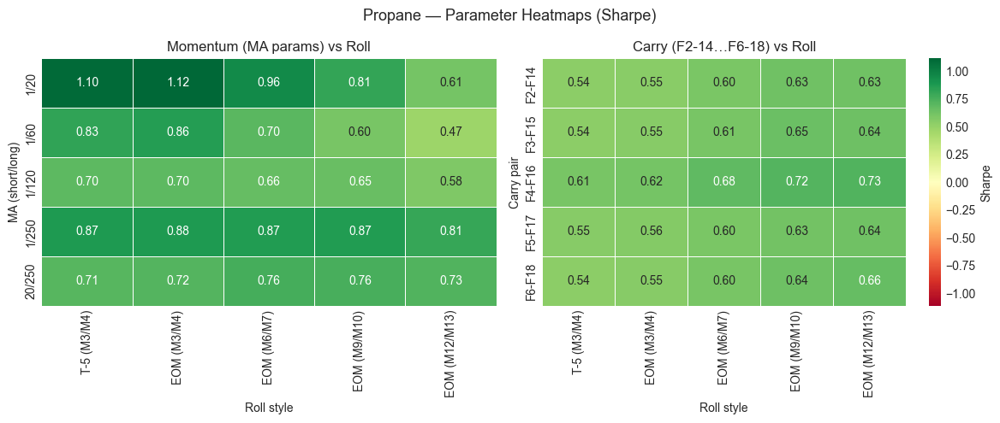

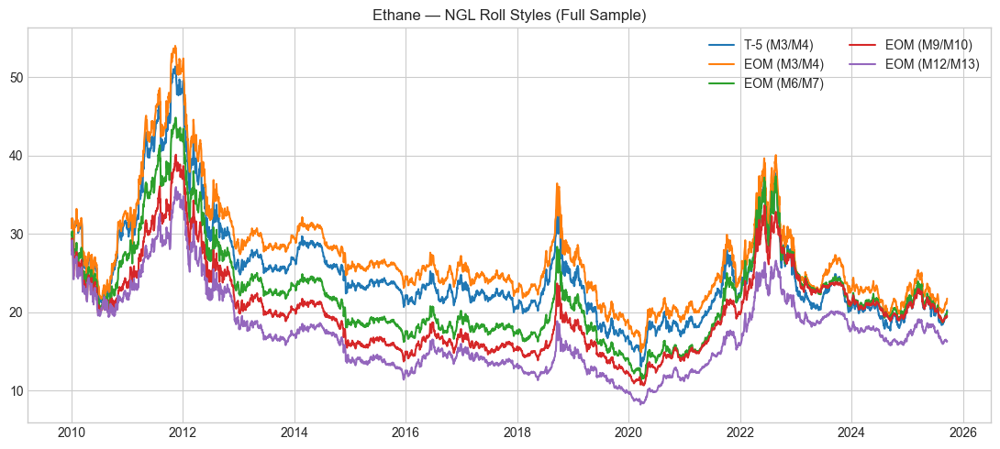

...

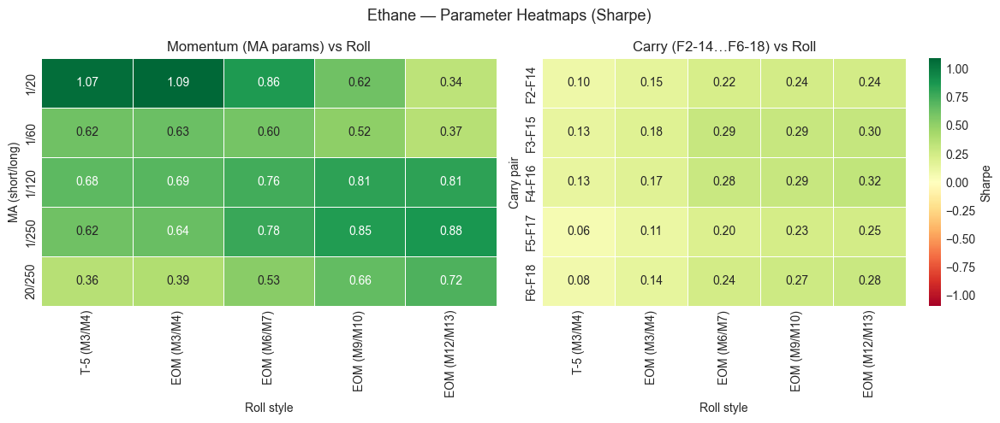

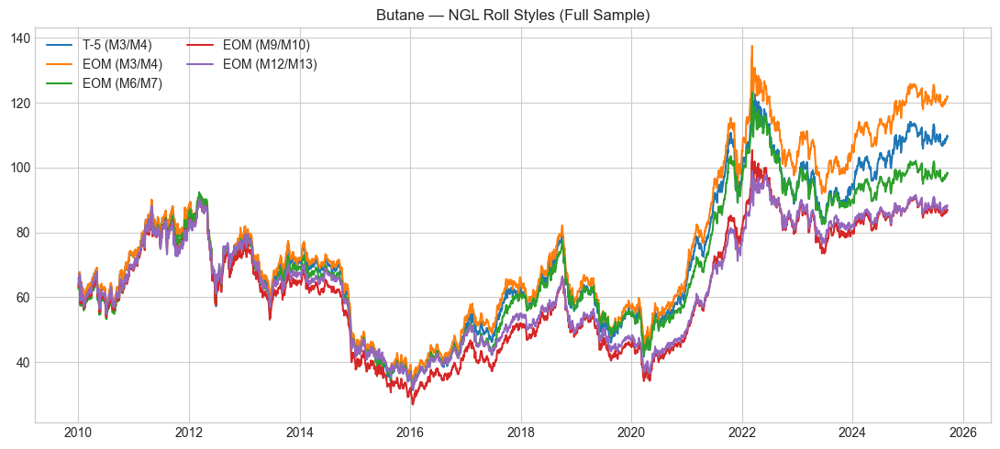

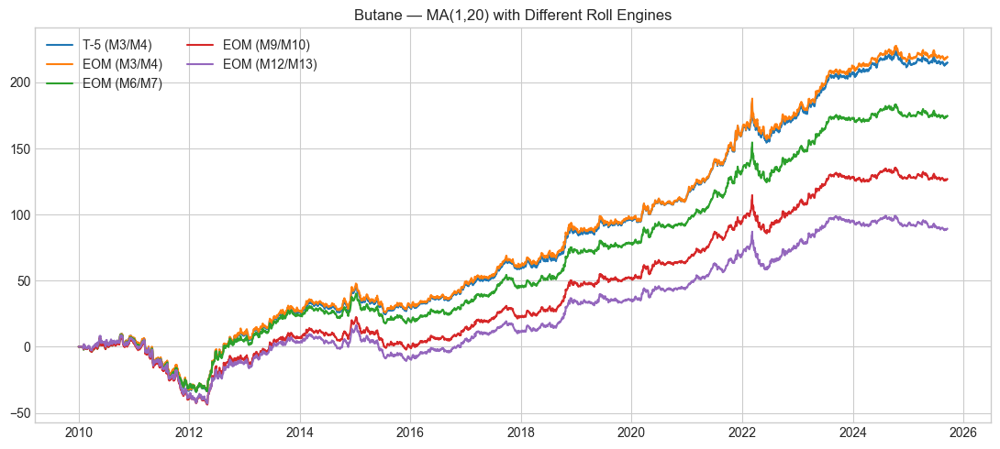

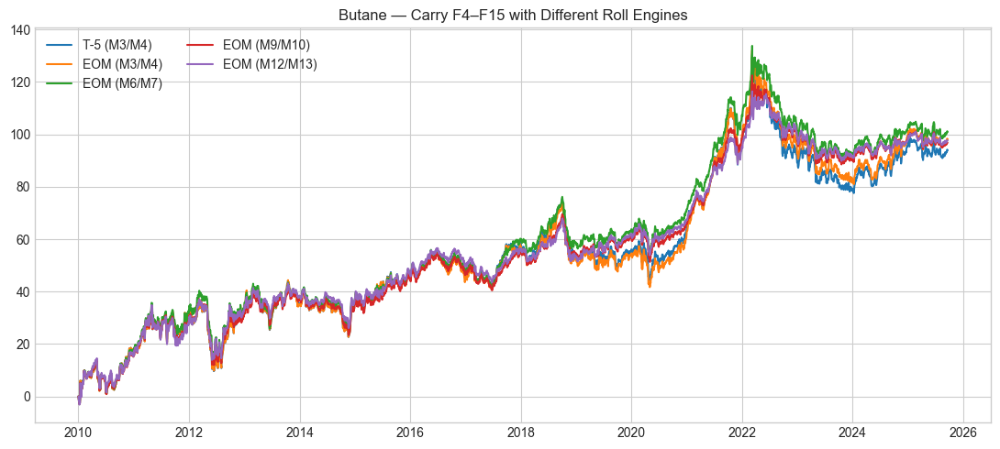

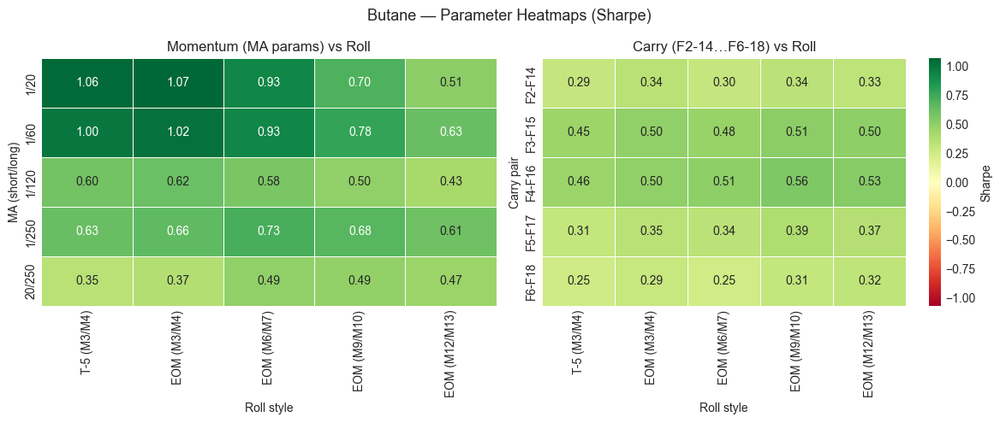

Total PnL  Total Cost  APL/unit (ann.)    CAGR  \
commodity style                                                                
Propane   T-5 (M3/M4)      749,238.0000     -0.0000           0.4766  0.0046   
          EOM (M3/M4)    1,097,334.0000     -0.0000           0.6980  0.0066   
          EOM (M6/M7)    2,060,310.0000     -0.0000           1.3106  0.0120   
          EOM (M9/M10)   2,122,428.0000     -0.0000           1.3501  0.0123   
          EOM (M12/M13)  2,136,582.0000     -0.0000           1.3591  0.0124   
Ethane    T-5 (M3/M4)   -1,046,850.0000     -0.0000          -0.6659 -0.0070   
          EOM (M3/M4)     -898,380.0000     -0.0000          -0.5715 -0.0060   
          EOM (M6/M7)     -886,074.0000     -0.0000          -0.5636 -0.0059   
          EOM (M9/M10)    -834,708.0000     -0.0000          -0.5310 -0.0055   
          EOM (M12/M13) -1,107,036.0000     -0.0000          -0.7042 -0.0074   
Butane    T-5 (M3/M4)    4,390,386.0000     -0.0000           2.7928  0.0234   
          EOM (M3/M4)    5,609,184.0000     -0.0000           3.5681  0.0287   
          EOM (M6/M7)    3,563,406.0000     -0.0000           2.2667  0.0196   
          EOM (M9/M10)   2,370,816.0000     -0.0000           1.5081  0.0136   
          EOM (M12/M13)  2,423,652.0000     -0.0000           1.5417  0.0139   

                         Std Dev (ann.)  Sharpe  Drawdown     RoD   Years  
commodity style                                                            
Propane   T-5 (M3/M4)           11.1326  0.0428   -0.4462  1.0680 15.7205  
          EOM (M3/M4)           11.2138  0.0622   -0.4370  1.5973 15.7205  
          EOM (M6/M7)           10.1765  0.1288   -0.3990  3.2846 15.7205  
          EOM (M9/M10)           9.5675  0.1411   -0.4120  3.2767 15.7205  
          EOM (M12/M13)          9.2053  0.1476   -0.3949  3.4416 15.7205  
Ethane    T-5 (M3/M4)            5.9385 -0.1121   -0.3175 -2.0975 15.7205  
          EOM (M3/M4)            6.0039 -0.0952   -0.3172 -1.8017 15.7205  
          EOM (M6/M7)            5.2208 -0.1080   -0.2887 -1.9526 15.7205  
          EOM (M9/M10)           4.6984 -0.1130   -0.2622 -2.0250 15.7205  
          EOM (M12/M13)          4.3112 -0.1633   -0.2557 -2.7545 15.7205  
Butane    T-5 (M3/M4)           13.0634  0.2138   -0.4784  5.8378 15.7205  
          EOM (M3/M4)           13.1746  0.2708   -0.4637  7.6946 15.7205  
          EOM (M6/M7)           12.0992  0.1873   -0.4669  4.8547 15.7205  
          EOM (M9/M10)          11.6237  0.1297   -0.4985  3.0252 15.7205  
          EOM (M12/M13)         11.2397  0.1372   -0.4641  3.3217 15.7205

Total PnL  Total Cost  APL/unit (ann.)  \
commodity style         strategy                                                
Propane   T-5 (M3/M4)   MA(1,20) 19,088,202.0000     -0.0000          12.1422   
          EOM (M3/M4)   MA(1,20) 19,464,186.0000     -0.0000          12.3814   
          EOM (M6/M7)   MA(1,20) 15,150,576.0000     -0.0000           9.6374   
          EOM (M9/M10)  MA(1,20) 12,095,412.0000     -0.0000           7.6940   
          EOM (M12/M13) MA(1,20)  8,745,408.0000     -0.0000           5.5630   
Ethane    T-5 (M3/M4)   MA(1,20)  9,791,124.0000     -0.0000           6.2282   
          EOM (M3/M4)   MA(1,20) 10,148,208.0000     -0.0000           6.4554   
          EOM (M6/M7)   MA(1,20)  6,924,414.0000     -0.0000           4.4047   
          EOM (M9/M10)  MA(1,20)  4,479,510.0000     -0.0000           2.8495   
          EOM (M12/M13) MA(1,20)  2,246,328.0000     -0.0000           1.4289   
Butane    T-5 (M3/M4)   MA(1,20) 21,489,426.0000     -0.0000          13.6696   
          EOM (M3/M4)   MA(1,20) 21,927,570.0000     -0.0000          13.9483   
          EOM (M6/M7)   MA(1,20) 17,453,814.0000     -0.0000          11.1025   
          EOM (M9/M10)  MA(1,20) 12,681,312.0000     -0.0000           8.0667   
          EOM (M12/M13) MA(1,20)  8,924,034.0000     -0.0000           5.6767   

                                   CAGR  Std Dev (ann.)  Sharpe  Drawdown  \
commodity style         strategy                                            
Propane   T-5 (M3/M4)   MA(1,20) 0.0703         11.0309  1.1007   -0.2342   
          EOM (M3/M4)   MA(1,20) 0.0712         11.1090  1.1145   -0.2327   
          EOM (M6/M7)   MA(1,20) 0.0604         10.0744  0.9566   -0.2407   
          EOM (M9/M10)  MA(1,20) 0.0517          9.4629  0.8131   -0.2414   
          EOM (M12/M13) MA(1,20) 0.0408          9.1018  0.6112   -0.2532   
Ethane    T-5 (M3/M4)   MA(1,20) 0.0444          5.8581  1.0632   -0.0568   
          EOM (M3/M4)   MA(1,20) 0.0456          5.9226  1.0900   -0.0566   
          EOM (M6/M7)   MA(1,20) 0.0340          5.1525  0.8549   -0.0665   
          EOM (M9/M10)  MA(1,20) 0.0238          4.6236  0.6163   -0.1022   
          EOM (M12/M13) MA(1,20) 0.0130          4.2183  0.3387   -0.1379   
Butane    T-5 (M3/M4)   MA(1,20) 0.0757         12.9344  1.0568   -0.4010   
          EOM (M3/M4)   MA(1,20) 0.0766         13.0463  1.0691   -0.3974   
          EOM (M6/M7)   MA(1,20) 0.0664         11.9721  0.9274   -0.3975   
          EOM (M9/M10)  MA(1,20) 0.0535         11.4794  0.7027   -0.4771   
          EOM (M12/M13) MA(1,20) 0.0414         11.0941  0.5117   -0.4757   

                                      RoD   Years  
commodity style         strategy                   
Propane   T-5 (M3/M4)   MA(1,20)  51.8518 15.7205  
          EOM (M3/M4)   MA(1,20)  53.1989 15.7205  
          EOM (M6/M7)   MA(1,20)  40.0413 15.7205  
          EOM (M9/M10)  MA(1,20)  31.8670 15.7205  
          EOM (M12/M13) MA(1,20)  21.9737 15.7205  
Ethane    T-5 (M3/M4)   MA(1,20) 109.6960 15.7205  
          EOM (M3/M4)   MA(1,20) 114.0013 15.7205  
          EOM (M6/M7)   MA(1,20)  66.2636 15.7205  
          EOM (M9/M10)  MA(1,20)  27.8697 15.7205  
          EOM (M12/M13) MA(1,20)  10.3618 15.7205  
Butane    T-5 (M3/M4)   MA(1,20)  34.0871 15.7205  
          EOM (M3/M4)   MA(1,20)  35.0969 15.7205  
          EOM (M6/M7)   MA(1,20)  27.9295 15.7205  
          EOM (M9/M10)  MA(1,20)  16.9078 15.7205  
          EOM (M12/M13) MA(1,20)  11.9344 15.7205

Total PnL  Total Cost  \
commodity style         strategy                                  
Propane   T-5 (M3/M4)   Carry F4-15 11,193,462.0000     -0.0000   
          EOM (M3/M4)   Carry F4-15 11,271,246.0000     -0.0000   
          EOM (M6/M7)   Carry F4-15 11,471,292.0000     -0.0000   
          EOM (M9/M10)  Carry F4-15 11,413,500.0000     -0.0000   
          EOM (M12/M13) Carry F4-15 11,090,310.0000     -0.0000   
Ethane    T-5 (M3/M4)   Carry F4-15  1,294,188.0000     -0.0000   
          EOM (M3/M4)   Carry F4-15  1,777,146.0000     -0.0000   
          EOM (M6/M7)   Carry F4-15  2,290,638.0000     -0.0000   
          EOM (M9/M10)  Carry F4-15  2,081,310.0000     -0.0000   
          EOM (M12/M13) Carry F4-15  1,915,788.0000     -0.0000   
Butane    T-5 (M3/M4)   Carry F4-15  9,391,326.0000     -0.0000   
          EOM (M3/M4)   Carry F4-15  9,810,402.0000     -0.0000   
          EOM (M6/M7)   Carry F4-15 10,092,558.0000     -0.0000   
          EOM (M9/M10)  Carry F4-15  9,680,958.0000     -0.0000   
          EOM (M12/M13) Carry F4-15  9,766,008.0000     -0.0000   

                                     APL/unit (ann.)   CAGR  Std Dev (ann.)  \
commodity style         strategy                                              
Propane   T-5 (M3/M4)   Carry F4-15           7.1203 0.0489         11.1139   
          EOM (M3/M4)   Carry F4-15           7.1698 0.0492         11.1951   
          EOM (M6/M7)   Carry F4-15           7.2970 0.0498         10.1573   
          EOM (M9/M10)  Carry F4-15           7.2602 0.0496          9.5484   
          EOM (M12/M13) Carry F4-15           7.0547 0.0486          9.1894   
Ethane    T-5 (M3/M4)   Carry F4-15           0.8232 0.0078          5.9350   
          EOM (M3/M4)   Carry F4-15           1.1305 0.0105          6.0002   
          EOM (M6/M7)   Carry F4-15           1.4571 0.0132          5.2174   
          EOM (M9/M10)  Carry F4-15           1.3239 0.0121          4.6960   
          EOM (M12/M13) Carry F4-15           1.2187 0.0112          4.3089   
Butane    T-5 (M3/M4)   Carry F4-15           5.9739 0.0430         13.0516   
          EOM (M3/M4)   Carry F4-15           6.2405 0.0444         13.1633   
          EOM (M6/M7)   Carry F4-15           6.4200 0.0454         12.0861   
          EOM (M9/M10)  Carry F4-15           6.1582 0.0440         11.6107   
          EOM (M12/M13) Carry F4-15           6.2123 0.0443         11.2264   

                                     Sharpe  Drawdown     RoD   Years  
commodity style         strategy                                       
Propane   T-5 (M3/M4)   Carry F4-15  0.6407   -0.1689 42.1631 15.7205  
          EOM (M3/M4)   Carry F4-15  0.6404   -0.1692 42.3716 15.7205  
          EOM (M6/M7)   Carry F4-15  0.7184   -0.1481 49.2573 15.7205  
          EOM (M9/M10)  Carry F4-15  0.7604   -0.1242 58.4613 15.7205  
          EOM (M12/M13) Carry F4-15  0.7677   -0.1094 64.4610 15.7205  
Ethane    T-5 (M3/M4)   Carry F4-15  0.1387   -0.1676  4.9110 15.7205  
          EOM (M3/M4)   Carry F4-15  0.1884   -0.1634  6.9166 15.7205  
          EOM (M6/M7)   Carry F4-15  0.2793   -0.1484  9.8215 15.7205  
          EOM (M9/M10)  Carry F4-15  0.2819   -0.1454  9.1064 15.7205  
          EOM (M12/M13) Carry F4-15  0.2828   -0.1391  8.7591 15.7205  
Butane    T-5 (M3/M4)   Carry F4-15  0.4577   -0.2237 26.7044 15.7205  
          EOM (M3/M4)   Carry F4-15  0.4741   -0.2202 28.3406 15.7205  
          EOM (M6/M7)   Carry F4-15  0.5312   -0.1841 34.8803 15.7205  
          EOM (M9/M10)  Carry F4-15  0.5304   -0.1831 33.6348 15.7205  
          EOM (M12/M13) Carry F4-15  0.5534   -0.1685 36.8582 15.7205

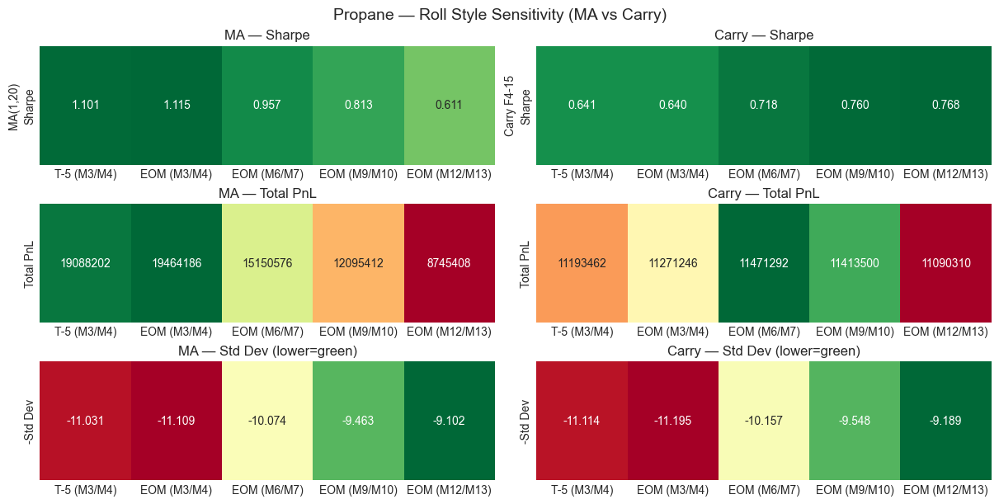

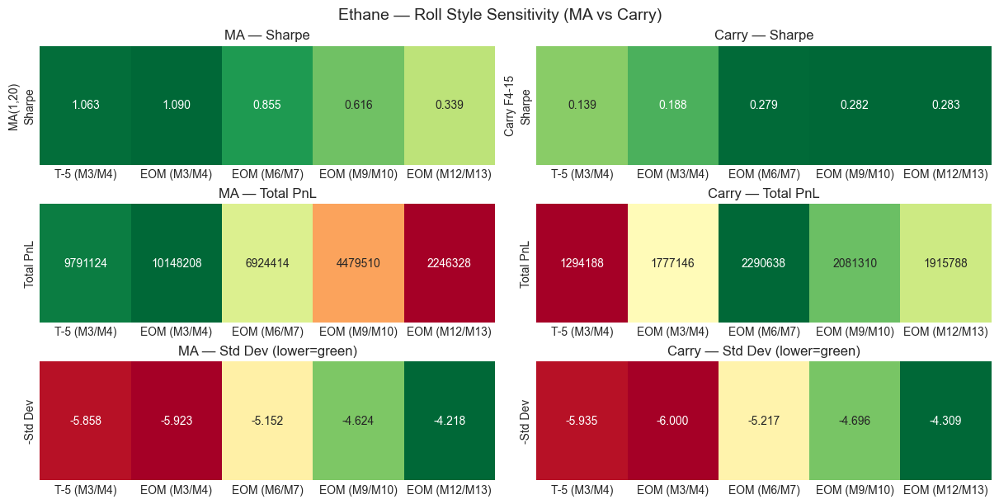

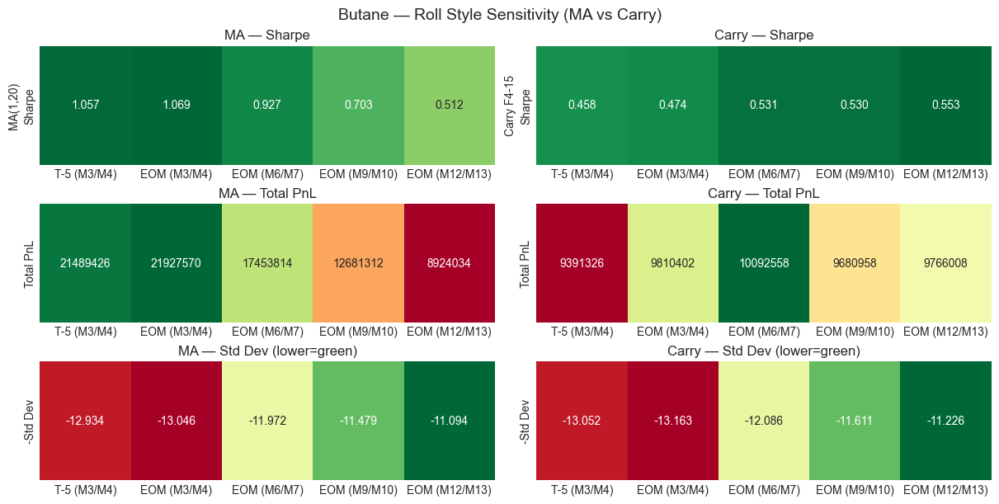

momentum() using t_cost = 0
Roll costs for Butane EOM (M12/M13)
0.0 0.0


In [4]:
# ---------------------------------------------------------------------
# NGLs Roll — Propane / Ethane / Butane + MA(20) + Carry F4-15
# + PARAMETER HEATMAPS (MA grid, Carry grid) per NGL
# ---------------------------------------------------------------------
ngl_names = ["Propane", "Ethane", "Butane"]

# strategy parameter grids
ma_params = [(1, 20), (1, 60), (1, 120), (1, 250), (20, 250)]
carry_pairs = [(2, 14), (3, 15), (4, 16), (5, 17), (6, 18)]

all_ngl_roll_metrics = []     # plain roll metrics (what you already had)
all_ngl_ma_metrics = []       # MA(20) per roll-style
all_ngl_carry_metrics = []    # F4-15 carry per roll-style

for commodity_name in ngl_names:
    ticker, contracts, units, t_cost = COMMODITIES[commodity_name]

    prices = load_prices(commodity_name, ticker)
    expiry_cal = load_expiry(ticker)

    # --- 1) T-5, M3/M4 -----------------------------------------------
    res_t5_m34 = rolling_pnl(
        prices,
        expiry_cal,
        front_col="F3",
        next_col="F4",
        roll_window=roll_window,
    )
    res_t5_m34 = roll_EL(res_t5_m34, prices, front_col="F3", t_cost=t_cost)

    # --- 2) EOM, M3/M4 -----------------------------------------------
    res_eom_m34 = roll_EOM_NGL(prices, expiry_cal, mid_col="F3", far_col="F4")
    res_eom_m34 = roll_EL(res_eom_m34, prices, front_col="F3", t_cost=t_cost)

    # --- 3) EOM, M6/M7 -----------------------------------------------
    res_eom_m67 = roll_EOM_NGL(prices, expiry_cal, mid_col="F6", far_col="F7")
    res_eom_m67 = roll_EL(res_eom_m67, prices, front_col="F6", t_cost=t_cost)

    # --- 4) EOM, M9/M10 ----------------------------------------------
    res_eom_m910 = roll_EOM_NGL(prices, expiry_cal, mid_col="F9", far_col="F10")
    res_eom_m910 = roll_EL(res_eom_m910, prices, front_col="F9", t_cost=t_cost)

    # --- 5) EOM, M12/M13 ---------------------------------------------
    res_eom_m1213 = roll_EOM_NGL(prices, expiry_cal, mid_col="F12", far_col="F13")
    res_eom_m1213 = roll_EL(res_eom_m1213, prices, front_col="F12", t_cost=t_cost)

    # --- bundle for plotting / downstream strategies -----------------
    results_for_ngl = {
        "T-5 (M3/M4)":   res_t5_m34,
        "EOM (M3/M4)":   res_eom_m34,
        "EOM (M6/M7)":   res_eom_m67,
        "EOM (M9/M10)":  res_eom_m910,
        "EOM (M12/M13)": res_eom_m1213,
    }

    # -----------------------------------------------------------------
    # 0. BASE ROLL CHART
    # -----------------------------------------------------------------
    fig, ax = plt.subplots(figsize=(11, 5))
    palette = sns.color_palette("tab10", len(results_for_ngl))

    for (label, df_res), color in zip(results_for_ngl.items(), palette):
        ax.plot(df_res.index, df_res["equity_line"], label=label, color=color)

    ax.set_title(f"{commodity_name} — NGL Roll Styles (Full Sample)")
    ax.legend(loc="best", ncol=2)
    ax.grid(True)
    plt.tight_layout()
    plt.show()

    # -----------------------------------------------------------------
    # BASE ROLL METRICS
    # -----------------------------------------------------------------
    for label, df_res in results_for_ngl.items():
        m = metrics(df_res, contracts=contracts, units=units)
        m["commodity"] = commodity_name
        m["style"] = label
        all_ngl_roll_metrics.append(m)

    # -----------------------------------------------------------------
    # 1. MA(20) ON TOP OF EACH ROLL VARIANT
    # -----------------------------------------------------------------
    ma_results_for_ngl = {}

    for label, rolled_df in results_for_ngl.items():
        df_ma = momentum(
            prices=prices,
            rolled_df=rolled_df,
            front_col="F3",
            short_ma=1,
            long_ma=20,
            t_cost=t_cost,
            epsilon=0.00,
        )
        ma_results_for_ngl[label] = df_ma

        m_ma = metrics(df_ma, contracts=contracts, units=units)
        m_ma["commodity"] = commodity_name
        m_ma["style"] = label
        m_ma["strategy"] = "MA(1,20)"
        all_ngl_ma_metrics.append(m_ma)

    fig, ax = plt.subplots(figsize=(11, 5))
    palette = sns.color_palette("tab10", len(ma_results_for_ngl))

    for (label, df_ma), color in zip(ma_results_for_ngl.items(), palette):
        ax.plot(df_ma.index, df_ma["equity_line"], label=label, color=color)

    ax.set_title(f"{commodity_name} — MA(1,20) with Different Roll Engines")
    ax.legend(loc="best", ncol=2)
    ax.grid(True)
    plt.tight_layout()
    plt.show()

    # -----------------------------------------------------------------
    # 2. CARRY F4–F15 ON TOP OF EACH ROLL VARIANT
    # -----------------------------------------------------------------
    carry_results_for_ngl = {}

    for label, rolled_df in results_for_ngl.items():
        if not {"F4", "F15"}.issubset(prices.columns):
            continue

        df_carry = carry(
            prices=prices,
            rolled_df=rolled_df,
            front_col="F4",
            end_col="F15",
            t_cost=t_cost,
            epsilon=0.00,
        )
        carry_results_for_ngl[label] = df_carry

        m_c = metrics(df_carry, contracts=contracts, units=units)
        m_c["commodity"] = commodity_name
        m_c["style"] = label
        m_c["strategy"] = "Carry F4-15"
        all_ngl_carry_metrics.append(m_c)

    if carry_results_for_ngl:
        fig, ax = plt.subplots(figsize=(11, 5))
        palette = sns.color_palette("tab10", len(carry_results_for_ngl))

        for (label, df_carry), color in zip(carry_results_for_ngl.items(), palette):
            ax.plot(df_carry.index, df_carry["equity_line"], label=label, color=color)

        ax.set_title(f"{commodity_name} — Carry F4–F15 with Different Roll Engines")
        ax.legend(loc="best", ncol=2)
        ax.grid(True)
        plt.tight_layout()
        plt.show()

    # -----------------------------------------------------------------
    # 3. PARAMETER HEATMAPS (same color scheme — RdYlGn)
    #    Momentum: 5 MA params × 5 roll styles
    #    Carry:    5 carry pairs × 5 roll styles
    # -----------------------------------------------------------------
    # momentum grid
    ma_sharpes = pd.DataFrame(
        index=[f"{s}/{l}" for (s, l) in ma_params],
        columns=list(results_for_ngl.keys()),
        dtype=float,
    )

    for roll_name, rolled_df in results_for_ngl.items():
        for (sma, lma) in ma_params:
            df_ma_param = momentum(
                prices=prices,
                rolled_df=rolled_df,
                front_col="F3",
                short_ma=sma,
                long_ma=lma,
                t_cost=t_cost,
                epsilon=0.00,
            )
            # simple sharpe from equity
            rets = df_ma_param["equity_line"].diff().dropna()
            if rets.std() and not np.isnan(rets.std()) and rets.std() != 0:
                sh = rets.mean() / rets.std() * np.sqrt(252)
            else:
                sh = np.nan
            ma_sharpes.loc[f"{sma}/{lma}", roll_name] = sh

    # carry grid
    carry_sharpes = pd.DataFrame(
        index=[f"F{f1}-F{f2}" for (f1, f2) in carry_pairs],
        columns=list(results_for_ngl.keys()),
        dtype=float,
    )

    for roll_name, rolled_df in results_for_ngl.items():
        for (f1, f2) in carry_pairs:
            c1, c2 = f"F{f1}", f"F{f2}"
            if c1 not in prices.columns or c2 not in prices.columns:
                continue
            df_c_param = carry(
                prices=prices,
                rolled_df=rolled_df,
                front_col=c1,
                end_col=c2,
                t_cost=t_cost,
                epsilon=0.00,
            )
            rets = df_c_param["equity_line"].diff().dropna()
            if rets.std() and not np.isnan(rets.std()) and rets.std() != 0:
                sh = rets.mean() / rets.std() * np.sqrt(252)
            else:
                sh = np.nan
            carry_sharpes.loc[f"F{f1}-F{f2}", roll_name] = sh

    # symmetric color range across both so green/red comparable
    all_vals = np.concatenate(
        [
            ma_sharpes.to_numpy().flatten(),
            carry_sharpes.to_numpy().flatten(),
        ]
    )
    all_vals = all_vals[~np.isnan(all_vals)]
    if len(all_vals):
        vlim = float(np.max(np.abs(all_vals)))
    else:
        vlim = 1.0

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(f"{commodity_name} — Parameter Heatmaps (Sharpe)", fontsize=13)

    # momentum heatmap
    sns.heatmap(
        ma_sharpes,
        ax=axes[0],
        annot=True,
        fmt=".2f",
        cmap="RdYlGn",
        center=0.0,
        vmin=-vlim,
        vmax=vlim,
        cbar=False,
        linewidths=0.5,
        linecolor="white",
    )
    axes[0].set_title("Momentum (MA params) vs Roll")
    axes[0].set_xlabel("Roll style")
    axes[0].set_ylabel("MA (short/long)")

    # carry heatmap
    sns.heatmap(
        carry_sharpes,
        ax=axes[1],
        annot=True,
        fmt=".2f",
        cmap="RdYlGn",
        center=0.0,
        vmin=-vlim,
        vmax=vlim,
        cbar=True,
        cbar_kws={"label": "Sharpe"},
        linewidths=0.5,
        linecolor="white",
    )
    axes[1].set_title("Carry (F2-14…F6-18) vs Roll")
    axes[1].set_xlabel("Roll style")
    axes[1].set_ylabel("Carry pair")

    plt.tight_layout()
    plt.show()

# ---------------------------------------------------------------------
# Combined metrics tables
# ---------------------------------------------------------------------
ngl_roll_metrics_df  = pd.DataFrame(all_ngl_roll_metrics).set_index(["commodity", "style"])
ngl_ma_metrics_df    = pd.DataFrame(all_ngl_ma_metrics).set_index(["commodity", "style", "strategy"])
ngl_carry_metrics_df = pd.DataFrame(all_ngl_carry_metrics).set_index(["commodity", "style", "strategy"])

display(ngl_roll_metrics_df)
display(ngl_ma_metrics_df)
display(ngl_carry_metrics_df)

# ---------------------------------------------------------------------
# ONE FIGURE PER NGL
# layout: 3 rows (Sharpe, Total PnL, StdDev) x 2 cols (MA, Carry)
# ---------------------------------------------------------------------
styles_order = ["T-5 (M3/M4)", "EOM (M3/M4)", "EOM (M6/M7)", "EOM (M9/M10)", "EOM (M12/M13)"]

for commodity_name in ngl_names:
    fig, axes = plt.subplots(
        nrows=3, ncols=2,
        figsize=(12, 6),
        constrained_layout=True
    )
    fig.suptitle(f"{commodity_name} — Roll Style Sensitivity (MA vs Carry)", fontsize=14)

    # -----------------------------------------------------------
    # MA(1,20) slice
    # -----------------------------------------------------------
    ma_base = ngl_ma_metrics_df.loc[(commodity_name, slice(None), "MA(1,20)")]
    ma_sharpe = ma_base["Sharpe"].reindex(styles_order)
    ma_pnl    = ma_base["Total PnL"].reindex(styles_order)
    ma_std    = ma_base["Std Dev (ann.)"].reindex(styles_order)

    # 1) MA Sharpe
    ax = axes[0, 0]
    ma_sharpe_df = pd.DataFrame(
        [ma_sharpe.values],
        index=["Sharpe"],
        columns=styles_order,
    )
    sns.heatmap(
        ma_sharpe_df,
        ax=ax,
        annot=True,
        fmt=".3f",
        cmap="RdYlGn",
        center=0.0,
        cbar=False,
    )
    ax.set_ylabel("MA(1,20)")
    ax.set_xlabel("")
    ax.set_title("MA — Sharpe")

    # 2) MA Total PnL
    ax = axes[1, 0]
    ma_pnl_df = pd.DataFrame(
        [ma_pnl.values],
        index=["Total PnL"],
        columns=styles_order,
    )
    vmin = ma_pnl_df.min().min()
    vmax = ma_pnl_df.max().max()
    sns.heatmap(
        ma_pnl_df,
        ax=ax,
        annot=True,
        fmt=".0f",
        cmap="RdYlGn",
        vmin=vmin,
        vmax=vmax,
        cbar=False,
    )
    ax.set_ylabel("")
    ax.set_xlabel("")
    ax.set_title("MA — Total PnL")

    # 3) MA Std Dev (lower is better → show negative)
    ax = axes[2, 0]
    ma_std_df = pd.DataFrame(
        [(-ma_std).values],
        index=["-Std Dev"],
        columns=styles_order,
    )
    sns.heatmap(
        ma_std_df,
        ax=ax,
        annot=True,
        fmt=".3f",
        cmap="RdYlGn",
        cbar=False,
    )
    ax.set_ylabel("")
    ax.set_xlabel("")
    ax.set_title("MA — Std Dev (lower=green)")

    # -----------------------------------------------------------
    # CARRY F4-15 slice (may be missing for some NGLs)
    # -----------------------------------------------------------
    has_carry = True
    try:
        carry_base = ngl_carry_metrics_df.loc[(commodity_name, slice(None), "Carry F4-15")]
    except KeyError:
        has_carry = False

    if has_carry:
        carry_sharpe = carry_base["Sharpe"].reindex(styles_order)
        carry_pnl    = carry_base["Total PnL"].reindex(styles_order)
        carry_std    = carry_base["Std Dev (ann.)"].reindex(styles_order)

        # 1) Carry Sharpe
        ax = axes[0, 1]
        carry_sharpe_df = pd.DataFrame(
            [carry_sharpe.values],
            index=["Sharpe"],
            columns=styles_order,
        )
        sns.heatmap(
            carry_sharpe_df,
            ax=ax,
            annot=True,
            fmt=".3f",
            cmap="RdYlGn",
            center=0.0,
            cbar=False,
        )
        ax.set_ylabel("Carry F4-15")
        ax.set_xlabel("")
        ax.set_title("Carry — Sharpe")

        # 2) Carry Total PnL
        ax = axes[1, 1]
        carry_pnl_df = pd.DataFrame(
            [carry_pnl.values],
            index=["Total PnL"],
            columns=styles_order,
        )
        vmin = carry_pnl_df.min().min()
        vmax = carry_pnl_df.max().max()
        sns.heatmap(
            carry_pnl_df,
            ax=ax,
            annot=True,
            fmt=".0f",
            cmap="RdYlGn",
            vmin=vmin,
            vmax=vmax,
            cbar=False,
        )
        ax.set_ylabel("")
        ax.set_xlabel("")
        ax.set_title("Carry — Total PnL")

        # 3) Carry Std Dev
        ax = axes[2, 1]
        carry_std_df = pd.DataFrame(
            [(-carry_std).values],
            index=["-Std Dev"],
            columns=styles_order,
        )
        sns.heatmap(
            carry_std_df,
            ax=ax,
            annot=True,
            fmt=".3f",
            cmap="RdYlGn",
            cbar=False,
        )
        ax.set_ylabel("")
        ax.set_xlabel("")
        ax.set_title("Carry — Std Dev (lower=green)")

    else:
        for r in range(3):
            axes[r, 1].axis("off")

    plt.show()


# T cost debug
print("momentum() using t_cost =", t_cost)
print("Roll costs for", commodity_name, label)
print(rolled_df["t_cost"].sum(), rolled_df["t_cost"].abs().max())




## WTI Roll

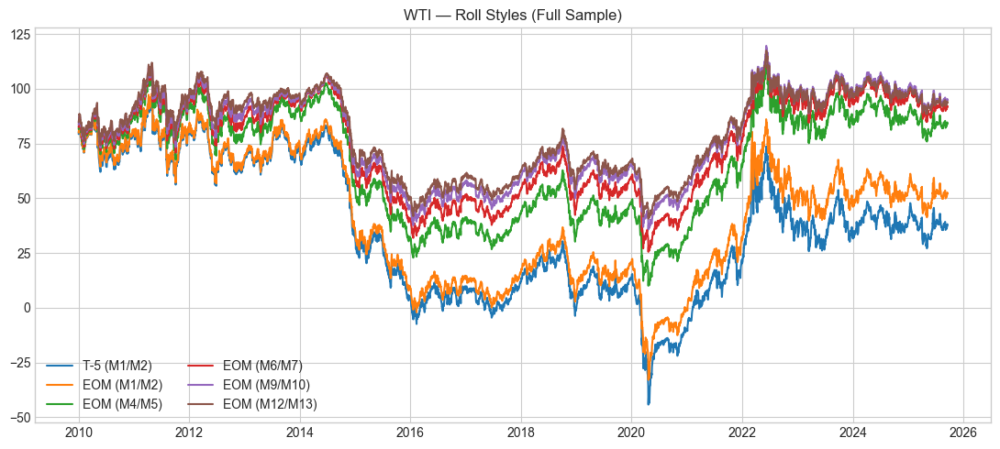

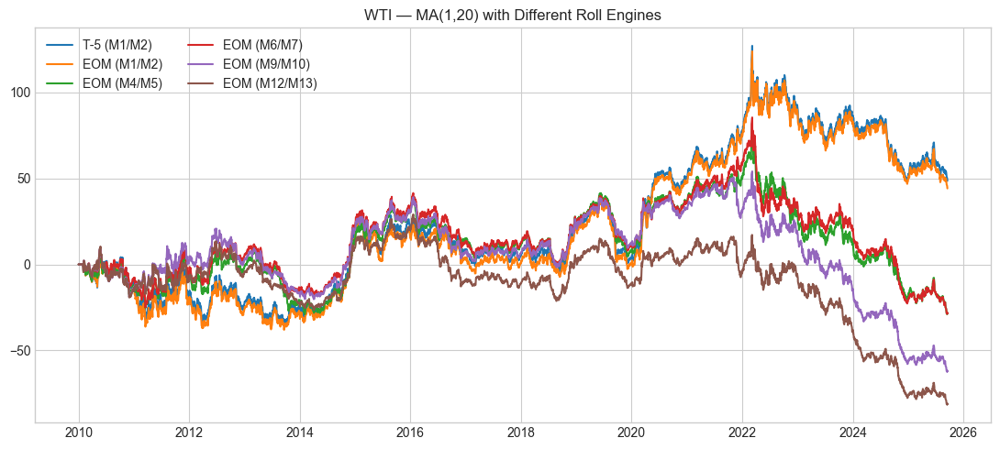

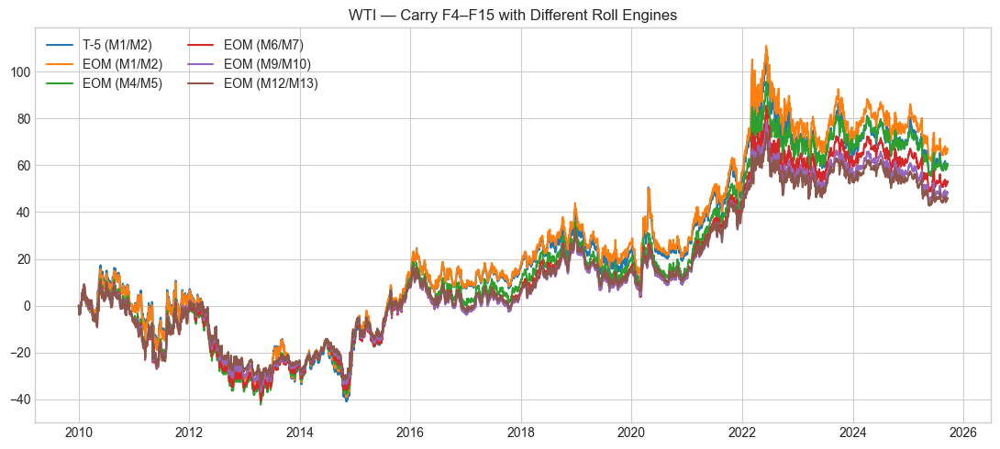

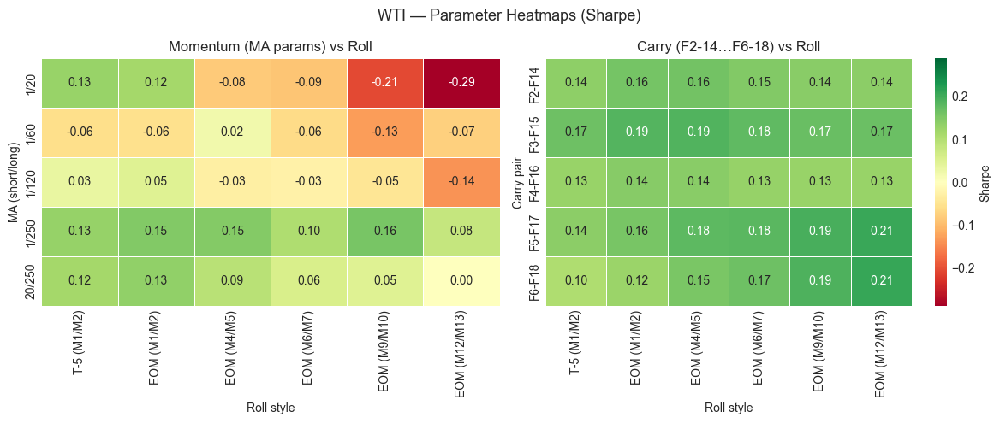

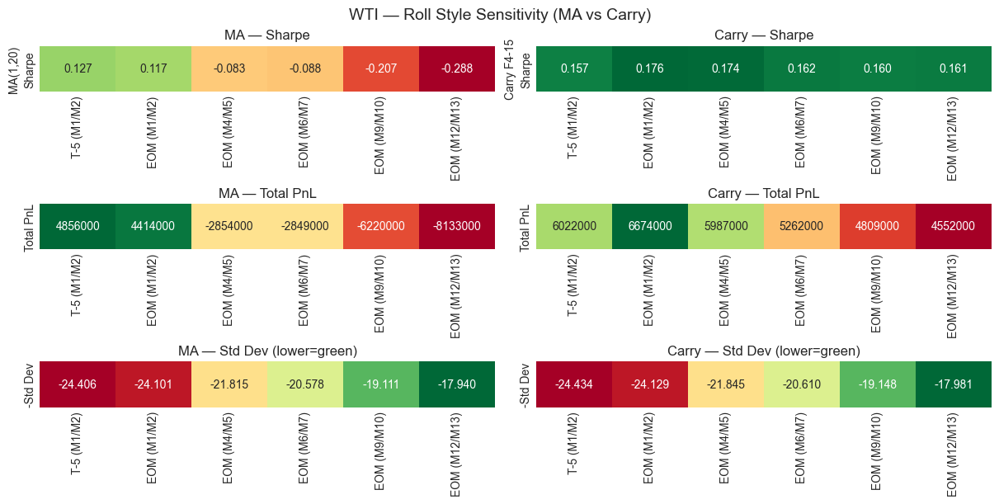

,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,,,,,,,,,
EOM (M1/M2),"-2,781,000.0000",-0.0000,-1.7690,-0.0205,24.1341,-0.0733,-1.1095,-1.5945,15.7205
EOM (M12/M13),"889,000.0000",-0.0000,0.5655,0.0054,17.9833,0.0314,-0.5601,1.0097,15.7205
EOM (M4/M5),"254,000.0000",-0.0000,0.1616,0.0016,21.8497,0.0074,-0.7742,0.2087,15.7205
EOM (M6/M7),"916,000.0000",-0.0000,0.5827,0.0056,20.6143,0.0283,-0.6627,0.8793,15.7205
EOM (M9/M10),"1,108,000.0000",-0.0000,0.7048,0.0067,19.1515,0.0368,-0.5906,1.1934,15.7205
T-5 (M1/M2),"-4,161,000.0000",-0.0000,-2.6469,-0.0336,24.4383,-0.1083,-1.2014,-2.2032,15.7205


,,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,strategy,,,,,,,,,
EOM (M1/M2),"MA(1,20)","4,414,000.0000",-0.0000,2.8078,0.0235,24.1012,0.1165,-0.4043,6.9444,15.7205
EOM (M12/M13),"MA(1,20)","-8,133,000.0000",-0.0000,-5.1735,-0.1013,17.9400,-0.2884,-0.8564,-6.0410,15.7205
EOM (M4/M5),"MA(1,20)","-2,854,000.0000",-0.0000,-1.8155,-0.0211,21.8146,-0.0832,-0.6098,-2.9772,15.7205
EOM (M6/M7),"MA(1,20)","-2,849,000.0000",-0.0000,-1.8123,-0.0211,20.5777,-0.0881,-0.6157,-2.9432,15.7205
EOM (M9/M10),"MA(1,20)","-6,220,000.0000",-0.0000,-3.9566,-0.0600,19.1109,-0.2070,-0.7559,-5.2344,15.7205
T-5 (M1/M2),"MA(1,20)","4,856,000.0000",-0.0000,3.0890,0.0255,24.4060,0.1266,-0.3895,7.9299,15.7205


,,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,strategy,,,,,,,,,
EOM (M1/M2),Carry F4-15,"6,674,000.0000",-0.0000,4.2454,0.0331,24.1290,0.1759,-0.4724,8.9870,15.7205
EOM (M12/M13),Carry F4-15,"4,552,000.0000",-0.0000,2.8956,0.0242,17.9807,0.1610,-0.4022,7.1998,15.7205
EOM (M4/M5),Carry F4-15,"5,987,000.0000",-0.0000,3.8084,0.0303,21.8451,0.1743,-0.4818,7.9038,15.7205
EOM (M6/M7),Carry F4-15,"5,262,000.0000",-0.0000,3.3472,0.0273,20.6105,0.1624,-0.4636,7.2206,15.7205
EOM (M9/M10),Carry F4-15,"4,809,000.0000",-0.0000,3.0591,0.0253,19.1485,0.1598,-0.4285,7.1393,15.7205
T-5 (M1/M2),Carry F4-15,"6,022,000.0000",-0.0000,3.8307,0.0304,24.4338,0.1568,-0.4954,7.7332,15.7205


In [5]:
# ---------------------------------------------------------------------
# WTI Roll — T-5 M1/M2 + EOM M1/M2 + EOM M4/M5 + EOM M6/M7 + EOM M9/M10 + EOM M12/M13
# + MA / Carry parameter heatmaps (WTI-specific)
# ---------------------------------------------------------------------
commodity_name = "WTI"
ticker, contracts, units, t_cost = COMMODITIES[commodity_name]

prices = load_prices(commodity_name, ticker)
expiry_cal = load_expiry(ticker)

# WTI-specific collectors (do NOT touch NGL ones)
wti_roll_metrics_list  = []
wti_ma_metrics_list    = []
wti_carry_metrics_list = []

# --- 1) T-5, M1/M2 ---------------------------------------------------
wti_res_t5_m12 = rolling_pnl(
    prices,
    expiry_cal,
    front_col="F1",
    next_col="F2",
    roll_window=roll_window,
)
wti_res_t5_m12 = roll_EL(wti_res_t5_m12, prices, front_col="F1", t_cost=t_cost)

# --- 2) EOM midmonth, M1/M2 ------------------------------------------
wti_res_eom_m12 = roll_EOM_midmonth_expiry(
    prices,
    expiry_cal,
    front_col="F1",
    next_col="F2",
)
wti_res_eom_m12 = roll_EL(wti_res_eom_m12, prices, front_col="F1", t_cost=t_cost)

# --- 3) EOM midmonth, M4/M5 ------------------------------------------
wti_res_eom_m45 = roll_EOM_midmonth_expiry(
    prices,
    expiry_cal,
    front_col="F4",
    next_col="F5",
)
wti_res_eom_m45 = roll_EL(wti_res_eom_m45, prices, front_col="F4", t_cost=t_cost)

# --- 4) EOM midmonth, M6/M7 ------------------------------------------
wti_res_eom_m67 = roll_EOM_midmonth_expiry(
    prices,
    expiry_cal,
    front_col="F6",
    next_col="F7",
)
wti_res_eom_m67 = roll_EL(wti_res_eom_m67, prices, front_col="F6", t_cost=t_cost)

# --- 5) EOM midmonth, M9/M10 -----------------------------------------
wti_res_eom_m910 = roll_EOM_midmonth_expiry(
    prices,
    expiry_cal,
    front_col="F9",
    next_col="F10",
)
wti_res_eom_m910 = roll_EL(wti_res_eom_m910, prices, front_col="F9", t_cost=t_cost)

# --- 6) EOM midmonth, M12/M13 ----------------------------------------
wti_res_eom_m1213 = roll_EOM_midmonth_expiry(
    prices,
    expiry_cal,
    front_col="F12",
    next_col="F13",
)
wti_res_eom_m1213 = roll_EL(wti_res_eom_m1213, prices, front_col="F12", t_cost=t_cost)

# --- bundle for plotting / downstream strategies ---------------------
wti_roll_results = {
    "T-5 (M1/M2)":    wti_res_t5_m12,
    "EOM (M1/M2)":    wti_res_eom_m12,
    "EOM (M4/M5)":    wti_res_eom_m45,
    "EOM (M6/M7)":    wti_res_eom_m67,
    "EOM (M9/M10)":   wti_res_eom_m910,
    "EOM (M12/M13)":  wti_res_eom_m1213,
}

# keep front cols per style
wti_style_front_cols = {
    "T-5 (M1/M2)":   "F1",
    "EOM (M1/M2)":   "F1",
    "EOM (M4/M5)":   "F4",
    "EOM (M6/M7)":   "F6",
    "EOM (M9/M10)":  "F9",
    "EOM (M12/M13)": "F12",
}
wti_styles_order = list(wti_roll_results.keys())

# ---------------------------------------------------------------------
# 0. BASE ROLL CHART
# ---------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(11, 5))
palette = sns.color_palette("tab10", len(wti_roll_results))

for (label, df_res), color in zip(wti_roll_results.items(), palette):
    ax.plot(df_res.index, df_res["equity_line"], label=label, color=color)

ax.set_title("WTI — Roll Styles (Full Sample)")
ax.legend(loc="best", ncol=2)
ax.grid(True)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------
# BASE ROLL METRICS (WTI-only)
# ---------------------------------------------------------------------
for label, df_res in wti_roll_results.items():
    m = metrics(df_res, contracts=contracts, units=units)
    m["commodity"] = commodity_name
    m["style"] = label
    wti_roll_metrics_list.append(m)

# ---------------------------------------------------------------------
# 1. MA(1,20) ON TOP OF EACH ROLL VARIANT
# ---------------------------------------------------------------------
wti_ma_results = {}

for label, rolled_df in wti_roll_results.items():
    front_col_for_style = wti_style_front_cols[label]

    df_ma = momentum(
        prices=prices,
        rolled_df=rolled_df,
        front_col=front_col_for_style,
        short_ma=1,
        long_ma=20,
        t_cost=t_cost,
        epsilon=0.00,
    )
    wti_ma_results[label] = df_ma

    m_ma = metrics(df_ma, contracts=contracts, units=units)
    m_ma["commodity"] = commodity_name
    m_ma["style"] = label
    m_ma["strategy"] = "MA(1,20)"
    wti_ma_metrics_list.append(m_ma)

fig, ax = plt.subplots(figsize=(11, 5))
palette = sns.color_palette("tab10", len(wti_ma_results))

for (label, df_ma), color in zip(wti_ma_results.items(), palette):
    ax.plot(df_ma.index, df_ma["equity_line"], label=label, color=color)

ax.set_title("WTI — MA(1,20) with Different Roll Engines")
ax.legend(loc="best", ncol=2)
ax.grid(True)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------
# 2. CARRY F4–F15 ON TOP OF EACH ROLL VARIANT
# ---------------------------------------------------------------------
wti_carry_results = {}

for label, rolled_df in wti_roll_results.items():
    if not {"F4", "F15"}.issubset(prices.columns):
        continue

    df_carry = carry(
        prices=prices,
        rolled_df=rolled_df,
        front_col="F4",
        end_col="F15",
        t_cost=t_cost,
        epsilon=0.00,
    )
    wti_carry_results[label] = df_carry

    m_c = metrics(df_carry, contracts=contracts, units=units)
    m_c["commodity"] = commodity_name
    m_c["style"] = label
    m_c["strategy"] = "Carry F4-15"
    wti_carry_metrics_list.append(m_c)

if wti_carry_results:
    fig, ax = plt.subplots(figsize=(11, 5))
    palette = sns.color_palette("tab10", len(wti_carry_results))

    for (label, df_carry), color in zip(wti_carry_results.items(), palette):
        ax.plot(df_carry.index, df_carry["equity_line"], label=label, color=color)

    ax.set_title("WTI — Carry F4–F15 with Different Roll Engines")
    ax.legend(loc="best", ncol=2)
    ax.grid(True)
    plt.tight_layout()
    plt.show()

# ---------------------------------------------------------------------
# 3. PARAMETER HEATMAPS (MA grid, Carry grid) — WTI-specific
# ---------------------------------------------------------------------
wti_ma_sharpes = pd.DataFrame(
    index=[f"{s}/{l}" for (s, l) in ma_params],
    columns=wti_styles_order,
    dtype=float,
)

for roll_name, rolled_df in wti_roll_results.items():
    front_col_for_style = wti_style_front_cols[roll_name]
    for (sma, lma) in ma_params:
        df_ma_param = momentum(
            prices=prices,
            rolled_df=rolled_df,
            front_col=front_col_for_style,
            short_ma=sma,
            long_ma=lma,
            t_cost=t_cost,
            epsilon=0.00,
        )
        rets = df_ma_param["equity_line"].diff().dropna()
        if rets.std() and not np.isnan(rets.std()) and rets.std() != 0:
            sh = rets.mean() / rets.std() * np.sqrt(252)
        else:
            sh = np.nan
        wti_ma_sharpes.loc[f"{sma}/{lma}", roll_name] = sh

wti_carry_sharpes = pd.DataFrame(
    index=[f"F{f1}-F{f2}" for (f1, f2) in carry_pairs],
    columns=wti_styles_order,
    dtype=float,
)

for roll_name, rolled_df in wti_roll_results.items():
    for (f1, f2) in carry_pairs:
        c1, c2 = f"F{f1}", f"F{f2}"
        if c1 not in prices.columns or c2 not in prices.columns:
            continue

        df_c_param = carry(
            prices=prices,
            rolled_df=rolled_df,
            front_col=c1,
            end_col=c2,
            t_cost=t_cost,
            epsilon=0.00,
        )
        rets = df_c_param["equity_line"].diff().dropna()
        if rets.std() and not np.isnan(rets.std()) and rets.std() != 0:
            sh = rets.mean() / rets.std() * np.sqrt(252)
        else:
            sh = np.nan
        wti_carry_sharpes.loc[f"F{f1}-F{f2}", roll_name] = sh

# symmetric color
all_vals = np.concatenate(
    [
        wti_ma_sharpes.to_numpy().flatten(),
        wti_carry_sharpes.to_numpy().flatten(),
    ]
)
all_vals = all_vals[~np.isnan(all_vals)]
vlim = float(np.max(np.abs(all_vals))) if len(all_vals) else 1.0

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle("WTI — Parameter Heatmaps (Sharpe)", fontsize=13)

sns.heatmap(
    wti_ma_sharpes,
    ax=axes[0],
    annot=True,
    fmt=".2f",
    cmap="RdYlGn",
    center=0.0,
    vmin=-vlim,
    vmax=vlim,
    cbar=False,
    linewidths=0.5,
    linecolor="white",
)
axes[0].set_title("Momentum (MA params) vs Roll")
axes[0].set_xlabel("Roll style")
axes[0].set_ylabel("MA (short/long)")

sns.heatmap(
    wti_carry_sharpes,
    ax=axes[1],
    annot=True,
    fmt=".2f",
    cmap="RdYlGn",
    center=0.0,
    vmin=-vlim,
    vmax=vlim,
    cbar=True,
    cbar_kws={"label": "Sharpe"},
    linewidths=0.5,
    linecolor="white",
)
axes[1].set_title("Carry (F2-14…F6-18) vs Roll")
axes[1].set_xlabel("Roll style")
axes[1].set_ylabel("Carry pair")

plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------
# WTI — Roll Style Sensitivity (MA vs Carry)
# ---------------------------------------------------------------------
wti_styles_order = [
    "T-5 (M1/M2)",
    "EOM (M1/M2)",
    "EOM (M4/M5)",
    "EOM (M6/M7)",
    "EOM (M9/M10)",
    "EOM (M12/M13)",
]

# build dfs from WTI-only lists
wti_roll_df  = pd.DataFrame(wti_roll_metrics_list).set_index(["commodity", "style"])
wti_ma_df    = pd.DataFrame(wti_ma_metrics_list).set_index(["commodity", "style", "strategy"])
if wti_carry_metrics_list:
    wti_carry_df = pd.DataFrame(wti_carry_metrics_list).set_index(["commodity", "style", "strategy"])
else:
    wti_carry_df = pd.DataFrame()

fig, axes = plt.subplots(
    nrows=3, ncols=2,
    figsize=(12, 6),
    constrained_layout=True
)
fig.suptitle("WTI — Roll Style Sensitivity (MA vs Carry)", fontsize=14)

# MA slice
wti_ma_base   = wti_ma_df.loc[("WTI", slice(None), "MA(1,20)")]
wti_ma_sharpe = wti_ma_base["Sharpe"].reindex(wti_styles_order)
wti_ma_pnl    = wti_ma_base["Total PnL"].reindex(wti_styles_order)
wti_ma_std    = wti_ma_base["Std Dev (ann.)"].reindex(wti_styles_order)

# MA — Sharpe
ax = axes[0, 0]
ma_sharpe_df = pd.DataFrame(
    [wti_ma_sharpe.values],
    index=["Sharpe"],
    columns=wti_styles_order,
)
sns.heatmap(
    ma_sharpe_df,
    ax=ax,
    annot=True,
    fmt=".3f",
    cmap="RdYlGn",
    center=0.0,
    cbar=False,
)
ax.set_ylabel("MA(1,20)")
ax.set_xlabel("")
ax.set_title("MA — Sharpe")

# MA — Total PnL
ax = axes[1, 0]
ma_pnl_df = pd.DataFrame(
    [wti_ma_pnl.values],
    index=["Total PnL"],
    columns=wti_styles_order,
)
vmin = ma_pnl_df.min().min()
vmax = ma_pnl_df.max().max()
sns.heatmap(
    ma_pnl_df,
    ax=ax,
    annot=True,
    fmt=".0f",
    cmap="RdYlGn",
    vmin=vmin,
    vmax=vmax,
    cbar=False,
)
ax.set_ylabel("")
ax.set_xlabel("")
ax.set_title("MA — Total PnL")

# MA — Std Dev (lower=green)
ax = axes[2, 0]
ma_std_df = pd.DataFrame(
    [(-wti_ma_std).values],
    index=["-Std Dev"],
    columns=wti_styles_order,
)
sns.heatmap(
    ma_std_df,
    ax=ax,
    annot=True,
    fmt=".3f",
    cmap="RdYlGn",
    cbar=False,
)
ax.set_ylabel("")
ax.set_xlabel("")
ax.set_title("MA — Std Dev (lower=green)")

# Carry slice (if any)
has_carry = not wti_carry_df.empty
if has_carry:
    wti_carry_base = wti_carry_df.loc[("WTI", slice(None), "Carry F4-15")]
    wti_carry_sharpe = wti_carry_base["Sharpe"].reindex(wti_styles_order)
    wti_carry_pnl    = wti_carry_base["Total PnL"].reindex(wti_styles_order)
    wti_carry_std    = wti_carry_base["Std Dev (ann.)"].reindex(wti_styles_order)

    # Carry — Sharpe
    ax = axes[0, 1]
    carry_sharpe_df = pd.DataFrame(
        [wti_carry_sharpe.values],
        index=["Sharpe"],
        columns=wti_styles_order,
    )
    sns.heatmap(
        carry_sharpe_df,
        ax=ax,
        annot=True,
        fmt=".3f",
        cmap="RdYlGn",
        center=0.0,
        cbar=False,
    )
    ax.set_ylabel("Carry F4-15")
    ax.set_xlabel("")
    ax.set_title("Carry — Sharpe")

    # Carry — Total PnL
    ax = axes[1, 1]
    carry_pnl_df = pd.DataFrame(
        [wti_carry_pnl.values],
        index=["Total PnL"],
        columns=wti_styles_order,
    )
    vmin = carry_pnl_df.min().min()
    vmax = carry_pnl_df.max().max()
    sns.heatmap(
        carry_pnl_df,
        ax=ax,
        annot=True,
        fmt=".0f",
        cmap="RdYlGn",
        vmin=vmin,
        vmax=vmax,
        cbar=False,
    )
    ax.set_ylabel("")
    ax.set_xlabel("")
    ax.set_title("Carry — Total PnL")

    # Carry — Std Dev
    ax = axes[2, 1]
    carry_std_df = pd.DataFrame(
        [(-wti_carry_std).values],
        index=["-Std Dev"],
        columns=wti_styles_order,
    )
    sns.heatmap(
        carry_std_df,
        ax=ax,
        annot=True,
        fmt=".3f",
        cmap="RdYlGn",
        cbar=False,
    )
    ax.set_ylabel("")
    ax.set_xlabel("")
    ax.set_title("Carry — Std Dev (lower=green)")
else:
    for r in range(3):
        axes[r, 1].axis("off")

plt.show()

# ---------------------------------------------------------------------
# FINAL: WTI-only metrics tables
# ---------------------------------------------------------------------
wti_roll_metrics_df  = wti_roll_df.loc["WTI"].sort_index()
wti_ma_metrics_df    = wti_ma_df.loc[("WTI", slice(None), slice(None))].sort_index()
try:
    wti_carry_metrics_df = wti_carry_df.loc[("WTI", slice(None), slice(None))].sort_index()
except KeyError:
    wti_carry_metrics_df = pd.DataFrame()

display(wti_roll_metrics_df)
display(wti_ma_metrics_df)
display(wti_carry_metrics_df)


## Brent Roll

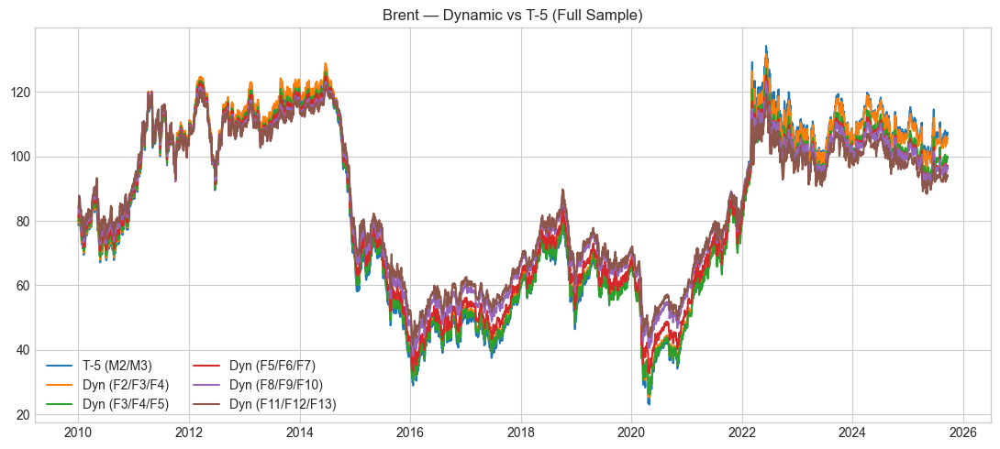

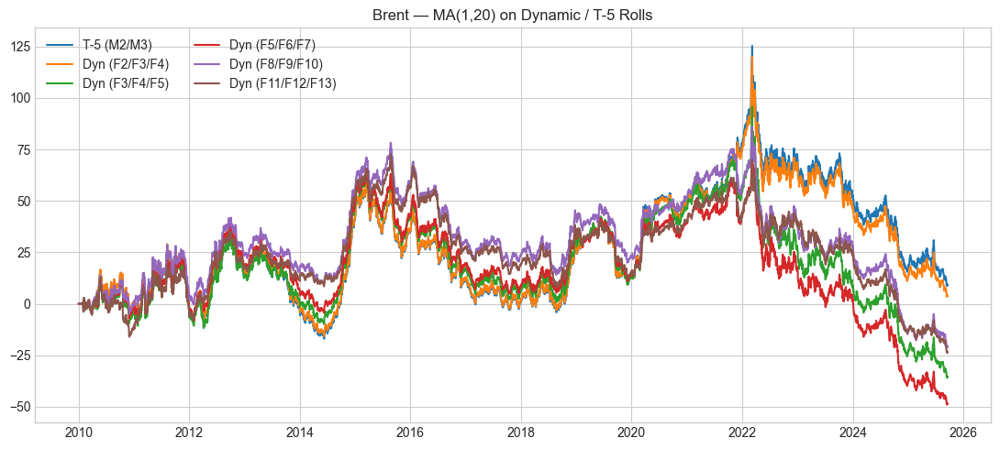

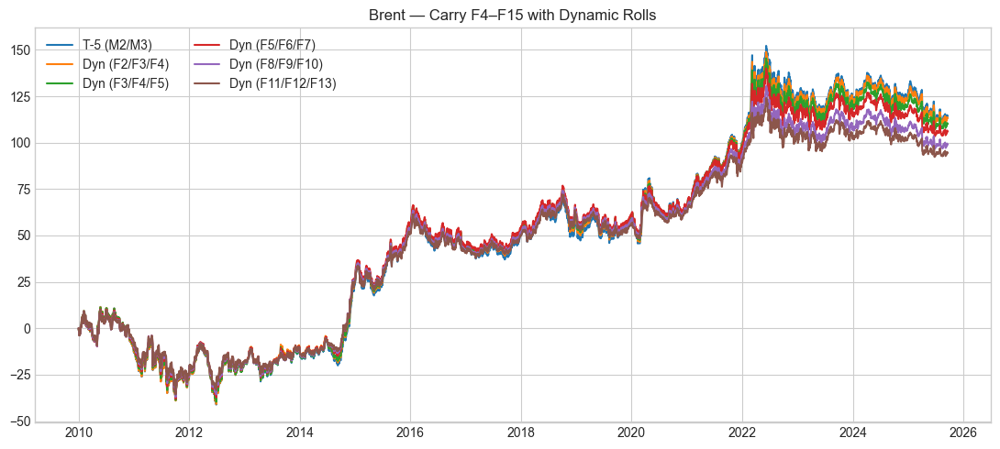

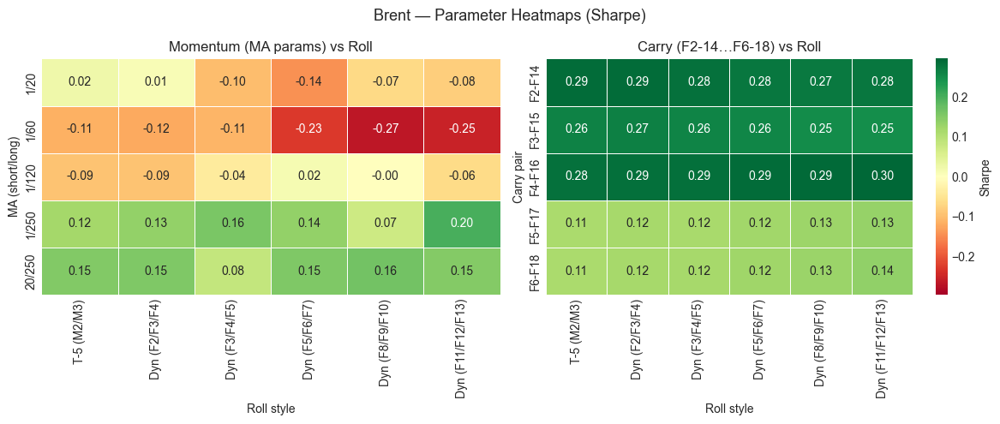

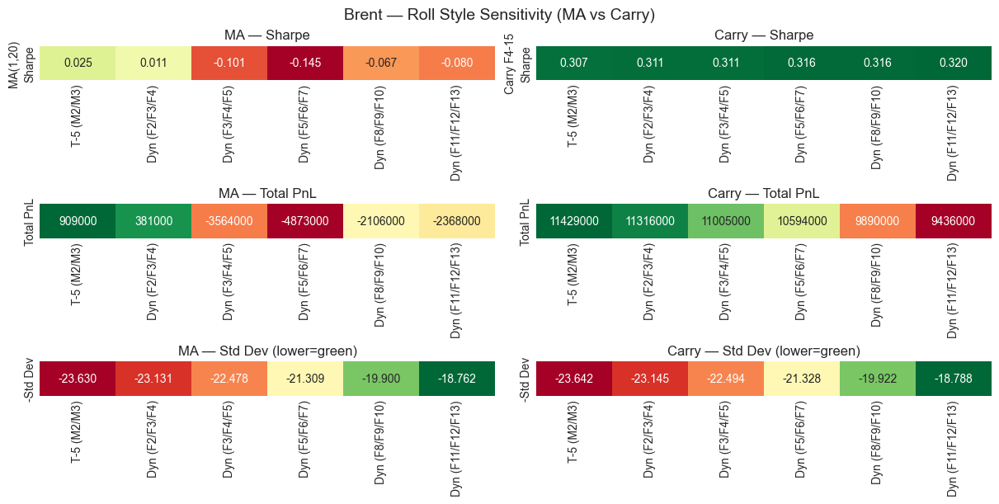

,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,,,,,,,,,
Dyn (F11/F12/F13),"975,000.0000",-0.0000,0.6202,0.0059,18.7991,0.0330,-0.5831,1.0637,15.7205
Dyn (F2/F3/F4),"2,593,000.0000",-0.0000,1.6494,0.0148,23.1618,0.0712,-0.6934,2.3789,15.7205
Dyn (F3/F4/F5),"1,945,000.0000",-0.0000,1.2372,0.0114,22.5097,0.0550,-0.6851,1.8060,15.7205
Dyn (F5/F6/F7),"1,562,000.0000",-0.0000,0.9936,0.0093,21.3420,0.0466,-0.6407,1.5509,15.7205
Dyn (F8/F9/F10),"1,368,000.0000",-0.0000,0.8702,0.0082,19.9341,0.0437,-0.6037,1.4415,15.7205
T-5 (M2/M3),"2,828,000.0000",-0.0000,1.7989,0.0160,23.6599,0.0760,-0.7015,2.5644,15.7205


,,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,strategy,,,,,,,,,
Dyn (F11/F12/F13),"MA(1,20)","-2,368,000.0000",-0.0000,-1.5063,-0.0170,18.7624,-0.0803,-0.5582,-2.6987,15.7205
Dyn (F2/F3/F4),"MA(1,20)","381,000.0000",-0.0000,0.2424,0.0024,23.1309,0.0105,-0.5299,0.4574,15.7205
Dyn (F3/F4/F5),"MA(1,20)","-3,564,000.0000",-0.0000,-2.2671,-0.0276,22.4778,-0.1009,-0.6729,-3.3692,15.7205
Dyn (F5/F6/F7),"MA(1,20)","-4,873,000.0000",-0.0000,-3.0998,-0.0416,21.3088,-0.1455,-0.7125,-4.3507,15.7205
Dyn (F8/F9/F10),"MA(1,20)","-2,106,000.0000",-0.0000,-1.3396,-0.0149,19.8997,-0.0673,-0.5770,-2.3218,15.7205
T-5 (M2/M3),"MA(1,20)","909,000.0000",-0.0000,0.5782,0.0055,23.6295,0.0245,-0.5178,1.1167,15.7205


,,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,strategy,,,,,,,,,
Dyn (F11/F12/F13),Carry F4-15,"9,436,000.0000",-0.0000,6.0023,0.0432,18.7881,0.3195,-0.4147,14.4744,15.7205
Dyn (F2/F3/F4),Carry F4-15,"11,316,000.0000",-0.0000,7.1982,0.0493,23.1454,0.3110,-0.4693,15.3377,15.7205
Dyn (F3/F4/F5),Carry F4-15,"11,005,000.0000",-0.0000,7.0004,0.0483,22.4942,0.3112,-0.4566,15.3316,15.7205
Dyn (F5/F6/F7),Carry F4-15,"10,594,000.0000",-0.0000,6.7390,0.0470,21.3281,0.3160,-0.4384,15.3721,15.7205
Dyn (F8/F9/F10),Carry F4-15,"9,890,000.0000",-0.0000,6.2911,0.0447,19.9221,0.3158,-0.4265,14.7492,15.7205
T-5 (M2/M3),Carry F4-15,"11,429,000.0000",-0.0000,7.2701,0.0497,23.6425,0.3075,-0.4722,15.3962,15.7205


In [6]:
# ---------------------------------------------------------------------
# Brent Roll — T-5 M2/M3 + Dynamic 2-3-4 + Dynamic 3-4-5 + Dynamic 5-6-7
#                 + Dynamic 8-9-10 + Dynamic 11-12-13
# + MA / Carry parameter heatmaps (Brent-specific)
# ---------------------------------------------------------------------
commodity_name = "Brent"
ticker, contracts, units, t_cost = COMMODITIES[commodity_name]

prices = load_prices(commodity_name, ticker)      # already clipped to 2010-01-04
expiry_cal = load_expiry(ticker)

# Brent-only collectors (don’t touch NGL or WTI lists)
brent_roll_metrics_list  = []
brent_ma_metrics_list    = []
brent_carry_metrics_list = []

# --- 1) T-5, M2/M3 (baseline) ---------------------------------------
brent_res_t5_m23 = rolling_pnl(
    prices,
    expiry_cal,
    front_col="F2",
    next_col="F3",
    roll_window=roll_window,
)
brent_res_t5_m23 = roll_EL(brent_res_t5_m23, prices, front_col="F2", t_cost=t_cost)

# --- 2) Dynamic 2-3-4 (was 1-2-3, moved up one) ---------------------
brent_res_dyn_234 = roll_EOM_dynamic_brent(
    prices,
    expiry_cal,
    front_col="F2",
    next_col="F3",
    third_col="F4",
)
brent_res_dyn_234 = roll_EL(brent_res_dyn_234, prices, front_col="F2", t_cost=t_cost)

# --- 3) Dynamic 3-4-5 ------------------------------------------------
brent_res_dyn_345 = roll_EOM_dynamic_brent(
    prices,
    expiry_cal,
    front_col="F3",
    next_col="F4",
    third_col="F5",
)
brent_res_dyn_345 = roll_EL(brent_res_dyn_345, prices, front_col="F3", t_cost=t_cost)

# --- 4) Dynamic 5-6-7 ------------------------------------------------
brent_res_dyn_567 = roll_EOM_dynamic_brent(
    prices,
    expiry_cal,
    front_col="F5",
    next_col="F6",
    third_col="F7",
)
brent_res_dyn_567 = roll_EL(brent_res_dyn_567, prices, front_col="F5", t_cost=t_cost)

# --- 5) Dynamic 8-9-10 ----------------------------------------------
brent_res_dyn_8910 = roll_EOM_dynamic_brent(
    prices,
    expiry_cal,
    front_col="F8",
    next_col="F9",
    third_col="F10",
)
brent_res_dyn_8910 = roll_EL(brent_res_dyn_8910, prices, front_col="F8", t_cost=t_cost)

# --- 6) Dynamic 11-12-13 --------------------------------------------
brent_res_dyn_111213 = roll_EOM_dynamic_brent(
    prices,
    expiry_cal,
    front_col="F11",
    next_col="F12",
    third_col="F13",
)
brent_res_dyn_111213 = roll_EL(brent_res_dyn_111213, prices, front_col="F11", t_cost=t_cost)

# --- bundle for plotting / downstream strategies --------------------
brent_roll_results = {
    "T-5 (M2/M3)":        brent_res_t5_m23,
    "Dyn (F2/F3/F4)":     brent_res_dyn_234,
    "Dyn (F3/F4/F5)":     brent_res_dyn_345,
    "Dyn (F5/F6/F7)":     brent_res_dyn_567,
    "Dyn (F8/F9/F10)":    brent_res_dyn_8910,
    "Dyn (F11/F12/F13)":  brent_res_dyn_111213,
}

# tell MA which front leg to use per style
brent_style_front_cols = {
    "T-5 (M2/M3)":       "F2",
    "Dyn (F2/F3/F4)":    "F2",
    "Dyn (F3/F4/F5)":    "F3",
    "Dyn (F5/F6/F7)":    "F5",
    "Dyn (F8/F9/F10)":   "F8",
    "Dyn (F11/F12/F13)": "F11",
}
brent_styles_order = list(brent_roll_results.keys())

# ---------------------------------------------------------------------
# 0. BASE ROLL CHART
# ---------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(11, 5))
palette = sns.color_palette("tab10", len(brent_roll_results))

for (label, df_res), color in zip(brent_roll_results.items(), palette):
    ax.plot(df_res.index, df_res["equity_line"], label=label, color=color)

ax.set_title("Brent — Dynamic vs T-5 (Full Sample)")
ax.legend(loc="best", ncol=2)
ax.grid(True)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------
# BASE ROLL METRICS (Brent-only)
# ---------------------------------------------------------------------
for label, df_res in brent_roll_results.items():
    m = metrics(df_res, contracts=contracts, units=units)
    m["commodity"] = commodity_name
    m["style"] = label
    brent_roll_metrics_list.append(m)

# ---------------------------------------------------------------------
# 1. MA(1,20) ON TOP OF EACH ROLL VARIANT
# ---------------------------------------------------------------------
brent_ma_results = {}

for label, rolled_df in brent_roll_results.items():
    front_col_for_style = brent_style_front_cols[label]

    df_ma = momentum(
        prices=prices,
        rolled_df=rolled_df,
        front_col=front_col_for_style,
        short_ma=1,
        long_ma=20,
        t_cost=t_cost,
        epsilon=0.00,
    )
    brent_ma_results[label] = df_ma

    m_ma = metrics(df_ma, contracts=contracts, units=units)
    m_ma["commodity"] = commodity_name
    m_ma["style"] = label
    m_ma["strategy"] = "MA(1,20)"
    brent_ma_metrics_list.append(m_ma)

fig, ax = plt.subplots(figsize=(11, 5))
palette = sns.color_palette("tab10", len(brent_ma_results))

for (label, df_ma), color in zip(brent_ma_results.items(), palette):
    ax.plot(df_ma.index, df_ma["equity_line"], label=label, color=color)

ax.set_title("Brent — MA(1,20) on Dynamic / T-5 Rolls")
ax.legend(loc="best", ncol=2)
ax.grid(True)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------
# 2. CARRY F4–F15 ON TOP OF EACH ROLL VARIANT
# ---------------------------------------------------------------------
brent_carry_results = {}

for label, rolled_df in brent_roll_results.items():
    if not {"F4", "F15"}.issubset(prices.columns):
        continue

    df_carry = carry(
        prices=prices,
        rolled_df=rolled_df,
        front_col="F4",    # same convention as WTI
        end_col="F15",
        t_cost=t_cost,
        epsilon=0.00,
    )
    brent_carry_results[label] = df_carry

    m_c = metrics(df_carry, contracts=contracts, units=units)
    m_c["commodity"] = commodity_name
    m_c["style"] = label
    m_c["strategy"] = "Carry F4-15"
    brent_carry_metrics_list.append(m_c)

if brent_carry_results:
    fig, ax = plt.subplots(figsize=(11, 5))
    palette = sns.color_palette("tab10", len(brent_carry_results))

    for (label, df_carry), color in zip(brent_carry_results.items(), palette):
        ax.plot(df_carry.index, df_carry["equity_line"], label=label, color=color)

    ax.set_title("Brent — Carry F4–F15 with Dynamic Rolls")
    ax.legend(loc="best", ncol=2)
    ax.grid(True)
    plt.tight_layout()
    plt.show()

# ---------------------------------------------------------------------
# 3. PARAMETER HEATMAPS (MA grid, Carry grid) — Brent-specific
# ---------------------------------------------------------------------
brent_ma_sharpes = pd.DataFrame(
    index=[f"{s}/{l}" for (s, l) in ma_params],
    columns=brent_styles_order,
    dtype=float,
)

for roll_name, rolled_df in brent_roll_results.items():
    front_col_for_style = brent_style_front_cols[roll_name]
    for (sma, lma) in ma_params:
        df_ma_param = momentum(
            prices=prices,
            rolled_df=rolled_df,
            front_col=front_col_for_style,
            short_ma=sma,
            long_ma=lma,
            t_cost=t_cost,
            epsilon=0.00,
        )
        rets = df_ma_param["equity_line"].diff().dropna()
        if rets.std() and not np.isnan(rets.std()) and rets.std() != 0:
            sh = rets.mean() / rets.std() * np.sqrt(252)
        else:
            sh = np.nan
        brent_ma_sharpes.loc[f"{sma}/{lma}", roll_name] = sh

# Carry grid: 5 carry pairs × 6 roll styles
brent_carry_sharpes = pd.DataFrame(
    index=[f"F{f1}-F{f2}" for (f1, f2) in carry_pairs],
    columns=brent_styles_order,
    dtype=float,
)

for roll_name, rolled_df in brent_roll_results.items():
    for (f1, f2) in carry_pairs:
        c1, c2 = f"F{f1}", f"F{f2}"
        if c1 not in prices.columns or c2 not in prices.columns:
            continue
        df_c_param = carry(
            prices=prices,
            rolled_df=rolled_df,
            front_col=c1,
            end_col=c2,
            t_cost=t_cost,
            epsilon=0.00,
        )
        rets = df_c_param["equity_line"].diff().dropna()
        if rets.std() and not np.isnan(rets.std()) and rets.std() != 0:
            sh = rets.mean() / rets.std() * np.sqrt(252)
        else:
            sh = np.nan
        brent_carry_sharpes.loc[f"F{f1}-F{f2}", roll_name] = sh

# symmetric color range
all_vals = np.concatenate(
    [
        brent_ma_sharpes.to_numpy().flatten(),
        brent_carry_sharpes.to_numpy().flatten(),
    ]
)
all_vals = all_vals[~np.isnan(all_vals)]
vlim = float(np.max(np.abs(all_vals))) if len(all_vals) else 1.0

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle("Brent — Parameter Heatmaps (Sharpe)", fontsize=13)

sns.heatmap(
    brent_ma_sharpes,
    ax=axes[0],
    annot=True,
    fmt=".2f",
    cmap="RdYlGn",
    center=0.0,
    vmin=-vlim,
    vmax=vlim,
    cbar=False,
    linewidths=0.5,
    linecolor="white",
)
axes[0].set_title("Momentum (MA params) vs Roll")
axes[0].set_xlabel("Roll style")
axes[0].set_ylabel("MA (short/long)")

sns.heatmap(
    brent_carry_sharpes,
    ax=axes[1],
    annot=True,
    fmt=".2f",
    cmap="RdYlGn",
    center=0.0,
    vmin=-vlim,
    vmax=vlim,
    cbar=True,
    cbar_kws={"label": "Sharpe"},
    linewidths=0.5,
    linecolor="white",
)
axes[1].set_title("Carry (F2-14…F6-18) vs Roll")
axes[1].set_xlabel("Roll style")
axes[1].set_ylabel("Carry pair")

plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------
# Build Brent-only DataFrames from our Brent lists
# ---------------------------------------------------------------------
brent_roll_df = pd.DataFrame(brent_roll_metrics_list).set_index(["commodity", "style"])
brent_ma_df   = pd.DataFrame(brent_ma_metrics_list).set_index(["commodity", "style", "strategy"])
if brent_carry_metrics_list:
    brent_carry_df = pd.DataFrame(brent_carry_metrics_list).set_index(["commodity", "style", "strategy"])
else:
    brent_carry_df = pd.DataFrame()

# ---------------------------------------------------------------------
# Brent — Roll Style Sensitivity (MA vs Carry)
# ---------------------------------------------------------------------
brent_styles_order = [
    "T-5 (M2/M3)",
    "Dyn (F2/F3/F4)",
    "Dyn (F3/F4/F5)",
    "Dyn (F5/F6/F7)",
    "Dyn (F8/F9/F10)",
    "Dyn (F11/F12/F13)",
]

fig, axes = plt.subplots(
    nrows=3, ncols=2,
    figsize=(12, 6),
    constrained_layout=True
)
fig.suptitle("Brent — Roll Style Sensitivity (MA vs Carry)", fontsize=14)

# ----- MA(1,20) slice ------------------------------------------------
brent_ma_base = brent_ma_df.loc[("Brent", slice(None), "MA(1,20)")]
brent_ma_sharpe_slice = brent_ma_base["Sharpe"].reindex(brent_styles_order)
brent_ma_pnl_slice    = brent_ma_base["Total PnL"].reindex(brent_styles_order)
brent_ma_std_slice    = brent_ma_base["Std Dev (ann.)"].reindex(brent_styles_order)

# MA — Sharpe
ax = axes[0, 0]
ma_sharpe_df = pd.DataFrame(
    [brent_ma_sharpe_slice.values],
    index=["Sharpe"],
    columns=brent_styles_order,
)
sns.heatmap(
    ma_sharpe_df,
    ax=ax,
    annot=True,
    fmt=".3f",
    cmap="RdYlGn",
    center=0.0,
    cbar=False,
)
ax.set_ylabel("MA(1,20)")
ax.set_xlabel("")
ax.set_title("MA — Sharpe")

# MA — Total PnL
ax = axes[1, 0]
ma_pnl_df = pd.DataFrame(
    [brent_ma_pnl_slice.values],
    index=["Total PnL"],
    columns=brent_styles_order,
)
vmin = ma_pnl_df.min().min()
vmax = ma_pnl_df.max().max()
sns.heatmap(
    ma_pnl_df,
    ax=ax,
    annot=True,
    fmt=".0f",
    cmap="RdYlGn",
    vmin=vmin,
    vmax=vmax,
    cbar=False,
)
ax.set_ylabel("")
ax.set_xlabel("")
ax.set_title("MA — Total PnL")

# MA — Std Dev (lower=green)
ax = axes[2, 0]
ma_std_df = pd.DataFrame(
    [(-brent_ma_std_slice).values],
    index=["-Std Dev"],
    columns=brent_styles_order,
)
sns.heatmap(
    ma_std_df,
    ax=ax,
    annot=True,
    fmt=".3f",
    cmap="RdYlGn",
    cbar=False,
)
ax.set_ylabel("")
ax.set_xlabel("")
ax.set_title("MA — Std Dev (lower=green)")

# ----- CARRY F4-15 slice ---------------------------------------------
has_carry = not brent_carry_df.empty
if has_carry:
    brent_carry_base = brent_carry_df.loc[("Brent", slice(None), "Carry F4-15")]
    brent_carry_sharpe_slice = brent_carry_base["Sharpe"].reindex(brent_styles_order)
    brent_carry_pnl_slice    = brent_carry_base["Total PnL"].reindex(brent_styles_order)
    brent_carry_std_slice    = brent_carry_base["Std Dev (ann.)"].reindex(brent_styles_order)

    # Carry — Sharpe
    ax = axes[0, 1]
    carry_sharpe_df = pd.DataFrame(
        [brent_carry_sharpe_slice.values],
        index=["Sharpe"],
        columns=brent_styles_order,
    )
    sns.heatmap(
        carry_sharpe_df,
        ax=ax,
        annot=True,
        fmt=".3f",
        cmap="RdYlGn",
        center=0.0,
        cbar=False,
    )
    ax.set_ylabel("Carry F4-15")
    ax.set_xlabel("")
    ax.set_title("Carry — Sharpe")

    # Carry — Total PnL
    ax = axes[1, 1]
    carry_pnl_df = pd.DataFrame(
        [brent_carry_pnl_slice.values],
        index=["Total PnL"],
        columns=brent_styles_order,
    )
    vmin = carry_pnl_df.min().min()
    vmax = carry_pnl_df.max().max()
    sns.heatmap(
        carry_pnl_df,
        ax=ax,
        annot=True,
        fmt=".0f",
        cmap="RdYlGn",
        vmin=vmin,
        vmax=vmax,
        cbar=False,
    )
    ax.set_ylabel("")
    ax.set_xlabel("")
    ax.set_title("Carry — Total PnL")

    # Carry — Std Dev (lower=green)
    ax = axes[2, 1]
    carry_std_df = pd.DataFrame(
        [(-brent_carry_std_slice).values],
        index=["-Std Dev"],
        columns=brent_styles_order,
    )
    sns.heatmap(
        carry_std_df,
        ax=ax,
        annot=True,
        fmt=".3f",
        cmap="RdYlGn",
        cbar=False,
    )
    ax.set_ylabel("")
    ax.set_xlabel("")
    ax.set_title("Carry — Std Dev (lower=green)")
else:
    for r in range(3):
        axes[r, 1].axis("off")

plt.show()

# ---------------------------------------------------------------------
# Brent-only metrics tables (for display / export)
# ---------------------------------------------------------------------
brent_roll_metrics_df  = brent_roll_df.loc["Brent"].sort_index()
brent_ma_metrics_df    = brent_ma_df.loc[("Brent", slice(None), slice(None))].sort_index()
try:
    brent_carry_metrics_df = brent_carry_df.loc[("Brent", slice(None), slice(None))].sort_index()
except KeyError:
    brent_carry_metrics_df = pd.DataFrame()

display(brent_roll_metrics_df)
display(brent_ma_metrics_df)
display(brent_carry_metrics_df)

## RBOB + Heating Oil Roll

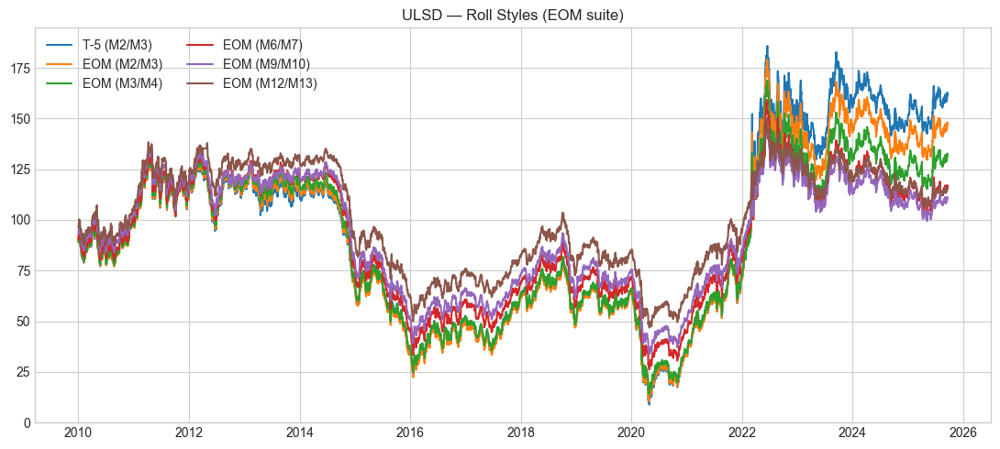

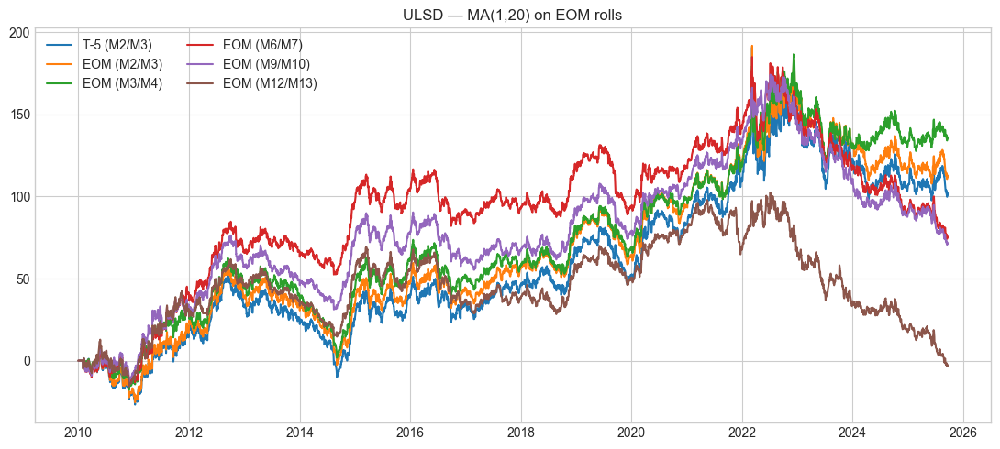

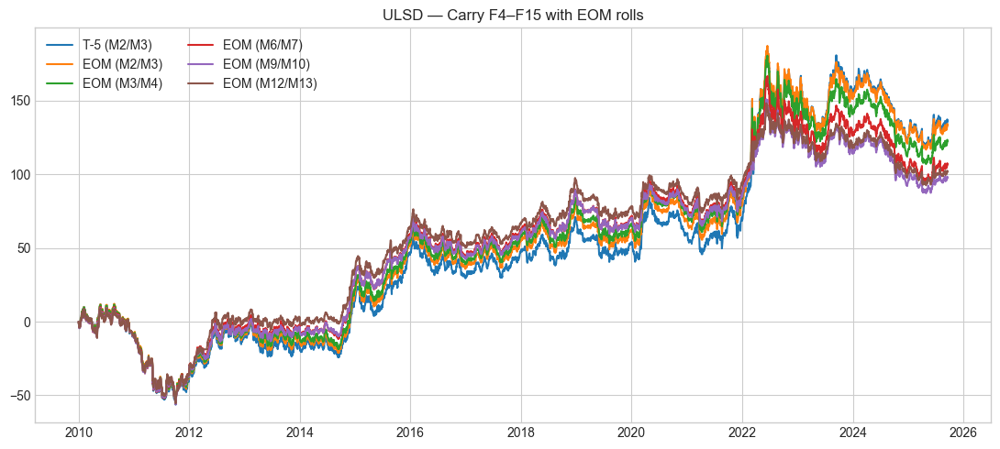

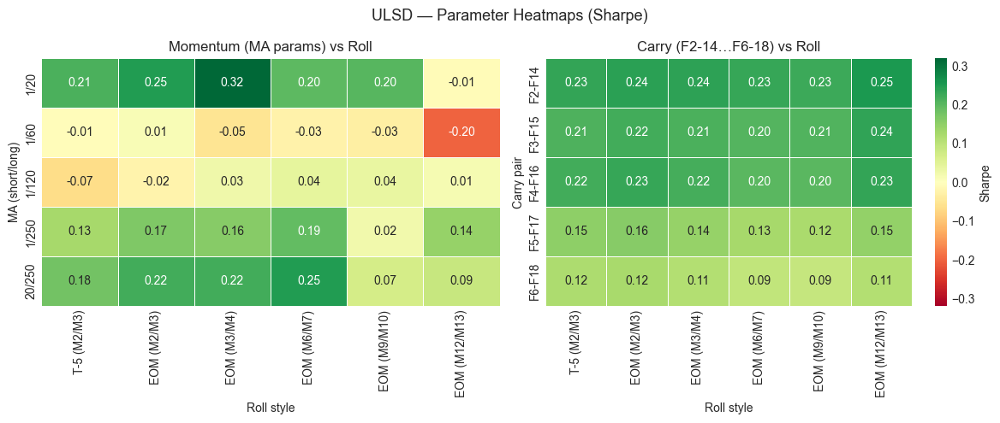

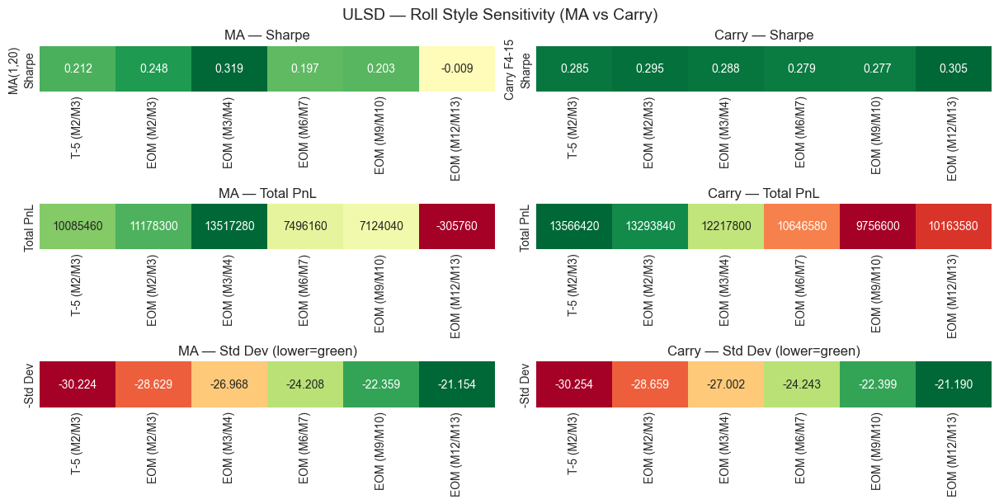

,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,,,,,,,,,
EOM (M12/M13),"1,916,880.0000",-0.0000,1.2193,0.0112,21.1943,0.0575,-0.6431,1.8960,15.7205
EOM (M2/M3),"5,769,120.0000",-0.0000,3.6698,0.0294,28.6641,0.1280,-0.8507,4.3139,15.7205
EOM (M3/M4),"4,223,520.0000",-0.0000,2.6866,0.0227,27.0071,0.0995,-0.8275,3.2467,15.7205
EOM (M6/M7),"2,574,180.0000",-0.0000,1.6375,0.0147,24.2477,0.0675,-0.7502,2.1826,15.7205
EOM (M9/M10),"1,722,840.0000",-0.0000,1.0959,0.0102,22.4033,0.0489,-0.7168,1.5288,15.7205
T-5 (M2/M3),"7,247,940.0000",-0.0000,4.6105,0.0353,30.2581,0.1524,-0.8593,5.3654,15.7205


,,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,strategy,,,,,,,,,
EOM (M12/M13),"MA(1,20)","-305,760.0000",-0.0000,-0.1945,-0.0020,21.1540,-0.0092,-0.5237,-0.3714,15.7205
EOM (M2/M3),"MA(1,20)","11,178,300.0000",-0.0000,7.1106,0.0489,28.6288,0.2484,-0.3798,18.7226,15.7205
EOM (M3/M4),"MA(1,20)","13,517,280.0000",-0.0000,8.5985,0.0559,26.9683,0.3188,-0.3739,22.9938,15.7205
EOM (M6/M7),"MA(1,20)","7,496,160.0000",-0.0000,4.7684,0.0362,24.2076,0.1970,-0.3889,12.2620,15.7205
EOM (M9/M10),"MA(1,20)","7,124,040.0000",-0.0000,4.5317,0.0348,22.3591,0.2027,-0.3778,11.9958,15.7205
T-5 (M2/M3),"MA(1,20)","10,085,460.0000",-0.0000,6.4155,0.0454,30.2235,0.2123,-0.4123,15.5614,15.7205


,,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,strategy,,,,,,,,,
EOM (M12/M13),Carry F4-15,"10,163,580.0000",-0.0000,6.4652,0.0456,21.1896,0.3051,-0.5909,10.9409,15.7205
EOM (M2/M3),Carry F4-15,"13,293,840.0000",-0.0000,8.4563,0.0553,28.6594,0.2951,-0.5991,14.1148,15.7205
EOM (M3/M4),Carry F4-15,"12,217,800.0000",-0.0000,7.7719,0.0521,27.0023,0.2878,-0.6008,12.9355,15.7205
EOM (M6/M7),Carry F4-15,"10,646,580.0000",-0.0000,6.7724,0.0472,24.2431,0.2794,-0.5983,11.3201,15.7205
EOM (M9/M10),Carry F4-15,"9,756,600.0000",-0.0000,6.2063,0.0443,22.3990,0.2771,-0.5988,10.3652,15.7205
T-5 (M2/M3),Carry F4-15,"13,566,420.0000",-0.0000,8.6297,0.0560,30.2539,0.2852,-0.6089,14.1722,15.7205


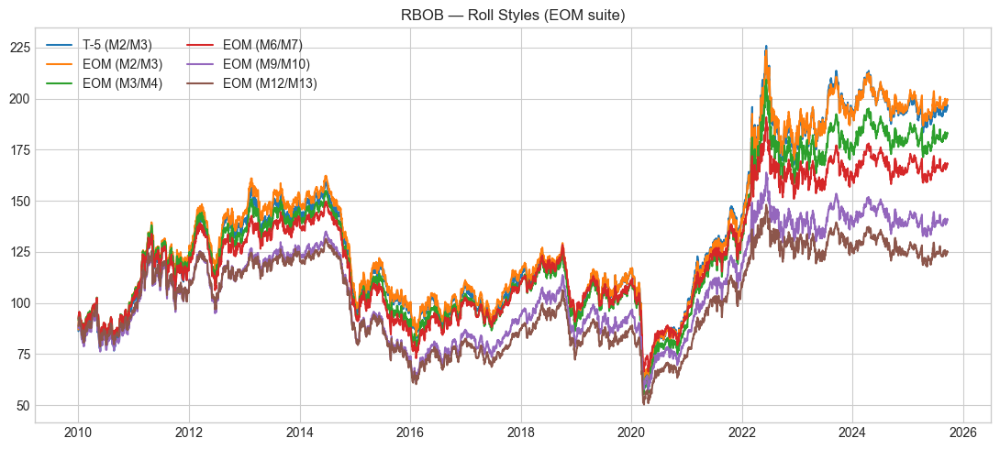

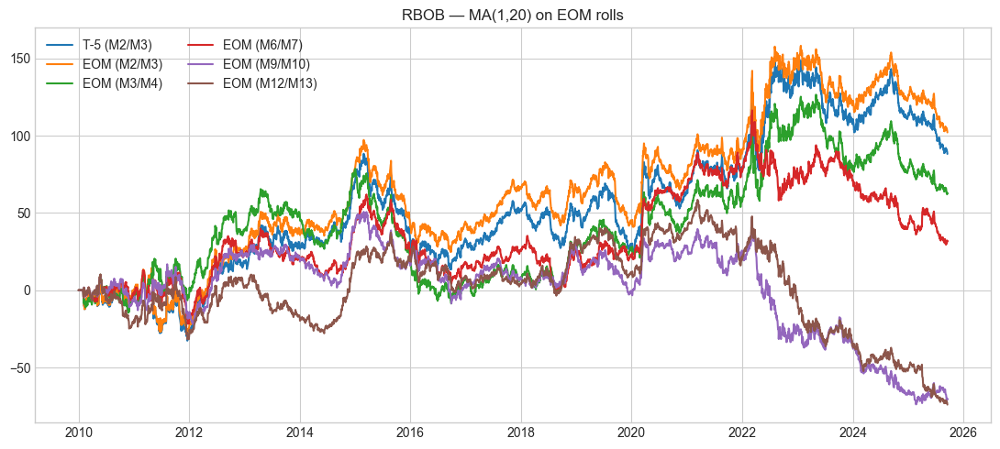

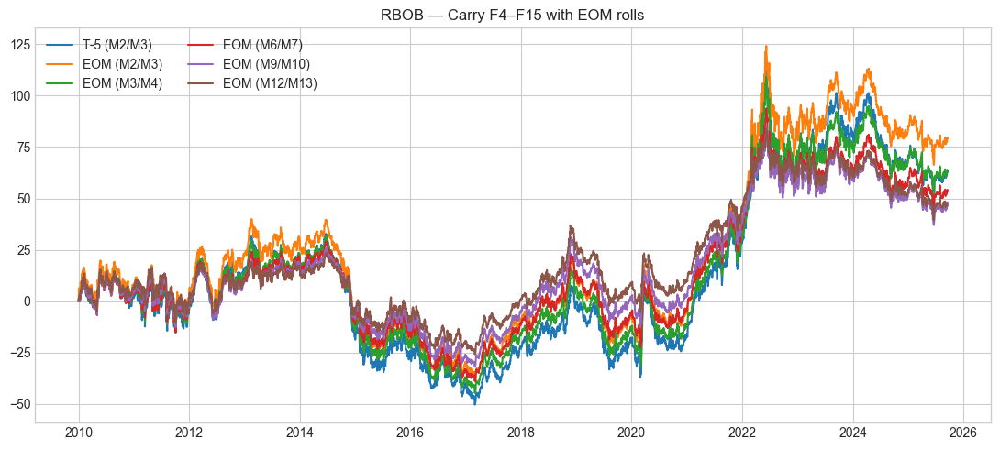

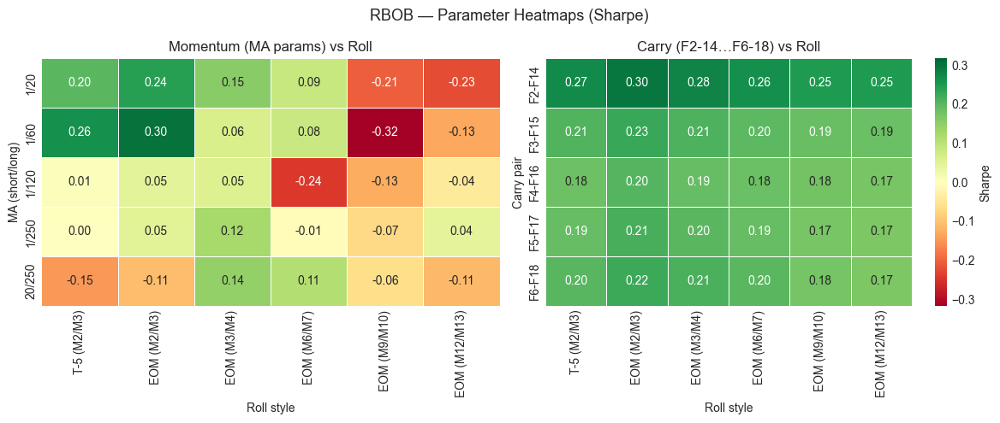

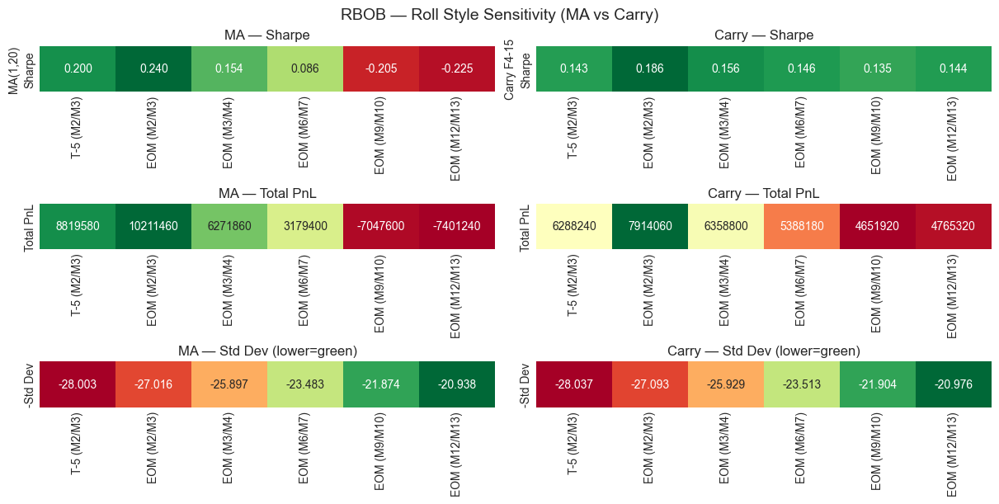

,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,,,,,,,,,
EOM (M12/M13),"3,622,920.0000",-0.0000,2.3046,0.0199,20.9766,0.1099,-0.5685,4.0538,15.7205
EOM (M2/M3),"11,234,580.0000",-0.0000,7.1464,0.0491,27.0912,0.2638,-0.5905,12.1022,15.7205
EOM (M3/M4),"9,138,360.0000",-0.0000,5.8130,0.0422,25.9274,0.2242,-0.6093,9.5411,15.7205
EOM (M6/M7),"7,565,460.0000",-0.0000,4.8125,0.0365,23.5119,0.2047,-0.5291,9.0954,15.7205
EOM (M9/M10),"5,291,160.0000",-0.0000,3.3658,0.0274,21.9040,0.1537,-0.5259,6.3998,15.7205
T-5 (M2/M3),"11,014,500.0000",-0.0000,7.0064,0.0484,28.0352,0.2499,-0.5956,11.7631,15.7205


,,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,strategy,,,,,,,,,
EOM (M12/M13),"MA(1,20)","-7,401,240.0000",-0.0000,-4.7080,-0.0821,20.9376,-0.2249,-0.8360,-5.6313,15.7205
EOM (M2/M3),"MA(1,20)","10,211,460.0000",-0.0000,6.4956,0.0458,27.0163,0.2404,-0.3773,17.2142,15.7205
EOM (M3/M4),"MA(1,20)","6,271,860.0000",-0.0000,3.9896,0.0315,25.8970,0.1541,-0.4882,8.1727,15.7205
EOM (M6/M7),"MA(1,20)","3,179,400.0000",-0.0000,2.0224,0.0177,23.4834,0.0861,-0.4015,5.0369,15.7205
EOM (M9/M10),"MA(1,20)","-7,047,600.0000",-0.0000,-4.4830,-0.0747,21.8740,-0.2049,-0.8265,-5.4244,15.7205
T-5 (M2/M3),"MA(1,20)","8,819,580.0000",-0.0000,5.6102,0.0410,28.0025,0.2003,-0.4091,13.7135,15.7205


,,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,strategy,,,,,,,,,
EOM (M12/M13),Carry F4-15,"4,765,320.0000",-0.0000,3.0313,0.0251,20.9762,0.1445,-0.3994,7.5891,15.7205
EOM (M2/M3),Carry F4-15,"7,914,060.0000",-0.0000,5.0342,0.0378,27.0930,0.1858,-0.5600,8.9890,15.7205
EOM (M3/M4),Carry F4-15,"6,358,800.0000",-0.0000,4.0449,0.0318,25.9288,0.1560,-0.5797,6.9779,15.7205
EOM (M6/M7),Carry F4-15,"5,388,180.0000",-0.0000,3.4275,0.0278,23.5129,0.1458,-0.5265,6.5105,15.7205
EOM (M9/M10),Carry F4-15,"4,651,920.0000",-0.0000,2.9591,0.0246,21.9042,0.1351,-0.4580,6.4613,15.7205
T-5 (M2/M3),Carry F4-15,"6,288,240.0000",-0.0000,4.0000,0.0315,28.0371,0.1427,-0.6252,6.3980,15.7205


In [7]:
# ---------------------------------------------------------------------
# ULSD / RBOB — EOM-style suite
# Styles:
#   1) T-5 (M2/M3)
#   2) EOM (M2/M3)
#   3) EOM (M3/M4)
#   4) EOM (M6/M7)
#   5) EOM (M9/M10)
#   6) EOM (M12/M13)
#
# Uses same MA / Carry machinery as WTI/Brent
# ---------------------------------------------------------------------
refined_names = ["ULSD", "RBOB"]

for commodity_name in refined_names:
    ticker, contracts, units, t_cost = COMMODITIES[commodity_name]

    prices = load_prices(commodity_name, ticker)
    expiry_cal = load_expiry(ticker)

    # per-commodity collectors
    ref_roll_metrics_list  = []
    ref_ma_metrics_list    = []
    ref_carry_metrics_list = []

    # -------------------------------------------------------------
    # 1) T-5 (M2/M3)
    # -------------------------------------------------------------
    res_t5_m23 = rolling_pnl(
        prices,
        expiry_cal,
        front_col="F2",
        next_col="F3",
        roll_window=roll_window,
    )
    res_t5_m23 = roll_EL(res_t5_m23, prices, front_col="F2", t_cost=t_cost)

    # -------------------------------------------------------------
    # 2) EOM (M2/M3)
    # -------------------------------------------------------------
    res_eom_m23 = roll_EOM_midmonth_expiry(
        prices,
        expiry_cal,
        front_col="F2",
        next_col="F3",
    )
    res_eom_m23 = roll_EL(res_eom_m23, prices, front_col="F2", t_cost=t_cost)

    # -------------------------------------------------------------
    # 3) EOM (M3/M4)
    # -------------------------------------------------------------
    res_eom_m34 = roll_EOM_midmonth_expiry(
        prices,
        expiry_cal,
        front_col="F3",
        next_col="F4",
    )
    res_eom_m34 = roll_EL(res_eom_m34, prices, front_col="F3", t_cost=t_cost)

    # -------------------------------------------------------------
    # 4) EOM (M6/M7)
    # -------------------------------------------------------------
    res_eom_m67 = roll_EOM_midmonth_expiry(
        prices,
        expiry_cal,
        front_col="F6",
        next_col="F7",
    )
    res_eom_m67 = roll_EL(res_eom_m67, prices, front_col="F6", t_cost=t_cost)

    # -------------------------------------------------------------
    # 5) EOM (M9/M10)
    # -------------------------------------------------------------
    res_eom_m910 = roll_EOM_midmonth_expiry(
        prices,
        expiry_cal,
        front_col="F9",
        next_col="F10",
    )
    res_eom_m910 = roll_EL(res_eom_m910, prices, front_col="F9", t_cost=t_cost)

    # -------------------------------------------------------------
    # 6) EOM (M12/M13)
    # -------------------------------------------------------------
    res_eom_m1213 = roll_EOM_midmonth_expiry(
        prices,
        expiry_cal,
        front_col="F12",
        next_col="F13",
    )
    res_eom_m1213 = roll_EL(res_eom_m1213, prices, front_col="F12", t_cost=t_cost)

    # bundle
    refined_roll_results = {
        "T-5 (M2/M3)":     res_t5_m23,
        "EOM (M2/M3)":     res_eom_m23,
        "EOM (M3/M4)":     res_eom_m34,
        "EOM (M6/M7)":     res_eom_m67,
        "EOM (M9/M10)":    res_eom_m910,
        "EOM (M12/M13)":   res_eom_m1213,
    }

    # tell MA which front leg to use per style
    refined_style_front_cols = {
        "T-5 (M2/M3)":   "F2",
        "EOM (M2/M3)":   "F2",
        "EOM (M3/M4)":   "F3",
        "EOM (M6/M7)":   "F6",
        "EOM (M9/M10)":  "F9",
        "EOM (M12/M13)": "F12",
    }
    refined_styles_order = list(refined_roll_results.keys())

    # -----------------------------------------------------------------
    # 0. BASE ROLL CHART
    # -----------------------------------------------------------------
    fig, ax = plt.subplots(figsize=(11, 5))
    palette = sns.color_palette("tab10", len(refined_roll_results))

    for (label, df_res), color in zip(refined_roll_results.items(), palette):
        ax.plot(df_res.index, df_res["equity_line"], label=label, color=color)

    ax.set_title(f"{commodity_name} — Roll Styles (EOM suite)")
    ax.legend(loc="best", ncol=2)
    ax.grid(True)
    plt.tight_layout()
    plt.show()

    # -----------------------------------------------------------------
    # BASE ROLL METRICS
    # -----------------------------------------------------------------
    for label, df_res in refined_roll_results.items():
        m = metrics(df_res, contracts=contracts, units=units)
        m["commodity"] = commodity_name
        m["style"] = label
        ref_roll_metrics_list.append(m)

    # -----------------------------------------------------------------
    # 1. MA(1,20) ON TOP OF EACH ROLL VARIANT
    # -----------------------------------------------------------------
    refined_ma_results = {}
    for label, rolled_df in refined_roll_results.items():
        front_col_for_style = refined_style_front_cols[label]

        df_ma = momentum(
            prices=prices,
            rolled_df=rolled_df,
            front_col=front_col_for_style,
            short_ma=1,
            long_ma=20,
            t_cost=t_cost,
            epsilon=0.00,
        )
        refined_ma_results[label] = df_ma

        m_ma = metrics(df_ma, contracts=contracts, units=units)
        m_ma["commodity"] = commodity_name
        m_ma["style"] = label
        m_ma["strategy"] = "MA(1,20)"
        ref_ma_metrics_list.append(m_ma)

    fig, ax = plt.subplots(figsize=(11, 5))
    palette = sns.color_palette("tab10", len(refined_ma_results))

    for (label, df_ma), color in zip(refined_ma_results.items(), palette):
        ax.plot(df_ma.index, df_ma["equity_line"], label=label, color=color)

    ax.set_title(f"{commodity_name} — MA(1,20) on EOM rolls")
    ax.legend(loc="best", ncol=2)
    ax.grid(True)
    plt.tight_layout()
    plt.show()

    # -----------------------------------------------------------------
    # 2. CARRY F4–F15 ON TOP OF EACH ROLL VARIANT
    # -----------------------------------------------------------------
    refined_carry_results = {}
    for label, rolled_df in refined_roll_results.items():
        if not {"F4", "F15"}.issubset(prices.columns):
            continue

        df_carry = carry(
            prices=prices,
            rolled_df=rolled_df,
            front_col="F4",
            end_col="F15",
            t_cost=t_cost,
            epsilon=0.00,
        )
        refined_carry_results[label] = df_carry

        m_c = metrics(df_carry, contracts=contracts, units=units)
        m_c["commodity"] = commodity_name
        m_c["style"] = label
        m_c["strategy"] = "Carry F4-15"
        ref_carry_metrics_list.append(m_c)

    if refined_carry_results:
        fig, ax = plt.subplots(figsize=(11, 5))
        palette = sns.color_palette("tab10", len(refined_carry_results))
        for (label, df_carry), color in zip(refined_carry_results.items(), palette):
            ax.plot(df_carry.index, df_carry["equity_line"], label=label, color=color)

        ax.set_title(f"{commodity_name} — Carry F4–F15 with EOM rolls")
        ax.legend(loc="best", ncol=2)
        ax.grid(True)
        plt.tight_layout()
        plt.show()

    # -----------------------------------------------------------------
    # 3. PARAMETER HEATMAPS (MA grid, Carry grid)
    # -----------------------------------------------------------------
    refined_ma_sharpes = pd.DataFrame(
        index=[f"{s}/{l}" for (s, l) in ma_params],
        columns=refined_styles_order,
        dtype=float,
    )

    for roll_name, rolled_df in refined_roll_results.items():
        front_col_for_style = refined_style_front_cols[roll_name]
        for (sma, lma) in ma_params:
            df_ma_param = momentum(
                prices=prices,
                rolled_df=rolled_df,
                front_col=front_col_for_style,
                short_ma=sma,
                long_ma=lma,
                t_cost=t_cost,
                epsilon=0.00,
            )
            rets = df_ma_param["equity_line"].diff().dropna()
            if rets.std() and not np.isnan(rets.std()) and rets.std() != 0:
                sh = rets.mean() / rets.std() * np.sqrt(252)
            else:
                sh = np.nan
            refined_ma_sharpes.loc[f"{sma}/{lma}", roll_name] = sh

    refined_carry_sharpes = pd.DataFrame(
        index=[f"F{f1}-F{f2}" for (f1, f2) in carry_pairs],
        columns=refined_styles_order,
        dtype=float,
    )

    for roll_name, rolled_df in refined_roll_results.items():
        for (f1, f2) in carry_pairs:
            c1, c2 = f"F{f1}", f"F{f2}"
            if c1 not in prices.columns or c2 not in prices.columns:
                continue

            df_c_param = carry(
                prices=prices,
                rolled_df=rolled_df,
                front_col=c1,
                end_col=c2,
                t_cost=t_cost,
                epsilon=0.00,
            )
            rets = df_c_param["equity_line"].diff().dropna()
            if rets.std() and not np.isnan(rets.std()) and rets.std() != 0:
                sh = rets.mean() / rets.std() * np.sqrt(252)
            else:
                sh = np.nan
            refined_carry_sharpes.loc[f"F{f1}-F{f2}", roll_name] = sh

    all_vals = np.concatenate(
        [
            refined_ma_sharpes.to_numpy().flatten(),
            refined_carry_sharpes.to_numpy().flatten(),
        ]
    )
    all_vals = all_vals[~np.isnan(all_vals)]
    vlim = float(np.max(np.abs(all_vals))) if len(all_vals) else 1.0

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(f"{commodity_name} — Parameter Heatmaps (Sharpe)", fontsize=13)

    sns.heatmap(
        refined_ma_sharpes,
        ax=axes[0],
        annot=True,
        fmt=".2f",
        cmap="RdYlGn",
        center=0.0,
        vmin=-vlim,
        vmax=vlim,
        cbar=False,
        linewidths=0.5,
        linecolor="white",
    )
    axes[0].set_title("Momentum (MA params) vs Roll")
    axes[0].set_xlabel("Roll style")
    axes[0].set_ylabel("MA (short/long)")

    sns.heatmap(
        refined_carry_sharpes,
        ax=axes[1],
        annot=True,
        fmt=".2f",
        cmap="RdYlGn",
        center=0.0,
        vmin=-vlim,
        vmax=vlim,
        cbar=True,
        cbar_kws={"label": "Sharpe"},
        linewidths=0.5,
        linecolor="white",
    )
    axes[1].set_title("Carry (F2-14…F6-18) vs Roll")
    axes[1].set_xlabel("Roll style")
    axes[1].set_ylabel("Carry pair")

    plt.tight_layout()
    plt.show()

    # -----------------------------------------------------------------
    # Build per-commodity DataFrames
    # -----------------------------------------------------------------
    ref_roll_df  = pd.DataFrame(ref_roll_metrics_list).set_index(["commodity", "style"])
    ref_ma_df    = pd.DataFrame(ref_ma_metrics_list).set_index(["commodity", "style", "strategy"])
    if ref_carry_metrics_list:
        ref_carry_df = pd.DataFrame(ref_carry_metrics_list).set_index(["commodity", "style", "strategy"])
    else:
        ref_carry_df = pd.DataFrame()

    # -----------------------------------------------------------------
    # Sensitivity panel — Sharpe / PnL / Std (MA vs Carry)
    # -----------------------------------------------------------------
    fig, axes = plt.subplots(
        nrows=3, ncols=2,
        figsize=(12, 6),
        constrained_layout=True
    )
    fig.suptitle(f"{commodity_name} — Roll Style Sensitivity (MA vs Carry)", fontsize=14)

    # MA(1,20) slice
    ref_ma_base = ref_ma_df.loc[(commodity_name, slice(None), "MA(1,20)")]
    ref_ma_sharpe_slice = ref_ma_base["Sharpe"].reindex(refined_styles_order)
    ref_ma_pnl_slice    = ref_ma_base["Total PnL"].reindex(refined_styles_order)
    ref_ma_std_slice    = ref_ma_base["Std Dev (ann.)"].reindex(refined_styles_order)

    # MA — Sharpe
    ax = axes[0, 0]
    ma_sharpe_df = pd.DataFrame(
        [ref_ma_sharpe_slice.values],
        index=["Sharpe"],
        columns=refined_styles_order,
    )
    sns.heatmap(
        ma_sharpe_df,
        ax=ax,
        annot=True,
        fmt=".3f",
        cmap="RdYlGn",
        center=0.0,
        cbar=False,
    )
    ax.set_ylabel("MA(1,20)")
    ax.set_xlabel("")
    ax.set_title("MA — Sharpe")

    # MA — Total PnL
    ax = axes[1, 0]
    ma_pnl_df = pd.DataFrame(
        [ref_ma_pnl_slice.values],
        index=["Total PnL"],
        columns=refined_styles_order,
    )
    vmin = ma_pnl_df.min().min()
    vmax = ma_pnl_df.max().max()
    sns.heatmap(
        ma_pnl_df,
        ax=ax,
        annot=True,
        fmt=".0f",
        cmap="RdYlGn",
        vmin=vmin,
        vmax=vmax,
        cbar=False,
    )
    ax.set_ylabel("")
    ax.set_xlabel("")
    ax.set_title("MA — Total PnL")

    # MA — Std Dev (lower=green)
    ax = axes[2, 0]
    ma_std_df = pd.DataFrame(
        [(-ref_ma_std_slice).values],
        index=["-Std Dev"],
        columns=refined_styles_order,
    )
    sns.heatmap(
        ma_std_df,
        ax=ax,
        annot=True,
        fmt=".3f",
        cmap="RdYlGn",
        cbar=False,
    )
    ax.set_ylabel("")
    ax.set_xlabel("")
    ax.set_title("MA — Std Dev (lower=green)")

    # Carry slice
    has_carry = not ref_carry_df.empty
    if has_carry:
        ref_carry_base = ref_carry_df.loc[(commodity_name, slice(None), "Carry F4-15")]
        ref_carry_sharpe_slice = ref_carry_base["Sharpe"].reindex(refined_styles_order)
        ref_carry_pnl_slice    = ref_carry_base["Total PnL"].reindex(refined_styles_order)
        ref_carry_std_slice    = ref_carry_base["Std Dev (ann.)"].reindex(refined_styles_order)

        # Carry — Sharpe
        ax = axes[0, 1]
        carry_sharpe_df = pd.DataFrame(
            [ref_carry_sharpe_slice.values],
            index=["Sharpe"],
            columns=refined_styles_order,
        )
        sns.heatmap(
            carry_sharpe_df,
            ax=ax,
            annot=True,
            fmt=".3f",
            cmap="RdYlGn",
            center=0.0,
            cbar=False,
        )
        ax.set_ylabel("Carry F4-15")
        ax.set_xlabel("")
        ax.set_title("Carry — Sharpe")

        # Carry — Total PnL
        ax = axes[1, 1]
        carry_pnl_df = pd.DataFrame(
            [ref_carry_pnl_slice.values],
            index=["Total PnL"],
            columns=refined_styles_order,
        )
        vmin = carry_pnl_df.min().min()
        vmax = carry_pnl_df.max().max()
        sns.heatmap(
            carry_pnl_df,
            ax=ax,
            annot=True,
            fmt=".0f",
            cmap="RdYlGn",
            vmin=vmin,
            vmax=vmax,
            cbar=False,
        )
        ax.set_ylabel("")
        ax.set_xlabel("")
        ax.set_title("Carry — Total PnL")

        # Carry — Std Dev
        ax = axes[2, 1]
        carry_std_df = pd.DataFrame(
            [(-ref_carry_std_slice).values],
            index=["-Std Dev"],
            columns=refined_styles_order,
        )
        sns.heatmap(
            carry_std_df,
            ax=ax,
            annot=True,
            fmt=".3f",
            cmap="RdYlGn",
            cbar=False,
        )
        ax.set_ylabel("")
        ax.set_xlabel("")
        ax.set_title("Carry — Std Dev (lower=green)")
    else:
        for r in range(3):
            axes[r, 1].axis("off")

    plt.show()

    # -----------------------------------------------------------------
    # Display / export per commodity
    # -----------------------------------------------------------------
    ref_roll_metrics_df  = ref_roll_df.loc[commodity_name].sort_index()
    ref_ma_metrics_df    = ref_ma_df.loc[(commodity_name, slice(None), slice(None))].sort_index()
    try:
        ref_carry_metrics_df = ref_carry_df.loc[(commodity_name, slice(None), slice(None))].sort_index()
    except KeyError:
        ref_carry_metrics_df = pd.DataFrame()

    display(ref_roll_metrics_df)
    display(ref_ma_metrics_df)
    display(ref_carry_metrics_df)


## Gasoil Roll

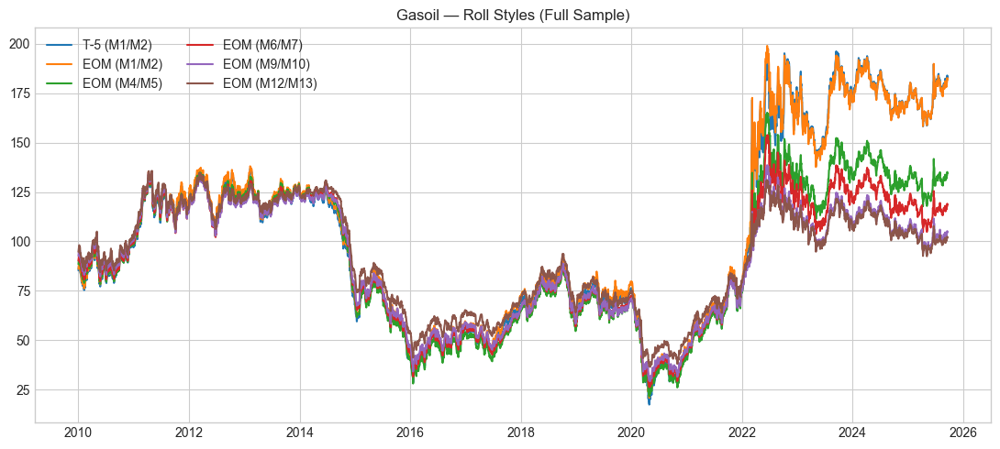

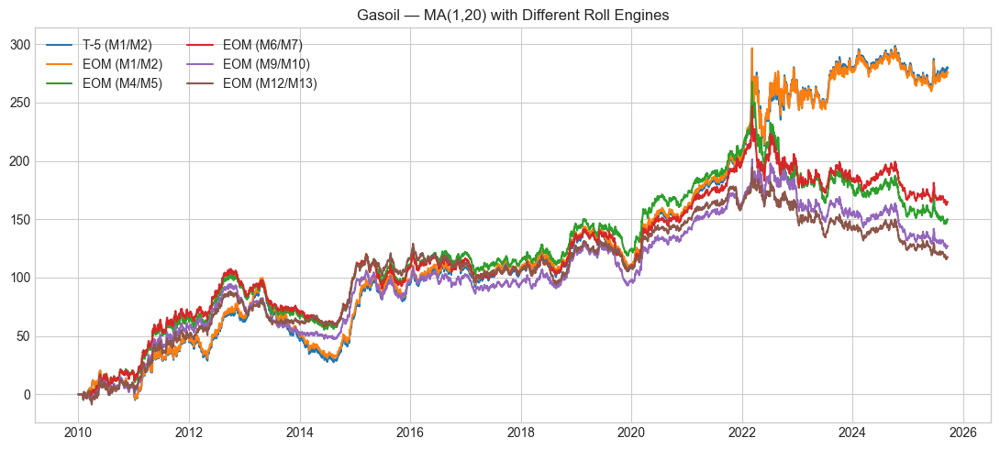

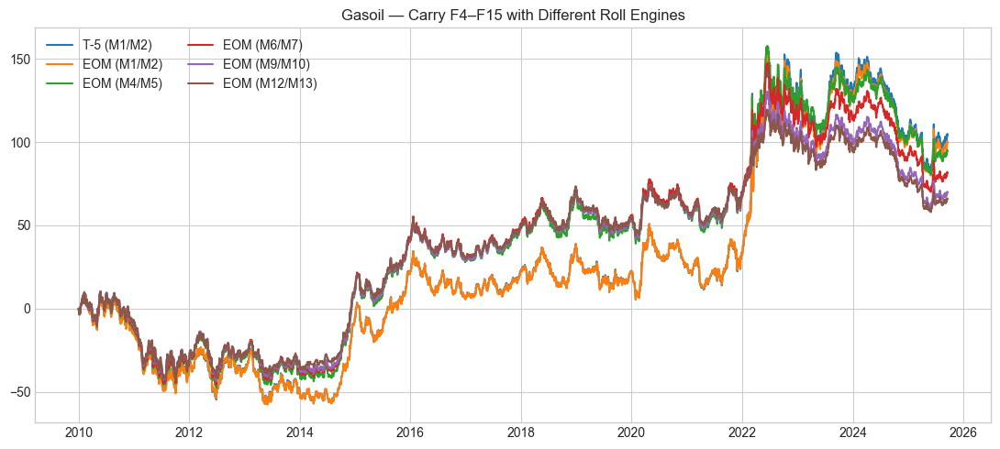

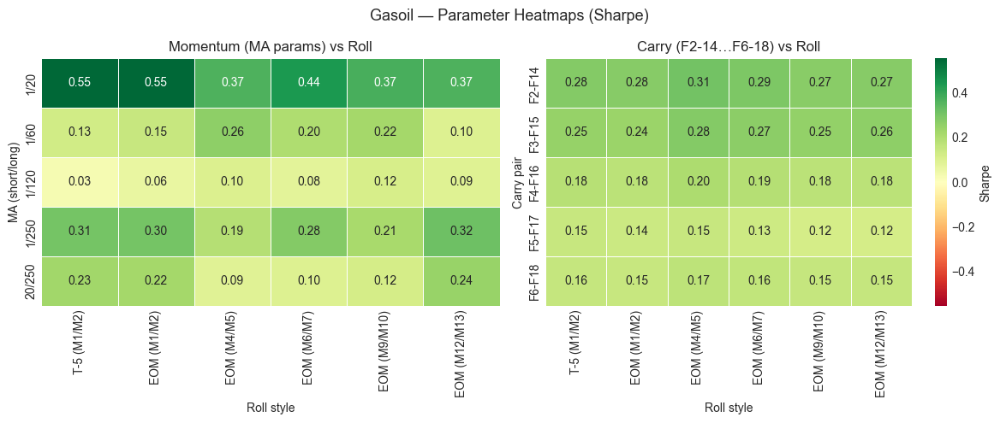

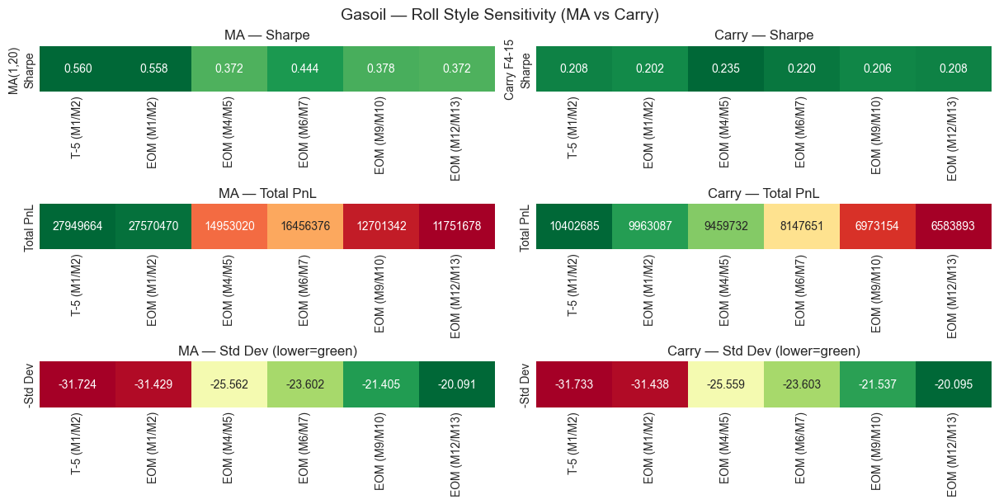

,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,,,,,,,,,
EOM (M1/M2),"9,570,469.7987",-0.0000,6.0879,0.0436,31.4727,0.1934,-0.7714,7.8918,15.7205
EOM (M12/M13),"728,187.9195",-0.0000,0.4632,0.0045,20.1322,0.0230,-0.7037,0.6582,15.7205
EOM (M4/M5),"4,593,959.7315",-0.0000,2.9223,0.0243,25.5986,0.1142,-0.7744,3.7735,15.7205
EOM (M6/M7),"2,825,503.3557",-0.0000,1.7973,0.0160,23.6434,0.0760,-0.7501,2.3961,15.7205
EOM (M9/M10),"1,204,697.9866",-0.0000,0.7663,0.0073,21.5768,0.0355,-0.7432,1.0312,15.7205
T-5 (M1/M2),"9,775,167.7852",-0.0000,6.2181,0.0443,31.7676,0.1957,-0.7882,7.8888,15.7205


,,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,strategy,,,,,,,,,
EOM (M1/M2),"MA(1,20)","27,570,469.7987",-0.0000,17.5379,0.0878,31.4288,0.5580,-0.3463,50.6498,15.7205
EOM (M12/M13),"MA(1,20)","11,751,677.8523",-0.0000,7.4754,0.0507,20.0908,0.3721,-0.2676,27.9347,15.7205
EOM (M4/M5),"MA(1,20)","14,953,020.1342",-0.0000,9.5118,0.0599,25.5623,0.3721,-0.3311,28.7319,15.7205
EOM (M6/M7),"MA(1,20)","16,456,375.8389",-0.0000,10.4681,0.0638,23.6025,0.4435,-0.2441,42.8801,15.7205
EOM (M9/M10),"MA(1,20)","12,701,342.2819",-0.0000,8.0795,0.0535,21.4047,0.3775,-0.2534,31.8814,15.7205
T-5 (M1/M2),"MA(1,20)","27,949,664.4295",-0.0000,17.7791,0.0885,31.7236,0.5604,-0.3528,50.4012,15.7205


,,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,strategy,,,,,,,,,
EOM (M1/M2),Carry F4-15,"9,963,087.2483",-0.0000,6.3376,0.0450,31.4376,0.2016,-0.6145,10.3140,15.7205
EOM (M12/M13),Carry F4-15,"6,583,892.6174",-0.0000,4.1881,0.0327,20.0954,0.2084,-0.4801,8.7238,15.7205
EOM (M4/M5),Carry F4-15,"9,459,731.5436",-0.0000,6.0174,0.0433,25.5589,0.2354,-0.5248,11.4653,15.7205
EOM (M6/M7),Carry F4-15,"8,147,651.0067",-0.0000,5.1828,0.0386,23.6030,0.2196,-0.5078,10.2072,15.7205
EOM (M9/M10),Carry F4-15,"6,973,154.3624",-0.0000,4.4357,0.0342,21.5374,0.2060,-0.4888,9.0755,15.7205
T-5 (M1/M2),Carry F4-15,"10,402,684.5638",-0.0000,6.6173,0.0464,31.7327,0.2085,-0.6106,10.8370,15.7205


In [8]:
# ---------------------------------------------------------------------
# GASOIL Roll — T-5 M1/M2 + EOM M1/M2 + EOM M4/M5 + EOM M6/M7 + EOM M9/M10 + EOM M12/M13
# + MA / Carry parameter heatmaps (Gasoil-specific)
# ---------------------------------------------------------------------
commodity_name = "Gasoil"
ticker, contracts, units, t_cost = COMMODITIES[commodity_name]

prices = load_prices(commodity_name, ticker)
expiry_cal = load_expiry(ticker)

# Gasoil-specific collectors
gasoil_roll_metrics_list  = []
gasoil_ma_metrics_list    = []
gasoil_carry_metrics_list = []

# --- 1) T-5, M1/M2 ---------------------------------------------------
gasoil_res_t5_m12 = rolling_pnl(
    prices,
    expiry_cal,
    front_col="F1",
    next_col="F2",
    roll_window=roll_window,
)
gasoil_res_t5_m12 = roll_EL(gasoil_res_t5_m12, prices, front_col="F1", t_cost=t_cost)

# --- 2) EOM midmonth, M1/M2 ------------------------------------------
gasoil_res_eom_m12 = roll_EOM_midmonth_expiry(
    prices,
    expiry_cal,
    front_col="F1",
    next_col="F2",
)
gasoil_res_eom_m12 = roll_EL(gasoil_res_eom_m12, prices, front_col="F1", t_cost=t_cost)

# --- 3) EOM midmonth, M4/M5 ------------------------------------------
gasoil_res_eom_m45 = roll_EOM_midmonth_expiry(
    prices,
    expiry_cal,
    front_col="F4",
    next_col="F5",
)
gasoil_res_eom_m45 = roll_EL(gasoil_res_eom_m45, prices, front_col="F4", t_cost=t_cost)

# --- 4) EOM midmonth, M6/M7 ------------------------------------------
gasoil_res_eom_m67 = roll_EOM_midmonth_expiry(
    prices,
    expiry_cal,
    front_col="F6",
    next_col="F7",
)
gasoil_res_eom_m67 = roll_EL(gasoil_res_eom_m67, prices, front_col="F6", t_cost=t_cost)

# --- 5) EOM midmonth, M9/M10 -----------------------------------------
gasoil_res_eom_m910 = roll_EOM_midmonth_expiry(
    prices,
    expiry_cal,
    front_col="F9",
    next_col="F10",
)
gasoil_res_eom_m910 = roll_EL(gasoil_res_eom_m910, prices, front_col="F9", t_cost=t_cost)

# --- 6) EOM midmonth, M12/M13 ----------------------------------------
gasoil_res_eom_m1213 = roll_EOM_midmonth_expiry(
    prices,
    expiry_cal,
    front_col="F12",
    next_col="F13",
)
gasoil_res_eom_m1213 = roll_EL(gasoil_res_eom_m1213, prices, front_col="F12", t_cost=t_cost)

# --- bundle for plotting / downstream strategies ---------------------
gasoil_roll_results = {
    "T-5 (M1/M2)":    gasoil_res_t5_m12,
    "EOM (M1/M2)":    gasoil_res_eom_m12,
    "EOM (M4/M5)":    gasoil_res_eom_m45,
    "EOM (M6/M7)":    gasoil_res_eom_m67,
    "EOM (M9/M10)":   gasoil_res_eom_m910,
    "EOM (M12/M13)":  gasoil_res_eom_m1213,
}

# keep front cols per style
gasoil_style_front_cols = {
    "T-5 (M1/M2)":   "F1",
    "EOM (M1/M2)":   "F1",
    "EOM (M4/M5)":   "F4",
    "EOM (M6/M7)":   "F6",
    "EOM (M9/M10)":  "F9",
    "EOM (M12/M13)": "F12",
}
gasoil_styles_order = list(gasoil_roll_results.keys())

# ---------------------------------------------------------------------
# 0. BASE ROLL CHART
# ---------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(11, 5))
palette = sns.color_palette("tab10", len(gasoil_roll_results))

for (label, df_res), color in zip(gasoil_roll_results.items(), palette):
    ax.plot(df_res.index, df_res["equity_line"], label=label, color=color)

ax.set_title("Gasoil — Roll Styles (Full Sample)")
ax.legend(loc="best", ncol=2)
ax.grid(True)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------
# BASE ROLL METRICS (Gasoil-only)
# ---------------------------------------------------------------------
for label, df_res in gasoil_roll_results.items():
    m = metrics(df_res, contracts=contracts, units=units)
    m["commodity"] = commodity_name
    m["style"] = label
    gasoil_roll_metrics_list.append(m)

# ---------------------------------------------------------------------
# 1. MA(1,20) ON TOP OF EACH ROLL VARIANT
# ---------------------------------------------------------------------
gasoil_ma_results = {}

for label, rolled_df in gasoil_roll_results.items():
    front_col_for_style = gasoil_style_front_cols[label]

    df_ma = momentum(
        prices=prices,
        rolled_df=rolled_df,
        front_col=front_col_for_style,
        short_ma=1,
        long_ma=20,
        t_cost=t_cost,
        epsilon=0.00,
    )
    gasoil_ma_results[label] = df_ma

    m_ma = metrics(df_ma, contracts=contracts, units=units)
    m_ma["commodity"] = commodity_name
    m_ma["style"] = label
    m_ma["strategy"] = "MA(1,20)"
    gasoil_ma_metrics_list.append(m_ma)

fig, ax = plt.subplots(figsize=(11, 5))
palette = sns.color_palette("tab10", len(gasoil_ma_results))

for (label, df_ma), color in zip(gasoil_ma_results.items(), palette):
    ax.plot(df_ma.index, df_ma["equity_line"], label=label, color=color)

ax.set_title("Gasoil — MA(1,20) with Different Roll Engines")
ax.legend(loc="best", ncol=2)
ax.grid(True)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------
# 2. CARRY F4–F15 ON TOP OF EACH ROLL VARIANT
# ---------------------------------------------------------------------
gasoil_carry_results = {}

for label, rolled_df in gasoil_roll_results.items():
    if not {"F4", "F15"}.issubset(prices.columns):
        continue

    df_carry = carry(
        prices=prices,
        rolled_df=rolled_df,
        front_col="F4",
        end_col="F15",
        t_cost=t_cost,
        epsilon=0.00,
    )
    gasoil_carry_results[label] = df_carry

    m_c = metrics(df_carry, contracts=contracts, units=units)
    m_c["commodity"] = commodity_name
    m_c["style"] = label
    m_c["strategy"] = "Carry F4-15"
    gasoil_carry_metrics_list.append(m_c)

if gasoil_carry_results:
    fig, ax = plt.subplots(figsize=(11, 5))
    palette = sns.color_palette("tab10", len(gasoil_carry_results))

    for (label, df_carry), color in zip(gasoil_carry_results.items(), palette):
        ax.plot(df_carry.index, df_carry["equity_line"], label=label, color=color)

    ax.set_title("Gasoil — Carry F4–F15 with Different Roll Engines")
    ax.legend(loc="best", ncol=2)
    ax.grid(True)
    plt.tight_layout()
    plt.show()

# ---------------------------------------------------------------------
# 3. PARAMETER HEATMAPS (MA grid, Carry grid) — Gasoil-specific
# ---------------------------------------------------------------------
gasoil_ma_sharpes = pd.DataFrame(
    index=[f"{s}/{l}" for (s, l) in ma_params],
    columns=gasoil_styles_order,
    dtype=float,
)

for roll_name, rolled_df in gasoil_roll_results.items():
    front_col_for_style = gasoil_style_front_cols[roll_name]
    for (sma, lma) in ma_params:
        df_ma_param = momentum(
            prices=prices,
            rolled_df=rolled_df,
            front_col=front_col_for_style,
            short_ma=sma,
            long_ma=lma,
            t_cost=t_cost,
            epsilon=0.00,
        )
        rets = df_ma_param["equity_line"].diff().dropna()
        if rets.std() and not np.isnan(rets.std()) and rets.std() != 0:
            sh = rets.mean() / rets.std() * np.sqrt(252)
        else:
            sh = np.nan
        gasoil_ma_sharpes.loc[f"{sma}/{lma}", roll_name] = sh

gasoil_carry_sharpes = pd.DataFrame(
    index=[f"F{f1}-F{f2}" for (f1, f2) in carry_pairs],
    columns=gasoil_styles_order,
    dtype=float,
)

for roll_name, rolled_df in gasoil_roll_results.items():
    for (f1, f2) in carry_pairs:
        c1, c2 = f"F{f1}", f"F{f2}"
        if c1 not in prices.columns or c2 not in prices.columns:
            continue

        df_c_param = carry(
            prices=prices,
            rolled_df=rolled_df,
            front_col=c1,
            end_col=c2,
            t_cost=t_cost,
            epsilon=0.00,
        )
        rets = df_c_param["equity_line"].diff().dropna()
        if rets.std() and not np.isnan(rets.std()) and rets.std() != 0:
            sh = rets.mean() / rets.std() * np.sqrt(252)
        else:
            sh = np.nan
        gasoil_carry_sharpes.loc[f"F{f1}-F{f2}", roll_name] = sh

# symmetric color
all_vals = np.concatenate(
    [
        gasoil_ma_sharpes.to_numpy().flatten(),
        gasoil_carry_sharpes.to_numpy().flatten(),
    ]
)
all_vals = all_vals[~np.isnan(all_vals)]
vlim = float(np.max(np.abs(all_vals))) if len(all_vals) else 1.0

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle("Gasoil — Parameter Heatmaps (Sharpe)", fontsize=13)

sns.heatmap(
    gasoil_ma_sharpes,
    ax=axes[0],
    annot=True,
    fmt=".2f",
    cmap="RdYlGn",
    center=0.0,
    vmin=-vlim,
    vmax=vlim,
    cbar=False,
    linewidths=0.5,
    linecolor="white",
)
axes[0].set_title("Momentum (MA params) vs Roll")
axes[0].set_xlabel("Roll style")
axes[0].set_ylabel("MA (short/long)")

sns.heatmap(
    gasoil_carry_sharpes,
    ax=axes[1],
    annot=True,
    fmt=".2f",
    cmap="RdYlGn",
    center=0.0,
    vmin=-vlim,
    vmax=vlim,
    cbar=True,
    cbar_kws={"label": "Sharpe"},
    linewidths=0.5,
    linecolor="white",
)
axes[1].set_title("Carry (F2-14…F6-18) vs Roll")
axes[1].set_xlabel("Roll style")
axes[1].set_ylabel("Carry pair")

plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------
# GASOIL — Roll Style Sensitivity (MA vs Carry)
# ---------------------------------------------------------------------
gasoil_styles_order = [
    "T-5 (M1/M2)",
    "EOM (M1/M2)",
    "EOM (M4/M5)",
    "EOM (M6/M7)",
    "EOM (M9/M10)",
    "EOM (M12/M13)",
]

# build dfs from Gasoil-only lists
gasoil_roll_df  = pd.DataFrame(gasoil_roll_metrics_list).set_index(["commodity", "style"])
gasoil_ma_df    = pd.DataFrame(gasoil_ma_metrics_list).set_index(["commodity", "style", "strategy"])
if gasoil_carry_metrics_list:
    gasoil_carry_df = pd.DataFrame(gasoil_carry_metrics_list).set_index(["commodity", "style", "strategy"])
else:
    gasoil_carry_df = pd.DataFrame()

fig, axes = plt.subplots(
    nrows=3, ncols=2,
    figsize=(12, 6),
    constrained_layout=True
)
fig.suptitle("Gasoil — Roll Style Sensitivity (MA vs Carry)", fontsize=14)

# MA slice
gasoil_ma_base   = gasoil_ma_df.loc[("Gasoil", slice(None), "MA(1,20)")]
gasoil_ma_sharpe = gasoil_ma_base["Sharpe"].reindex(gasoil_styles_order)
gasoil_ma_pnl    = gasoil_ma_base["Total PnL"].reindex(gasoil_styles_order)
gasoil_ma_std    = gasoil_ma_base["Std Dev (ann.)"].reindex(gasoil_styles_order)

# MA — Sharpe
ax = axes[0, 0]
ma_sharpe_df = pd.DataFrame(
    [gasoil_ma_sharpe.values],
    index=["Sharpe"],
    columns=gasoil_styles_order,
)
sns.heatmap(
    ma_sharpe_df,
    ax=ax,
    annot=True,
    fmt=".3f",
    cmap="RdYlGn",
    center=0.0,
    cbar=False,
)
ax.set_ylabel("MA(1,20)")
ax.set_xlabel("")
ax.set_title("MA — Sharpe")

# MA — Total PnL
ax = axes[1, 0]
ma_pnl_df = pd.DataFrame(
    [gasoil_ma_pnl.values],
    index=["Total PnL"],
    columns=gasoil_styles_order,
)
vmin = ma_pnl_df.min().min()
vmax = ma_pnl_df.max().max()
sns.heatmap(
    ma_pnl_df,
    ax=ax,
    annot=True,
    fmt=".0f",
    cmap="RdYlGn",
    vmin=vmin,
    vmax=vmax,
    cbar=False,
)
ax.set_ylabel("")
ax.set_xlabel("")
ax.set_title("MA — Total PnL")

# MA — Std Dev (lower=green)
ax = axes[2, 0]
ma_std_df = pd.DataFrame(
    [(-gasoil_ma_std).values],
    index=["-Std Dev"],
    columns=gasoil_styles_order,
)
sns.heatmap(
    ma_std_df,
    ax=ax,
    annot=True,
    fmt=".3f",
    cmap="RdYlGn",
    cbar=False,
)
ax.set_ylabel("")
ax.set_xlabel("")
ax.set_title("MA — Std Dev (lower=green)")

# Carry slice (if any)
has_carry = not gasoil_carry_df.empty
if has_carry:
    gasoil_carry_base = gasoil_carry_df.loc[("Gasoil", slice(None), "Carry F4-15")]
    gasoil_carry_sharpe = gasoil_carry_base["Sharpe"].reindex(gasoil_styles_order)
    gasoil_carry_pnl    = gasoil_carry_base["Total PnL"].reindex(gasoil_styles_order)
    gasoil_carry_std    = gasoil_carry_base["Std Dev (ann.)"].reindex(gasoil_styles_order)

    # Carry — Sharpe
    ax = axes[0, 1]
    carry_sharpe_df = pd.DataFrame(
        [gasoil_carry_sharpe.values],
        index=["Sharpe"],
        columns=gasoil_styles_order,
    )
    sns.heatmap(
        carry_sharpe_df,
        ax=ax,
        annot=True,
        fmt=".3f",
        cmap="RdYlGn",
        center=0.0,
        cbar=False,
    )
    ax.set_ylabel("Carry F4-15")
    ax.set_xlabel("")
    ax.set_title("Carry — Sharpe")

    # Carry — Total PnL
    ax = axes[1, 1]
    carry_pnl_df = pd.DataFrame(
        [gasoil_carry_pnl.values],
        index=["Total PnL"],
        columns=gasoil_styles_order,
    )
    vmin = carry_pnl_df.min().min()
    vmax = carry_pnl_df.max().max()
    sns.heatmap(
        carry_pnl_df,
        ax=ax,
        annot=True,
        fmt=".0f",
        cmap="RdYlGn",
        vmin=vmin,
        vmax=vmax,
        cbar=False,
    )
    ax.set_ylabel("")
    ax.set_xlabel("")
    ax.set_title("Carry — Total PnL")

    # Carry — Std Dev
    ax = axes[2, 1]
    carry_std_df = pd.DataFrame(
        [(-gasoil_carry_std).values],
        index=["-Std Dev"],
        columns=gasoil_styles_order,
    )
    sns.heatmap(
        carry_std_df,
        ax=ax,
        annot=True,
        fmt=".3f",
        cmap="RdYlGn",
        cbar=False,
    )
    ax.set_ylabel("")
    ax.set_xlabel("")
    ax.set_title("Carry — Std Dev (lower=green)")
else:
    for r in range(3):
        axes[r, 1].axis("off")

plt.show()

# ---------------------------------------------------------------------
# FINAL: Gasoil-only metrics tables
# ---------------------------------------------------------------------
gasoil_roll_metrics_df  = gasoil_roll_df.loc["Gasoil"].sort_index()
gasoil_ma_metrics_df    = gasoil_ma_df.loc[("Gasoil", slice(None), slice(None))].sort_index()
try:
    gasoil_carry_metrics_df = gasoil_carry_df.loc[("Gasoil", slice(None), slice(None))].sort_index()
except KeyError:
    gasoil_carry_metrics_df = pd.DataFrame()

display(gasoil_roll_metrics_df)
display(gasoil_ma_metrics_df)
display(gasoil_carry_metrics_df)


## NatGas Roll

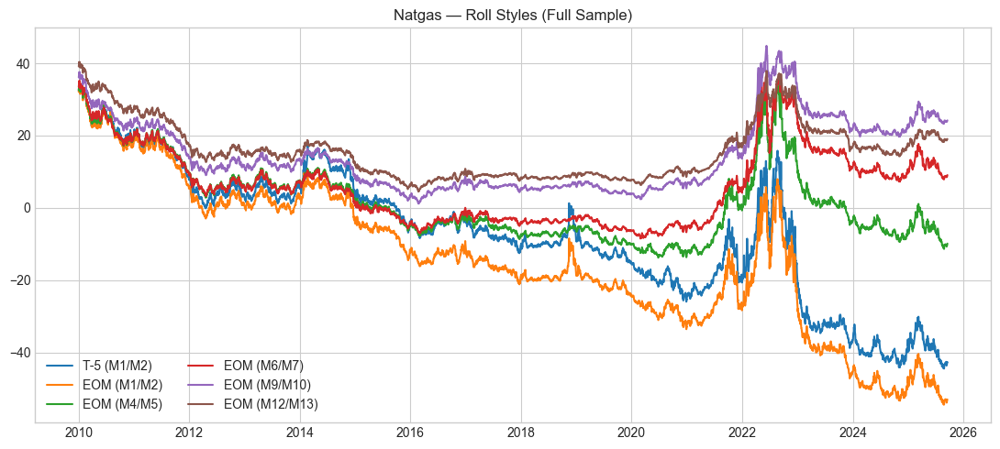

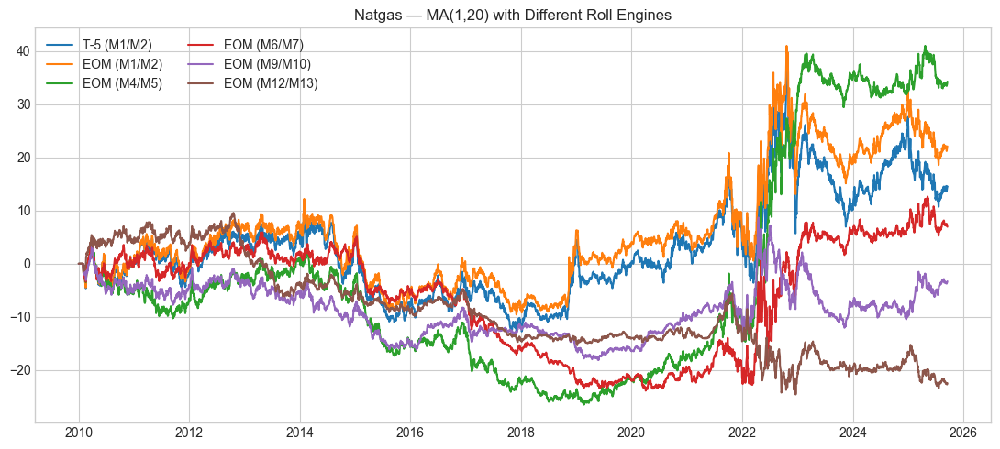

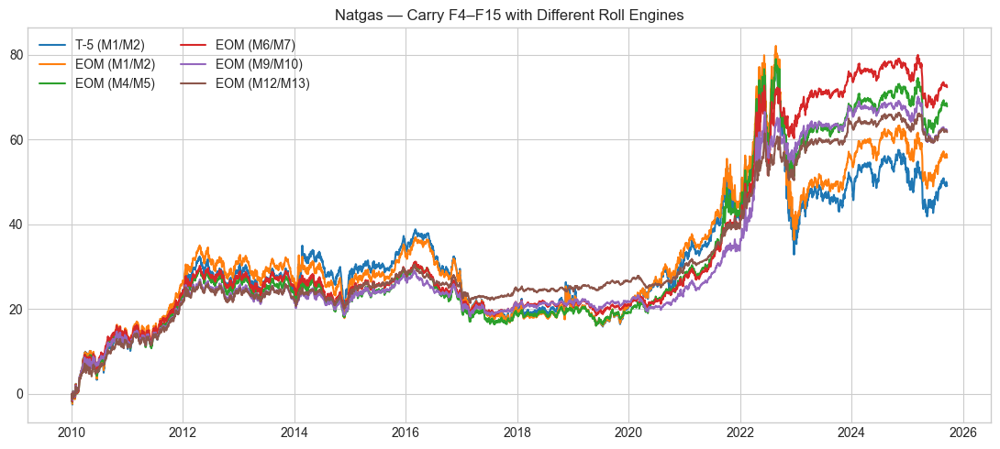

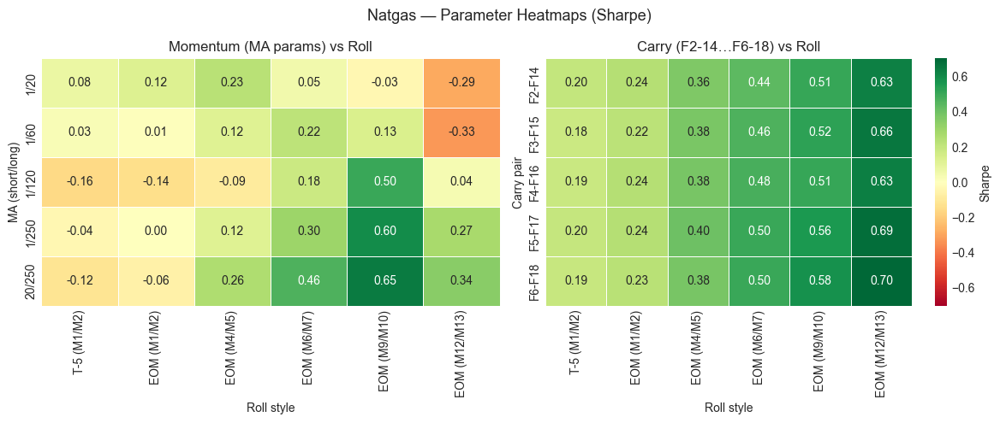

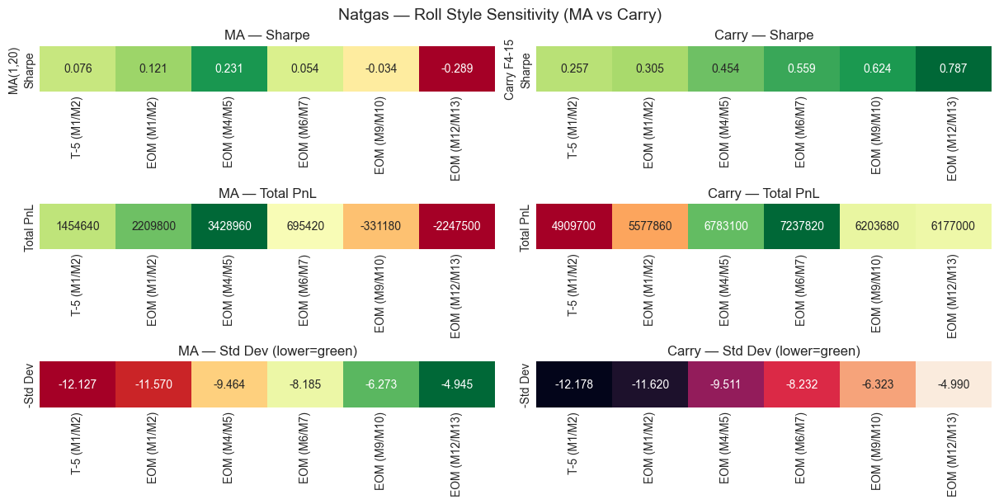

,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,,,,,,,,,
EOM (M1/M2),"-8,512,660.0000",-0.0000,-5.4150,-0.1142,11.6240,-0.4658,-0.8686,-6.2338,15.7205
EOM (M12/M13),"-2,006,800.0000",-0.0000,-1.2765,-0.0141,4.9975,-0.2554,-0.3542,-3.6037,15.7205
EOM (M4/M5),"-4,246,180.0000",-0.0000,-2.7010,-0.0345,9.5165,-0.2838,-0.4737,-5.7017,15.7205
EOM (M6/M7),"-2,438,320.0000",-0.0000,-1.5510,-0.0176,8.2386,-0.1883,-0.4298,-3.6090,15.7205
EOM (M9/M10),"-1,188,420.0000",-0.0000,-0.7560,-0.0080,6.3292,-0.1194,-0.3590,-2.1058,15.7205
T-5 (M1/M2),"-7,502,880.0000",-0.0000,-4.7727,-0.0845,12.1828,-0.3918,-0.7740,-6.1663,15.7205


,,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,strategy,,,,,,,,,
EOM (M1/M2),"MA(1,20)","2,209,800.0000",-0.0000,1.4057,0.0128,11.5700,0.1215,-0.1980,7.1006,15.7205
EOM (M12/M13),"MA(1,20)","-2,247,500.0000",-0.0000,-1.4297,-0.0161,4.9452,-0.2891,-0.3119,-4.5830,15.7205
EOM (M4/M5),"MA(1,20)","3,428,960.0000",-0.0000,2.1812,0.0189,9.4645,0.2305,-0.2997,7.2778,15.7205
EOM (M6/M7),"MA(1,20)","695,420.0000",-0.0000,0.4424,0.0043,8.1847,0.0540,-0.2815,1.5713,15.7205
EOM (M9/M10),"MA(1,20)","-331,180.0000",-0.0000,-0.2107,-0.0021,6.2734,-0.0336,-0.2055,-1.0252,15.7205
T-5 (M1/M2),"MA(1,20)","1,454,640.0000",-0.0000,0.9253,0.0087,12.1269,0.0763,-0.2269,4.0785,15.7205


,,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years
style,strategy,,,,,,,,,
EOM (M1/M2),Carry F4-15,"5,577,860.0000",-0.0000,3.5481,0.0286,11.6201,0.3053,-0.2514,14.1109,15.7205
EOM (M12/M13),Carry F4-15,"6,177,000.0000",-0.0000,3.9293,0.0311,4.9902,0.7874,-0.0694,56.6578,15.7205
EOM (M4/M5),Carry F4-15,"6,783,100.0000",-0.0000,4.3148,0.0335,9.5110,0.4537,-0.1545,27.9267,15.7205
EOM (M6/M7),Carry F4-15,"7,237,820.0000",-0.0000,4.6041,0.0352,8.2319,0.5593,-0.1224,37.6236,15.7205
EOM (M9/M10),Carry F4-15,"6,203,680.0000",-0.0000,3.9462,0.0312,6.3227,0.6241,-0.0843,46.8212,15.7205
T-5 (M1/M2),Carry F4-15,"4,909,700.0000",-0.0000,3.1231,0.0257,12.1780,0.2565,-0.2608,11.9770,15.7205


In [9]:
# ---------------------------------------------------------------------
# NATGAS Roll — T-5 M1/M2 + EOM M1/M2 + EOM M4/M5 + EOM M6/M7 + EOM M9/M10 + EOM M12/M13
# + MA / Carry parameter heatmaps (Natgas-specific)
# ---------------------------------------------------------------------
commodity_name = "Natgas"
ticker, contracts, units, t_cost = COMMODITIES[commodity_name]

prices = load_prices(commodity_name, ticker)
expiry_cal = load_expiry(ticker)

# Natgas-specific collectors
ng_roll_metrics_list  = []
ng_ma_metrics_list    = []
ng_carry_metrics_list = []

# --- 1) T-5, M1/M2 ---------------------------------------------------
ng_res_t5_m12 = rolling_pnl(
    prices,
    expiry_cal,
    front_col="F1",
    next_col="F2",
    roll_window=roll_window,
)
ng_res_t5_m12 = roll_EL(ng_res_t5_m12, prices, front_col="F1", t_cost=t_cost)

# --- 2) EOM midmonth, M1/M2 ------------------------------------------
ng_res_eom_m12 = roll_EOM_midmonth_expiry(
    prices,
    expiry_cal,
    front_col="F1",
    next_col="F2",
)
ng_res_eom_m12 = roll_EL(ng_res_eom_m12, prices, front_col="F1", t_cost=t_cost)

# --- 3) EOM midmonth, M4/M5 ------------------------------------------
ng_res_eom_m45 = roll_EOM_midmonth_expiry(
    prices,
    expiry_cal,
    front_col="F4",
    next_col="F5",
)
ng_res_eom_m45 = roll_EL(ng_res_eom_m45, prices, front_col="F4", t_cost=t_cost)

# --- 4) EOM midmonth, M6/M7 ------------------------------------------
ng_res_eom_m67 = roll_EOM_midmonth_expiry(
    prices,
    expiry_cal,
    front_col="F6",
    next_col="F7",
)
ng_res_eom_m67 = roll_EL(ng_res_eom_m67, prices, front_col="F6", t_cost=t_cost)

# --- 5) EOM midmonth, M9/M10 -----------------------------------------
ng_res_eom_m910 = roll_EOM_midmonth_expiry(
    prices,
    expiry_cal,
    front_col="F9",
    next_col="F10",
)
ng_res_eom_m910 = roll_EL(ng_res_eom_m910, prices, front_col="F9", t_cost=t_cost)

# --- 6) EOM midmonth, M12/M13 ----------------------------------------
ng_res_eom_m1213 = roll_EOM_midmonth_expiry(
    prices,
    expiry_cal,
    front_col="F12",
    next_col="F13",
)
ng_res_eom_m1213 = roll_EL(ng_res_eom_m1213, prices, front_col="F12", t_cost=t_cost)

# --- bundle for plotting / downstream strategies ---------------------
ng_roll_results = {
    "T-5 (M1/M2)":    ng_res_t5_m12,
    "EOM (M1/M2)":    ng_res_eom_m12,
    "EOM (M4/M5)":    ng_res_eom_m45,
    "EOM (M6/M7)":    ng_res_eom_m67,
    "EOM (M9/M10)":   ng_res_eom_m910,
    "EOM (M12/M13)":  ng_res_eom_m1213,
}

# keep front cols per style
ng_style_front_cols = {
    "T-5 (M1/M2)":   "F1",
    "EOM (M1/M2)":   "F1",
    "EOM (M4/M5)":   "F4",
    "EOM (M6/M7)":   "F6",
    "EOM (M9/M10)":  "F9",
    "EOM (M12/M13)": "F12",
}
ng_styles_order = list(ng_roll_results.keys())

# ---------------------------------------------------------------------
# 0. BASE ROLL CHART
# ---------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(11, 5))
palette = sns.color_palette("tab10", len(ng_roll_results))

for (label, df_res), color in zip(ng_roll_results.items(), palette):
    ax.plot(df_res.index, df_res["equity_line"], label=label, color=color)

ax.set_title("Natgas — Roll Styles (Full Sample)")
ax.legend(loc="best", ncol=2)
ax.grid(True)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------
# BASE ROLL METRICS (Natgas-only)
# ---------------------------------------------------------------------
for label, df_res in ng_roll_results.items():
    m = metrics(df_res, contracts=contracts, units=units)
    m["commodity"] = commodity_name
    m["style"] = label
    ng_roll_metrics_list.append(m)

# ---------------------------------------------------------------------
# 1. MA(1,20) ON TOP OF EACH ROLL VARIANT
# ---------------------------------------------------------------------
ng_ma_results = {}

for label, rolled_df in ng_roll_results.items():
    front_col_for_style = ng_style_front_cols[label]

    df_ma = momentum(
        prices=prices,
        rolled_df=rolled_df,
        front_col=front_col_for_style,
        short_ma=1,
        long_ma=20,
        t_cost=t_cost,
        epsilon=0.00,
    )
    ng_ma_results[label] = df_ma

    m_ma = metrics(df_ma, contracts=contracts, units=units)
    m_ma["commodity"] = commodity_name
    m_ma["style"] = label
    m_ma["strategy"] = "MA(1,20)"
    ng_ma_metrics_list.append(m_ma)

fig, ax = plt.subplots(figsize=(11, 5))
palette = sns.color_palette("tab10", len(ng_ma_results))

for (label, df_ma), color in zip(ng_ma_results.items(), palette):
    ax.plot(df_ma.index, df_ma["equity_line"], label=label, color=color)

ax.set_title("Natgas — MA(1,20) with Different Roll Engines")
ax.legend(loc="best", ncol=2)
ax.grid(True)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------
# 2. CARRY F4–F15 ON TOP OF EACH ROLL VARIANT
# ---------------------------------------------------------------------
ng_carry_results = {}

for label, rolled_df in ng_roll_results.items():
    if not {"F4", "F15"}.issubset(prices.columns):
        continue

    df_carry = carry(
        prices=prices,
        rolled_df=rolled_df,
        front_col="F4",
        end_col="F15",
        t_cost=t_cost,
        epsilon=0.00,
    )
    ng_carry_results[label] = df_carry

    m_c = metrics(df_carry, contracts=contracts, units=units)
    m_c["commodity"] = commodity_name
    m_c["style"] = label
    m_c["strategy"] = "Carry F4-15"
    ng_carry_metrics_list.append(m_c)

if ng_carry_results:
    fig, ax = plt.subplots(figsize=(11, 5))
    palette = sns.color_palette("tab10", len(ng_carry_results))

    for (label, df_carry), color in zip(ng_carry_results.items(), palette):
        ax.plot(df_carry.index, df_carry["equity_line"], label=label, color=color)

    ax.set_title("Natgas — Carry F4–F15 with Different Roll Engines")
    ax.legend(loc="best", ncol=2)
    ax.grid(True)
    plt.tight_layout()
    plt.show()

# ---------------------------------------------------------------------
# 3. PARAMETER HEATMAPS (MA grid, Carry grid) — Natgas-specific
# ---------------------------------------------------------------------
ng_ma_sharpes = pd.DataFrame(
    index=[f"{s}/{l}" for (s, l) in ma_params],
    columns=ng_styles_order,
    dtype=float,
)

for roll_name, rolled_df in ng_roll_results.items():
    front_col_for_style = ng_style_front_cols[roll_name]
    for (sma, lma) in ma_params:
        df_ma_param = momentum(
            prices=prices,
            rolled_df=rolled_df,
            front_col=front_col_for_style,
            short_ma=sma,
            long_ma=lma,
            t_cost=t_cost,
            epsilon=0.00,
        )
        rets = df_ma_param["equity_line"].diff().dropna()
        if rets.std() and not np.isnan(rets.std()) and rets.std() != 0:
            sh = rets.mean() / rets.std() * np.sqrt(252)
        else:
            sh = np.nan
        ng_ma_sharpes.loc[f"{sma}/{lma}", roll_name] = sh

ng_carry_sharpes = pd.DataFrame(
    index=[f"F{f1}-F{f2}" for (f1, f2) in carry_pairs],
    columns=ng_styles_order,
    dtype=float,
)

for roll_name, rolled_df in ng_roll_results.items():
    for (f1, f2) in carry_pairs:
        c1, c2 = f"F{f1}", f"F{f2}"
        if c1 not in prices.columns or c2 not in prices.columns:
            continue

        df_c_param = carry(
            prices=prices,
            rolled_df=rolled_df,
            front_col=c1,
            end_col=c2,
            t_cost=t_cost,
            epsilon=0.00,
        )
        rets = df_c_param["equity_line"].diff().dropna()
        if rets.std() and not np.isnan(rets.std()) and rets.std() != 0:
            sh = rets.mean() / rets.std() * np.sqrt(252)
        else:
            sh = np.nan
        ng_carry_sharpes.loc[f"F{f1}-F{f2}", roll_name] = sh

# symmetric color
all_vals = np.concatenate(
    [
        ng_ma_sharpes.to_numpy().flatten(),
        ng_carry_sharpes.to_numpy().flatten(),
    ]
)
all_vals = all_vals[~np.isnan(all_vals)]
vlim = float(np.max(np.abs(all_vals))) if len(all_vals) else 1.0

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle("Natgas — Parameter Heatmaps (Sharpe)", fontsize=13)

sns.heatmap(
    ng_ma_sharpes,
    ax=axes[0],
    annot=True,
    fmt=".2f",
    cmap="RdYlGn",
    center=0.0,
    vmin=-vlim,
    vmax=vlim,
    cbar=False,
    linewidths=0.5,
    linecolor="white",
)
axes[0].set_title("Momentum (MA params) vs Roll")
axes[0].set_xlabel("Roll style")
axes[0].set_ylabel("MA (short/long)")

sns.heatmap(
    ng_carry_sharpes,
    ax=axes[1],
    annot=True,
    fmt=".2f",
    cmap="RdYlGn",
    center=0.0,
    vmin=-vlim,
    vmax=vlim,
    cbar=True,
    cbar_kws={"label": "Sharpe"},
    linewidths=0.5,
    linecolor="white",
)
axes[1].set_title("Carry (F2-14…F6-18) vs Roll")
axes[1].set_xlabel("Roll style")
axes[1].set_ylabel("Carry pair")

plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------
# NATGAS — Roll Style Sensitivity (MA vs Carry)
# ---------------------------------------------------------------------
ng_styles_order = [
    "T-5 (M1/M2)",
    "EOM (M1/M2)",
    "EOM (M4/M5)",
    "EOM (M6/M7)",
    "EOM (M9/M10)",
    "EOM (M12/M13)",
]

# build dfs from Natgas-only lists
ng_roll_df  = pd.DataFrame(ng_roll_metrics_list).set_index(["commodity", "style"])
ng_ma_df    = pd.DataFrame(ng_ma_metrics_list).set_index(["commodity", "style", "strategy"])
if ng_carry_metrics_list:
    ng_carry_df = pd.DataFrame(ng_carry_metrics_list).set_index(["commodity", "style", "strategy"])
else:
    ng_carry_df = pd.DataFrame()

fig, axes = plt.subplots(
    nrows=3, ncols=2,
    figsize=(12, 6),
    constrained_layout=True
)
fig.suptitle("Natgas — Roll Style Sensitivity (MA vs Carry)", fontsize=14)

# MA slice
ng_ma_base   = ng_ma_df.loc[("Natgas", slice(None), "MA(1,20)")]
ng_ma_sharpe = ng_ma_base["Sharpe"].reindex(ng_styles_order)
ng_ma_pnl    = ng_ma_base["Total PnL"].reindex(ng_styles_order)
ng_ma_std    = ng_ma_base["Std Dev (ann.)"].reindex(ng_styles_order)

# MA — Sharpe
ax = axes[0, 0]
ma_sharpe_df = pd.DataFrame(
    [ng_ma_sharpe.values],
    index=["Sharpe"],
    columns=ng_styles_order,
)
sns.heatmap(
    ma_sharpe_df,
    ax=ax,
    annot=True,
    fmt=".3f",
    cmap="RdYlGn",
    center=0.0,
    cbar=False,
)
ax.set_ylabel("MA(1,20)")
ax.set_xlabel("")
ax.set_title("MA — Sharpe")

# MA — Total PnL
ax = axes[1, 0]
ma_pnl_df = pd.DataFrame(
    [ng_ma_pnl.values],
    index=["Total PnL"],
    columns=ng_styles_order,
)
vmin = ma_pnl_df.min().min()
vmax = ma_pnl_df.max().max()
sns.heatmap(
    ma_pnl_df,
    ax=ax,
    annot=True,
    fmt=".0f",
    cmap="RdYlGn",
    vmin=vmin,
    vmax=vmax,
    cbar=False,
)
ax.set_ylabel("")
ax.set_xlabel("")
ax.set_title("MA — Total PnL")

# MA — Std Dev (lower=green)
ax = axes[2, 0]
ma_std_df = pd.DataFrame(
    [(-ng_ma_std).values],
    index=["-Std Dev"],
    columns=ng_styles_order,
)
sns.heatmap(
    ma_std_df,
    ax=ax,
    annot=True,
    fmt=".3f",
    cmap="RdYlGn",
    cbar=False,
)
ax.set_ylabel("")
ax.set_xlabel("")
ax.set_title("MA — Std Dev (lower=green)")

# Carry slice (if any)
has_carry = not ng_carry_df.empty
if has_carry:
    ng_carry_base = ng_carry_df.loc[("Natgas", slice(None), "Carry F4-15")]
    ng_carry_sharpe = ng_carry_base["Sharpe"].reindex(ng_styles_order)
    ng_carry_pnl    = ng_carry_base["Total PnL"].reindex(ng_styles_order)
    ng_carry_std    = ng_carry_base["Std Dev (ann.)"].reindex(ng_styles_order)

    # Carry — Sharpe
    ax = axes[0, 1]
    carry_sharpe_df = pd.DataFrame(
        [ng_carry_sharpe.values],
        index=["Sharpe"],
        columns=ng_styles_order,
    )
    sns.heatmap(
        carry_sharpe_df,
        ax=ax,
        annot=True,
        fmt=".3f",
        cmap="RdYlGn",
        center=0.0,
        cbar=False,
    )
    ax.set_ylabel("Carry F4-15")
    ax.set_xlabel("")
    ax.set_title("Carry — Sharpe")

    # Carry — Total PnL
    ax = axes[1, 1]
    carry_pnl_df = pd.DataFrame(
        [ng_carry_pnl.values],
        index=["Total PnL"],
        columns=ng_styles_order,
    )
    vmin = carry_pnl_df.min().min()
    vmax = carry_pnl_df.max().max()
    sns.heatmap(
        carry_pnl_df,
        ax=ax,
        annot=True,
        fmt=".0f",
        cmap="RdYlGn",
        vmin=vmin,
        vmax=vmax,
        cbar=False,
    )
    ax.set_ylabel("")
    ax.set_xlabel("")
    ax.set_title("Carry — Total PnL")

    # Carry — Std Dev
    ax = axes[2, 1]
    carry_std_df = pd.DataFrame(
        [(-ng_carry_std).values],
        index=["-Std Dev"],
        columns=ng_styles_order,
    )
    sns.heatmap(
        carry_std_df,
        ax=ax,
        annot=True,
        fmt=".3f",
        cbar=False,
    )
    ax.set_ylabel("")
    ax.set_xlabel("")
    ax.set_title("Carry — Std Dev (lower=green)")
else:
    for r in range(3):
        axes[r, 1].axis("off")

plt.show()

# ---------------------------------------------------------------------
# FINAL: Natgas-only metrics tables
# ---------------------------------------------------------------------
ng_roll_metrics_df  = ng_roll_df.loc["Natgas"].sort_index()
ng_ma_metrics_df    = ng_ma_df.loc[("Natgas", slice(None), slice(None))].sort_index()
try:
    ng_carry_metrics_df = ng_carry_df.loc[("Natgas", slice(None), slice(None))].sort_index()
except KeyError:
    ng_carry_metrics_df = pd.DataFrame()

display(ng_roll_metrics_df)
display(ng_ma_metrics_df)
display(ng_carry_metrics_df)



## Proving Facts About Rolling

### % Contango vs Backwardation

# Strategy Accumulators
- Cut sample to start 2015
- All rolling nearest M EOM
- Get log returns
    - Normalize to USD/BBL
    - Allocate 20M to each long rolling PnL (removes negatives)
    - Take log

- Constant strategies chosen
    - MA: average of 20-120-250 corresponding to 1-month, 6 month, 1 year
    - EWMA: 20-60-120-180-250
    - Carry: F4-15 so we never use pre-roll data and benefit from deviating from early carry

### Roll Metrics Normalized

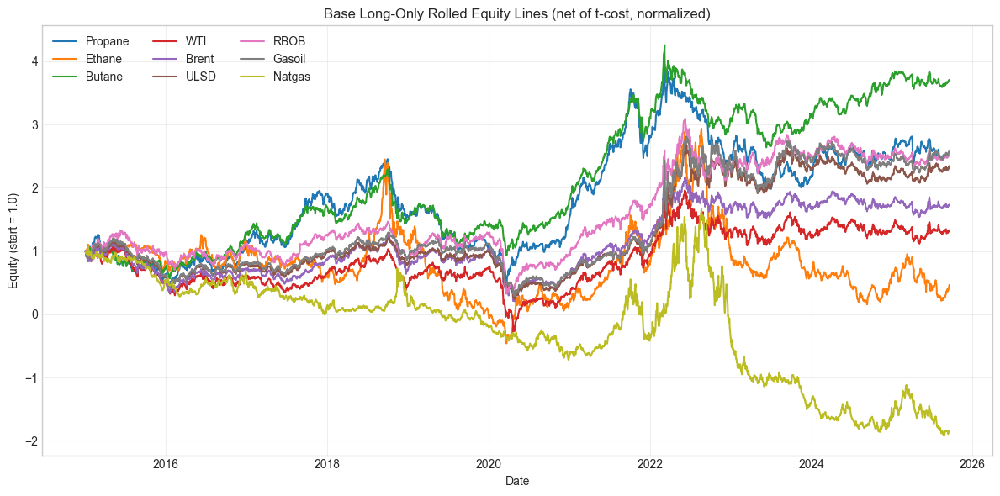

,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years,style
commodity,,,,,,,,,,
Propane,"3,136,056.0000",-0.0000,2.9268,0.0258,10.9326,0.2677,-0.3101,9.4373,10.7151,eom_ngl
Ethane,"-397,152.0000",-0.0000,-0.3706,-0.0038,5.2485,-0.0706,-0.1945,-1.9053,10.7151,eom_ngl
Butane,"7,620,858.0000",-0.0000,7.1123,0.0543,12.2828,0.5790,-0.2817,25.2464,10.7151,eom_ngl
WTI,"1,705,000.0000",-0.0000,1.5912,0.0148,24.5314,0.0649,-0.6903,2.3050,10.7151,eom_mid
Brent,"4,150,000.0000",-0.0000,3.8731,0.0329,24.1037,0.1607,-0.5252,7.3748,10.7151,eom_dynamic
ULSD,"9,917,040.0000",-0.0000,9.2552,0.0664,33.0501,0.2800,-0.6270,14.7604,10.7151,eom_eom
RBOB,"9,369,360.0000",-0.0000,8.7441,0.0636,29.2037,0.2994,-0.5477,15.9646,10.7151,eom_eom
Gasoil,"11,070,469.7987",-0.0000,10.3317,0.0720,34.7688,0.2972,-0.5881,17.5678,10.7151,eom_mid
Natgas,"-4,939,280.0000",-0.0000,-4.6097,-0.0616,12.7435,-0.3617,-0.5593,-8.2419,10.7151,eom_mid


In [10]:
START_DATE = "2015-01-01"

BASE_ROLL_STYLES = {
    "Propane": {"style": "eom_ngl",     "mid_col": "F3", "far_col": "F4"},
    "Ethane":  {"style": "eom_ngl",     "mid_col": "F3", "far_col": "F4"},
    "Butane":  {"style": "eom_ngl",     "mid_col": "F3", "far_col": "F4"},
    "WTI":     {"style": "eom_mid",     "front_col": "F1", "next_col": "F2"},
    "Brent":   {"style": "eom_dynamic", "front_col": "F1", "next_col": "F2", "third_col": "F3"},
    "ULSD":    {"style": "eom_eom",     "next_col": "F2", "third_col": "F3"},
    "RBOB":    {"style": "eom_eom",     "next_col": "F2", "third_col": "F3"},
    "Gasoil":  {"style": "eom_mid",     "front_col": "F1", "next_col": "F2"},
    "Natgas":  {"style": "eom_mid",     "front_col": "F1", "next_col": "F2"},
}
ALL_LONG_ROLL = {}
ALL_LONG_METRICS = []

for commodity, cfg in BASE_ROLL_STYLES.items():
    if commodity not in COMMODITIES:
        raise KeyError(f"{commodity} missing in COMMODITIES.")

    ticker, contracts, units, t_cost = COMMODITIES[commodity]

    prices = load_prices(commodity, ticker)
    prices = prices.loc[START_DATE:].sort_index()

    expiry_cal = load_expiry(ticker)

    style     = cfg["style"]
    front_col = cfg.get("front_col", "F1")
    next_col  = cfg.get("next_col", "F2")

    rs = RollingStrategy(
        prices=prices,
        expiry_calendar=expiry_cal,
        front_col=front_col,
        next_col=next_col,
    )

    if style == "eom_ngl":
        eq_df = rs.equity(
            style="eom_ngl",
            t_cost=t_cost,
            mid_col=cfg.get("mid_col", "F3"),
            far_col=cfg.get("far_col", "F4"),
        )
    elif style == "eom_mid":
        eq_df = rs.equity(style="eom_mid", t_cost=t_cost)
    elif style == "eom_dynamic":
        eq_df = rs.equity(
            style="eom_dynamic",
            t_cost=t_cost,
            third_col=cfg.get("third_col", "F3"),
        )
    elif style == "eom_eom":
        eq_df = rs.equity(
            style="eom_eom",
            t_cost=t_cost,
            third_col=cfg.get("third_col", "F3"),
        )
    else:
        raise ValueError(f"Unknown style '{style}' for {commodity}")

    eq_df = eq_df.loc[START_DATE:].sort_index().copy()

    if "equity_line" not in eq_df.columns:
        raise ValueError(f"'equity_line' missing for {commodity}'.")

    # --- canonical daily log returns from equity_line (net of t-cost) ---
    # only where equity_line and its lag are positive to avoid invalid logs
    ret_ratio = eq_df["equity_line"] / eq_df["equity_line"].shift(1)
    mask = (eq_df["equity_line"] > 0) & (eq_df["equity_line"].shift(1) > 0)
    eq_df["log_ret"] = np.nan
    eq_df.loc[mask, "log_ret"] = np.log(ret_ratio[mask])

    # tags
    eq_df["commodity"]    = commodity
    eq_df["ticker"]       = ticker
    eq_df["contracts"]    = contracts
    eq_df["units"]        = units
    eq_df["t_cost_param"] = t_cost
    eq_df["style"]        = style

    ALL_LONG_ROLL[commodity] = eq_df

    m = metrics(eq_df, contracts=contracts, units=units)
    if isinstance(m, pd.Series):
        m = m.to_dict()
    m["commodity"] = commodity
    m["style"] = style
    ALL_LONG_METRICS.append(m)

LONG_ROLL_METRICS = pd.DataFrame(ALL_LONG_METRICS).set_index("commodity")

# --- Comparable chart: same as original, just normalized equity_line ---
plt.figure(figsize=(12, 6))
for c, df in ALL_LONG_ROLL.items():
    base = df["equity_line"].iloc[0]
    plt.plot(df.index, df["equity_line"] / base, label=c)
plt.title("Base Long-Only Rolled Equity Lines (net of t-cost, normalized)")
plt.xlabel("Date")
plt.ylabel("Equity (start = 1.0)")
plt.grid(alpha=0.3)
plt.legend(ncol=3)
plt.tight_layout()
plt.show()

display(LONG_ROLL_METRICS)



### Log Roll

Worst cumulative PnL across commodities: -33
Suggested START_CAPITAL (with 5% buffer): 35



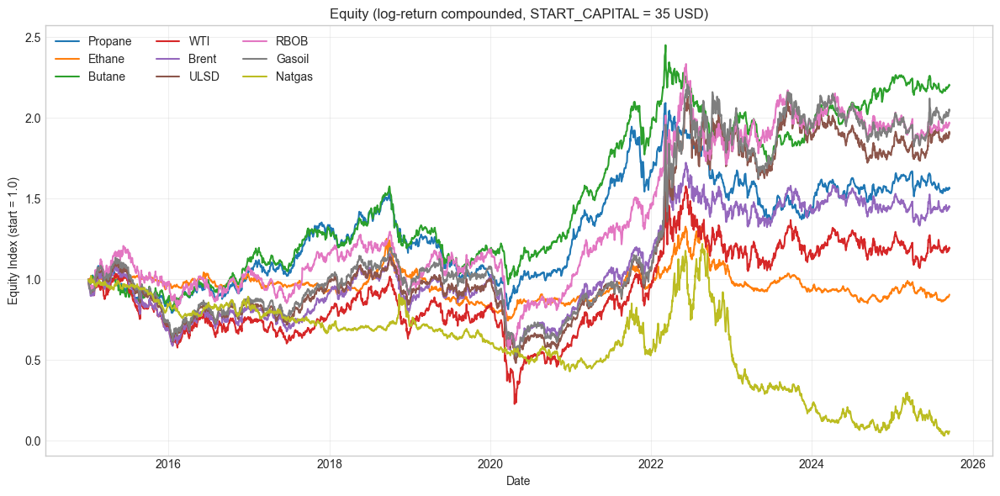

In [11]:
# =====================================================================
# Wrap all strategies in positive starting capital and log-return space
# =====================================================================

# 1) Find worst (most negative) cumulative PnL across all commodities
min_pnl = min(df["equity_line"].min() for df in ALL_LONG_ROLL.values())
START_CAPITAL = -min_pnl * 1.05  # +5% buffer

print(f"Worst cumulative PnL across commodities: {min_pnl:,.0f}")
print(f"Suggested START_CAPITAL (with 5% buffer): {START_CAPITAL:,.0f}\n")

# 2) Build wrapped equity and log-return series
for c, df in ALL_LONG_ROLL.items():
    eq = START_CAPITAL + df["equity_line"]
    df["equity_usd"] = eq

    # protect against non-positive values (shouldn't happen with 5% buffer)
    if (eq <= 0).any():
        bad_dates = eq[eq <= 0].index
        print(f"⚠️  {c} equity <= 0 on {len(bad_dates)} days — consider larger capital.")

    # log returns on positive equity
    df["log_ret"] = np.log(eq / eq.shift(1)).fillna(0.0)
    df["equity_index"] = np.exp(df["log_ret"].cumsum())

# 3) Plot normalized equity indices (start ≈ 1)
plt.figure(figsize=(12, 6))
for c, df in ALL_LONG_ROLL.items():
    plt.plot(df.index, df["equity_index"], label=c)

plt.title(f"Equity (log-return compounded, START_CAPITAL = {START_CAPITAL:,.0f} USD)")
plt.xlabel("Date")
plt.ylabel("Equity Index (start = 1.0)")
plt.grid(alpha=0.3)
plt.legend(ncol=3)
plt.tight_layout()
plt.show()


## Momentum

### MA 20

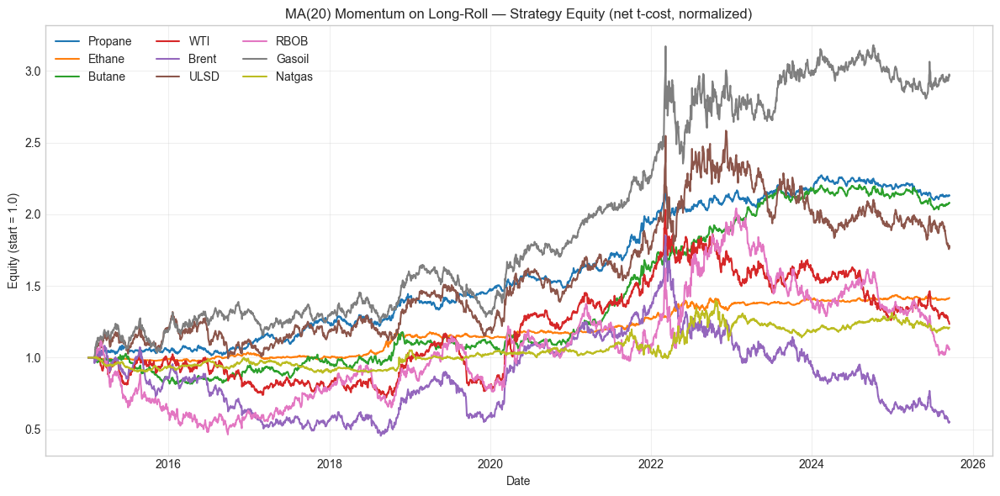

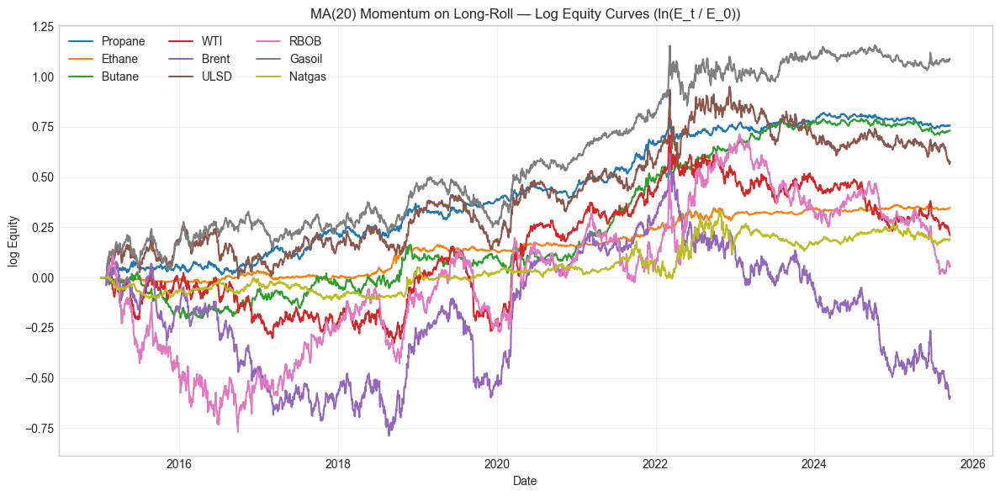

,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years,style,ma_window
commodity,,,,,,,,,,,
Propane,"11,295,564.0000",-0.0000,10.5418,0.0731,10.8854,0.9684,-0.0941,112.0785,10.7151,eom_ngl,20
Ethane,"4,167,744.0000",-0.0000,3.8896,0.0330,5.2366,0.7428,-0.0603,64.4948,10.7151,eom_ngl,20
Butane,"10,788,246.0000",-0.0000,10.0683,0.0707,12.2253,0.8236,-0.2072,48.5897,10.7151,eom_ngl,20
WTI,"2,344,000.0000",-0.0000,2.1876,0.0198,24.4111,0.0896,-0.3922,5.5783,10.7151,eom_mid,20
Brent,"-4,503,000.0000",-0.0000,-4.2025,-0.0543,24.0255,-0.1749,-0.7053,-5.9582,10.7151,eom_dynamic,20
ULSD,"7,668,780.0000",-0.0000,7.1570,0.0546,32.9875,0.2170,-0.3200,22.3666,10.7151,eom_eom,20
RBOB,"590,520.0000",-0.0000,0.5511,0.0054,29.1218,0.0189,-0.5848,0.9424,10.7151,eom_eom,20
Gasoil,"19,664,429.5302",-0.0000,18.3521,0.1068,34.7236,0.5285,-0.2581,71.1136,10.7151,eom_mid,20
Natgas,"2,099,600.0000",-0.0000,1.9595,0.0179,12.7078,0.1542,-0.1995,9.8208,10.7151,eom_mid,20


In [12]:
# =========================
# MA(20) Momentum on LONG ROLL — log-return account view
# Uses EXISTING momentum() + metrics()
# =========================

MA_WINDOW     = 20
INIT_CAPITAL  = 10_000_000  # arbitrary, just to make equity strictly positive

ALL_MA20      = {}
ALL_MA20_METRICS = []

for commodity, cfg in BASE_ROLL_STYLES.items():
    if commodity not in COMMODITIES:
        raise KeyError(f"{commodity} missing in COMMODITIES.")

    ticker, contracts, units, t_cost = COMMODITIES[commodity]

    # --- base prices & roll (already your existing logic) ---
    prices = load_prices(commodity, ticker, normalize=True)
    prices = prices.loc[START_DATE:].sort_index()
    expiry_cal = load_expiry(ticker)

    style     = cfg["style"]
    front_col = cfg.get("front_col", "F1")
    next_col  = cfg.get("next_col", "F2")

    rs = RollingStrategy(
        prices=prices,
        expiry_calendar=expiry_cal,
        front_col=front_col,
        next_col=next_col,
    )

    if style == "eom_ngl":
        rolled_df = rs.equity(
            style="eom_ngl",
            t_cost=t_cost,
            mid_col=cfg.get("mid_col", "F3"),
            far_col=cfg.get("far_col", "F4"),
        )
    elif style == "eom_mid":
        rolled_df = rs.equity(style="eom_mid", t_cost=t_cost)
    elif style == "eom_dynamic":
        rolled_df = rs.equity(
            style="eom_dynamic",
            t_cost=t_cost,
            third_col=cfg.get("third_col", "F3"),
        )
    elif style == "eom_eom":
        rolled_df = rs.equity(
            style="eom_eom",
            t_cost=t_cost,
            third_col=cfg.get("third_col", "F3"),
        )
    else:
        raise ValueError(f"Unknown style '{style}' for {commodity}")

    rolled_df = rolled_df.loc[START_DATE:].sort_index().copy()

    # safety: make sure required cols exist
    for col in ["daily_pnl", "t_cost", "roll_day_flag"]:
        if col not in rolled_df.columns:
            raise ValueError(f"'{col}' missing in rolled_df for {commodity}")

    # --- run EXISTING momentum engine on top of rolled_df ---
    mom_df = momentum(
        prices=prices,
        rolled_df=rolled_df,
        front_col=front_col,
        short_ma=1,
        long_ma=MA_WINDOW,
        t_cost=t_cost,
        epsilon=0.0,
        ma_pairs=None,          # using simple 1-20 MA like before
        weights=None,
    )

    # mom_df has: daily_pnl, t_cost, net_pnl, roll_flag, equity_line (cum net_pnl)
    if "net_pnl" not in mom_df.columns or "t_cost" not in mom_df.columns:
        raise ValueError(f"momentum() output missing columns for {commodity}")

        # ---------- Wrap into a trading account (correctly scaled) ----------
    # momentum() PnL is in the same units as rolled_df.daily_pnl
    # To be consistent with your other results, scale by contracts * units
    exposure = contracts * units  # one contract exposure; adjust if you want

    mom_df = mom_df.copy()
    mom_df["pnl_usd"] = mom_df["net_pnl"] * exposure

    mom_df["cum_pnl_usd"] = mom_df["pnl_usd"].cumsum()
    mom_df["equity_account"] = INIT_CAPITAL + mom_df["cum_pnl_usd"]

    # ---------- Daily log returns of the trading account ----------
    acc = mom_df["equity_account"]
    ret_ratio = acc / acc.shift(1)
    mask = (acc > 0) & (acc.shift(1) > 0)

    mom_df["log_ret"] = np.nan
    mom_df.loc[mask, "log_ret"] = np.log(ret_ratio[mask])

    # cumulative log-return = ln(E_t / E_0)
    mom_df["cum_log_ret"] = mom_df["log_ret"].cumsum()
    mom_df["log_equity_norm"] = mom_df["cum_log_ret"]

    # normalized linear equity (for comparison)
    mom_df["equity_norm"] = mom_df["equity_account"] / INIT_CAPITAL


    # ---------- Tag + store ----------
    mom_df["commodity"] = commodity
    mom_df["ticker"]    = ticker
    mom_df["style"]     = style
    mom_df["ma_window"] = MA_WINDOW

    ALL_MA20[commodity] = mom_df

    # ---------- Metrics using your existing metrics() ----------
    # metrics() expects net_pnl & t_cost; already there and in USD terms
    m = metrics(mom_df, contracts=contracts, units=units)
    if isinstance(m, pd.Series):
        m = m.to_dict()
    m["commodity"] = commodity
    m["style"]     = style
    m["ma_window"] = MA_WINDOW
    ALL_MA20_METRICS.append(m)

MA20_METRICS = pd.DataFrame(ALL_MA20_METRICS).set_index("commodity")

# ---------- Plots ----------

# 1) Normalized equity (linear)
plt.figure(figsize=(12, 6))
for c, df in ALL_MA20.items():
    plt.plot(df.index, df["equity_norm"], label=c)
plt.title(f"MA({MA_WINDOW}) Momentum on Long-Roll — Strategy Equity (net t-cost, normalized)")
plt.xlabel("Date")
plt.ylabel("Equity (start = 1.0)")
plt.grid(alpha=0.3)
plt.legend(ncol=3)
plt.tight_layout()
plt.show()

# 2) Logged curves: ln(E_t / E_0) = cumulative log-return of the account
plt.figure(figsize=(12, 6))
for c, df in ALL_MA20.items():
    plt.plot(df.index, df["log_equity_norm"], label=c)
plt.title(f"MA({MA_WINDOW}) Momentum on Long-Roll — Log Equity Curves (ln(E_t / E_0))")
plt.xlabel("Date")
plt.ylabel("log Equity")
plt.grid(alpha=0.3)
plt.legend(ncol=3)
plt.tight_layout()
plt.show()

display(MA20_METRICS)


### MA Average (1/20, 10/100, 20/250)

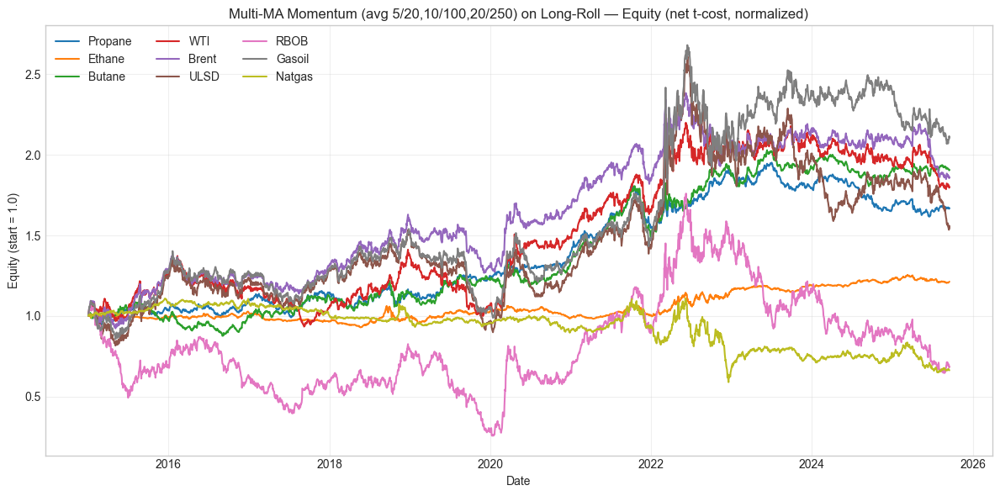

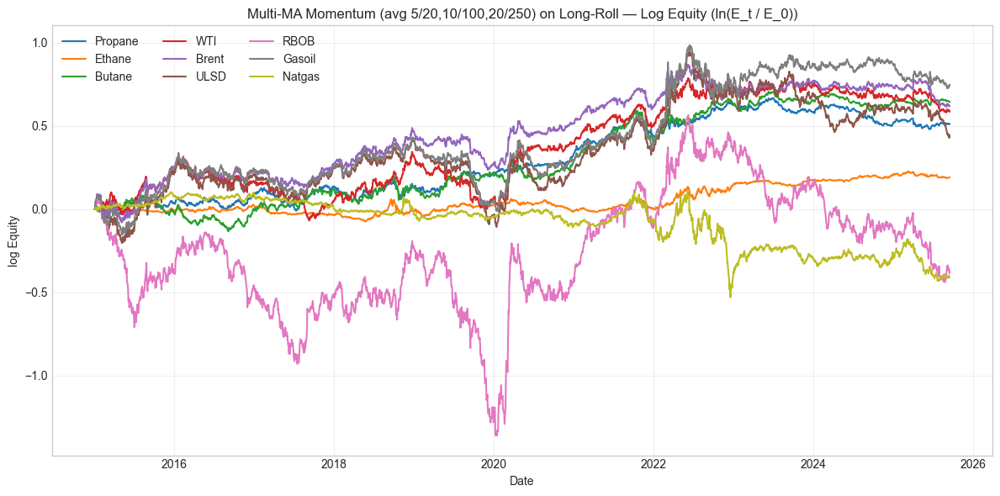

,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years,style,ma_spec
commodity,,,,,,,,,,,
Propane,"6,694,968.0000",-0.0000,6.2482,0.0490,10.9270,0.5718,-0.1718,36.3759,10.7151,eom_ngl,"avg(5/20,10/100,20/250)"
Ethane,"2,132,172.0000",-0.0000,1.9899,0.0182,5.2470,0.3792,-0.1003,19.8334,10.7151,eom_ngl,"avg(5/20,10/100,20/250)"
Butane,"9,064,566.0000",-0.0000,8.4596,0.0621,12.2794,0.6889,-0.2045,41.3678,10.7151,eom_ngl,"avg(5/20,10/100,20/250)"
WTI,"8,003,000.0000",-0.0000,7.4689,0.0564,24.5271,0.3045,-0.3196,23.3706,10.7151,eom_mid,"avg(5/20,10/100,20/250)"
Brent,"8,608,000.0000",-0.0000,8.0335,0.0597,24.0997,0.3333,-0.2242,35.8264,10.7151,eom_dynamic,"avg(5/20,10/100,20/250)"
ULSD,"5,452,440.0000",-0.0000,5.0886,0.0415,33.0537,0.1539,-0.4139,12.2938,10.7151,eom_eom,"avg(5/20,10/100,20/250)"
RBOB,"-3,150,000.0000",-0.0000,-2.9398,-0.0347,29.2083,-0.1006,-0.7604,-3.8659,10.7151,eom_eom,"avg(5/20,10/100,20/250)"
Gasoil,"11,070,469.7987",-0.0000,10.3317,0.0720,34.7688,0.2972,-0.3585,28.8170,10.7151,eom_mid,"avg(5/20,10/100,20/250)"
Natgas,"-3,374,440.0000",-0.0000,-3.1492,-0.0377,12.7453,-0.2471,-0.4691,-6.7135,10.7151,eom_mid,"avg(5/20,10/100,20/250)"


In [13]:
# ============================================================
# Multi-MA Momentum (avg of 5/20, 10/100, 20/250) on LONG ROLL
# Signals use full history; PnL sample starts at START_DATE
# ============================================================

INIT_CAPITAL = 10_000_000
MA_PAIRS     = [(1, 20), (5, 60), (20, 250)]
MA_WEIGHTS   = None  # equal weights inside momentum()

ALL_MA_MIX         = {}
ALL_MA_MIX_METRICS = []

for commodity, cfg in BASE_ROLL_STYLES.items():
    if commodity not in COMMODITIES:
        raise KeyError(f"{commodity} missing in COMMODITIES.")

    ticker, contracts, units, t_cost = COMMODITIES[commodity]

    # --- 1) Full prices for MA history ---
    prices_full = load_prices(commodity, ticker).sort_index()
    expiry_cal  = load_expiry(ticker)

    style     = cfg["style"]
    front_col = cfg.get("front_col", "F1")
    next_col  = cfg.get("next_col", "F2")

    # --- 2) Build rolled PnL on full history, then cut sample ---
    rs = RollingStrategy(
        prices=prices_full,
        expiry_calendar=expiry_cal,
        front_col=front_col,
        next_col=next_col,
    )

    if style == "eom_ngl":
        rolled_full = rs.equity(
            style="eom_ngl",
            t_cost=t_cost,
            mid_col=cfg.get("mid_col", "F3"),
            far_col=cfg.get("far_col", "F4"),
        )
    elif style == "eom_mid":
        rolled_full = rs.equity(style="eom_mid", t_cost=t_cost)
    elif style == "eom_dynamic":
        rolled_full = rs.equity(
            style="eom_dynamic",
            t_cost=t_cost,
            third_col=cfg.get("third_col", "F3"),
        )
    elif style == "eom_eom":
        rolled_full = rs.equity(
            style="eom_eom",
            t_cost=t_cost,
            third_col=cfg.get("third_col", "F3"),
        )
    else:
        raise ValueError(f"Unknown style '{style}' for {commodity}")

    rolled_df = rolled_full.loc[START_DATE:].sort_index().copy()

    for col in ["daily_pnl", "t_cost", "roll_day_flag"]:
        if col not in rolled_df.columns:
            raise ValueError(f"'{col}' missing in rolled_df for {commodity}")

    # --- 3) Multi-MA momentum
    # IMPORTANT: use prices_full so MAs exist BEFORE START_DATE
    mom_df = momentum(
        prices=prices_full,
        rolled_df=rolled_df,
        front_col=front_col,
        short_ma=1,     # ignored when ma_pairs provided
        long_ma=20,
        t_cost=t_cost,
        epsilon=0.0,
        ma_pairs=MA_PAIRS,
        weights=MA_WEIGHTS,
    )

    if "net_pnl" not in mom_df.columns or "t_cost" not in mom_df.columns:
        raise ValueError(f"momentum() output missing columns for {commodity}")

    # --- 4) Trading account (scaled) ---
    exposure = contracts * units

    mom_df = mom_df.copy()
    mom_df["pnl_usd"]       = mom_df["net_pnl"] * exposure
    mom_df["cum_pnl_usd"]   = mom_df["pnl_usd"].cumsum()
    mom_df["equity_account"] = INIT_CAPITAL + mom_df["cum_pnl_usd"]

    start_eq = mom_df["equity_account"].iloc[0]
    mom_df["equity_norm"] = mom_df["equity_account"] / start_eq

    pos_mask = mom_df["equity_norm"] > 0
    mom_df["log_equity_norm"] = np.nan
    mom_df.loc[pos_mask, "log_equity_norm"] = np.log(mom_df.loc[pos_mask, "equity_norm"])

    # --- 5) Tag + store ---
    mom_df["commodity"] = commodity
    mom_df["ticker"]    = ticker
    mom_df["style"]     = style
    mom_df["ma_spec"]   = "avg(5/20,10/100,20/250)"

    ALL_MA_MIX[commodity] = mom_df

    # --- 6) Metrics ---
    m = metrics(mom_df, contracts=contracts, units=units)
    if isinstance(m, pd.Series):
        m = m.to_dict()
    m["commodity"] = commodity
    m["style"]     = style
    m["ma_spec"]   = "avg(5/20,10/100,20/250)"
    ALL_MA_MIX_METRICS.append(m)

MA_MIX_METRICS = pd.DataFrame(ALL_MA_MIX_METRICS).set_index("commodity")

# --- 7) Plots ---

plt.figure(figsize=(12, 6))
for c, df in ALL_MA_MIX.items():
    plt.plot(df.index, df["equity_norm"], label=c)
plt.title("Multi-MA Momentum (avg 5/20,10/100,20/250) on Long-Roll — Equity (net t-cost, normalized)")
plt.xlabel("Date")
plt.ylabel("Equity (start = 1.0)")
plt.grid(alpha=0.3)
plt.legend(ncol=3)
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
for c, df in ALL_MA_MIX.items():
    plt.plot(df.index, df["log_equity_norm"], label=c)
plt.title("Multi-MA Momentum (avg 5/20,10/100,20/250) on Long-Roll — Log Equity (ln(E_t / E_0))")
plt.xlabel("Date")
plt.ylabel("log Equity")
plt.grid(alpha=0.3)
plt.legend(ncol=3)
plt.tight_layout()
plt.show()

display(MA_MIX_METRICS)


## Carry

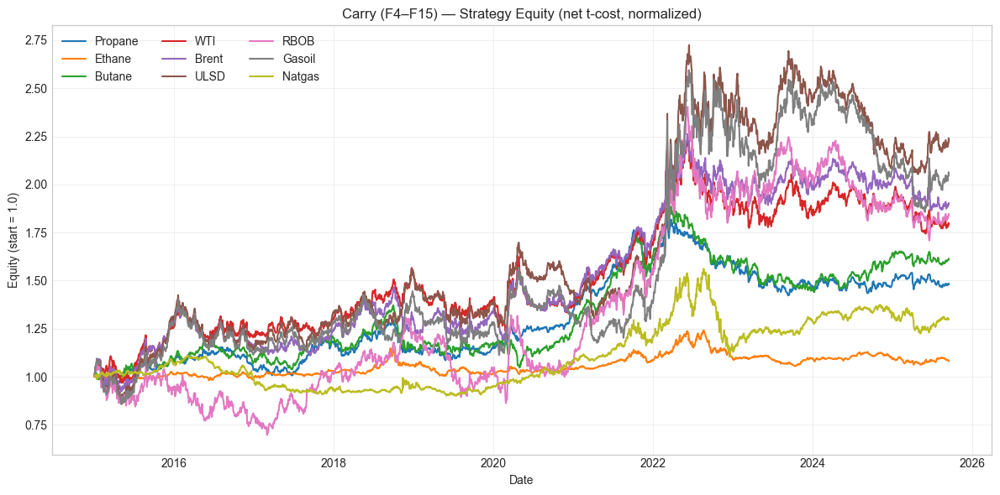

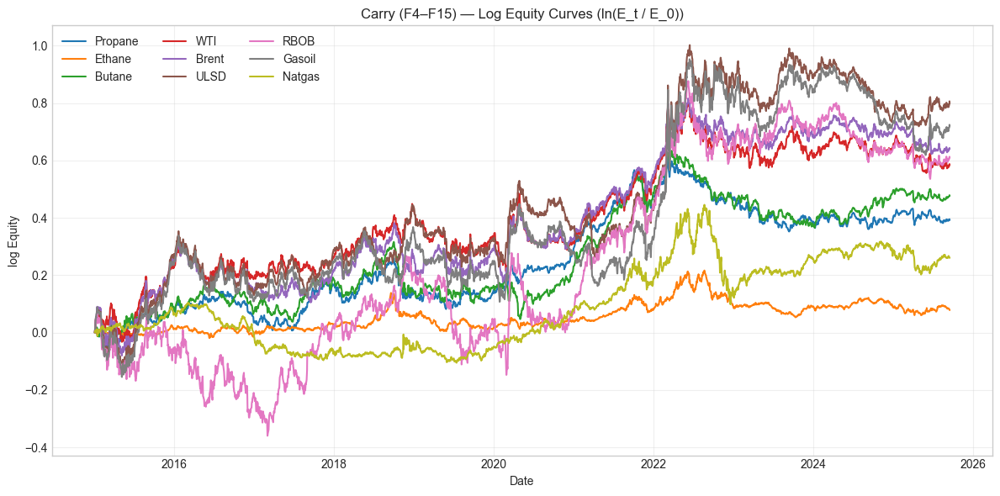

,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years,style
commodity,,,,,,,,,,
Propane,"4,809,252.0000",-0.0000,4.4883,0.0373,10.9208,0.4110,-0.2285,19.6421,10.7151,carry_F4_F15
Ethane,"813,624.0000",-0.0000,0.7593,0.0073,5.2445,0.1448,-0.1507,5.0390,10.7151,carry_F4_F15
Butane,"6,120,576.0000",-0.0000,5.7121,0.0456,12.2741,0.4654,-0.2618,21.8169,10.7151,carry_F4_F15
WTI,"7,952,000.0000",-0.0000,7.4213,0.0561,24.5219,0.3026,-0.2205,33.6615,10.7151,carry_F4_F15
Brent,"8,983,000.0000",-0.0000,8.3835,0.0616,24.0800,0.3482,-0.1951,42.9733,10.7151,carry_F4_F15
ULSD,"12,248,460.0000",-0.0000,11.4311,0.0775,33.0467,0.3459,-0.2466,46.3505,10.7151,carry_F4_F15
RBOB,"8,416,380.0000",-0.0000,7.8547,0.0586,29.2042,0.2690,-0.3475,22.6057,10.7151,carry_F4_F15
Gasoil,"10,546,979.8658",-0.0000,9.8431,0.0695,34.7361,0.2834,-0.2842,34.6369,10.7151,carry_F4_F15
Natgas,"2,975,400.0000",-0.0000,2.7768,0.0246,12.7388,0.2180,-0.2934,9.4657,10.7151,carry_F4_F15


In [14]:
# =====================================================================
# CARRY STRATEGY — F4 vs F15 across ALL commodities
# Uses existing carry() + metrics(), same pattern as MA(20) block
# =====================================================================

INIT_CAPITAL   = 10_000_000
CARRY_FRONT_COL = "F4"
CARRY_END_COL   = "F15"

ALL_CARRY = {}
ALL_CARRY_METRICS = []

for commodity, cfg in BASE_ROLL_STYLES.items():
    if commodity not in COMMODITIES:
        raise KeyError(f"{commodity} missing in COMMODITIES.")

    ticker, contracts, units, t_cost = COMMODITIES[commodity]

    # ---------- 1) Prices & expiry ----------
    prices = load_prices(commodity, ticker, normalize=True)
    prices = prices.loc[START_DATE:].sort_index()
    expiry_cal = load_expiry(ticker)

    style     = cfg["style"]
    front_col = cfg.get("front_col", "F1")
    next_col  = cfg.get("next_col", "F2")

    # ---------- 2) Base rolled_df: same as long-roll / momentum ----------
    rs = RollingStrategy(
        prices=prices,
        expiry_calendar=expiry_cal,
        front_col=front_col,
        next_col=next_col,
    )

    if style == "eom_ngl":
        rolled_df = rs.equity(
            style="eom_ngl",
            t_cost=t_cost,
            mid_col=cfg.get("mid_col", "F3"),
            far_col=cfg.get("far_col", "F4"),
        )
    elif style == "eom_mid":
        rolled_df = rs.equity(style="eom_mid", t_cost=t_cost)
    elif style == "eom_dynamic":
        rolled_df = rs.equity(
            style="eom_dynamic",
            t_cost=t_cost,
            third_col=cfg.get("third_col", "F3"),
        )
    elif style == "eom_eom":
        rolled_df = rs.equity(
            style="eom_eom",
            t_cost=t_cost,
            third_col=cfg.get("third_col", "F3"),
        )
    else:
        raise ValueError(f"Unknown style '{style}' for {commodity}")

    rolled_df = rolled_df.loc[START_DATE:].sort_index().copy()

    for col in ["daily_pnl", "t_cost", "roll_day_flag"]:
        if col not in rolled_df.columns:
            raise ValueError(f"'{col}' missing in rolled_df for {commodity}")

    # ---------- 3) Carry on F4 vs F15 using EXISTING carry() ----------
    carry_df = carry(
        prices=prices,
        rolled_df=rolled_df,
        front_col=CARRY_FRONT_COL,
        end_col=CARRY_END_COL,
        t_cost=t_cost,
        epsilon=0.0,
    )

    # carry_df now: daily_pnl, t_cost, net_pnl, roll_flag, equity_line (cum net_pnl in "per-unit" space)

    if "net_pnl" not in carry_df.columns or "t_cost" not in carry_df.columns:
        raise ValueError(f"carry() output missing columns for {commodity}")

    # ---------- 4) Trading account in USD ----------
    exposure = contracts * units  # 1 contract exposure, consistent with other blocks

    carry_df = carry_df.copy()
    carry_df["pnl_usd"]       = carry_df["net_pnl"] * exposure
    carry_df["cum_pnl_usd"]   = carry_df["pnl_usd"].cumsum()
    carry_df["equity_account"] = INIT_CAPITAL + carry_df["cum_pnl_usd"]

    # normalized equity: E_t / E_0
    start_equity = carry_df["equity_account"].iloc[0]
    carry_df["equity_norm"] = carry_df["equity_account"] / start_equity

    # log equity: ln(E_t / E_0)
    pos_mask = carry_df["equity_norm"] > 0
    carry_df["log_equity_norm"] = np.nan
    carry_df.loc[pos_mask, "log_equity_norm"] = np.log(carry_df.loc[pos_mask, "equity_norm"])

    # ---------- 5) Tag + store ----------
    carry_df["commodity"] = commodity
    carry_df["ticker"]    = ticker
    carry_df["style"]     = f"carry_{CARRY_FRONT_COL}_{CARRY_END_COL}"

    ALL_CARRY[commodity] = carry_df

    # ---------- 6) Metrics using existing metrics() ----------
    # metrics() uses net_pnl and t_cost already present (pre-scaling),
    # so we pass original contracts/units for consistency
    m = metrics(carry_df, contracts=contracts, units=units)
    if isinstance(m, pd.Series):
        m = m.to_dict()
    m["commodity"] = commodity
    m["style"]     = f"carry_{CARRY_FRONT_COL}_{CARRY_END_COL}"
    ALL_CARRY_METRICS.append(m)

CARRY_METRICS = pd.DataFrame(ALL_CARRY_METRICS).set_index("commodity")

# ---------- 7) Plots ----------

# Linear normalized equity
plt.figure(figsize=(12, 6))
for c, df in ALL_CARRY.items():
    plt.plot(df.index, df["equity_norm"], label=c)
plt.title(f"Carry ({CARRY_FRONT_COL}–{CARRY_END_COL}) — Strategy Equity (net t-cost, normalized)")
plt.xlabel("Date")
plt.ylabel("Equity (start = 1.0)")
plt.grid(alpha=0.3)
plt.legend(ncol=3)
plt.tight_layout()
plt.show()

# Log equity curves
plt.figure(figsize=(12, 6))
for c, df in ALL_CARRY.items():
    plt.plot(df.index, df["log_equity_norm"], label=c)
plt.title(f"Carry ({CARRY_FRONT_COL}–{CARRY_END_COL}) — Log Equity Curves (ln(E_t / E_0))")
plt.xlabel("Date")
plt.ylabel("log Equity")
plt.grid(alpha=0.3)
plt.legend(ncol=3)
plt.tight_layout()
plt.show()

display(CARRY_METRICS)



## Value
- 5 year MA
- 2% threshold

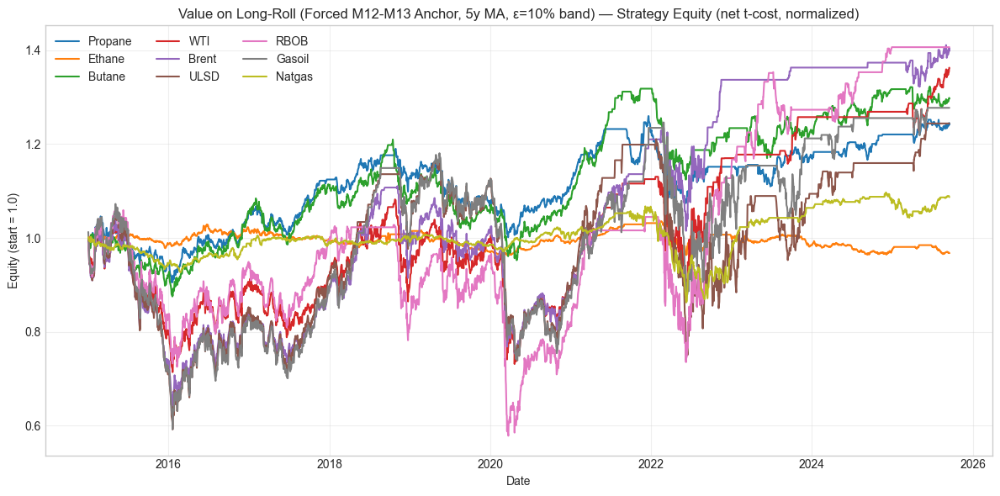

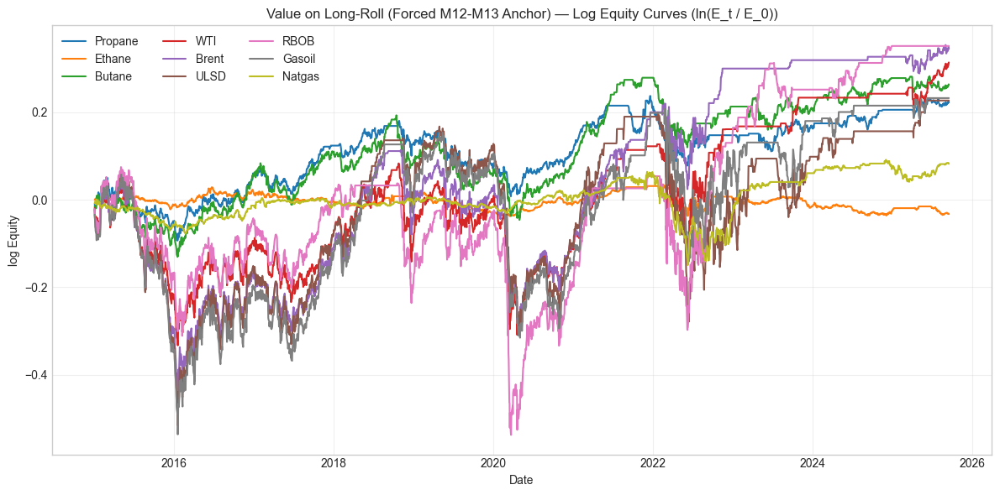

,Total PnL,Total Cost,APL/unit (ann.),CAGR,Std Dev (ann.),Sharpe,Drawdown,RoD,Years,style,ma_window,vol_window,eps_band
commodity,,,,,,,,,,,,,
Propane,"2,414,034.0000",-0.0000,2.2529,0.0210,7.1786,0.3138,-0.1584,14.2191,10.7151,M12-M13_EOM,3780,252,0.1000
Ethane,"-322,518.0000",-0.0000,-0.3010,-0.0031,2.6299,-0.1145,-0.0695,-4.3338,10.7151,M12-M13_EOM,3780,252,0.1000
Butane,"2,968,518.0000",-0.0000,2.7704,0.0248,8.4481,0.3279,-0.2126,13.0331,10.7151,M12-M13_EOM,3780,252,0.1000
WTI,"3,625,000.0000",-0.0000,3.3831,0.0297,14.6596,0.2308,-0.3241,10.4396,10.7151,M12-M13_EOM,3780,252,0.1000
Brent,"3,987,000.0000",-0.0000,3.7209,0.0327,14.9615,0.2487,-0.3902,9.5358,10.7151,M12-M13_EOM,3780,252,0.1000
ULSD,"2,438,940.0000",-0.0000,2.2762,0.0214,18.2019,0.1251,-0.4405,5.1671,10.7151,M12-M13_EOM,3780,252,0.1000
RBOB,"4,063,920.0000",-0.0000,3.7927,0.0333,16.7823,0.2260,-0.4575,8.2907,10.7151,M12-M13_EOM,3780,252,0.1000
Gasoil,"2,771,812.0805",-0.0000,2.5868,0.0219,17.5702,0.1472,-0.4474,5.7815,10.7151,M12-M13_EOM,3780,252,0.1000
Natgas,"870,580.0000",-0.0000,0.8125,0.0077,4.5916,0.1769,-0.1918,4.2356,10.7151,M12-M13_EOM,3780,252,0.1000


In [15]:
# =========================
# 5y Value on LONG ROLL (M12-M13 anchor)
# =========================

VALUE_MA_WINDOW   = 252 * 15        # ~5y mean
VALUE_VOL_WINDOW  = 252             # kept for signature compat (ignored in band)
VALUE_EPS_BAND    = 0.10           # 15% deviation band (fairly large)
INIT_CAPITAL      = 10_000_000

HIST_START        = "2010-01-01"   # for building MA/vol
TRADE_START       = START_DATE     # e.g. "2015-01-01"

ALL_VALUE         = {}
ALL_VALUE_METRICS = []

for commodity, cfg in BASE_ROLL_STYLES.items():
    if commodity not in COMMODITIES:
        raise KeyError(f"{commodity} missing in COMMODITIES.")

    ticker, contracts, units, t_cost = COMMODITIES[commodity]

    # --- load FULL history ---
    prices_full = load_prices(commodity, ticker, normalize=True)
    prices_full = prices_full.loc[HIST_START:].sort_index()
    expiry_cal  = load_expiry(ticker)

    cols = prices_full.columns

    # ======================================================
    # FORCE LONG ROLL: try M12/M13 for ALL commodities
    # (with safe fallbacks if strips are short)
    # ======================================================
    if "F12" in cols and "F13" in cols:
        roll_front = "F12"
        roll_next  = "F13"
        style_tag  = "M12-M13_EOM"
    elif "F12" in cols:
        # fall back to F12-only if no F13
        roll_front = "F12"
        roll_next  = "F12"
        style_tag  = "F12_only_EOM"
    elif "F13" in cols:
        # fall back to F13-only if no F12
        roll_front = "F13"
        roll_next  = "F13"
        style_tag  = "F13_only_EOM"
    else:
        # if truly no long-dated, fall back to original config
        roll_front = cfg.get("front_col", "F1")
        roll_next  = cfg.get("next_col", "F2")
        style_tag  = f"FALLBACK_{roll_front}_{roll_next}_EOM"

    rs = RollingStrategy(
        prices=prices_full,
        expiry_calendar=expiry_cal,
        front_col=roll_front,
        next_col=roll_next,
    )

    # Use uniform EOM mid logic on the forced long tenors
    rolled_full = rs.equity(style="eom_mid", t_cost=t_cost)
    rolled_full = rolled_full.sort_index()

    # safety
    for col in ["daily_pnl", "t_cost", "roll_day_flag"]:
        if col not in rolled_full.columns:
            raise ValueError(f"'{col}' missing in rolled_df for {commodity}")

    # --- build M12-M13-based VALUE anchor ---
    if "F12" in cols and "F13" in cols:
        prices_full["VAL_ANCHOR"] = 0.5 * (
            prices_full["F12"].astype(float) + prices_full["F13"].astype(float)
        )
    elif "F12" in cols:
        prices_full["VAL_ANCHOR"] = prices_full["F12"].astype(float)
    elif "F13" in cols:
        prices_full["VAL_ANCHOR"] = prices_full["F13"].astype(float)
    else:
        # if no long-dated, fall back to the actual roll_front we used
        prices_full["VAL_ANCHOR"] = prices_full[roll_front].astype(float)

    # --- run VALUE on FULL history using VAL_ANCHOR ---
    val_full = value(
        prices=prices_full,
        rolled_df=rolled_full,
        front_col="VAL_ANCHOR",
        long_ma=VALUE_MA_WINDOW,
        vol_window=VALUE_VOL_WINDOW,        # kept for compat; ignored inside
        epsilon_factor=VALUE_EPS_BAND,      # NOW: % deviation band (e.g. 0.15 = 15%)
        t_cost=t_cost,
    )

    # restrict to trading window
    val_df = val_full.loc[TRADE_START:].copy()

    # ---------- Wrap into trading account ----------
    exposure = contracts * units

    val_df["pnl_usd"]        = val_df["net_pnl"] * exposure
    val_df["cum_pnl_usd"]    = val_df["pnl_usd"].cumsum()
    val_df["equity_account"] = INIT_CAPITAL + val_df["cum_pnl_usd"]

    acc       = val_df["equity_account"]
    ret_ratio = acc / acc.shift(1)
    mask      = (acc > 0) & (acc.shift(1) > 0)

    val_df["log_ret"]           = np.nan
    val_df.loc[mask, "log_ret"] = np.log(ret_ratio[mask])
    val_df["cum_log_ret"]       = val_df["log_ret"].cumsum()
    val_df["log_equity_norm"]   = val_df["cum_log_ret"]
    val_df["equity_norm"]       = val_df["equity_account"] / INIT_CAPITAL

    # ---------- Tag + store ----------
    val_df["commodity"]   = commodity
    val_df["ticker"]      = ticker
    val_df["style"]       = style_tag
    val_df["ma_window"]   = VALUE_MA_WINDOW
    val_df["vol_window"]  = VALUE_VOL_WINDOW
    val_df["eps_band"]    = VALUE_EPS_BAND   # 0.15 = 15%

    ALL_VALUE[commodity] = val_df

    # ---------- Metrics ----------
    m = metrics(val_df, contracts=contracts, units=units)
    if isinstance(m, pd.Series):
        m = m.to_dict()
    m["commodity"]  = commodity
    m["style"]      = style_tag
    m["ma_window"]  = VALUE_MA_WINDOW
    m["vol_window"] = VALUE_VOL_WINDOW
    m["eps_band"]   = VALUE_EPS_BAND
    ALL_VALUE_METRICS.append(m)

VALUE_METRICS = pd.DataFrame(ALL_VALUE_METRICS).set_index("commodity")

# ---------- Plots ----------

plt.figure(figsize=(12, 6))
for c, df in ALL_VALUE.items():
    plt.plot(df.index, df["equity_norm"], label=c)
plt.title(
    f"Value on Long-Roll (Forced M12-M13 Anchor, 5y MA, ε={VALUE_EPS_BAND*100:.0f}% band) — "
    "Strategy Equity (net t-cost, normalized)"
)
plt.xlabel("Date")
plt.ylabel("Equity (start = 1.0)")
plt.grid(alpha=0.3)
plt.legend(ncol=3)
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
for c, df in ALL_VALUE.items():
    plt.plot(df.index, df["log_equity_norm"], label=c)
plt.title(
    "Value on Long-Roll (Forced M12-M13 Anchor) — Log Equity Curves (ln(E_t / E_0))"
)
plt.xlabel("Date")
plt.ylabel("log Equity")
plt.grid(alpha=0.3)
plt.legend(ncol=3)
plt.tight_layout()
plt.show()

display(VALUE_METRICS)



### Value Param Gird Search

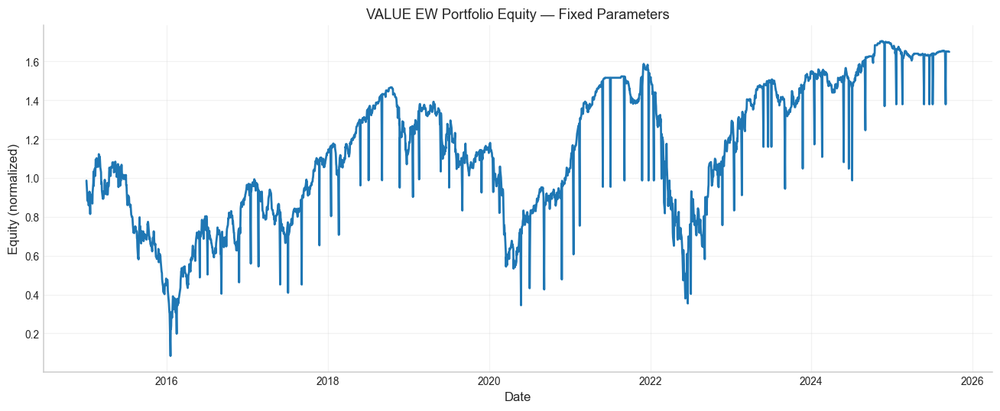

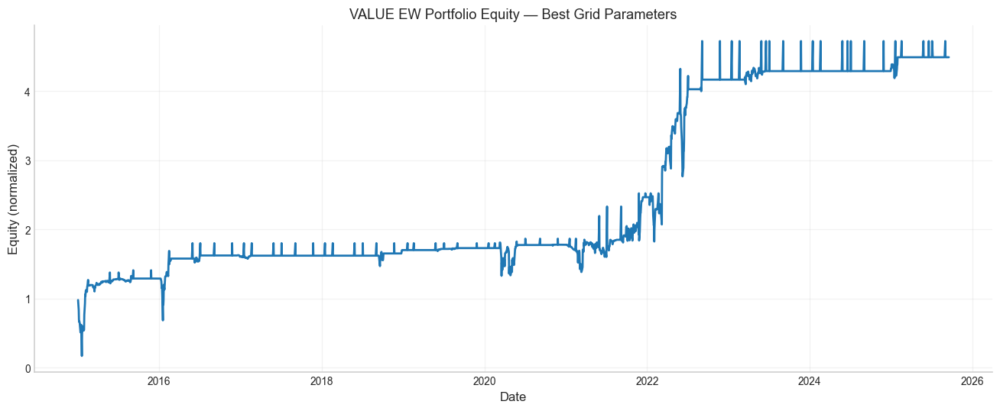

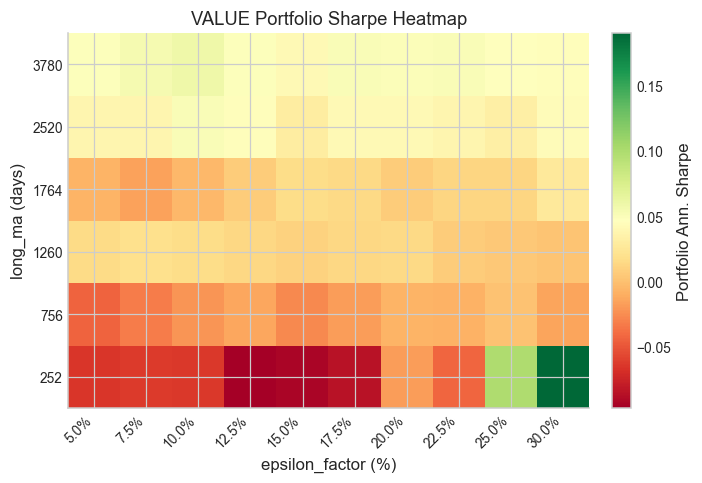

,best_long_ma,best_eps,best_Sharpe
Propane,3780,0.1250,0.1922
Ethane,3780,0.2250,0.2030
Butane,3780,0.1500,0.1546
WTI,252,0.3000,0.1297
Brent,252,0.3000,0.1871
ULSD,252,0.3000,0.1426
RBOB,3780,0.3000,0.1340
Gasoil,3780,0.1750,0.0831
Natgas,3780,0.2000,0.2150


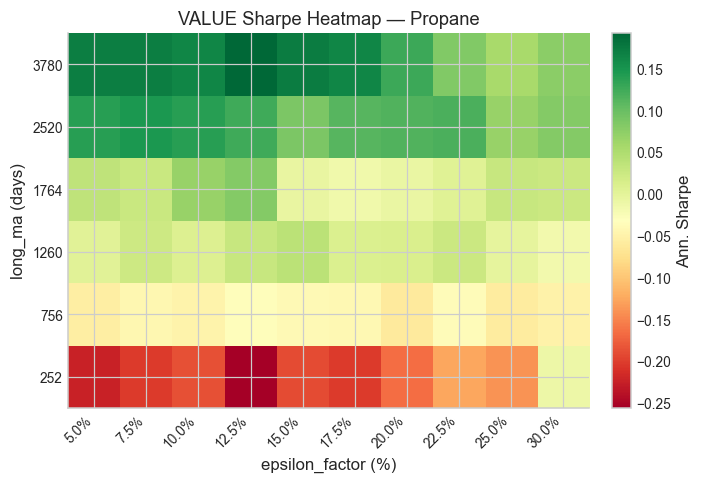

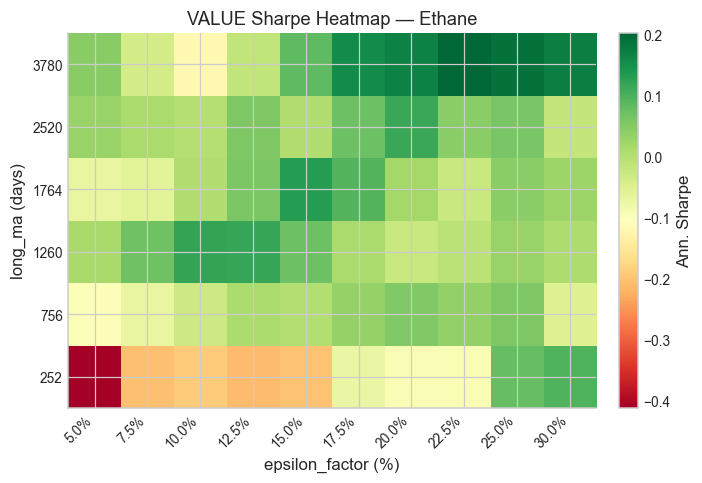

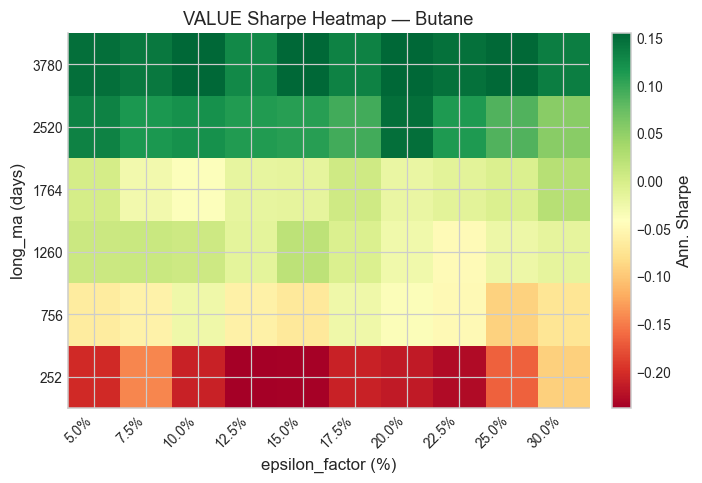

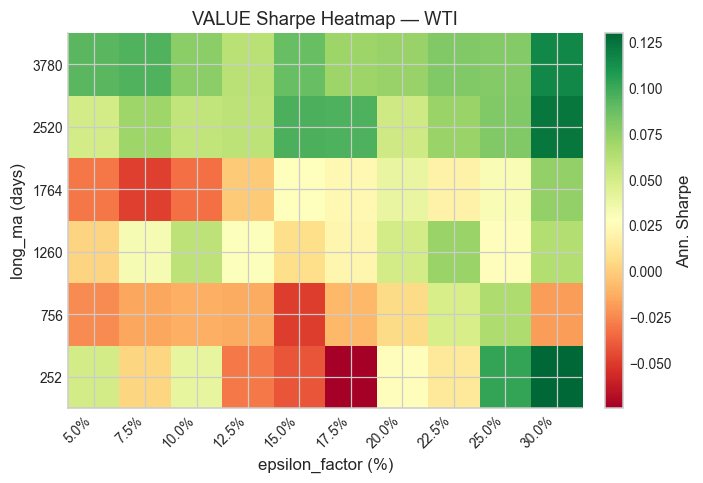

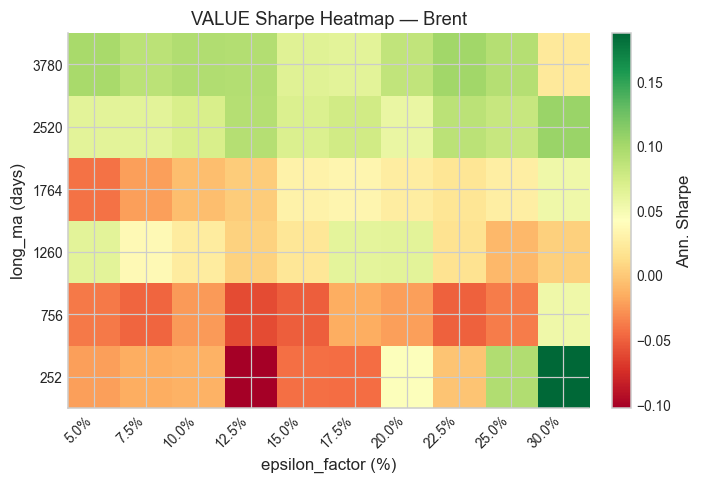

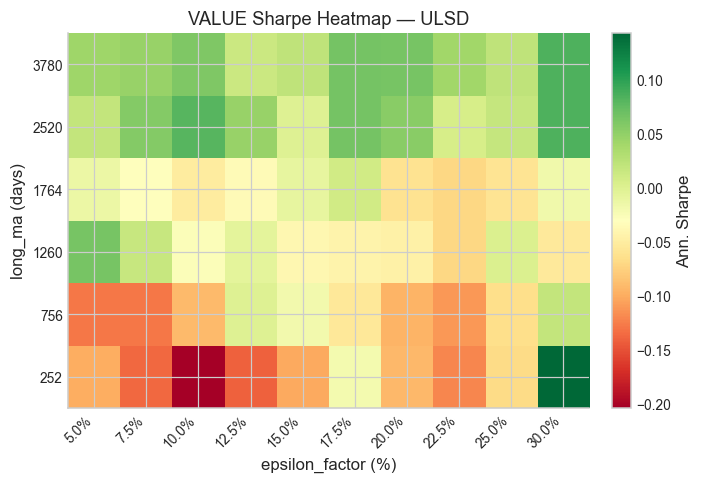

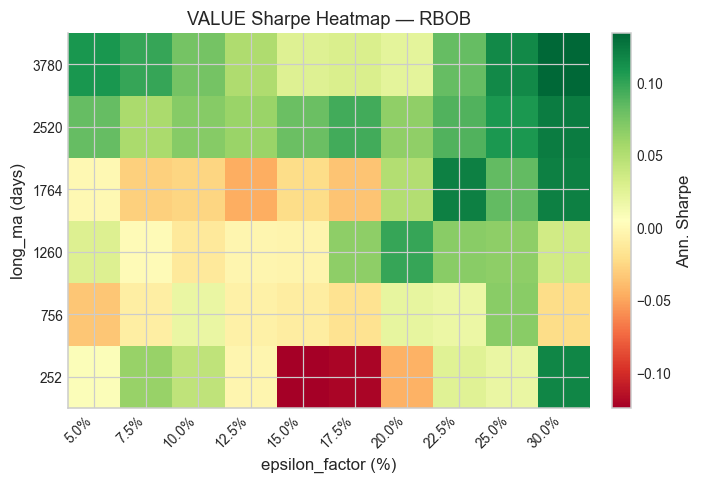

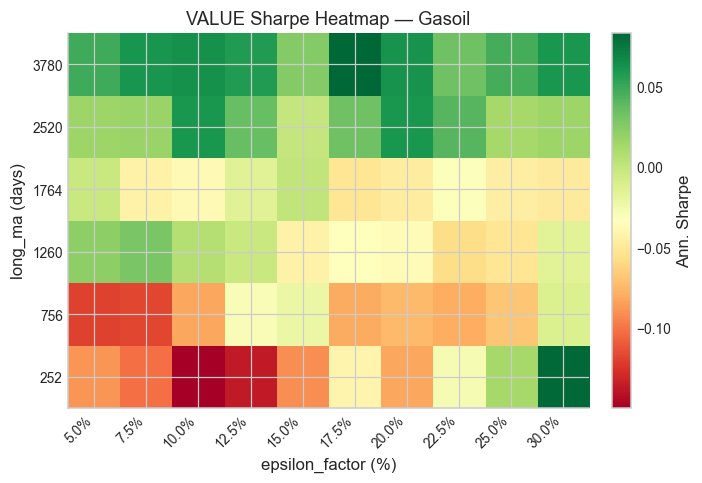

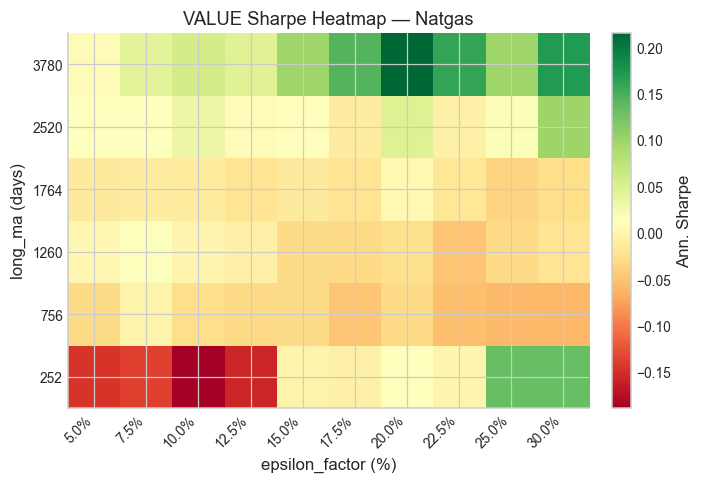

In [16]:
# ============================================
# VALUE (M12-M13 Anchor) — GRID + EW PORTFOLIO
# Scaled to log-return trading accounts
# ============================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Optional: mild global styling (can remove if you prefer defaults)
plt.rcParams.update({
    "figure.dpi": 110,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
})

VALUE_VOL_WINDOW = 252            # kept for signature compat (ignored in band)
HIST_START       = "2010-01-01"   # build MA from here
TRADE_START      = START_DATE     # e.g. "2015-01-01"

# Grid over long_MA windows & epsilon_factor (now = % deviation band)
LOOKBACK_GRID = [
    252,          # 1y
    252 * 3,      # 3y
    252 * 5,      # 5y
    252 * 7,      # 7y
    252 * 10,     # 10y
    252 * 15,     # 15y
]

# epsilon_factor is interpreted as a % band: 0.10 = 10%, etc.
EPS_GRID = [
    0.05,   # 5%
    0.075,  # 7.5%
    0.10,   # 10%
    0.125,  # 12.5%
    0.15,   # 15%
    0.175,  # 17.5%
    0.20,   # 20%
    0.225,  # 22.5%
    0.25,   # 25%
    0.30,   # 30%
]

# Fixed parameter combo we want to spotlight
TARGET_LONG = 252 * 10   # 2520 trading days
TARGET_EPS  = 0.15       # 15% band

# Storage
PREP_VAL_INPUTS = {}   # commodity -> dict(prices_full, rolled_full, t_cost, exposure)
COMMODITY_LIST  = []


def _annualized_sharpe(log_ret: pd.Series, min_obs: int = 60) -> float:
    """Annualized Sharpe from daily log returns."""
    lr = log_ret.replace([np.inf, -np.inf], np.nan).dropna()
    if lr.size < min_obs:
        return np.nan
    vol = lr.std()
    if vol == 0 or np.isnan(vol):
        return np.nan
    return (lr.mean() / vol) * np.sqrt(252)


def _scale_pnl_to_log_equity(pnl: pd.Series) -> tuple[pd.Series, pd.Series]:
    """
    Turn a PnL series into a positive, log-able equity curve.

      1) cum_pnl = cumsum(pnl)
      2) A = 1.05 * max(|min cum_pnl|, 1)   # ensure equity > 0
      3) equity = A + cum_pnl
      4) eq_norm = equity / A
      5) log_ret = ln(eq_norm / eq_norm.shift(1))

    Returns:
        eq_norm : normalized equity curve (start ~1)
        log_ret : daily log returns from that equity
    """
    cum_pnl = pnl.cumsum()
    if cum_pnl.empty:
        return (
            pd.Series(dtype=float, index=pnl.index),
            pd.Series(dtype=float, index=pnl.index),
        )

    min_cum = cum_pnl.min()
    A = 1.05 * max(abs(min_cum), 1.0)

    equity = (A + cum_pnl).clip(lower=1e-9)
    eq_norm = equity / A

    ret_ratio = eq_norm / eq_norm.shift(1)
    log_ret = np.log(ret_ratio.replace([np.inf, -np.inf], np.nan))

    return eq_norm, log_ret


# ============================================
# 1) Pre-compute roll + VAL_ANCHOR per commodity
# ============================================

for commodity, cfg in BASE_ROLL_STYLES.items():
    if commodity not in COMMODITIES:
        raise KeyError(f"{commodity} missing in COMMODITIES.")

    ticker, contracts, units, t_cost = COMMODITIES[commodity]

    prices_full = load_prices(commodity, ticker, normalize=True)
    prices_full = prices_full.loc[HIST_START:].sort_index()
    if prices_full.empty:
        print(f"[WARN] No prices for {commodity}, skipping.")
        continue

    expiry_cal = load_expiry(ticker)
    cols = prices_full.columns

    # ----- Force long roll on M12/M13 (with fallbacks) -----
    if "F12" in cols and "F13" in cols:
        roll_front = "F12"
        roll_next  = "F13"
    elif "F12" in cols:
        roll_front = "F12"
        roll_next  = "F12"
    elif "F13" in cols:
        roll_front = "F13"
        roll_next  = "F13"
    else:
        roll_front = cfg.get("front_col", "F1")
        roll_next  = cfg.get("next_col", "F2")

    rs = RollingStrategy(
        prices=prices_full,
        expiry_calendar=expiry_cal,
        front_col=roll_front,
        next_col=roll_next,
    )

    rolled_full = rs.equity(style="eom_mid", t_cost=t_cost).sort_index()

    # Safety
    for col in ["daily_pnl", "t_cost", "roll_day_flag"]:
        if col not in rolled_full.columns:
            raise ValueError(f"'{col}' missing in rolled_df for {commodity}")

    # ----- Build VAL_ANCHOR from long tenors -----
    if "F12" in cols and "F13" in cols:
        prices_full["VAL_ANCHOR"] = 0.5 * (
            prices_full["F12"].astype(float) + prices_full["F13"].astype(float)
        )
    elif "F12" in cols:
        prices_full["VAL_ANCHOR"] = prices_full["F12"].astype(float)
    elif "F13" in cols:
        prices_full["VAL_ANCHOR"] = prices_full["F13"].astype(float)
    else:
        prices_full["VAL_ANCHOR"] = prices_full[roll_front].astype(float)

    # Align anchor to rolled index
    prices_full = prices_full.reindex(rolled_full.index).ffill()

    exposure = contracts * units  # convert strategy PnL into USD

    PREP_VAL_INPUTS[commodity] = {
        "prices_full": prices_full,
        "rolled_full": rolled_full,
        "t_cost": t_cost,
        "exposure": exposure,
    }
    COMMODITY_LIST.append(commodity)

if not COMMODITY_LIST:
    raise RuntimeError("No commodities prepared for VALUE grid search.")


# ============================================
# 2) Fixed-parameter EW portfolio: 2520d, 15% band
# ============================================

fixed_eq_dict = {}

for commodity in COMMODITY_LIST:
    d = PREP_VAL_INPUTS[commodity]
    prices_full = d["prices_full"]
    rolled_full = d["rolled_full"]
    t_cost      = d["t_cost"]
    exposure    = d["exposure"]

    val_full = value(
        prices=prices_full,
        rolled_df=rolled_full,
        front_col="VAL_ANCHOR",
        long_ma=TARGET_LONG,
        vol_window=VALUE_VOL_WINDOW,
        epsilon_factor=TARGET_EPS,
        t_cost=t_cost,
    )

    val_df = val_full.loc[TRADE_START:].copy()
    if val_df.empty:
        continue

    pnl_usd = val_df["net_pnl"] * exposure
    eq_norm, _ = _scale_pnl_to_log_equity(pnl_usd)
    if eq_norm.empty:
        continue

    fixed_eq_dict[commodity] = eq_norm

if fixed_eq_dict:
    fixed_eq_df = pd.concat(fixed_eq_dict, axis=1).sort_index()
    fixed_port_eq = fixed_eq_df.mean(axis=1, skipna=True)

    rr = fixed_port_eq / fixed_port_eq.shift(1)
    fixed_log_ret = np.log(rr.replace([np.inf, -np.inf], np.nan))
    fixed_sharpe = _annualized_sharpe(fixed_log_ret)

    plt.figure(figsize=(12, 5))
    plt.plot(fixed_port_eq.index, fixed_port_eq, linewidth=1.8)
    plt.title("VALUE EW Portfolio Equity — Fixed Parameters")
    plt.xlabel("Date")
    plt.ylabel("Equity (normalized)")
    plt.grid(alpha=0.25)
    plt.tight_layout()
    plt.show()
else:
    print("[WARN] No valid equity for fixed (2520d, 15%) portfolio.")


# ============================================
# 3) Global grid search at PORTFOLIO level
# ============================================

sharpe_grid = pd.DataFrame(index=LOOKBACK_GRID, columns=EPS_GRID, dtype=float)

best_sharpe = -np.inf
best_params = None
best_port_eq_norm = None

for long_ma in LOOKBACK_GRID:
    for eps in EPS_GRID:
        # Per-commodity normalized equity curves for this (long_ma, eps)
        eq_norm_dict = {}

        for commodity in COMMODITY_LIST:
            d = PREP_VAL_INPUTS[commodity]
            prices_full = d["prices_full"]
            rolled_full = d["rolled_full"]
            t_cost      = d["t_cost"]
            exposure    = d["exposure"]

            val_full = value(
                prices=prices_full,
                rolled_df=rolled_full,
                front_col="VAL_ANCHOR",
                long_ma=long_ma,
                vol_window=VALUE_VOL_WINDOW,
                epsilon_factor=eps,
                t_cost=t_cost,
            )

            val_df = val_full.loc[TRADE_START:].copy()
            if val_df.empty:
                continue

            pnl_usd = val_df["net_pnl"] * exposure
            eq_norm, _ = _scale_pnl_to_log_equity(pnl_usd)
            if eq_norm.empty:
                continue

            eq_norm_dict[commodity] = eq_norm

        if not eq_norm_dict:
            sharpe_grid.loc[long_ma, eps] = np.nan
            continue

        # EW portfolio: mean of normalized equities across commodities
        eq_norm_df = pd.concat(eq_norm_dict, axis=1).sort_index()
        port_eq_norm = eq_norm_df.mean(axis=1, skipna=True)

        rr = port_eq_norm / port_eq_norm.shift(1)
        port_log_ret = np.log(rr.replace([np.inf, -np.inf], np.nan))

        port_sharpe = _annualized_sharpe(port_log_ret)
        sharpe_grid.loc[long_ma, eps] = port_sharpe

        if np.isfinite(port_sharpe) and port_sharpe > best_sharpe:
            best_sharpe = port_sharpe
            best_params = (long_ma, eps)
            best_port_eq_norm = port_eq_norm.copy()


# ============================================
# 4) Plot BEST portfolio equity curve (scaled, log-able)
# ============================================

if best_port_eq_norm is not None:
    plt.figure(figsize=(12, 5))
    plt.plot(best_port_eq_norm.index, best_port_eq_norm, linewidth=1.8)
    plt.title("VALUE EW Portfolio Equity — Best Grid Parameters")
    plt.xlabel("Date")
    plt.ylabel("Equity (normalized)")
    plt.grid(alpha=0.25)
    plt.tight_layout()
    plt.show()
else:
    print("[WARN] No valid portfolio equity for any grid point.")


# ============================================
# 5) Portfolio Sharpe Heatmap (clean)
# ============================================

plt.figure(figsize=(6.5, 4.5))

data = sharpe_grid.astype(float).values

im = plt.imshow(
    data,
    origin="lower",
    aspect="auto",
    cmap="RdYlGn",
    interpolation="nearest",
)

cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label("Portfolio Ann. Sharpe")

plt.xticks(
    ticks=np.arange(len(sharpe_grid.columns)),
    labels=[f"{e*100:.1f}%" for e in sharpe_grid.columns],
    rotation=45,
    ha="right",
)
plt.yticks(
    ticks=np.arange(len(sharpe_grid.index)),
    labels=[int(lb) for lb in sharpe_grid.index],
)

plt.title("VALUE Portfolio Sharpe Heatmap")
plt.xlabel("epsilon_factor (%)")
plt.ylabel("long_ma (days)")

plt.tight_layout()
plt.show()


# ============================================
# 6) Per-commodity grid search (best VALUE params)
# ============================================

value_sharpe_grids = {}      # commodity -> DataFrame(long_ma x eps)
best_params_by_cmd = {}      # commodity -> (long_ma, eps)
best_sharpe_by_cmd = {}      # commodity -> Sharpe
best_eq_norm_by_cmd = {}     # commodity -> equity curve (scaled, start~1)

for commodity in COMMODITY_LIST:
    d = PREP_VAL_INPUTS[commodity]
    prices_full = d["prices_full"]
    rolled_full = d["rolled_full"]
    t_cost      = d["t_cost"]
    exposure    = d["exposure"]

    sharpe_grid_cmd = pd.DataFrame(
        index=LOOKBACK_GRID, columns=EPS_GRID, dtype=float
    )

    best_sh = -np.inf
    best_par = None
    best_eq = None

    for long_ma in LOOKBACK_GRID:
        for eps in EPS_GRID:

            val_full = value(
                prices=prices_full,
                rolled_df=rolled_full,
                front_col="VAL_ANCHOR",
                long_ma=long_ma,
                vol_window=VALUE_VOL_WINDOW,
                epsilon_factor=eps,
                t_cost=t_cost,
            )

            val_df = val_full.loc[TRADE_START:].copy()
            if val_df.empty:
                sharpe_grid_cmd.loc[long_ma, eps] = np.nan
                continue

            pnl_usd = val_df["net_pnl"] * exposure
            eq_norm, _ = _scale_pnl_to_log_equity(pnl_usd)
            if eq_norm.empty:
                sharpe_grid_cmd.loc[long_ma, eps] = np.nan
                continue

            rr = eq_norm / eq_norm.shift(1)
            log_ret = np.log(rr.replace([np.inf, -np.inf], np.nan))
            sh = _annualized_sharpe(log_ret)

            sharpe_grid_cmd.loc[long_ma, eps] = sh

            if np.isfinite(sh) and sh > best_sh:
                best_sh = sh
                best_par = (long_ma, eps)
                best_eq = eq_norm.copy()

    value_sharpe_grids[commodity] = sharpe_grid_cmd
    best_params_by_cmd[commodity] = best_par
    best_sharpe_by_cmd[commodity] = best_sh
    best_eq_norm_by_cmd[commodity] = best_eq

# Summary table of best params per commodity
val_param_summary = pd.DataFrame.from_dict(
    {
        cmd: {
            "best_long_ma": best_params_by_cmd[cmd][0] if best_params_by_cmd[cmd] else np.nan,
            "best_eps":     best_params_by_cmd[cmd][1] if best_params_by_cmd[cmd] else np.nan,
            "best_Sharpe":  best_sharpe_by_cmd[cmd],
        }
        for cmd in COMMODITY_LIST
    },
    orient="index",
)
display(val_param_summary)


# ============================================
# 7) Per-commodity Sharpe Heatmaps (clean)
# ============================================

for cmd, grid in value_sharpe_grids.items():

    plt.figure(figsize=(6.5, 4.5))

    im = plt.imshow(
        grid.values.astype(float),
        origin="lower",
        aspect="auto",
        cmap="RdYlGn",
        interpolation="nearest",
    )

    cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
    cbar.set_label("Ann. Sharpe")

    plt.xticks(
        ticks=np.arange(len(grid.columns)),
        labels=[f"{e*100:.1f}%" for e in grid.columns],
        rotation=45,
        ha="right",
    )
    plt.yticks(
        ticks=np.arange(len(grid.index)),
        labels=[int(lb) for lb in grid.index],
    )

    plt.title(f"VALUE Sharpe Heatmap — {cmd}")
    plt.xlabel("epsilon_factor (%)")
    plt.ylabel("long_ma (days)")

    plt.tight_layout()
    plt.show()


## Stat-Arb


================ Base_short ROLL =================
Using 9 legs, 8 pairs.


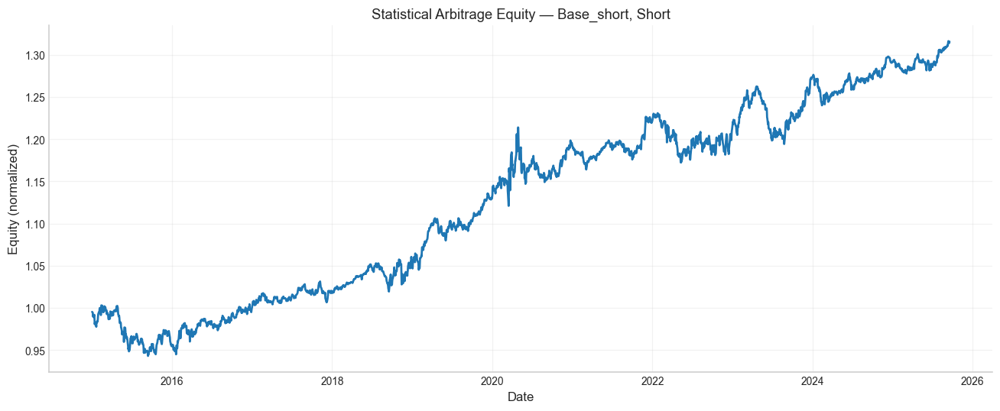

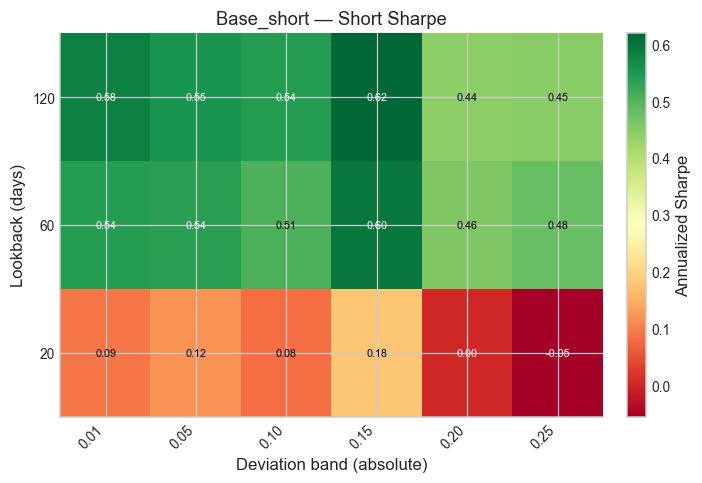

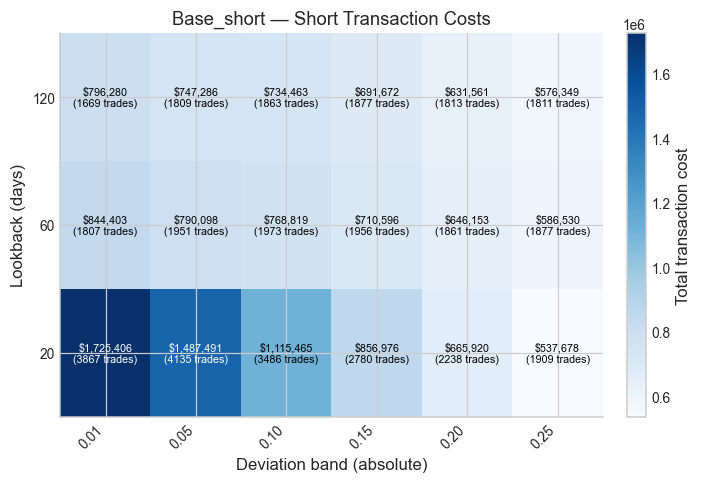

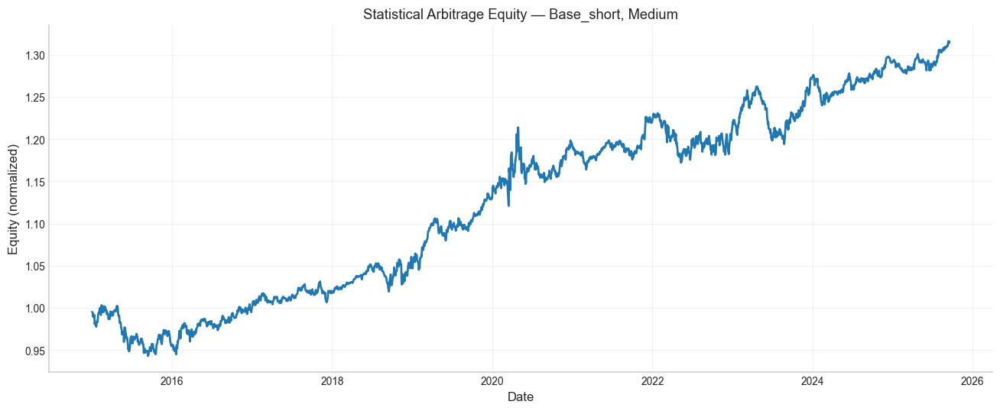

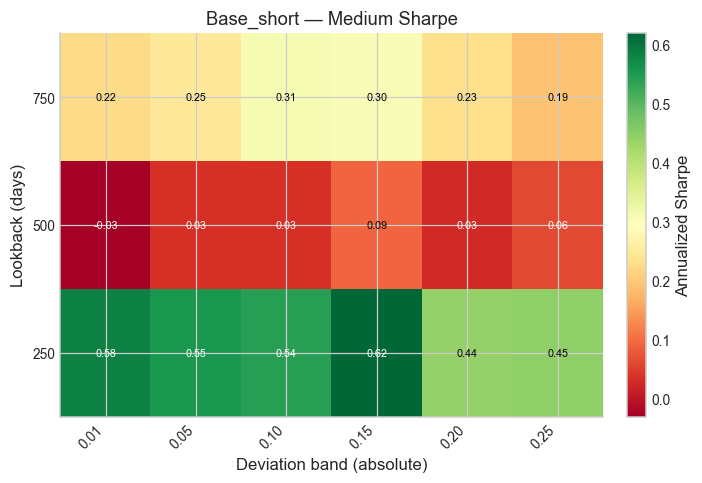

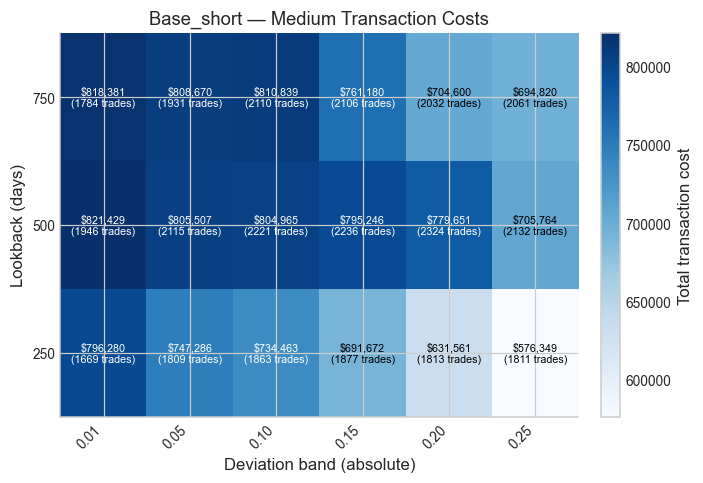

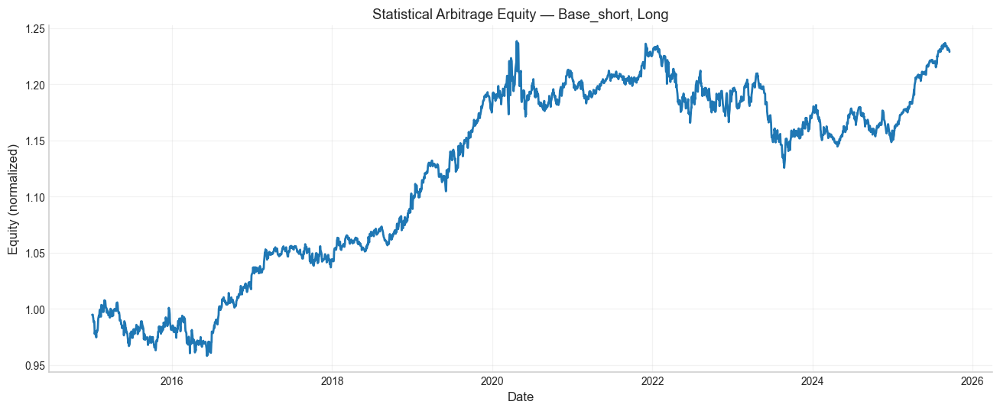

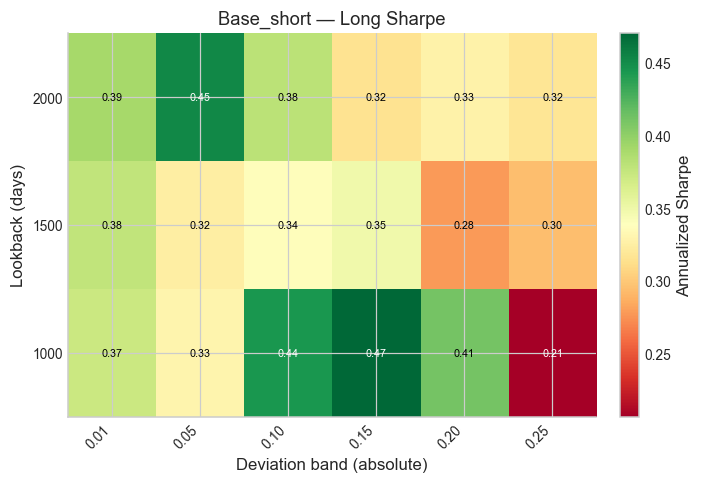

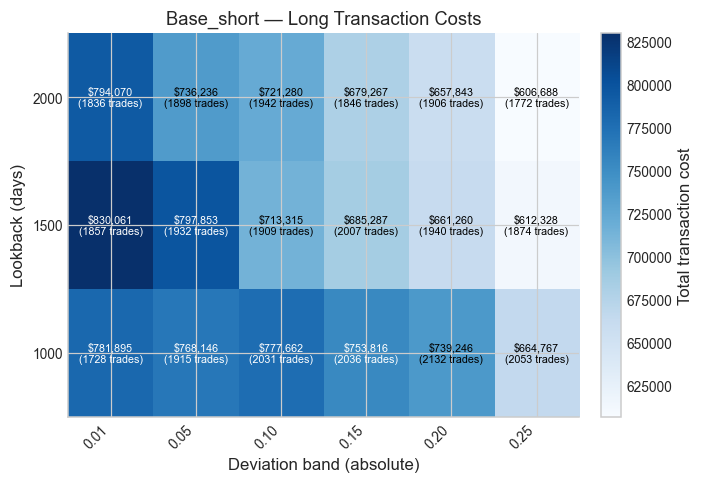


================ M6_7 ROLL =================
Using 9 legs, 8 pairs.


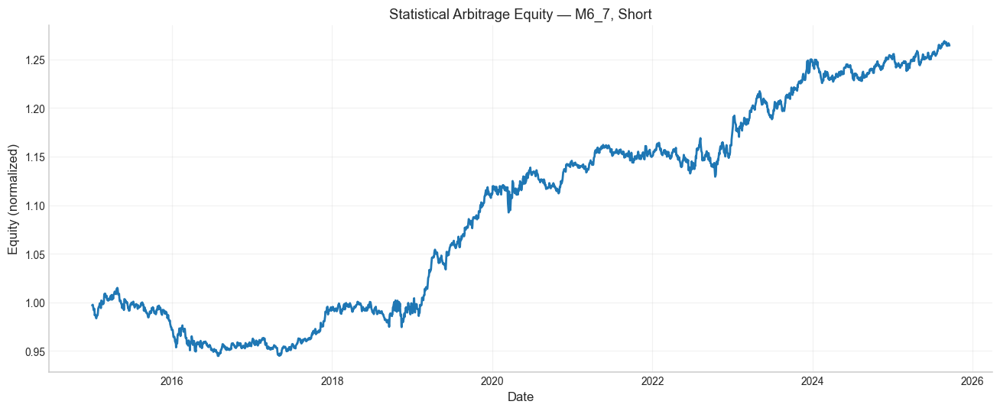

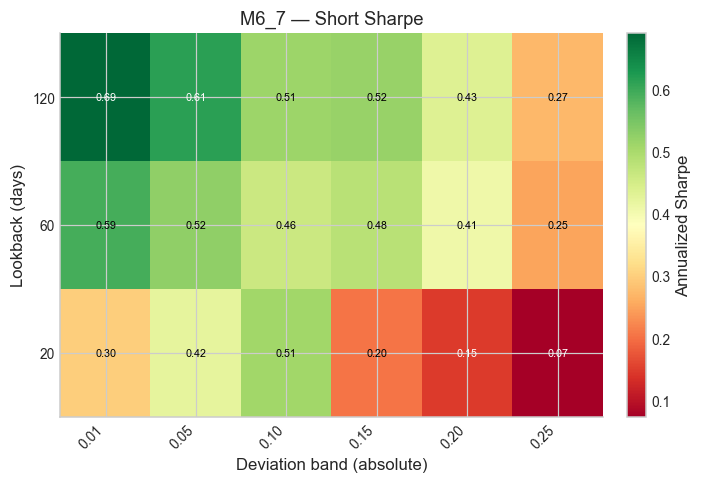

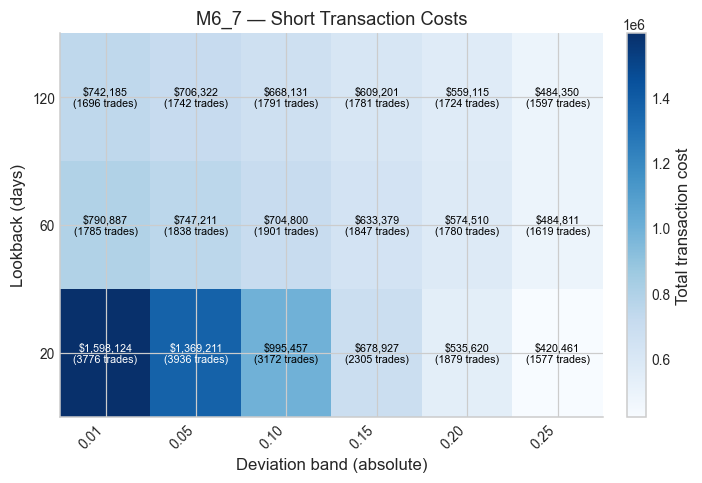

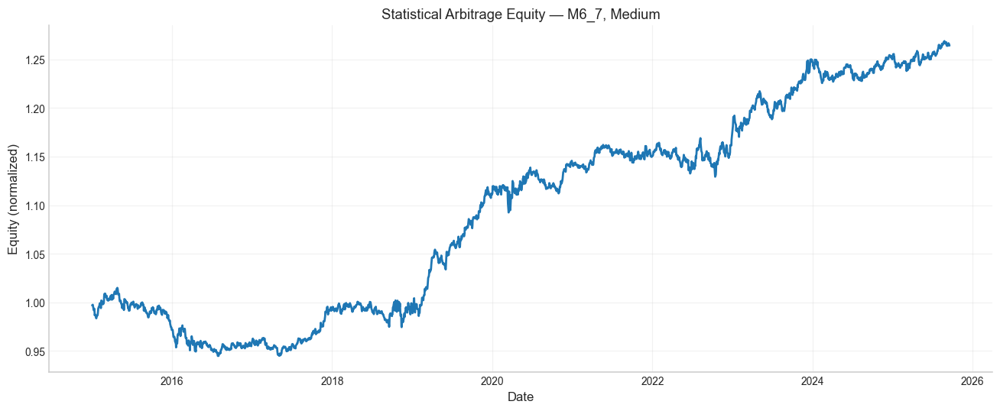

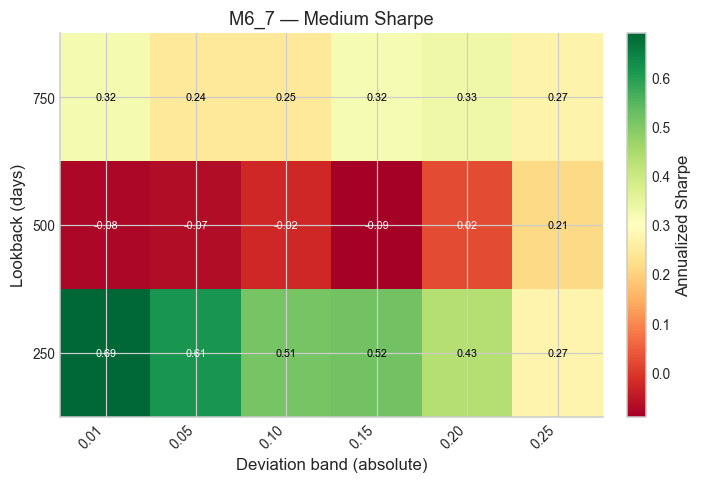

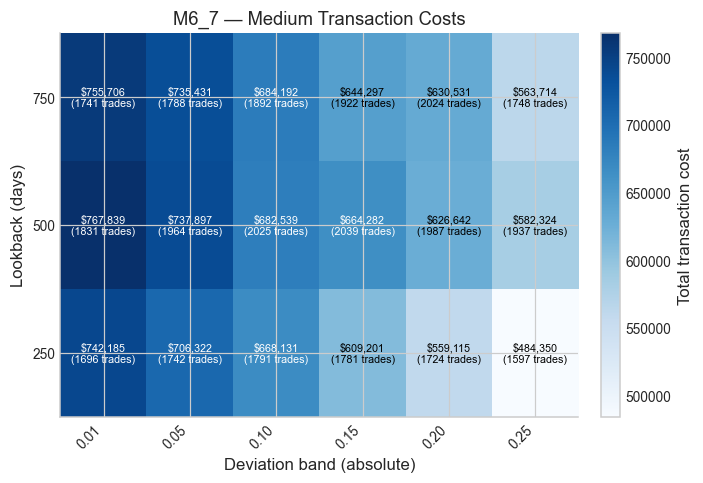

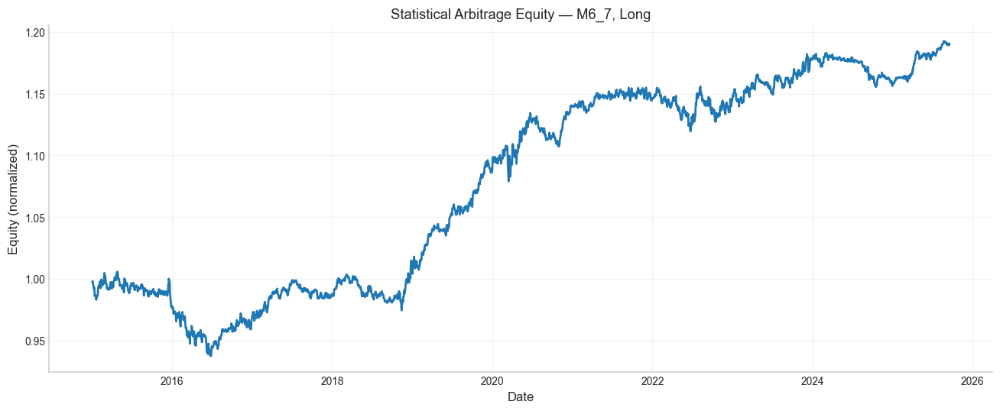

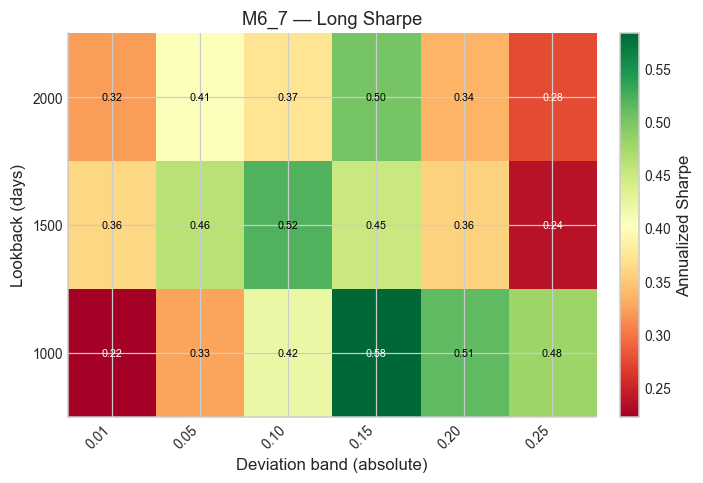

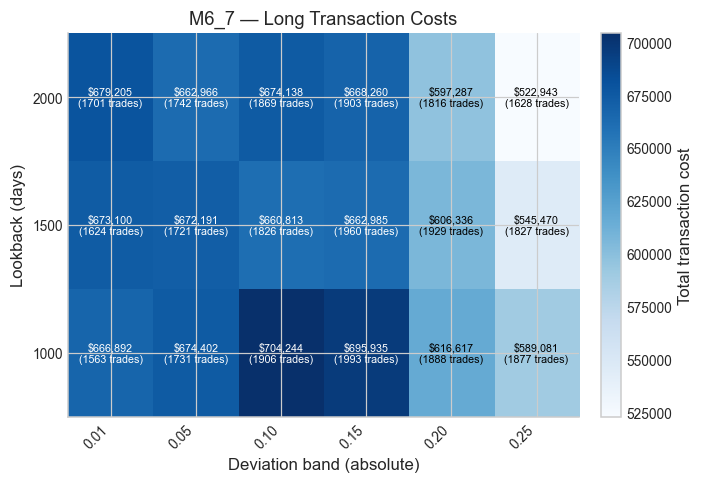


================ M9_10 ROLL =================
Using 9 legs, 8 pairs.


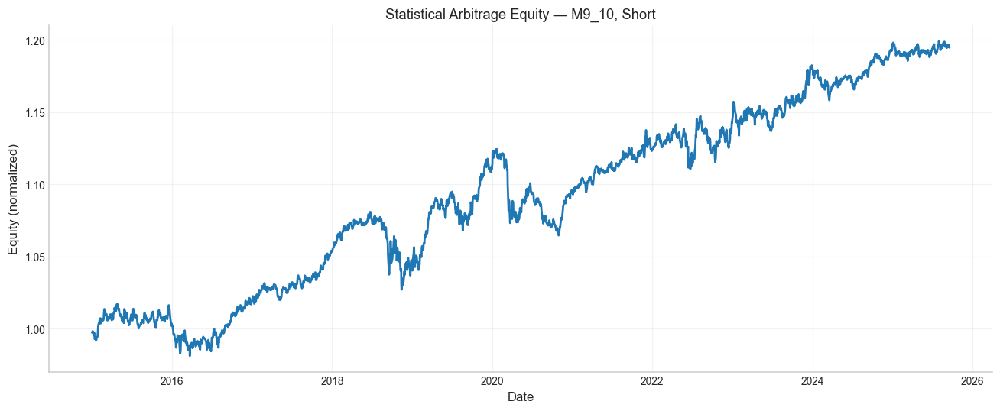

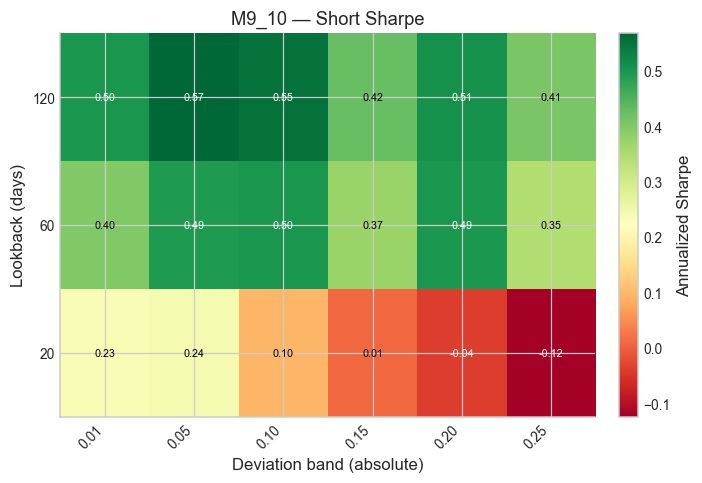

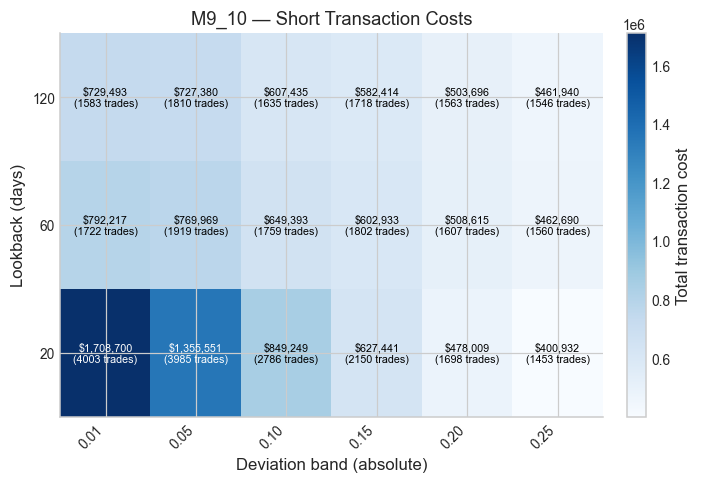

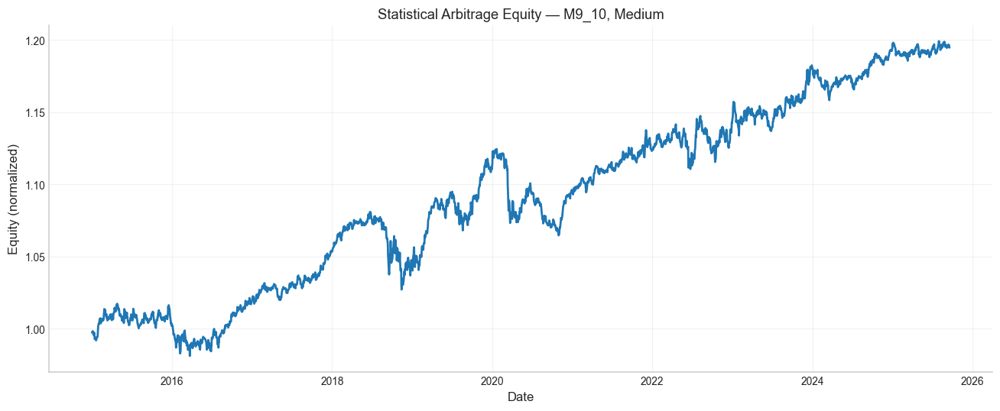

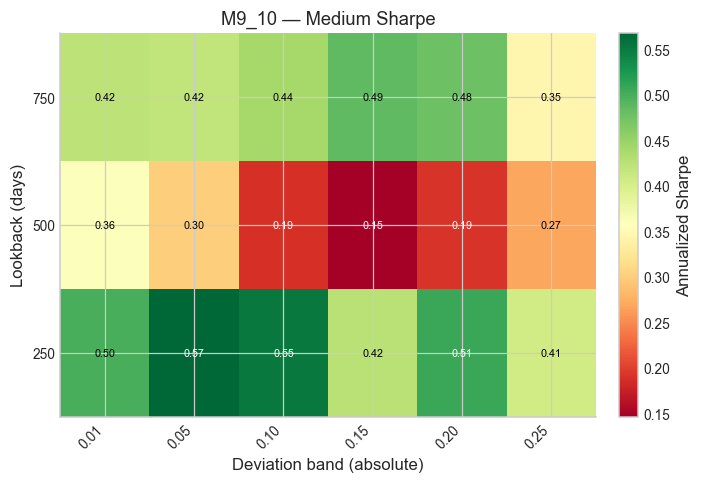

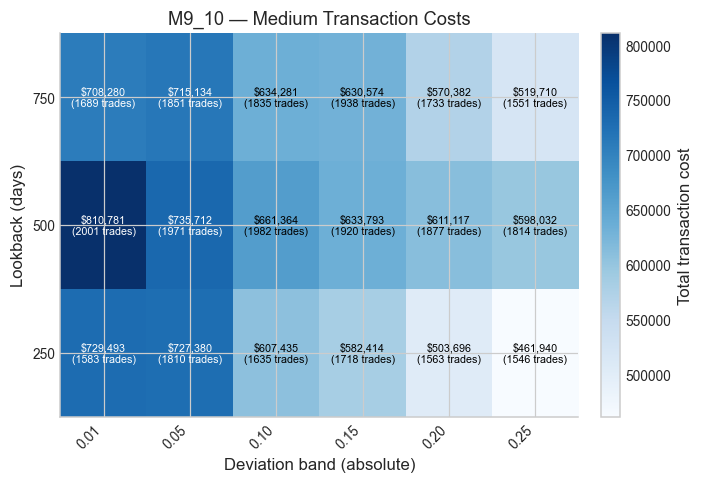

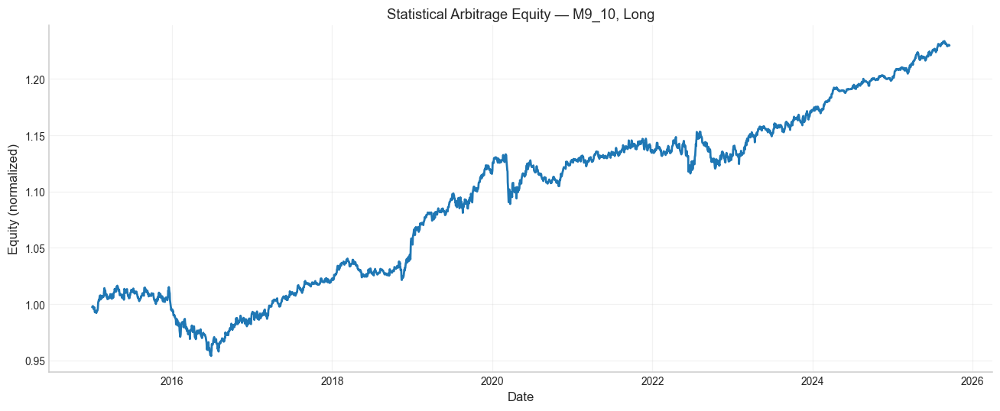

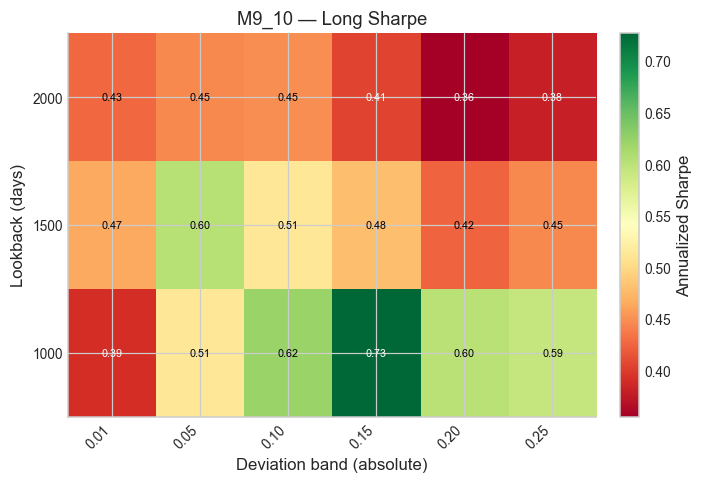

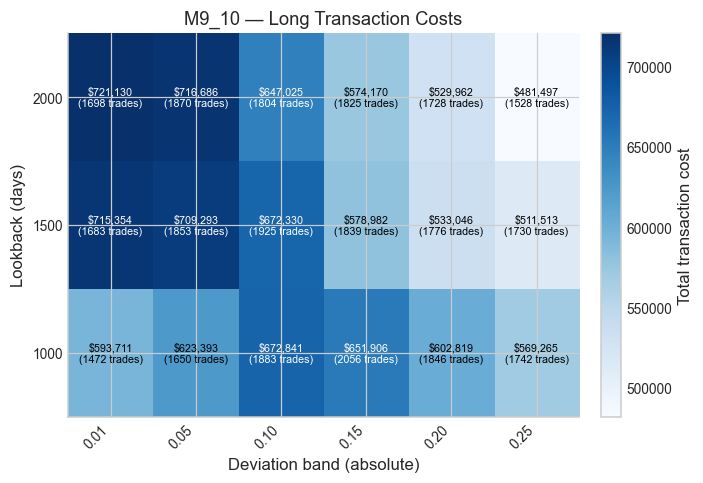


================ M12_13 ROLL =================
Using 9 legs, 8 pairs.


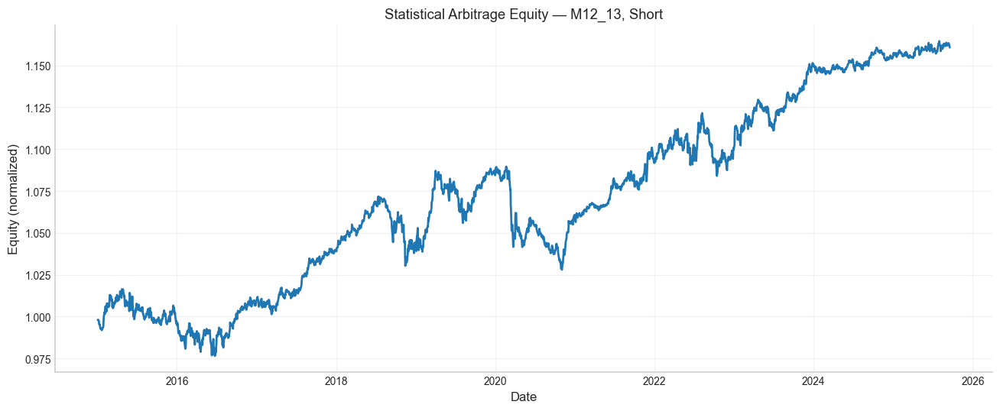

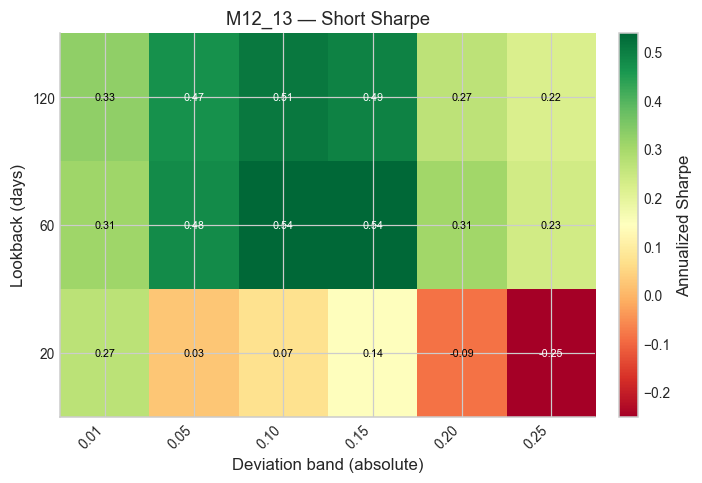

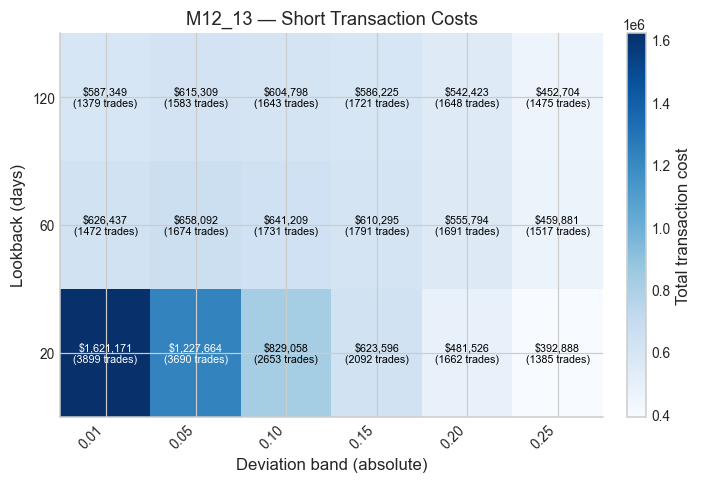

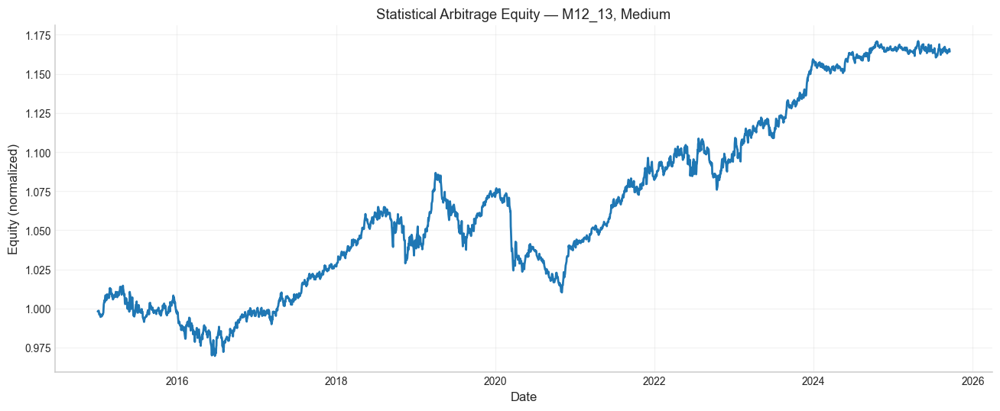

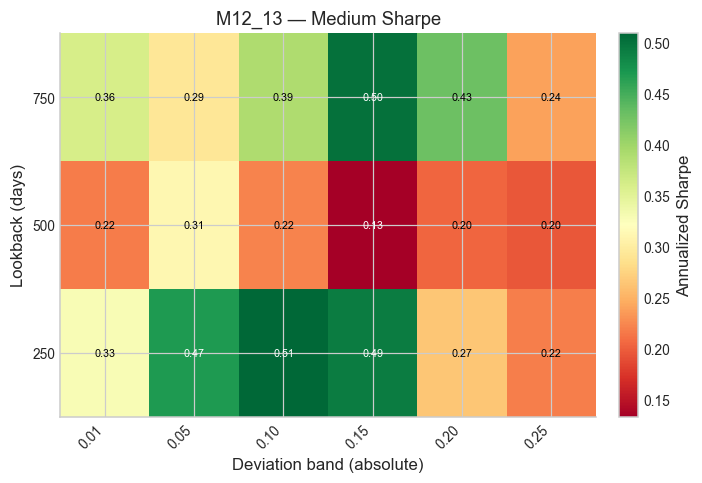

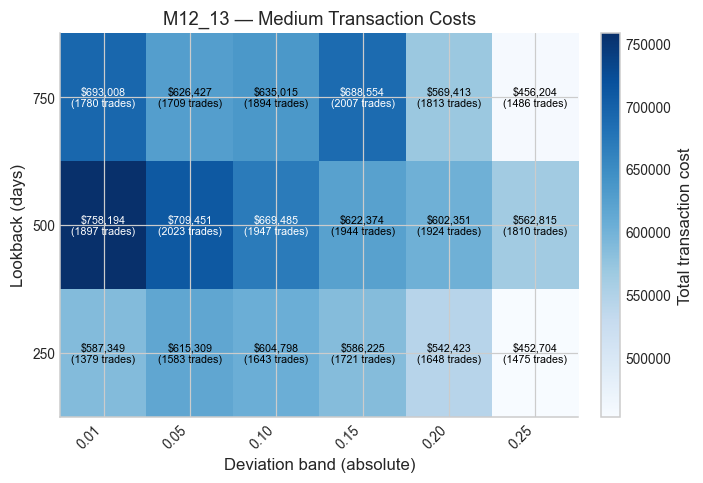

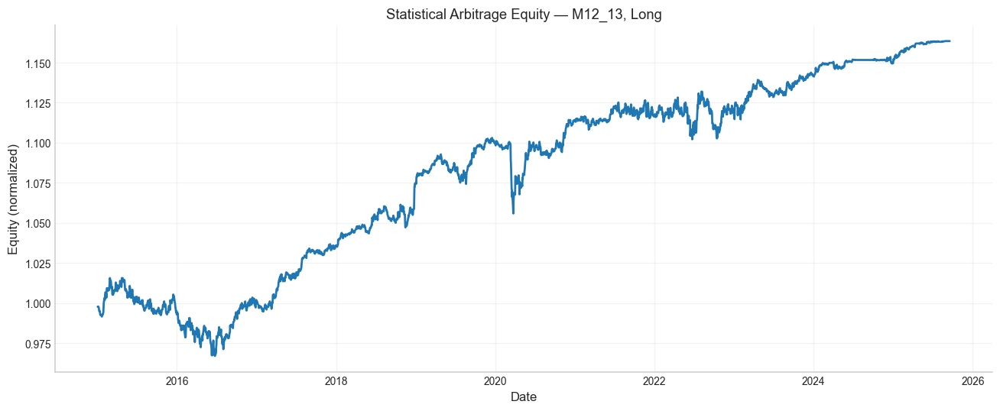

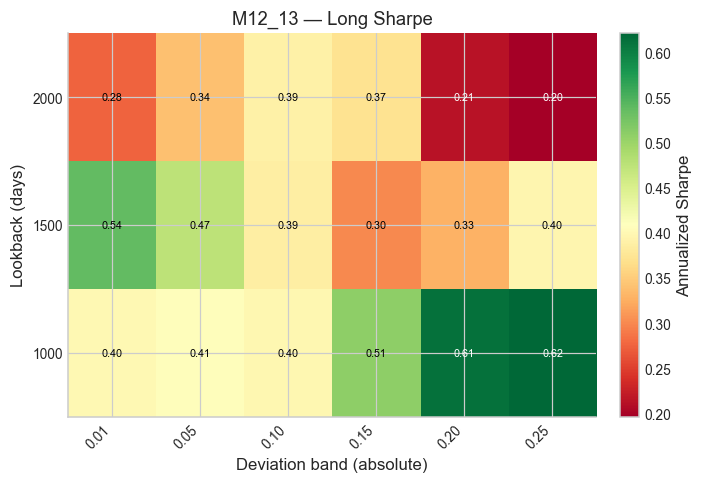

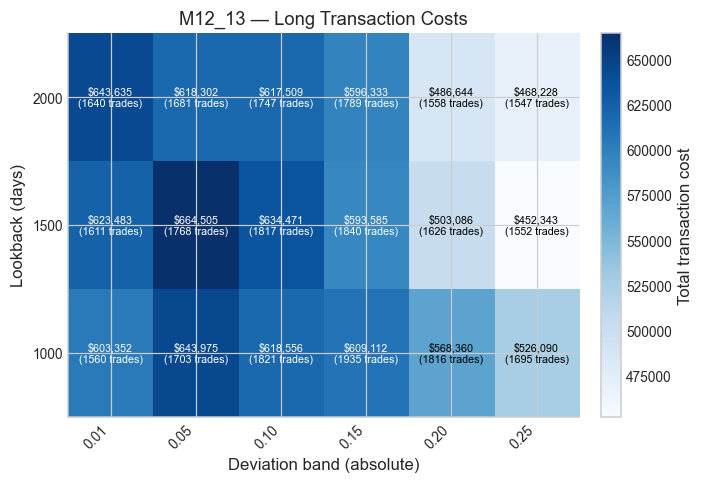

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =====================================================================
# 0) Config: history vs trading window, grids, roll setups
# =====================================================================

HIST_START   = "2010-01-01"
TRADE_START  = pd.Timestamp("2015-01-01")

STAT_ARB_INIT_CAPITAL = 10_000_000.0

HORIZON_GRIDS = {
    "Short":  [20, 60, 120],
    "Medium": [250, 500, 750],
    "Long":   [1000, 1500, 2000],
}

# Interpreted as *absolute* dollar deviation band in the spread
EPS_GRID = [0.01, 0.05, 0.10, 0.15, 0.20, 0.25]

ROLL_SETUPS = {
    "Base_short": {"kind": "base"},
    "M6_7":       {"kind": "tenor", "front": "F6",  "next": "F7"},
    "M9_10":      {"kind": "tenor", "front": "F9",  "next": "F10"},
    "M12_13":     {"kind": "tenor", "front": "F12", "next": "F13"},
}

RAW_PAIRS = [
    ("Ethane",  "Natgas"),
    ("Propane", "Ethane"),
    ("Propane", "Butane"),
    ("Butane",  "RBOB"),
    ("RBOB",    "Brent"),
    ("Brent",   "WTI"),
    ("Brent",   "ULSD"),
    ("ULSD",    "WTI"),
]

# =====================================================================
# Sharpe + Log-equity helpers
# =====================================================================

def _annualized_sharpe(log_ret: pd.Series, min_obs: int = 60) -> float:
    lr = log_ret.replace([np.inf, -np.inf], np.nan).dropna()
    if lr.size < min_obs:
        return np.nan
    vol = lr.std()
    if vol == 0 or np.isnan(vol):
        return np.nan
    return (lr.mean() / vol) * np.sqrt(252)


def _scale_pnl_to_log_equity(
    net_pnl: pd.Series,
    init_capital: float = STAT_ARB_INIT_CAPITAL
) -> tuple[pd.Series, pd.Series]:
    if net_pnl is None or net_pnl.empty:
        return pd.Series(dtype=float), pd.Series(dtype=float)

    cum = net_pnl.cumsum()
    eq  = init_capital + cum
    eq  = eq.clip(lower=1e-9)

    eq_norm = eq / init_capital
    log_ret = np.log(eq_norm / eq_norm.shift(1))
    log_ret = log_ret.replace([np.inf, -np.inf], np.nan)

    return eq_norm, log_ret


# =====================================================================
# Build rolled legs + PURE price levels for spreads
# =====================================================================

def _build_legs_for_roll_setup(roll_name: str, cfg_setup: dict):
    rolled_legs = {}
    pure_cols   = {}

    for commodity, cfg in BASE_ROLL_STYLES.items():
        if commodity not in COMMODITIES:
            continue

        ticker, contracts, units, tc = COMMODITIES[commodity]

        prices_full = load_prices(commodity, ticker, normalize=True)
        prices_full = prices_full.loc[HIST_START:].sort_index()
        if prices_full.empty:
            continue

        expiry = load_expiry(ticker)
        cols   = prices_full.columns
        kind   = cfg_setup["kind"]

        # ---------------------------------------------------
        # A) Build rolled legs (execution PnL)
        # ---------------------------------------------------
        if kind == "base":
            style = cfg["style"]
            f_col = cfg.get("front_col", "F1")
            n_col = cfg.get("next_col",  "F2")

            rs = RollingStrategy(
                prices=prices_full,
                expiry_calendar=expiry,
                front_col=f_col,
                next_col=n_col,
            )

            if style == "eom_ngl":
                rolled_df = rs.equity(
                    style="eom_ngl",
                    t_cost=tc,
                    mid_col=cfg.get("mid_col","F3"),
                    far_col=cfg.get("far_col","F4"),
                )
            elif style == "eom_mid":
                rolled_df = rs.equity(style="eom_mid", t_cost=tc)
            elif style == "eom_dynamic":
                rolled_df = rs.equity(
                    style="eom_dynamic",
                    t_cost=tc,
                    third_col=cfg.get("third_col","F3"),
                )
            elif style == "eom_eom":
                rolled_df = rs.equity(
                    style="eom_eom",
                    t_cost=tc,
                    third_col=cfg.get("third_col","F3"),
                )
            else:
                raise ValueError("Unknown base style.")

            rolled_df = rolled_df.sort_index()

            # Base_short uses F3 as PURE tenor
            if roll_name == "Base_short":
                pure_px = prices_full.get("F3", prices_full.iloc[:, 2])
            else:
                pure_px = prices_full.get(f_col, prices_full.iloc[:, 0])

        # ---------------------------------------------------
        # B) Tenor-based roll
        # ---------------------------------------------------
        elif kind == "tenor":
            front = cfg_setup["front"]
            nxt   = cfg_setup["next"]

            if front not in cols:
                front = cols[0]
            if nxt not in cols:
                nxt = cols[1] if len(cols) > 1 else front

            rs = RollingStrategy(
                prices=prices_full,
                expiry_calendar=expiry,
                front_col=front,
                next_col=nxt,
            )

            rolled_df = rs.equity(style="eom_mid", t_cost=tc).sort_index()

            # PURE PRICE = FRONT tenor
            pure_px = prices_full[front].astype(float)

        else:
            raise ValueError("Unknown roll kind.")

        for c in ["daily_pnl", "t_cost", "roll_day_flag"]:
            if c not in rolled_df.columns:
                raise ValueError(f"{c} missing for {commodity}")

        pure_px = pure_px.reindex(rolled_df.index).ffill()

        rolled_legs[commodity] = rolled_df
        pure_cols[commodity]   = pure_px

    if len(rolled_legs) < 2:
        raise RuntimeError("Need >= 2 legs")

    pure_spread_prices = (
        pd.DataFrame(pure_cols)
        .dropna(how="all")
        .sort_index()
    )

    return rolled_legs, pure_spread_prices


# =====================================================================
# Text contrast helper for heatmap annotations
# =====================================================================

def _cell_text_color(im, value: float) -> str:
    if not np.isfinite(value):
        return "black"
    r, g, b, _ = im.cmap(im.norm(value))
    lum = 0.299 * r + 0.587 * g + 0.114 * b
    return "white" if lum < 0.5 else "black"


# =====================================================================
# 3) GRID SEARCH
# =====================================================================

for roll_name, roll_cfg in ROLL_SETUPS.items():
    print(f"\n================ {roll_name} ROLL =================")

    rolled_legs, prices_for_spreads = _build_legs_for_roll_setup(
        roll_name, roll_cfg
    )

    avail = set(rolled_legs.keys())
    pairs = [(a, b) for (a, b) in RAW_PAIRS if a in avail and b in avail]
    if not pairs:
        print("No valid pairs.")
        continue

    print(f"Using {len(avail)} legs, {len(pairs)} pairs.")

    for horizon_name, long_ma_grid in HORIZON_GRIDS.items():

        sharpe_grid = pd.DataFrame(index=long_ma_grid, columns=EPS_GRID)
        cost_grid   = pd.DataFrame(index=long_ma_grid, columns=EPS_GRID)
        trades_grid = pd.DataFrame(index=long_ma_grid, columns=EPS_GRID)

        best_sharpe  = -np.inf
        best_params  = None
        best_eq_norm = None

        for long_ma in long_ma_grid:
            for eps in EPS_GRID:

                sa_df = statistical_arbitrage(
                    rolled_legs=rolled_legs,
                    prices=prices_for_spreads,             # sizing anchors
                    pure_spread_prices=prices_for_spreads, # true spread prices
                    pairs=pairs,
                    long_ma=long_ma,
                    vol_window=long_ma,
                    epsilon_factor=eps,                    # now $-band
                    t_cost=0.01,
                )

                # restrict to TRADE_START
                sa_df = sa_df.loc[TRADE_START:].copy()
                if sa_df.empty:
                    sharpe_grid.loc[long_ma, eps] = np.nan
                    cost_grid.loc[long_ma, eps]   = np.nan
                    trades_grid.loc[long_ma, eps] = np.nan
                    continue

                eq_norm, logret = _scale_pnl_to_log_equity(sa_df["net_pnl"])
                if eq_norm.empty:
                    sharpe_grid.loc[long_ma, eps] = np.nan
                    cost_grid.loc[long_ma, eps]   = np.nan
                    trades_grid.loc[long_ma, eps] = np.nan
                    continue

                s = _annualized_sharpe(logret)
                sharpe_grid.loc[long_ma, eps] = s

                total_cost = sa_df["t_cost"].sum()
                cost_grid.loc[long_ma, eps] = total_cost

                if "trade_count" in sa_df.columns:
                    trades_grid.loc[long_ma, eps] = sa_df["trade_count"].sum()
                else:
                    trades_grid.loc[long_ma, eps] = np.nan

                if np.isfinite(s) and s > best_sharpe:
                    best_sharpe  = s
                    best_params  = (long_ma, eps)
                    best_eq_norm = eq_norm.copy()

        if best_eq_norm is None:
            continue

        # ---------------------
        # Equity plot (clean title)
        # ---------------------
        plt.figure(figsize=(12, 5))
        plt.plot(best_eq_norm.index, best_eq_norm, linewidth=1.8)
        plt.grid(alpha=0.25)
        plt.title(f"Statistical Arbitrage Equity — {roll_name}, {horizon_name}")
        plt.xlabel("Date")
        plt.ylabel("Equity (normalized)")
        plt.tight_layout()
        plt.show()

        # ---------------------
        # Sharpe heatmap (clean, crisp cells)
        # ---------------------
        fig, ax = plt.subplots(figsize=(6.5, 4.5))
        data = sharpe_grid.values.astype(float)

        im = ax.imshow(
            data,
            origin="lower",
            aspect="auto",
            cmap="RdYlGn",
            interpolation="nearest",   # <- one cell per (MA, eps)
        )

        ax.set_xticks(range(len(EPS_GRID)))
        ax.set_xticklabels([f"{e:.2f}" for e in EPS_GRID], rotation=45, ha="right")
        ax.set_yticks(range(len(long_ma_grid)))
        ax.set_yticklabels(long_ma_grid)

        ax.set_title(f"{roll_name} — {horizon_name} Sharpe")
        ax.set_xlabel("Deviation band (absolute)")
        ax.set_ylabel("Lookback (days)")

        # Optional: numeric annotations in cells
        for i, ma in enumerate(long_ma_grid):
            for j, eps in enumerate(EPS_GRID):
                val = sharpe_grid.loc[ma, eps]
                if pd.isna(val):
                    continue
                color = _cell_text_color(im, float(val))
                ax.text(
                    j, i, f"{val:.2f}",
                    ha="center", va="center",
                    color=color, fontsize=7,
                )

        cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        cbar.set_label("Annualized Sharpe")

        plt.tight_layout()
        plt.show()

        # ---------------------
        # T-cost heatmap (clean, crisp cells)
        # ---------------------
        fig, ax = plt.subplots(figsize=(6.5, 4.5))
        data_cost = cost_grid.values.astype(float)

        im = ax.imshow(
            data_cost,
            origin="lower",
            aspect="auto",
            cmap="Blues",
            interpolation="nearest",
        )

        ax.set_xticks(range(len(EPS_GRID)))
        ax.set_xticklabels([f"{e:.2f}" for e in EPS_GRID], rotation=45, ha="right")
        ax.set_yticks(range(len(long_ma_grid)))
        ax.set_yticklabels(long_ma_grid)

        ax.set_title(f"{roll_name} — {horizon_name} Transaction Costs")
        ax.set_xlabel("Deviation band (absolute)")
        ax.set_ylabel("Lookback (days)")

        # Optional: show $ and trades in each cell
        for i, ma in enumerate(long_ma_grid):
            for j, eps in enumerate(EPS_GRID):
                tc = cost_grid.loc[ma, eps]
                tr = trades_grid.loc[ma, eps]
                if pd.isna(tc):
                    continue

                text = f"${tc:,.0f}"
                if not pd.isna(tr):
                    text += f"\n({int(tr)} trades)"

                color = _cell_text_color(im, float(tc))
                ax.text(
                    j, i, text,
                    ha="center", va="center",
                    color=color, fontsize=7,
                )

        cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        cbar.set_label("Total transaction cost")

        plt.tight_layout()
        plt.show()



In [18]:
# ======================================================================
# SUMMARY TABLES: BEST SHARPE + MEAN SHARPE FOR EACH ROLL × HORIZON
# ======================================================================

summary_records = []
avg_sharpe_records = []

for roll_name, roll_cfg in ROLL_SETUPS.items():
    # NOTE: updated _build_legs_for_roll_setup returns:
    #   rolled_legs, pure_spread_prices
    rolled_legs, pure_spread_prices = _build_legs_for_roll_setup(roll_name, roll_cfg)

    available_legs = set(rolled_legs.keys())

    # Filter pairs to curated list
    pairs = [
        (a, b)
        for (a, b) in RAW_PAIRS
        if (a in available_legs) and (b in available_legs)
    ]

    if not pairs:
        print(f"[SUMMARY] {roll_name}: no valid pairs available.")
        continue

    for horizon_name, long_ma_grid in HORIZON_GRIDS.items():

        # Sharpe grid for this roll+horizon combo
        sharpe_grid = pd.DataFrame(
            index=long_ma_grid,
            columns=EPS_GRID,
            dtype=float
        )

        best_sharpe = -np.inf
        best_params = (np.nan, np.nan)

        for long_ma in long_ma_grid:
            for eps in EPS_GRID:

                sa_df = statistical_arbitrage(
                    rolled_legs=rolled_legs,
                    prices=pure_spread_prices,          # sizing anchors
                    pure_spread_prices=pure_spread_prices,  # TRUE levels for signal
                    pairs=pairs,
                    long_ma=long_ma,
                    vol_window=long_ma,
                    epsilon_factor=eps,
                    t_cost=0.01,
                )

                sa_df = sa_df.loc[TRADE_START:].copy()
                if sa_df.empty:
                    sharpe_grid.loc[long_ma, eps] = np.nan
                    continue

                # Compute log returns
                _, port_log_ret = _scale_pnl_to_log_equity(sa_df["net_pnl"])
                sharpe = _annualized_sharpe(port_log_ret)

                sharpe_grid.loc[long_ma, eps] = sharpe

                if np.isfinite(sharpe) and sharpe > best_sharpe:
                    best_sharpe = sharpe
                    best_params = (long_ma, eps)

        # ---- Store BEST SHARPE summary ----
        if not np.isfinite(best_sharpe):
            best_sharpe = np.nan
            best_params = (np.nan, np.nan)

        summary_records.append({
            "Roll_Setup":    roll_name,
            "Horizon":       horizon_name,
            "Best_Sharpe":   best_sharpe,
            "Best_Lookback": best_params[0],
            "Best_Epsilon":  best_params[1],
        })

        # ---- Store MEAN SHARPE summary ----
        mean_sharpe = sharpe_grid.stack().mean()  # skipna=True by default
        avg_sharpe_records.append({
            "Roll_Setup":  roll_name,
            "Horizon":     horizon_name,
            "Mean_Sharpe": mean_sharpe,
        })


# Convert to DataFrames
summary_table = pd.DataFrame(summary_records)
avg_table     = pd.DataFrame(avg_sharpe_records)

print("=== BEST SHARPE PER ROLL × HORIZON ===")
display(summary_table.sort_values(["Roll_Setup", "Horizon"]))

print("=== MEAN SHARPE PER ROLL × HORIZON ===")
pivot_avg = avg_table.pivot(index="Roll_Setup", columns="Horizon", values="Mean_Sharpe")
display(pivot_avg)



=== BEST SHARPE PER ROLL × HORIZON ===


,Roll_Setup,Horizon,Best_Sharpe,Best_Lookback,Best_Epsilon
2,Base_short,Long,0.4700,1000,0.1500
1,Base_short,Medium,0.6195,250,0.1500
0,Base_short,Short,0.6195,120,0.1500
11,M12_13,Long,0.6214,1000,0.2500
10,M12_13,Medium,0.5091,250,0.1000
9,M12_13,Short,0.5380,60,0.1500
5,M6_7,Long,0.5830,1000,0.1500
4,M6_7,Medium,0.6898,250,0.0100
3,M6_7,Short,0.6898,120,0.0100
8,M9_10,Long,0.7268,1000,0.1500


=== MEAN SHARPE PER ROLL × HORIZON ===


Horizon,Long,Medium,Short
Roll_Setup,,,
Base_short,0.3542,0.2733,0.3738
M12_13,0.3976,0.3210,0.2694
M6_7,0.3968,0.2640,0.4120
M9_10,0.4909,0.3889,0.3317


=== Correlation Matrix — Stat-Arb Best Portfolios (log returns) ===


,Base_short_Short,Base_short_Medium,Base_short_Long,M6_7_Short,M6_7_Medium,M6_7_Long,M9_10_Short,M9_10_Medium,M9_10_Long,M12_13_Short,M12_13_Medium,M12_13_Long
Base_short_Short,1.0000,1.0000,0.7800,0.7010,0.7010,0.6070,0.6340,0.6340,0.5190,0.6200,0.5880,0.4300
Base_short_Medium,1.0000,1.0000,0.7800,0.7010,0.7010,0.6070,0.6340,0.6340,0.5190,0.6200,0.5880,0.4300
Base_short_Long,0.7800,0.7800,1.0000,0.5750,0.5750,0.8040,0.5300,0.5300,0.6970,0.4960,0.4910,0.5370
M6_7_Short,0.7010,0.7010,0.5750,1.0000,1.0000,0.7150,0.9030,0.9030,0.6580,0.7460,0.7910,0.5720
M6_7_Medium,0.7010,0.7010,0.5750,1.0000,1.0000,0.7150,0.9030,0.9030,0.6580,0.7460,0.7910,0.5720
M6_7_Long,0.6070,0.6070,0.8040,0.7150,0.7150,1.0000,0.7060,0.7060,0.9290,0.6680,0.6710,0.7500
M9_10_Short,0.6340,0.6340,0.5300,0.9030,0.9030,0.7060,1.0000,1.0000,0.7610,0.8520,0.9010,0.6800
M9_10_Medium,0.6340,0.6340,0.5300,0.9030,0.9030,0.7060,1.0000,1.0000,0.7610,0.8520,0.9010,0.6800
M9_10_Long,0.5190,0.5190,0.6970,0.6580,0.6580,0.9290,0.7610,0.7610,1.0000,0.7390,0.7430,0.8330
M12_13_Short,0.6200,0.6200,0.4960,0.7460,0.7460,0.6680,0.8520,0.8520,0.7390,1.0000,0.9440,0.7520


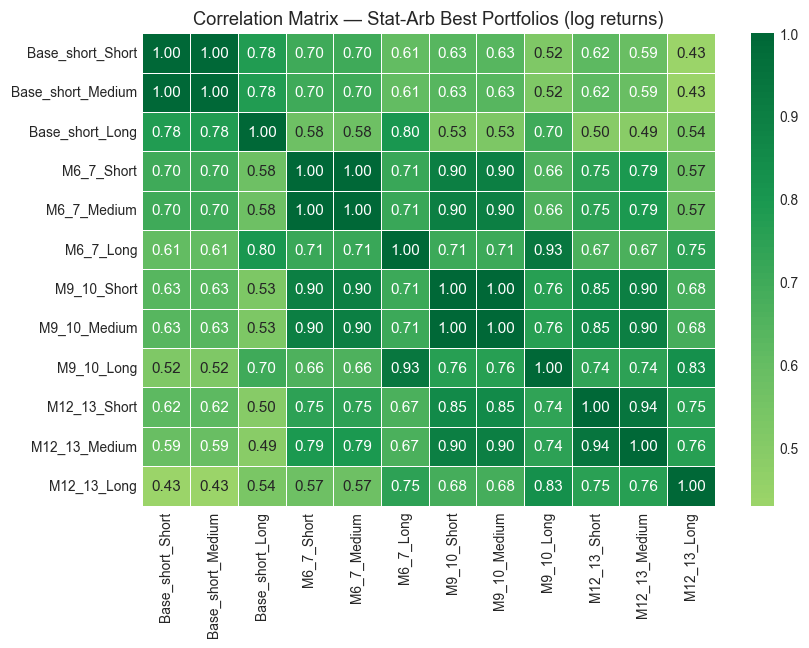

In [19]:
# ======================================================================
#  Correlation Matrix of Best Portfolios (Stat-Arb)
# ======================================================================

import matplotlib.pyplot as plt
import seaborn as sns

portfolio_curves = {}

for _, row in summary_table.iterrows():
    roll      = row["Roll_Setup"]
    horizon   = row["Horizon"]
    lookback  = row["Best_Lookback"]
    eps       = row["Best_Epsilon"]

    # Skip missing configs
    if pd.isna(lookback) or pd.isna(eps):
        continue

    # Build the roll legs and prices
    rolled_legs, prices_for_spreads = _build_legs_for_roll_setup(
        roll, ROLL_SETUPS[roll]
    )

    available_legs = set(rolled_legs.keys())

    # Filter curated RAW_PAIRS
    pairs = [
        (a, b)
        for (a, b) in RAW_PAIRS
        if (a in available_legs) and (b in available_legs)
    ]
    if not pairs:
        continue

    # Run stat-arb with the best parameters
    sa_df = statistical_arbitrage(
        rolled_legs=rolled_legs,
        prices=prices_for_spreads,
        pairs=pairs,
        long_ma=int(lookback),
        pure_spread_prices=pure_spread_prices,
        vol_window=int(lookback),
        epsilon_factor=float(eps),
        t_cost=0.01,
    )

    sa_df = sa_df.loc[TRADE_START:].copy()
    if sa_df.empty:
        continue

    # Build normalized equity using FIXED capital (consistent across strategies)
    eq_norm, log_ret = _scale_pnl_to_log_equity(sa_df["net_pnl"])

    name = f"{roll}_{horizon}"
    portfolio_curves[name] = eq_norm

# Combine into aligned DataFrame
eq_df = pd.DataFrame(portfolio_curves).dropna(how="all")

# Compute log returns
log_ret_df = np.log(eq_df / eq_df.shift(1))
log_ret_df = log_ret_df.replace([np.inf, -np.inf], np.nan).dropna(how="all")

# Correlation matrix
corr_mat = log_ret_df.corr()

print("=== Correlation Matrix — Stat-Arb Best Portfolios (log returns) ===")
display(corr_mat.round(3))

# Heatmap visualization
plt.figure(figsize=(8,6))
sns.heatmap(
    corr_mat,
    annot=True,
    fmt=".2f",
    cmap="RdYlGn",
    center=0,
    linewidths=0.5,
)
plt.title("Correlation Matrix — Stat-Arb Best Portfolios (log returns)")
plt.tight_layout()
plt.show()


### Best Stat-Arb Spreads

[Per-Spread] Roll=M12_13, Pairs=8

=== Spread: Ethane – Natgas ===
Best Sharpe=0.481, L=1000, k=1.5


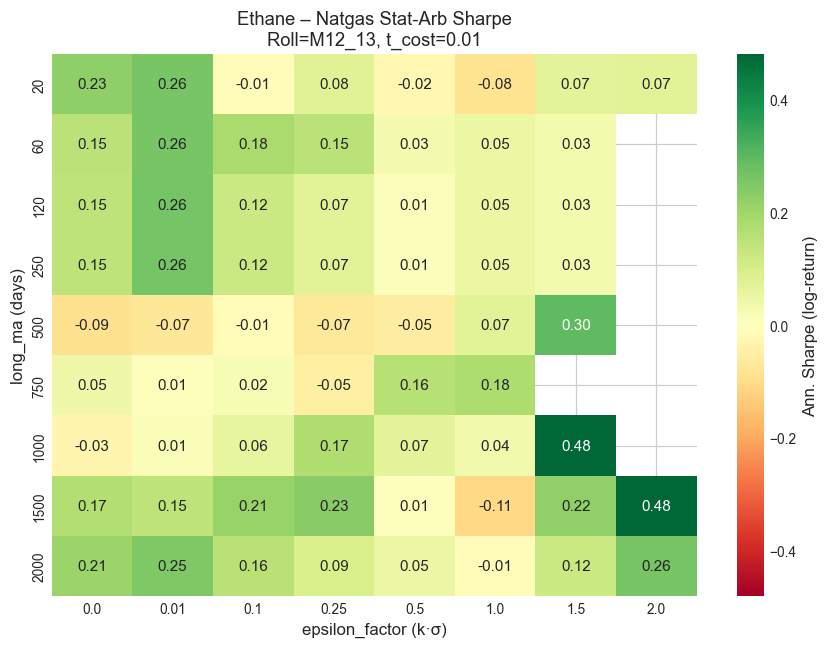


=== Spread: Propane – Ethane ===
Best Sharpe=0.624, L=60, k=0.1


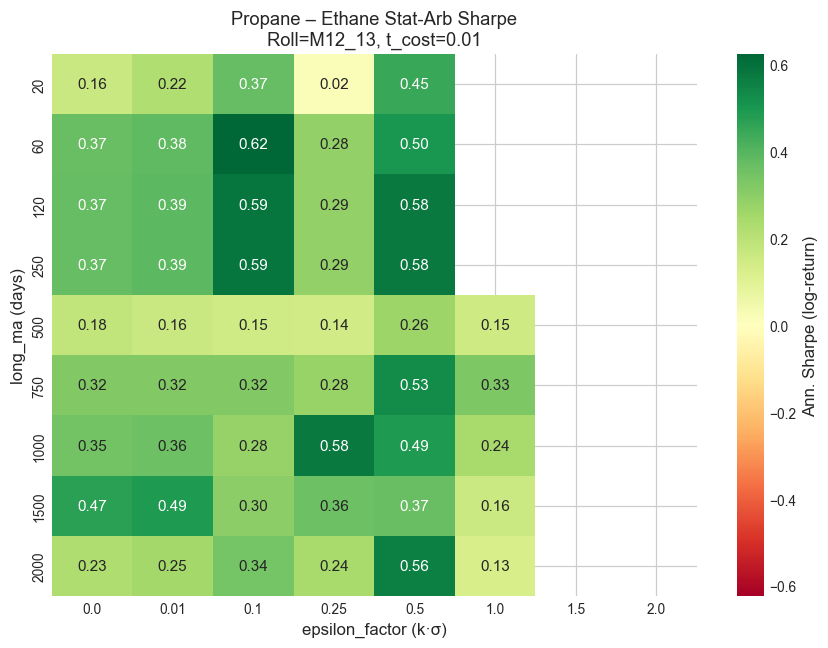


=== Spread: Propane – Butane ===
Best Sharpe=0.514, L=500, k=0.1


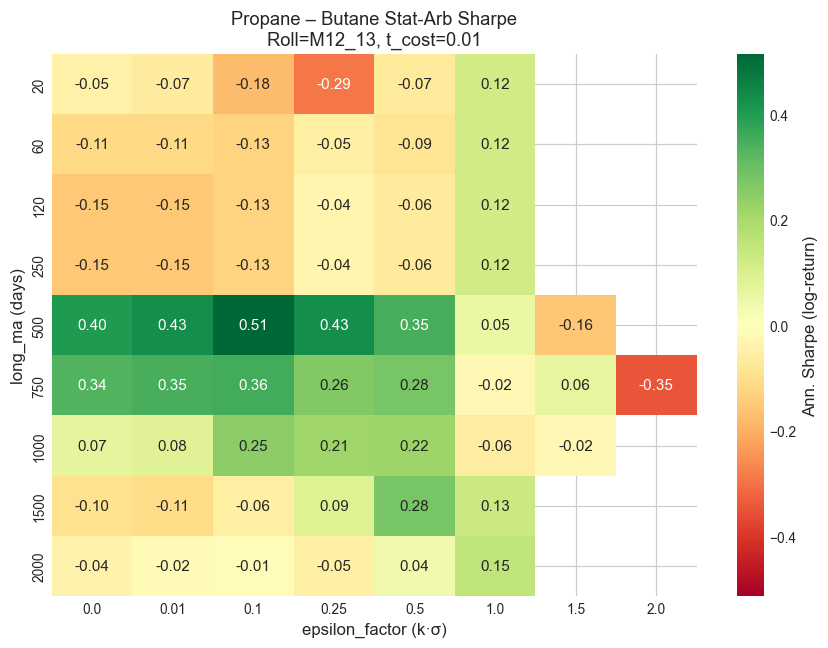


=== Spread: Butane – RBOB ===
Best Sharpe=0.321, L=20, k=0


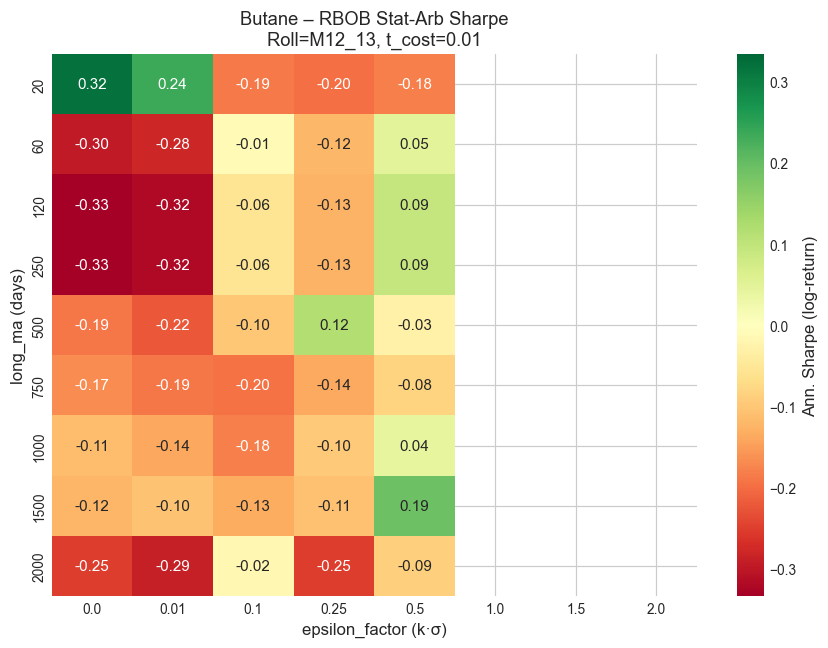


=== Spread: RBOB – Brent ===
Best Sharpe=0.417, L=2000, k=1.5


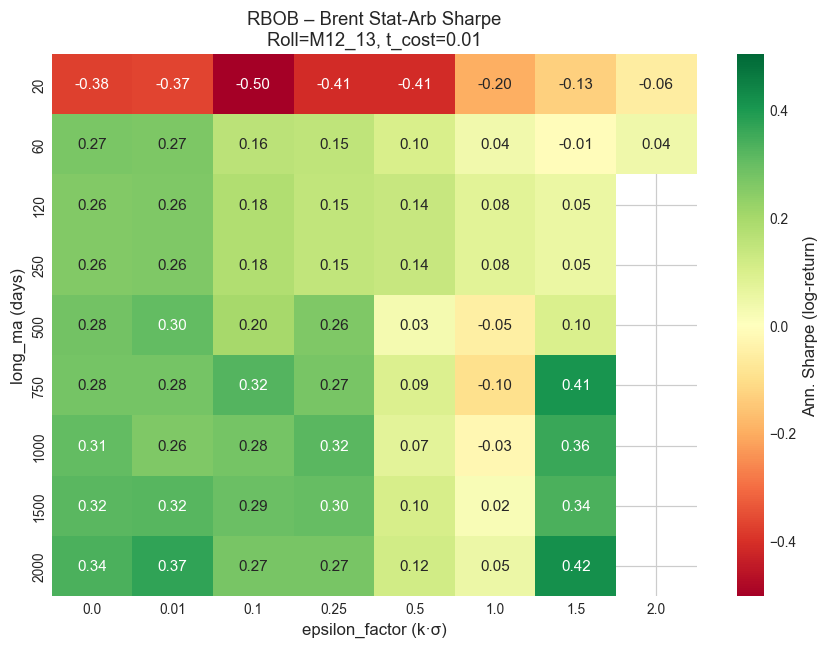


=== Spread: Brent – ULSD ===
Best Sharpe=0.523, L=60, k=1.5


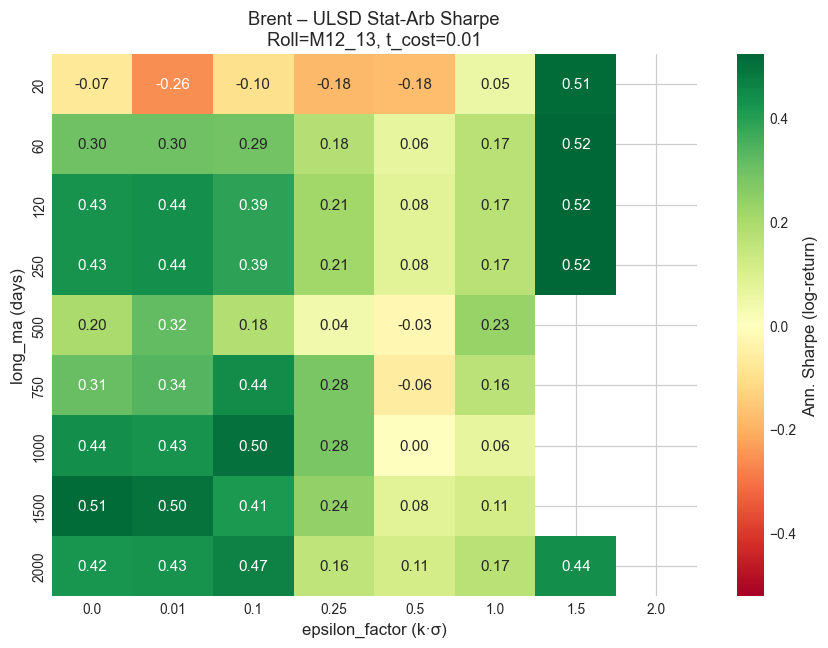


=== Spread: ULSD – WTI ===
Best Sharpe=0.347, L=60, k=1.0


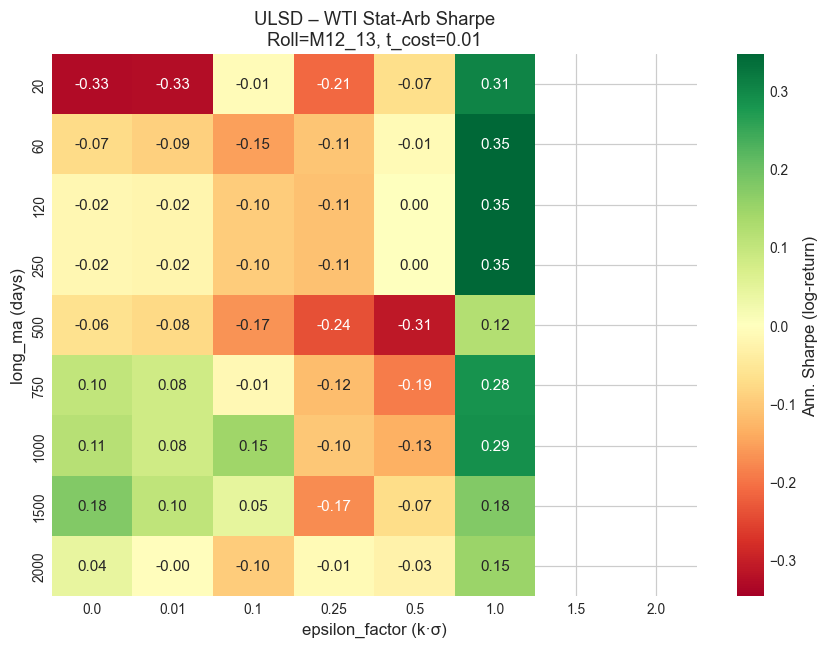


=== Spread: WTI – Brent ===
Best Sharpe=0.083, L=500, k=2.0


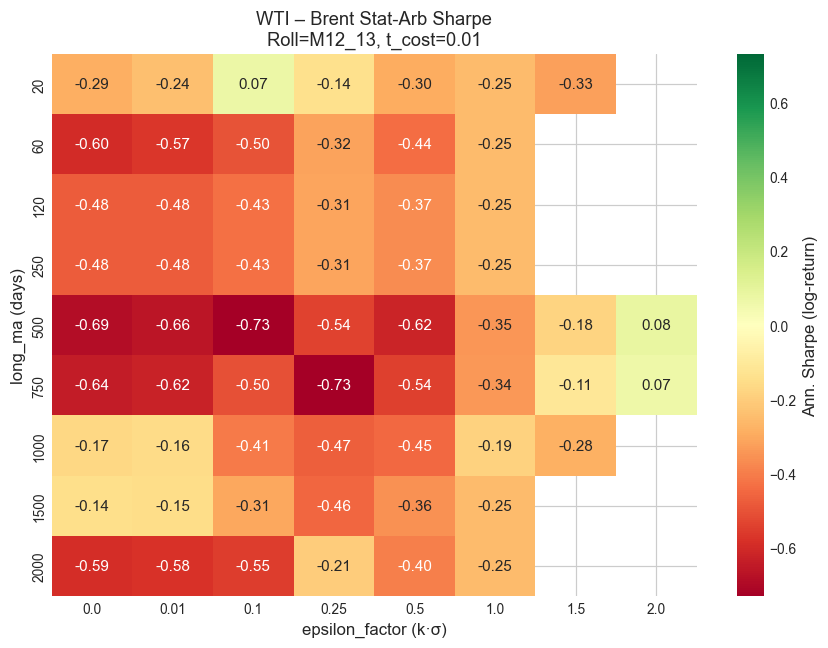

,Leg_i,Leg_j,Best_Sharpe,Best_Lookback,Best_Epsilon
1,Propane,Ethane,0.6237,60,0.1000
5,Brent,ULSD,0.5233,60,1.5000
2,Propane,Butane,0.5140,500,0.1000
0,Ethane,Natgas,0.4812,1000,1.5000
4,RBOB,Brent,0.4167,2000,1.5000
6,ULSD,WTI,0.3467,60,1.0000
3,Butane,RBOB,0.3211,20,0.0000
7,WTI,Brent,0.0830,500,2.0000


In [20]:
# =====================================================================
# Per-Spread Stat-Arb Decomposition (LOG-SCALED, PURE PRICE SIGNALS)
# =====================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# -------------------------------------------------
# 1) Config
# -------------------------------------------------
HIST_START  = "2010-01-01"
TRADE_START = "2015-01-01"

SELECTED_ROLL_SETUP = "M12_13"

SELECTED_PARAMS = {
    "t_cost": 0.01,
}

ROLL_SETUPS = {
    "Base_short": {"kind": "base"},
    "M6_7":       {"kind": "tenor", "front": "F6",  "next": "F7"},
    "M9_10":      {"kind": "tenor", "front": "F9",  "next": "F10"},
    "M12_13":     {"kind": "tenor", "front": "F12", "next": "F13"},
}

RAW_PAIRS = [
    ("Ethane", "Natgas"),
    ("Propane", "Ethane"),
    ("Propane", "Butane"),
    ("Butane", "RBOB"),
    ("RBOB", "Brent"),
    ("Brent", "ULSD"),
    ("ULSD", "WTI"),
    ("WTI", "Brent"),
]

STAT_ARB_INIT_CAPITAL = 10_000_000.0

if SELECTED_ROLL_SETUP not in ROLL_SETUPS:
    raise ValueError(f"Unknown roll '{SELECTED_ROLL_SETUP}'.")

setup_cfg = ROLL_SETUPS[SELECTED_ROLL_SETUP]

# -------------------------------------------------
# 2) Helpers
# -------------------------------------------------

def _annualized_sharpe(log_ret: pd.Series, min_obs=60):
    lr = log_ret.replace([np.inf, -np.inf], np.nan).dropna()
    if lr.size < min_obs:
        return np.nan
    vol = lr.std()
    if vol == 0 or np.isnan(vol): return np.nan
    return (lr.mean() / vol) * np.sqrt(252)

def _scale_pnl_to_log_equity(net_pnl, init_capital=STAT_ARB_INIT_CAPITAL):
    if net_pnl is None or net_pnl.empty:
        idx = net_pnl.index if net_pnl is not None else None
        return pd.Series(index=idx, dtype=float), pd.Series(index=idx, dtype=float)

    net = net_pnl.fillna(0.0)
    cum = net.cumsum()
    eq  = init_capital + cum
    eq  = eq.clip(lower=1e-9)

    eq_norm = eq / init_capital
    log_ret = np.log(eq_norm / eq_norm.shift(1))
    log_ret = log_ret.replace([np.inf, -np.inf], np.nan)
    return eq_norm, log_ret


# -------------------------------------------------
# 3) Build rolled legs + PURE (true) price levels for spreads
# -------------------------------------------------
def _build_legs_for_roll_setup(roll_name, cfg_setup):
    rolled_legs = {}
    pure_cols   = {}

    for commodity, cfg in BASE_ROLL_STYLES.items():
        if commodity not in COMMODITIES:
            continue

        ticker, contracts, units, tc = COMMODITIES[commodity]

        prices_full = load_prices(commodity, ticker, normalize=True)
        prices_full = prices_full.loc[HIST_START:].sort_index()
        if prices_full.empty:
            continue

        expiry = load_expiry(ticker)
        cols   = prices_full.columns
        kind   = cfg_setup["kind"]

        # ---------- A) Base style ----------
        if kind == "base":
            style = cfg["style"]
            fcol  = cfg.get("front_col", "F1")
            ncol  = cfg.get("next_col",  "F2")

            rs = RollingStrategy(
                prices=prices_full,
                expiry_calendar=expiry,
                front_col=fcol,
                next_col=ncol,
            )

            if style == "eom_ngl":
                rolled_df = rs.equity(
                    style="eom_ngl", t_cost=tc,
                    mid_col=cfg.get("mid_col","F3"),
                    far_col=cfg.get("far_col","F4")
                )
            elif style == "eom_mid":
                rolled_df = rs.equity(style="eom_mid", t_cost=tc)
            elif style == "eom_dynamic":
                rolled_df = rs.equity(
                    style="eom_dynamic", t_cost=tc,
                    third_col=cfg.get("third_col","F3")
                )
            elif style == "eom_eom":
                rolled_df = rs.equity(
                    style="eom_eom", t_cost=tc,
                    third_col=cfg.get("third_col","F3")
                )
            else:
                raise ValueError("Unknown base style.")

            rolled_df = rolled_df.sort_index()

            # PURE PRICE FIX:
            if roll_name == "Base_short":
                pure_px = prices_full.get("F3", prices_full.iloc[:,2])
            else:
                pure_px = prices_full.get(fcol, prices_full.iloc[:,0])

        # ---------- B) Tenor-based ----------
        elif kind == "tenor":
            front = cfg_setup["front"]
            nxt   = cfg_setup["next"]

            if front not in cols:
                front = cols[0]
            if nxt not in cols:
                nxt = cols[1] if len(cols)>1 else front

            rs = RollingStrategy(
                prices=prices_full,
                expiry_calendar=expiry,
                front_col=front,
                next_col=nxt,
            )

            rolled_df = rs.equity(style="eom_mid", t_cost=tc).sort_index()

            # PURE PRICE = FRONT tenor
            pure_px = prices_full[front].astype(float)

        else:
            raise ValueError("Unknown roll kind.")

        for col in ["daily_pnl","t_cost","roll_day_flag"]:
            if col not in rolled_df.columns:
                raise ValueError(f"{col} missing for {commodity}")

        pure_px = pure_px.reindex(rolled_df.index).ffill()

        rolled_legs[commodity] = rolled_df
        pure_cols[commodity]   = pure_px

    if len(rolled_legs) < 2:
        raise RuntimeError("Need >=2 legs.")

    pure_spread_prices = (
        pd.DataFrame(pure_cols)
        .dropna(how="all")
        .sort_index()
    )

    return rolled_legs, pure_spread_prices


rolled_legs, pure_prices = _build_legs_for_roll_setup(
    SELECTED_ROLL_SETUP, setup_cfg
)

available = set(rolled_legs.keys())

pairs = [(a,b) for (a,b) in RAW_PAIRS if a in available and b in available]
if not pairs:
    raise RuntimeError("No valid spreads available.")

print(f"[Per-Spread] Roll={SELECTED_ROLL_SETUP}, Pairs={len(pairs)}")


# -------------------------------------------------
# 4) Per-spread heatmaps (pure price signals)
# -------------------------------------------------
LOOKBACK_GRID = [20, 60, 120, 250, 500, 750, 1000, 1500, 2000]
EPS_GRID      = [0, 0.01, 0.1, 0.25, 0.5, 1.0, 1.5, 2.0]

per_spread_best = []

for (c_i, c_j) in pairs:
    print(f"\n=== Spread: {c_i} – {c_j} ===")

    legs = {c_i: rolled_legs[c_i], c_j: rolled_legs[c_j]}
    px   = pure_prices[[c_i, c_j]]

    sharpe_grid = pd.DataFrame(index=LOOKBACK_GRID, columns=EPS_GRID, dtype=float)

    best_s  = -np.inf
    best_L  = None
    best_eps= None

    for L in LOOKBACK_GRID:
        for eps in EPS_GRID:

            sa = statistical_arbitrage(
                rolled_legs=legs,
                prices=px,                     # sizing anchors
                pure_spread_prices=px,         # *** pure levels for signal ***
                pairs=[(c_i,c_j)],
                long_ma=L,
                vol_window=L,
                epsilon_factor=eps,
                t_cost=SELECTED_PARAMS["t_cost"],
            )

            sa = sa.loc[TRADE_START:].copy()
            if sa.empty:
                sharpe_grid.loc[L,eps] = np.nan
                continue

            _, lr = _scale_pnl_to_log_equity(sa["net_pnl"])
            sr = _annualized_sharpe(lr)
            sharpe_grid.loc[L,eps] = sr

            if np.isfinite(sr) and sr > best_s:
                best_s  = sr
                best_L  = L
                best_eps= eps

    per_spread_best.append({
        "Leg_i": c_i,
        "Leg_j": c_j,
        "Best_Sharpe": best_s,
        "Best_Lookback": best_L,
        "Best_Epsilon": best_eps
    })

    print(f"Best Sharpe={best_s:.3f}, L={best_L}, k={best_eps}")

    # Heatmap
    plt.figure(figsize=(8,6))
    data = sharpe_grid.astype(float)
    vmin = np.nanmin(data.values)
    vmax = np.nanmax(data.values)
    absmax = max(abs(vmin), abs(vmax)) if np.isfinite(vmin) else 1

    sns.heatmap(
        data,
        annot=True,
        fmt=".2f",
        cmap="RdYlGn",
        center=0,
        vmin=-absmax,
        vmax=absmax,
        cbar_kws={"label": "Ann. Sharpe (log-return)"}
    )
    plt.title(
        f"{c_i} – {c_j} Stat-Arb Sharpe\n"
        f"Roll={SELECTED_ROLL_SETUP}, t_cost={SELECTED_PARAMS['t_cost']}"
    )
    plt.xlabel("epsilon_factor (k·σ)")
    plt.ylabel("long_ma (days)")
    plt.tight_layout()
    plt.show()

best_table = pd.DataFrame(per_spread_best)
display(best_table.sort_values("Best_Sharpe", ascending=False))



### WTI-Brent Redo

WTI–Brent (M3/M4 roll) IR grid, 2016-01-01–2020-06-30:


,0.0000,0.2500,0.5000,0.7500,1.0000,1.2500,1.5000,1.7500,2.0000
20,0.9500,0.9800,0.7700,0.4100,0.1800,-0.2500,-0.0900,-0.1600,-0.4500
40,0.4300,0.6600,0.5400,0.5100,0.0700,0.0100,-0.3000,-0.2000,-0.3500
60,0.6200,0.5400,0.5700,0.2100,-0.0300,-0.1700,-0.1800,-0.0400,-0.1500
90,0.3900,0.4100,0.3300,0.4500,0.1400,-0.0600,-0.1100,-0.1300,-0.1200
120,0.2800,0.1800,0.3600,0.1700,0.2100,-0.0200,0.0900,0.1300,0.0000
150,-0.0600,-0.2100,0.0700,0.0800,0.2000,-0.1100,0.0300,0.0900,0.2200
200,-0.2200,-0.2800,-0.3200,-0.1100,-0.1300,0.2700,-0.0900,0.0800,0.2000
250,-0.1400,-0.4100,-0.4600,-0.2200,-0.0600,0.0500,0.2500,0.0800,0.0800


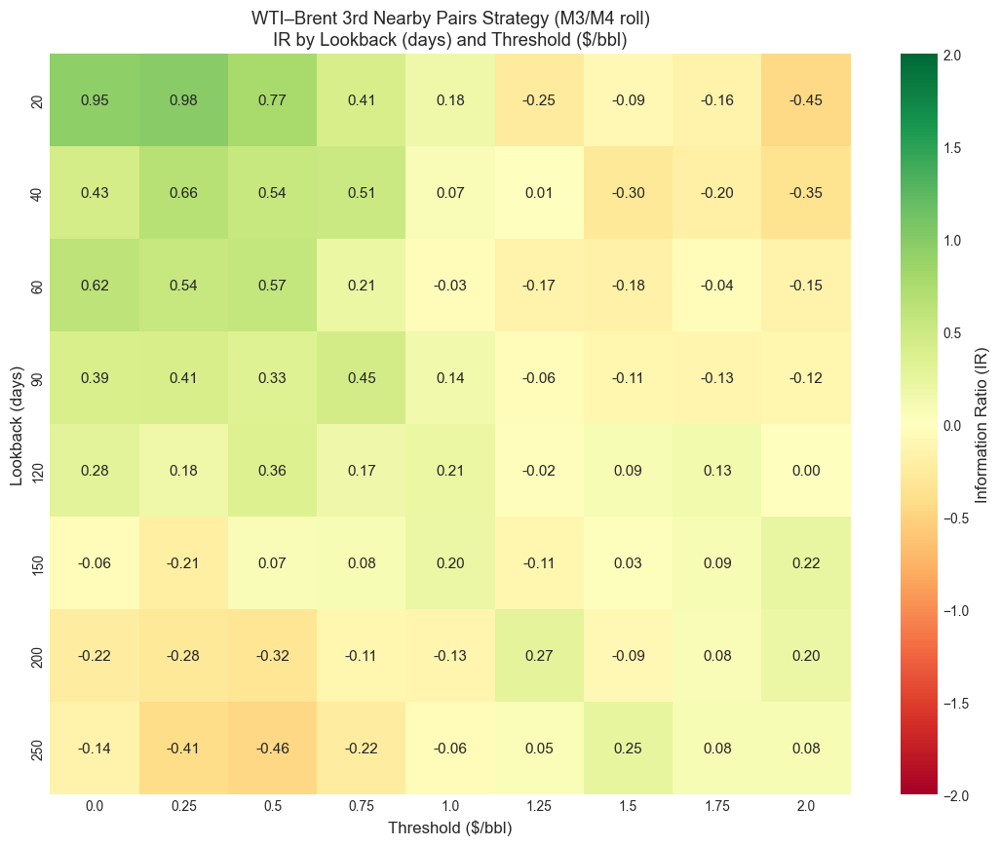


Best params: L=20, threshold=0.25, IR=0.983


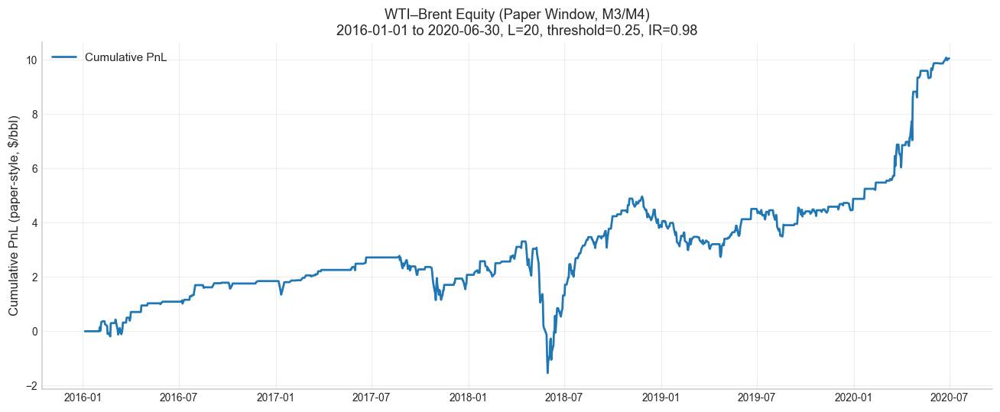

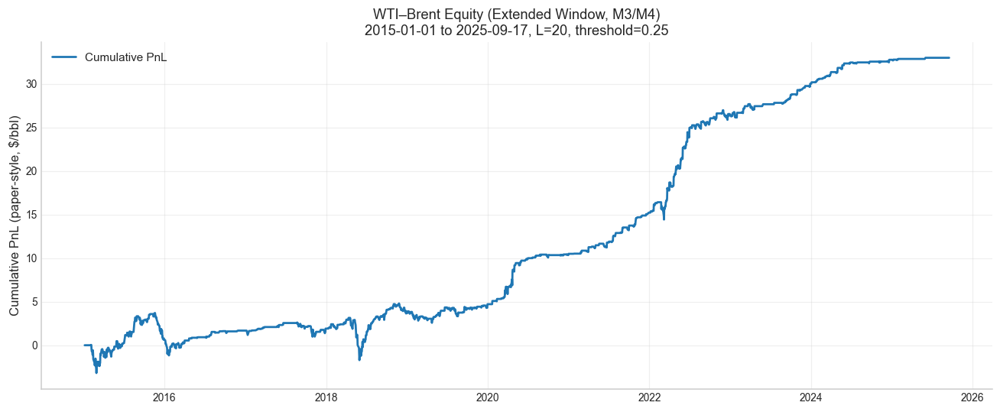

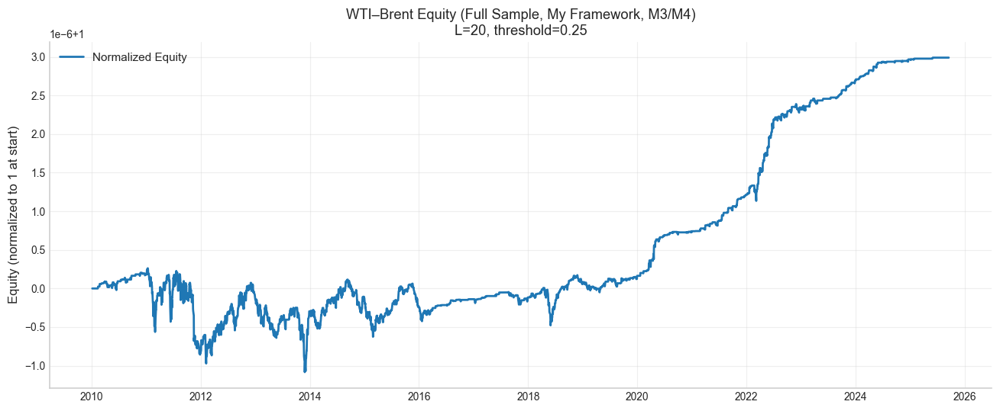

Approx. z-score equivalent: k ≈ 0.92 (σ ≈ 0.273, threshold=0.25)


ValueError: pure_spread_prices MUST be provided (never use rolled anchors for signals).

In [21]:
# ----------------------------------------------------------------------
# 6) WTI–Brent on M3/M4:
#    1) Build IR grid (paper-style, $ thresholds)
#    2) Equity curves for best (L, threshold):
#         - Paper window (2016–2020), cumulative $/bbl PnL
#         - Extended (2015–2025), cumulative $/bbl PnL
#         - Full sample, fixed-capital equity (my framework)
#    3) Map $ threshold to z-score k·σ and run stat-arb engine once
# ----------------------------------------------------------------------

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

PAPER_START = "2016-01-01"
PAPER_END   = "2020-06-30"

LOOKBACKS       = [20, 40, 60, 90, 120, 150, 200, 250]
THRESHOLDS      = [0.0, 0.25, 0.5, 0.75, 1.0, 1.25, 1.5, 1.75, 2.0]
T_COST_PER_BBL  = 0.0      # like the paper
STAT_ARB_INIT_CAPITAL = 10_000_000.0

# --- 6.0 Ensure M3_4 roll exists and build WTI/Brent rolled curves ----
if "M3_4" not in ROLL_SETUPS:
    ROLL_SETUPS = dict(ROLL_SETUPS)
    ROLL_SETUPS["M3_4"] = {"kind": "tenor", "front": "F11", "next": "F12"}

SELECTED_ROLL_SETUP = "M3_4"
setup_cfg = ROLL_SETUPS[SELECTED_ROLL_SETUP]

rolled_legs_m3_4, prices_all_m3_4 = _build_legs_for_roll_setup(
    SELECTED_ROLL_SETUP, setup_cfg
)

if ("WTI" not in prices_all_m3_4.columns) or ("Brent" not in prices_all_m3_4.columns):
    raise RuntimeError("WTI/Brent missing from prices_all_m3_4 for M3_4 roll.")

curves_full = prices_all_m3_4[["WTI", "Brent"]].copy().rename(
    columns={"WTI": "WTI_curve", "Brent": "Brent_curve"}
).dropna()

curves_full["spread"] = curves_full["WTI_curve"] - curves_full["Brent_curve"]

# Paper window subset for IR grid
curves_paper = curves_full.loc[PAPER_START:PAPER_END].copy()
if curves_paper.empty:
    raise RuntimeError("No WTI/Brent data in the paper window for M3_4 roll.")

# ----------------------------------------------------------------------
# 6.1 Build IR grid (paper-style, $ thresholds) on the M3/M4 rolled spread
# ----------------------------------------------------------------------
def build_paper_pnl(spread: pd.Series,
                    lookback: int,
                    threshold: float,
                    t_cost_per_bbl: float = T_COST_PER_BBL) -> pd.Series:
    """
    Paper-style PnL:
      - MA(L) on spread levels
      - long when spread < MA - threshold
      - short when spread > MA + threshold
      - PnL = pos_{t-1} * Δspread - t_cost_per_bbl * |Δpos|
    """
    s = spread.copy()
    ma = s.rolling(lookback).mean()
    dev = s - ma

    pos = pd.Series(0.0, index=s.index)
    pos[dev < -threshold] = +1.0
    pos[dev > +threshold] = -1.0
    pos = pos.ffill().fillna(0.0)

    ds = s.diff()
    dpos = pos.diff().abs()
    tcost = -t_cost_per_bbl * dpos

    pnl = pos.shift(1) * ds + tcost
    return pnl.dropna()

def paper_ir(spread: pd.Series, lookback: int, threshold: float) -> float:
    pnl = build_paper_pnl(spread, lookback, threshold)
    if pnl.std() == 0 or np.isnan(pnl.std()):
        return np.nan
    return pnl.mean() / pnl.std() * np.sqrt(252)

ir_grid_roll = pd.DataFrame(index=LOOKBACKS, columns=THRESHOLDS, dtype=float)

for L in LOOKBACKS:
    for th in THRESHOLDS:
        ir = paper_ir(curves_paper["spread"], L, th)
        ir_grid_roll.loc[L, th] = ir

print(f"WTI–Brent (M3/M4 roll) IR grid, {PAPER_START}–{PAPER_END}:")
display(ir_grid_roll.round(2))

plt.figure(figsize=(10, 8))
sns.heatmap(
    ir_grid_roll.astype(float),
    annot=True,
    fmt=".2f",
    cmap="RdYlGn",
    vmin=-2.0,
    vmax= 2.0,
    cbar_kws={"label": "Information Ratio (IR)"},
)
plt.title(
    "WTI–Brent 3rd Nearby Pairs Strategy (M3/M4 roll)\n"
    "IR by Lookback (days) and Threshold ($/bbl)"
)
plt.xlabel("Threshold ($/bbl)")
plt.ylabel("Lookback (days)")
plt.tight_layout()
plt.show()

# ----------------------------------------------------------------------
# 6.2 Equity curves for best (L, threshold)
# ----------------------------------------------------------------------
valid_ir = ir_grid_roll.replace([np.inf, -np.inf], np.nan).stack()
if valid_ir.empty:
    print("No valid IRs in grid; skipping equity plots.")
else:
    best_L, best_th = valid_ir.idxmax()
    best_ir = valid_ir.max()
    print(f"\nBest params: L={best_L}, threshold={best_th:.2f}, IR={best_ir:.3f}")

    # ---- (1) Paper window equity (2016–2020), cumulative $/bbl ----
    pnl_paper = build_paper_pnl(curves_paper["spread"], best_L, best_th)
    eq_paper = pnl_paper.cumsum()

    plt.figure(figsize=(12, 5))
    plt.plot(eq_paper.index, eq_paper, linewidth=1.8, label="Cumulative PnL")
    plt.title(
        f"WTI–Brent Equity (Paper Window, M3/M4)\n"
        f"{PAPER_START} to {PAPER_END}, "
        f"L={best_L}, threshold={best_th:.2f}, IR={best_ir:.2f}"
    )
    plt.ylabel("Cumulative PnL (paper-style, $/bbl)")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # ---- (2) Extended 2015–2025 window, same parameters ----
    curves_ext = curves_full.loc["2015-01-01":].copy()
    pnl_ext = build_paper_pnl(curves_ext["spread"], best_L, best_th)
    eq_ext = pnl_ext.cumsum()

    plt.figure(figsize=(12, 5))
    plt.plot(eq_ext.index, eq_ext, linewidth=1.8, label="Cumulative PnL")
    plt.title(
        f"WTI–Brent Equity (Extended Window, M3/M4)\n"
        f"2015-01-01 to {eq_ext.index[-1].date()}, "
        f"L={best_L}, threshold={best_th:.2f}"
    )
    plt.ylabel("Cumulative PnL (paper-style, $/bbl)")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # ---- (3) Full-sample normalized equity in my framework ----
    pnl_full = build_paper_pnl(curves_full["spread"], best_L, best_th)
    cum_pnl_full = pnl_full.cumsum()

    equity_full = STAT_ARB_INIT_CAPITAL + cum_pnl_full
    eq_norm_full = equity_full / STAT_ARB_INIT_CAPITAL

    plt.figure(figsize=(12, 5))
    plt.plot(eq_norm_full.index, eq_norm_full, linewidth=1.8, label="Normalized Equity")
    plt.title(
        f"WTI–Brent Equity (Full Sample, My Framework, M3/M4)\n"
        f"L={best_L}, threshold={best_th:.2f}"
    )
    plt.ylabel("Equity (normalized to 1 at start)")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # ------------------------------------------------------------------
    # 6.3 Map $ threshold to z-score k·σ and run stat-arb engine once
    # ------------------------------------------------------------------
    spread_for_sigma = curves_paper["spread"]
    rolling_std = spread_for_sigma.rolling(best_L).std()
    sigma_est = rolling_std.dropna().mean()
    if sigma_est is not None and sigma_est > 0:
        k_equiv = best_th / sigma_est
    else:
        k_equiv = np.nan

    print(
        f"Approx. z-score equivalent: k ≈ {k_equiv:.2f} "
        f"(σ ≈ {sigma_est:.3f}, threshold={best_th:.2f})"
    )

    if np.isfinite(k_equiv):
        # Use same M3/M4 roll, but via generic stat-arb engine with k·σ trigger
        sub_rolled = {
            "WTI":  rolled_legs_m3_4["WTI"],
            "Brent": rolled_legs_m3_4["Brent"],
        }
        sub_prices = prices_all_m3_4[["WTI", "Brent"]]

        sa_df = statistical_arbitrage(
            rolled_legs=sub_rolled,
            prices=sub_prices,
            pairs=[("Brent", "WTI")],
            long_ma=int(best_L),
            vol_window=int(best_L),
            epsilon_factor=float(k_equiv),
            t_cost=0.0,   # match paper-style: no explicit costs
        ).loc[PAPER_START:PAPER_END].copy()

        if not sa_df.empty:
            eq_norm_z, log_ret_z = _scale_pnl_to_log_equity(sa_df["net_pnl"])
            ir_z = _annualized_sharpe(log_ret_z)
            print(f"Stat-arb engine IR with k≈{k_equiv:.2f} on 2016–2020: {ir_z:.2f}")

            plt.figure(figsize=(12, 5))
            plt.plot(eq_norm_z.index, eq_norm_z, linewidth=1.8, label="Stat-Arb (k·σ)")
            plt.title(
                f"WTI–Brent Equity — Stat-Arb Engine (M3/M4)\n"
                f"{PAPER_START} to {PAPER_END}, L={best_L}, k≈{k_equiv:.2f}, IR={ir_z:.2f}"
            )
            plt.ylabel("Equity (normalized, fixed-capital)")
            plt.grid(alpha=0.3)
            plt.legend()
            plt.tight_layout()
            plt.show()
        else:
            print("No trades or empty sa_df for the z-score stat-arb run.")



Rolled WTI–Brent (roll=M3_4) IR grid:


,0.0000,0.2500,0.5000,0.7500,1.0000,1.2500,1.5000,1.7500,2.0000
20,0.9800,0.7700,0.7800,0.4800,0.7100,0.6700,0.6300,0.5700,0.4500
40,0.9800,0.7000,0.5600,0.7800,0.8500,0.7500,0.7800,0.7400,0.5500
60,1.0400,1.0900,0.8000,0.4300,0.6500,0.8300,0.8100,0.5800,0.5500
90,0.7800,0.8700,0.6600,0.4200,0.6100,0.6800,0.9300,1.0200,0.7500
120,0.3900,0.6000,0.5500,0.4000,0.5800,0.6500,0.8800,0.9700,0.7900
150,0.3700,0.5600,0.4100,0.5500,0.5700,0.5700,0.7200,0.8100,0.8400
200,0.1800,0.2100,0.5700,0.4200,0.5200,0.4300,0.5800,0.5300,0.7300
250,0.1800,0.2500,0.2600,0.4600,0.7000,0.4000,0.3500,0.2600,0.4300


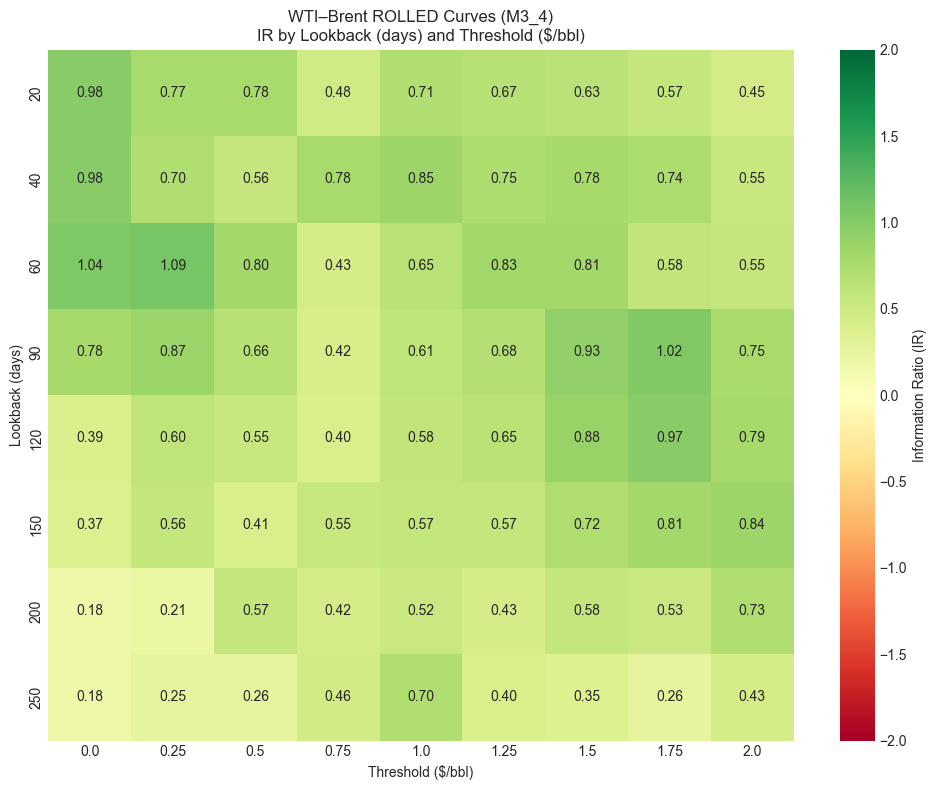

In [ ]:
# =====================================================================
# WTI–Brent: ROLLED CURVES GRID using existing tenor machinery (M3/M4)
#   Uses _build_legs_for_roll_setup and prices_all["WTI"/"Brent"]
# =====================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ----------------------------------------------------------------------
# 1) Parameters
# ----------------------------------------------------------------------
PAPER_START = "2016-01-01"
PAPER_END   = "2020-06-30"

LOOKBACKS   = [20, 40, 60, 90, 120, 150, 200, 250]
THRESHOLDS  = [0.0, 0.25, 0.5, 0.75, 1.0, 1.25, 1.5, 1.75, 2.0]
T_COST_PER_BBL = 0.0   # start with zero slippage, like the paper

# Add an M3_4 tenor roll setup (using your existing 'tenor' logic)
ROLL_SETUPS = dict(ROLL_SETUPS)  # copy to avoid mutating globally by accident
ROLL_SETUPS["M3_4"] = {"kind": "tenor", "front": "F3", "next": "F4"}

SELECTED_ROLL_SETUP = "M3_4"
if SELECTED_ROLL_SETUP not in ROLL_SETUPS:
    raise ValueError(f"Unknown roll setup '{SELECTED_ROLL_SETUP}'.")

setup_cfg = ROLL_SETUPS[SELECTED_ROLL_SETUP]


# ----------------------------------------------------------------------
# 2) Build rolled legs & anchor prices, then extract WTI/Brent curves
# ----------------------------------------------------------------------
rolled_legs, prices_all = _build_legs_for_roll_setup(
    SELECTED_ROLL_SETUP, setup_cfg
)

# prices_all columns are per commodity (e.g. "WTI", "Brent", ...)
if ("WTI" not in prices_all.columns) or ("Brent" not in prices_all.columns):
    raise RuntimeError(
        f"WTI/Brent not available in prices_all for roll setup {SELECTED_ROLL_SETUP}."
    )

curves = prices_all[["WTI", "Brent"]].copy().rename(
    columns={"WTI": "WTI_curve", "Brent": "Brent_curve"}
)
curves = curves.loc[PAPER_START:PAPER_END].dropna()

# Rolled spread in USD/bbl
curves["spread"] = curves["WTI_curve"] - curves["Brent_curve"]


# ----------------------------------------------------------------------
# 3) Strategy function — same logic as the paper
# ----------------------------------------------------------------------
def run_spread_strategy(spread: pd.Series, lookback: int, threshold: float) -> float:
    """
    Simple MA–threshold convergence strategy:
      - compute L-day MA
      - long when spread < MA − threshold
      - short when spread > MA + threshold
      - PnL = pos_{t-1} * Δspread  −  t_cost
      - IR = mean(PnL) / std(PnL) * sqrt(252)
    """
    s = spread.copy()
    ma = s.rolling(lookback).mean()
    dev = s - ma

    pos = pd.Series(0.0, index=s.index)
    pos[dev < -threshold] = +1.0
    pos[dev > +threshold] = -1.0
    pos = pos.ffill().fillna(0.0)

    ds = s.diff()
    dpos = pos.diff().abs()
    tcost = -T_COST_PER_BBL * dpos

    pnl = pos.shift(1) * ds + tcost
    pnl = pnl.dropna()

    if pnl.std() == 0 or np.isnan(pnl.std()):
        return np.nan

    ir = pnl.mean() / pnl.std() * np.sqrt(252)
    return ir


# ----------------------------------------------------------------------
# 4) Build IR grid across Lookback × Threshold on the rolled spread
# ----------------------------------------------------------------------
ir_grid_roll = pd.DataFrame(index=LOOKBACKS, columns=THRESHOLDS, dtype=float)

for L in LOOKBACKS:
    for th in THRESHOLDS:
        ir = run_spread_strategy(curves["spread"], lookback=L, threshold=th)
        ir_grid_roll.loc[L, th] = ir

print(f"Rolled WTI–Brent (roll={SELECTED_ROLL_SETUP}) IR grid:")
display(ir_grid_roll.round(2))


# ----------------------------------------------------------------------
# 5) Heatmap
# ----------------------------------------------------------------------
plt.figure(figsize=(10, 8))
sns.heatmap(
    ir_grid_roll.astype(float),
    annot=True,
    fmt=".2f",
    cmap="RdYlGn",
    vmin=-2.0,
    vmax= 2.0,
    cbar_kws={"label": "Information Ratio (IR)"},
)
plt.title(
    f"WTI–Brent ROLLED Curves ({SELECTED_ROLL_SETUP})\n"
    "IR by Lookback (days) and Threshold ($/bbl)"
)
plt.xlabel("Threshold ($/bbl)")
plt.ylabel("Lookback (days)")
plt.tight_layout()
plt.show()


Rolled WTI–Brent (roll=M12_13) IR grid:


,0.0000,0.2500,0.5000,0.7500,1.0000,1.2500,1.5000,1.7500,2.0000
20,0.8200,1.0800,0.5800,0.3500,-0.1600,-0.1600,-0.1700,-0.1400,-0.3600
40,0.5600,0.7000,0.6600,0.1700,0.1500,-0.3400,-0.2800,-0.1700,-0.2500
60,0.8400,0.3800,0.5400,-0.1100,-0.1500,-0.1900,0.0000,-0.0400,-0.1300
90,0.1800,0.2400,0.3800,0.2000,0.0500,-0.0700,-0.0700,-0.0700,-0.0900
120,0.3300,0.1200,0.0800,0.0300,-0.0600,-0.0700,0.1600,0.1400,-0.0700
150,-0.1800,0.0000,-0.1900,-0.0300,0.0700,-0.1200,-0.0200,0.0500,0.2500
200,-0.2800,-0.3500,-0.2700,-0.1000,0.0400,0.2500,-0.0200,-0.1400,0.1700
250,-0.4800,-0.4400,-0.4700,-0.3300,-0.1300,0.0900,0.3400,0.1200,-0.0600


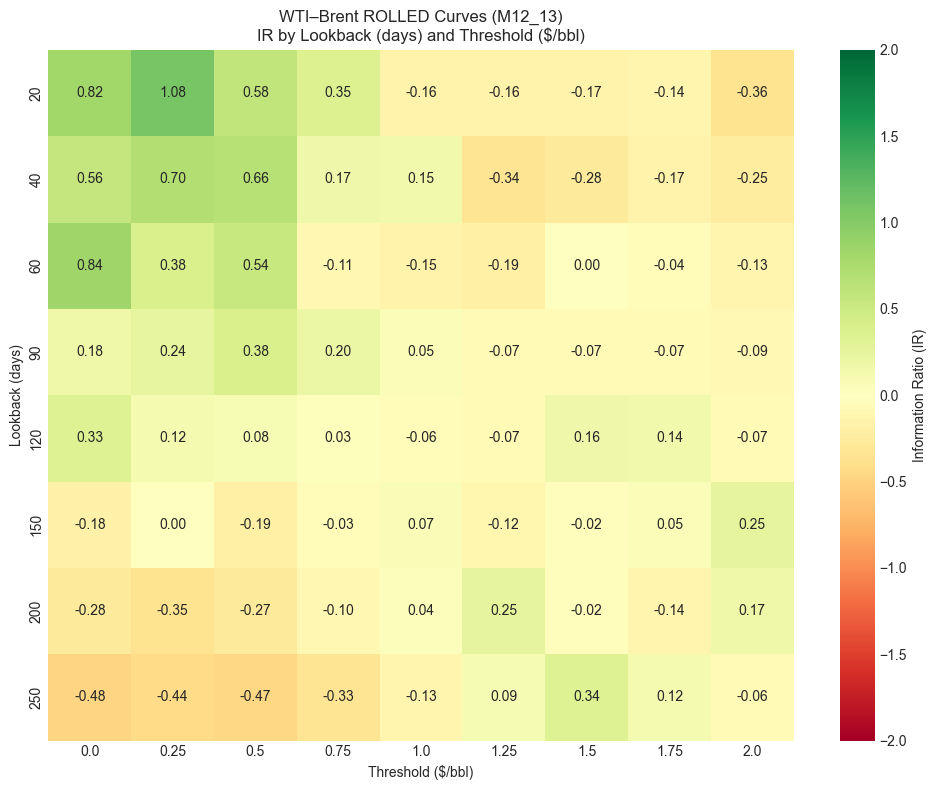

In [ ]:
# =====================================================================
# WTI–Brent: ROLLED CURVES GRID using existing tenor machinery (M12/M13)
#   Uses _build_legs_for_roll_setup and prices_all["WTI"/"Brent"]
# =====================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ----------------------------------------------------------------------
# 1) Parameters
# ----------------------------------------------------------------------
PAPER_START = "2016-01-01"
PAPER_END   = "2020-06-30"

LOOKBACKS      = [20, 40, 60, 90, 120, 150, 200, 250]
THRESHOLDS     = [0.0, 0.25, 0.5, 0.75, 1.0, 1.25, 1.5, 1.75, 2.0]
T_COST_PER_BBL = 0.0   # start with zero slippage, like the paper

# Use existing M12_13 tenor roll setup
ROLL_SETUPS_LOCAL = dict(ROLL_SETUPS)  # copy to avoid mutating the global
SELECTED_ROLL_SETUP = "M12_13"

if SELECTED_ROLL_SETUP not in ROLL_SETUPS_LOCAL:
    raise ValueError(f"Unknown roll setup '{SELECTED_ROLL_SETUP}'.")

setup_cfg = ROLL_SETUPS_LOCAL[SELECTED_ROLL_SETUP]

# ----------------------------------------------------------------------
# 2) Build rolled legs & anchor prices, then extract WTI/Brent curves
# ----------------------------------------------------------------------
rolled_legs, prices_all = _build_legs_for_roll_setup(
    SELECTED_ROLL_SETUP, setup_cfg
)

# prices_all columns are per commodity (e.g. "WTI", "Brent", ...)
if ("WTI" not in prices_all.columns) or ("Brent" not in prices_all.columns):
    raise RuntimeError(
        f"WTI/Brent not available in prices_all for roll setup {SELECTED_ROLL_SETUP}."
    )

curves = prices_all[["WTI", "Brent"]].copy().rename(
    columns={"WTI": "WTI_curve", "Brent": "Brent_curve"}
)

# Restrict to paper window and drop missing
curves = curves.loc[PAPER_START:PAPER_END].dropna()

# Rolled spread in USD/bbl
curves["spread"] = curves["WTI_curve"] - curves["Brent_curve"]

# ----------------------------------------------------------------------
# 3) Strategy function — same logic as the paper (constant $ band)
# ----------------------------------------------------------------------
def run_spread_strategy(spread: pd.Series, lookback: int, threshold: float) -> float:
    """
    Simple MA–threshold convergence strategy:
      - compute L-day MA
      - long when spread < MA − threshold
      - short when spread > MA + threshold
      - PnL = pos_{t-1} * Δspread  −  t_cost
      - IR = mean(PnL) / std(PnL) * sqrt(252)
    """
    s = spread.copy()
    ma = s.rolling(lookback).mean()
    dev = s - ma

    pos = pd.Series(0.0, index=s.index)
    pos[dev < -threshold] = +1.0
    pos[dev > +threshold] = -1.0
    pos = pos.ffill().fillna(0.0)

    ds = s.diff()
    dpos = pos.diff().abs()
    tcost = -T_COST_PER_BBL * dpos

    pnl = pos.shift(1) * ds + tcost
    pnl = pnl.dropna()

    if pnl.std() == 0 or np.isnan(pnl.std()):
        return np.nan

    ir = pnl.mean() / pnl.std() * np.sqrt(252)
    return ir

# ----------------------------------------------------------------------
# 4) Build IR grid across Lookback × Threshold on the rolled spread
# ----------------------------------------------------------------------
ir_grid_roll = pd.DataFrame(index=LOOKBACKS, columns=THRESHOLDS, dtype=float)

for L in LOOKBACKS:
    for th in THRESHOLDS:
        ir = run_spread_strategy(curves["spread"], lookback=L, threshold=th)
        ir_grid_roll.loc[L, th] = ir

print(f"Rolled WTI–Brent (roll={SELECTED_ROLL_SETUP}) IR grid:")
display(ir_grid_roll.round(2))

# ----------------------------------------------------------------------
# 5) Heatmap
# ----------------------------------------------------------------------
plt.figure(figsize=(10, 8))
sns.heatmap(
    ir_grid_roll.astype(float),
    annot=True,
    fmt=".2f",
    cmap="RdYlGn",
    vmin=-2.0,
    vmax= 2.0,
    cbar_kws={"label": "Information Ratio (IR)"},
)
plt.title(
    f"WTI–Brent ROLLED Curves ({SELECTED_ROLL_SETUP})\n"
    "IR by Lookback (days) and Threshold ($/bbl)"
)
plt.xlabel("Threshold ($/bbl)")
plt.ylabel("Lookback (days)")
plt.tight_layout()
plt.show()


# Portfolios

## Momentum (20)

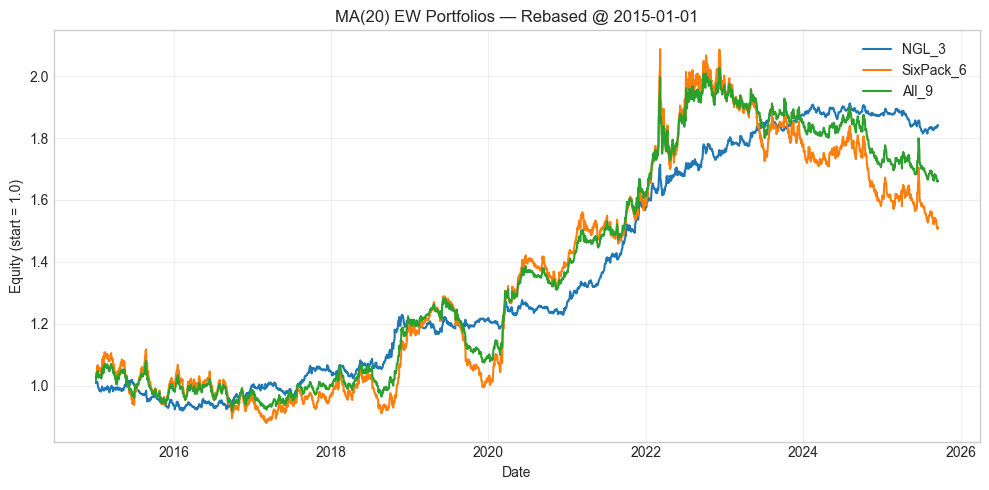

,Ann_Sharpe,Ann_Return,Ann_Vol,Max_DD
NGL_3,1.0415,0.0580,0.0542,-0.0981
SixPack_6,0.2566,0.0369,0.1378,-0.2780
All_9,0.4440,0.0468,0.1005,-0.1810


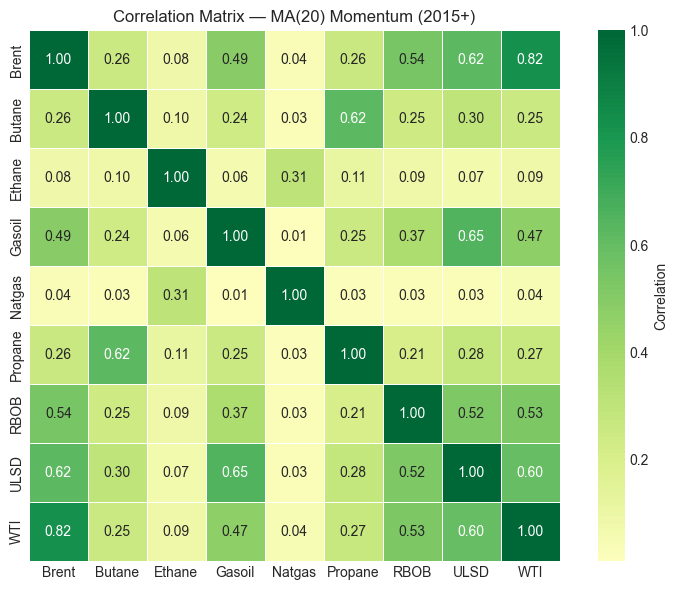

,Brent,Butane,Ethane,Gasoil,Natgas,Propane,RBOB,ULSD,WTI
Brent,1.0000,0.2560,0.0810,0.4900,0.0400,0.2650,0.5410,0.6180,0.8240
Butane,0.2560,1.0000,0.0960,0.2400,0.0270,0.6190,0.2460,0.2990,0.2510
Ethane,0.0810,0.0960,1.0000,0.0600,0.3050,0.1120,0.0940,0.0710,0.0930
Gasoil,0.4900,0.2400,0.0600,1.0000,0.0110,0.2520,0.3680,0.6540,0.4720
Natgas,0.0400,0.0270,0.3050,0.0110,1.0000,0.0260,0.0300,0.0290,0.0440
Propane,0.2650,0.6190,0.1120,0.2520,0.0260,1.0000,0.2120,0.2820,0.2670
RBOB,0.5410,0.2460,0.0940,0.3680,0.0300,0.2120,1.0000,0.5180,0.5290
ULSD,0.6180,0.2990,0.0710,0.6540,0.0290,0.2820,0.5180,1.0000,0.5960
WTI,0.8240,0.2510,0.0930,0.4720,0.0440,0.2670,0.5290,0.5960,1.0000


In [ ]:
# ==============================================================
# MA(20) EW Portfolios from 2015 + 9-Asset Correlation Matrix
# ==============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

MA_WINDOW     = 20
INIT_CAPITAL  = 10_000_000
WARMUP_START  = "2014-12-01"
START_DATE    = pd.Timestamp("2015-01-01")

NGL_NAMES = ["Propane", "Ethane", "Butane"]
SIX_PACK  = ["WTI", "Brent", "ULSD", "RBOB", "Natgas", "Gasoil"]

ALL_MA20 = {}   # commodity -> DataFrame with ['equity_norm', 'log_ret']


# ---------------- Per-commodity MA(20) strategies ----------------
for commodity, cfg in BASE_ROLL_STYLES.items():
    if commodity not in COMMODITIES:
        continue

    ticker, contracts, units, t_cost = COMMODITIES[commodity]

    # Prices with warmup
    prices = load_prices(commodity, ticker, normalize=True)
    prices = prices.loc[WARMUP_START:].sort_index()
    if prices.empty:
        continue

    expiry_cal = load_expiry(ticker)
    style      = cfg["style"]
    front_col  = cfg.get("front_col", "F1")
    next_col   = cfg.get("next_col", "F2")

    rs = RollingStrategy(
        prices=prices,
        expiry_calendar=expiry_cal,
        front_col=front_col,
        next_col=next_col,
    )

    if style == "eom_ngl":
        rolled_df = rs.equity(
            style="eom_ngl",
            t_cost=t_cost,
            mid_col=cfg.get("mid_col", "F3"),
            far_col=cfg.get("far_col", "F4"),
        )
    elif style == "eom_mid":
        rolled_df = rs.equity(style="eom_mid", t_cost=t_cost)
    elif style == "eom_dynamic":
        rolled_df = rs.equity(
            style="eom_dynamic",
            t_cost=t_cost,
            third_col=cfg.get("third_col", "F3"),
        )
    elif style == "eom_eom":
        rolled_df = rs.equity(
            style="eom_eom",
            t_cost=t_cost,
            third_col=cfg.get("third_col", "F3"),
        )
    else:
        continue

    rolled_df = rolled_df.sort_index()
    if not all(col in rolled_df.columns for col in ["daily_pnl", "t_cost", "roll_day_flag"]):
        continue

    # Run existing momentum() on warmup+trade
    mom_df = momentum(
        prices=prices,
        rolled_df=rolled_df,
        front_col=front_col,
        short_ma=1,
        long_ma=MA_WINDOW,
        t_cost=t_cost,
        epsilon=0.0,
    ).sort_index()

    if "net_pnl" not in mom_df.columns:
        continue

    # Trading account in USD
    exposure = contracts * units
    mom_df["pnl_usd"]        = mom_df["net_pnl"] * exposure
    mom_df["cum_pnl_usd"]    = mom_df["pnl_usd"].cumsum()
    mom_df["equity_account"] = INIT_CAPITAL + mom_df["cum_pnl_usd"]

    # Restrict to trade window & rebase at START_DATE
    trade = mom_df.loc[START_DATE:].copy()
    trade = trade[trade["equity_account"].notna()]
    if trade.empty:
        continue

    E0 = float(trade["equity_account"].iloc[0])
    if not np.isfinite(E0) or E0 <= 0:
        continue

    trade["equity_norm"] = trade["equity_account"] / E0

    # Log returns from rebased equity
    acc = trade["equity_norm"].astype(float)
    ret_ratio = acc / acc.shift(1)
    valid = (acc > 0) & (acc.shift(1) > 0) & ret_ratio.notna()

    trade["log_ret"] = np.nan
    trade.loc[valid, "log_ret"] = np.log(ret_ratio[valid])

    ALL_MA20[commodity] = trade[["equity_norm", "log_ret"]]


# ---------------- Helper: build EW portfolio ----------------
def build_portfolio(name, commodities):
    cols = [c for c in commodities if c in ALL_MA20]
    if len(cols) == 0:
        return None

    # Stack log returns
    logret_df = pd.concat(
        {c: ALL_MA20[c]["log_ret"].astype(float) for c in cols},
        axis=1
    ).sort_index()

    # Convert to linear returns, equally weight
    ret_df = np.exp(logret_df) - 1.0
    port_ret = ret_df.mean(axis=1, skipna=True)

    # Equity (start=1.0)
    port_eq = (1.0 + port_ret).cumprod()

    # Portfolio log returns from its own equity
    rr = port_eq / port_eq.shift(1)
    port_log_ret = np.log(rr.where(rr > 0))

    lr = port_log_ret.dropna()
    if lr.empty:
        return None

    # Metrics
    eq_end = float(np.exp(lr.cumsum()).iloc[-1])
    years = (lr.index[-1] - lr.index[0]).days / 365.25
    ann_ret = (eq_end ** (1 / years) - 1.0) if years > 0 else np.nan
    ann_vol = lr.std() * np.sqrt(252)
    sharpe = _annualized_sharpe(lr)

    eq_curve = np.exp(lr.cumsum())
    dd = eq_curve / eq_curve.cummax() - 1.0
    max_dd = float(dd.min()) if len(dd) else np.nan

    return {
        "name": name,
        "equity": port_eq,
        "log_ret": port_log_ret,
        "Ann_Sharpe": sharpe,
        "Ann_Return": ann_ret,
        "Ann_Vol": ann_vol,
        "Max_DD": max_dd,
    }


# ---------------- Build 3 portfolios ----------------
ngl_port = build_portfolio("NGL_3", NGL_NAMES)
six_port = build_portfolio("SixPack_6", SIX_PACK)
all_port = build_portfolio("All_9", sorted(set(NGL_NAMES + SIX_PACK)))

ports = [p for p in [ngl_port, six_port, all_port] if p is not None]


# ---------------- Plot 3 lines ----------------
plt.figure(figsize=(10, 5))
for p in ports:
    plt.plot(p["equity"].index, p["equity"], label=p["name"])
plt.title(f"MA({MA_WINDOW}) EW Portfolios — Rebased @ {START_DATE.date()}")
plt.xlabel("Date")
plt.ylabel("Equity (start = 1.0)")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


# ---------------- Portfolio metrics table ----------------
metrics_df = pd.DataFrame(
    {
        p["name"]: {
            "Ann_Sharpe": p["Ann_Sharpe"],
            "Ann_Return": p["Ann_Return"],
            "Ann_Vol":    p["Ann_Vol"],
            "Max_DD":     p["Max_DD"],
        }
        for p in ports
    }
).T

display(metrics_df.round(4))


# ---------------- Correlation matrix: 9 MA(20) log returns ----------------
# Collect only the 9 target names (if present)
all_names = sorted(set(NGL_NAMES + SIX_PACK))
logret_all = pd.DataFrame(
    {
        c: ALL_MA20[c]["log_ret"].astype(float)
        for c in all_names
        if c in ALL_MA20
    }
).loc[START_DATE:].dropna(how="all")

corr_mat = logret_all.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(
    corr_mat,
    cmap="RdYlGn",
    center=0,
    annot=True,
    fmt=".2f",
    cbar_kws={"label": "Correlation"},
    square=True,
    linewidths=0.5,
)
plt.title(f"Correlation Matrix — MA({MA_WINDOW}) Momentum (2015+)")
plt.tight_layout()
plt.show()

display(corr_mat.round(3))


## Momentum (1/20, 10/100, 20/250)

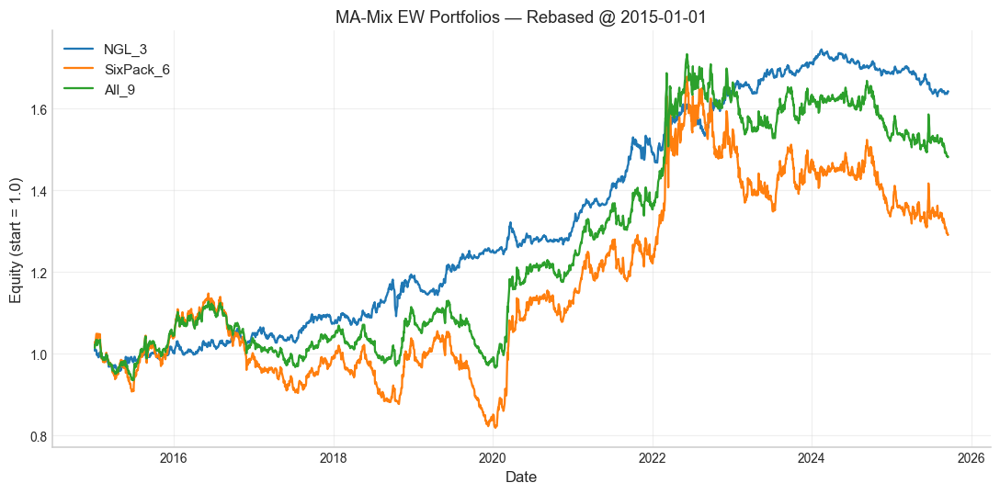

,Ann_Sharpe,Ann_Return,Ann_Vol,Max_DD
NGL_3,0.9947,0.0467,0.0460,-0.0758
SixPack_6,0.1772,0.0225,0.1228,-0.2867
All_9,0.3870,0.0361,0.0894,-0.1457


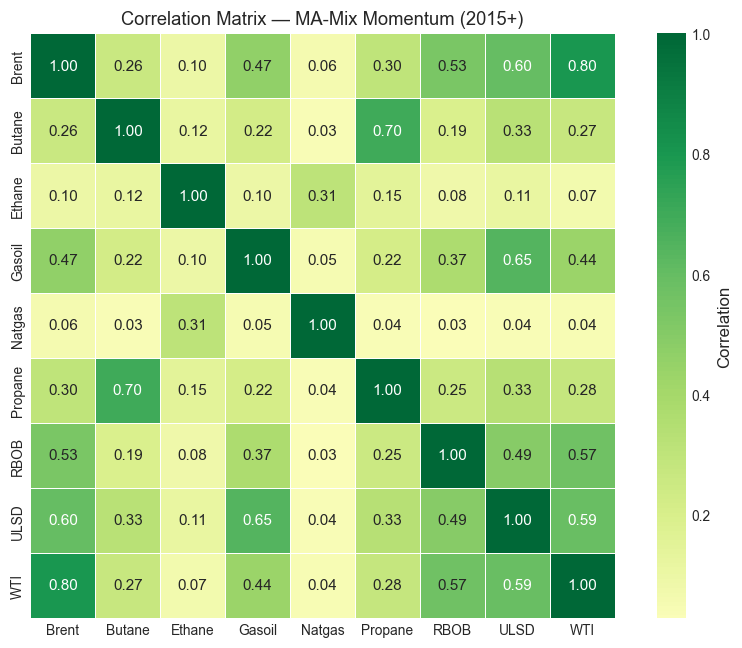

,Brent,Butane,Ethane,Gasoil,Natgas,Propane,RBOB,ULSD,WTI
Brent,1.0000,0.2630,0.0970,0.4680,0.0610,0.3030,0.5310,0.6010,0.7970
Butane,0.2630,1.0000,0.1190,0.2240,0.0330,0.7010,0.1900,0.3270,0.2730
Ethane,0.0970,0.1190,1.0000,0.1000,0.3070,0.1480,0.0830,0.1130,0.0690
Gasoil,0.4680,0.2240,0.1000,1.0000,0.0520,0.2160,0.3730,0.6470,0.4360
Natgas,0.0610,0.0330,0.3070,0.0520,1.0000,0.0390,0.0290,0.0350,0.0430
Propane,0.3030,0.7010,0.1480,0.2160,0.0390,1.0000,0.2520,0.3320,0.2820
RBOB,0.5310,0.1900,0.0830,0.3730,0.0290,0.2520,1.0000,0.4940,0.5680
ULSD,0.6010,0.3270,0.1130,0.6470,0.0350,0.3320,0.4940,1.0000,0.5900
WTI,0.7970,0.2730,0.0690,0.4360,0.0430,0.2820,0.5680,0.5900,1.0000


In [42]:
# ==============================================================
# MA-Mix (1,20 + 10,100 + 20,250) EW Portfolios from 2015
# NGL (3) vs 6-Pack (6) vs All (9) + Correlation Matrix
# Uses existing momentum() with ma_pairs / weights
# ==============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

INIT_CAPITAL = 10_000_000
WARMUP_START = "2013-12-01"
START_DATE   = pd.Timestamp("2015-01-01")

MA_PAIRS   = [(1, 5), (5, 20), (10, 60)]
MA_WEIGHTS = None  # equal weights inside momentum()

NGL_NAMES = ["Propane", "Ethane", "Butane"]
SIX_PACK  = ["WTI", "Brent", "ULSD", "RBOB", "Natgas", "Gasoil"]

ALL_MA_MIX = {}   # commodity -> ['equity_norm', 'log_ret']


# ---------------- Per-commodity MA-Mix strategies ----------------
for commodity, cfg in BASE_ROLL_STYLES.items():
    if commodity not in COMMODITIES:
        continue

    ticker, contracts, units, t_cost = COMMODITIES[commodity]

    # Prices with warmup
    prices = load_prices(commodity, ticker, normalize=True)
    prices = prices.loc[WARMUP_START:].sort_index()
    if prices.empty:
        continue

    expiry_cal = load_expiry(ticker)
    style      = cfg["style"]
    front_col  = cfg.get("front_col", "F1")
    next_col   = cfg.get("next_col", "F2")

    rs = RollingStrategy(
        prices=prices,
        expiry_calendar=expiry_cal,
        front_col=front_col,
        next_col=next_col,
    )

    if style == "eom_ngl":
        rolled_df = rs.equity(
            style="eom_ngl",
            t_cost=t_cost,
            mid_col=cfg.get("mid_col", "F3"),
            far_col=cfg.get("far_col", "F4"),
        )
    elif style == "eom_mid":
        rolled_df = rs.equity(style="eom_mid", t_cost=t_cost)
    elif style == "eom_dynamic":
        rolled_df = rs.equity(
            style="eom_dynamic",
            t_cost=t_cost,
            third_col=cfg.get("third_col", "F3"),
        )
    elif style == "eom_eom":
        rolled_df = rs.equity(
            style="eom_eom",
            t_cost=t_cost,
            third_col=cfg.get("third_col", "F3"),
        )
    else:
        continue

    rolled_df = rolled_df.sort_index()
    if not all(col in rolled_df.columns for col in ["daily_pnl", "t_cost", "roll_day_flag"]):
        continue

    # MA-Mix using existing momentum()
    mom_df = momentum(
        prices=prices,
        rolled_df=rolled_df,
        front_col=front_col,
        short_ma=1,             # kept for API compatibility; actual mix via ma_pairs
        long_ma=20,
        t_cost=t_cost,
        epsilon=0.0,
        ma_pairs=MA_PAIRS,
        weights=MA_WEIGHTS,
    ).sort_index()

    if "net_pnl" not in mom_df.columns:
        continue

    # Trading account in USD
    exposure = contracts * units
    mom_df["pnl_usd"]        = mom_df["net_pnl"] * exposure
    mom_df["cum_pnl_usd"]    = mom_df["pnl_usd"].cumsum()
    mom_df["equity_account"] = INIT_CAPITAL + mom_df["cum_pnl_usd"]

    # Restrict to trade window & rebase at START_DATE
    trade = mom_df.loc[START_DATE:].copy()
    trade = trade[trade["equity_account"].notna()]
    if trade.empty:
        continue

    E0 = float(trade["equity_account"].iloc[0])
    if not np.isfinite(E0) or E0 <= 0:
        continue

    trade["equity_norm"] = trade["equity_account"] / E0

    # Log returns from rebased equity
    acc = trade["equity_norm"].astype(float)
    ret_ratio = acc / acc.shift(1)
    valid = (acc > 0) & (acc.shift(1) > 0) & ret_ratio.notna()

    trade["log_ret"] = np.nan
    trade.loc[valid, "log_ret"] = np.log(ret_ratio[valid])

    ALL_MA_MIX[commodity] = trade[["equity_norm", "log_ret"]]


# ---------------- Helper: build EW portfolio ----------------
def build_portfolio(name, commodities):
    cols = [c for c in commodities if c in ALL_MA_MIX]
    if len(cols) == 0:
        return None

    logret_df = pd.concat(
        {c: ALL_MA_MIX[c]["log_ret"].astype(float) for c in cols},
        axis=1
    ).sort_index()

    ret_df = np.exp(logret_df) - 1.0
    port_ret = ret_df.mean(axis=1, skipna=True)

    port_eq = (1.0 + port_ret).cumprod()

    rr = port_eq / port_eq.shift(1)
    port_log_ret = np.log(rr.where(rr > 0))
    lr = port_log_ret.dropna()
    if lr.empty:
        return None

    eq_end = float(np.exp(lr.cumsum()).iloc[-1])
    years = (lr.index[-1] - lr.index[0]).days / 365.25
    ann_ret = (eq_end ** (1 / years) - 1.0) if years > 0 else np.nan
    ann_vol = lr.std() * np.sqrt(252)
    sharpe = _annualized_sharpe(lr)

    eq_curve = np.exp(lr.cumsum())
    dd = eq_curve / eq_curve.cummax() - 1.0
    max_dd = float(dd.min()) if len(dd) else np.nan

    return {
        "name": name,
        "equity": port_eq,
        "log_ret": port_log_ret,
        "Ann_Sharpe": sharpe,
        "Ann_Return": ann_ret,
        "Ann_Vol": ann_vol,
        "Max_DD": max_dd,
    }


# ---------------- Build 3 portfolios ----------------
ngl_port = build_portfolio("NGL_3", NGL_NAMES)
six_port = build_portfolio("SixPack_6", SIX_PACK)
all_port = build_portfolio("All_9", sorted(set(NGL_NAMES + SIX_PACK)))

ports = [p for p in [ngl_port, six_port, all_port] if p is not None]


# ---------------- Plot 3 lines ----------------
plt.figure(figsize=(10, 5))
for p in ports:
    plt.plot(p["equity"].index, p["equity"], label=p["name"])
plt.title("MA-Mix EW Portfolios — Rebased @ {}".format(START_DATE.date()))
plt.xlabel("Date")
plt.ylabel("Equity (start = 1.0)")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


# ---------------- Metrics table ----------------
metrics_df = pd.DataFrame(
    {
        p["name"]: {
            "Ann_Sharpe": p["Ann_Sharpe"],
            "Ann_Return": p["Ann_Return"],
            "Ann_Vol":    p["Ann_Vol"],
            "Max_DD":     p["Max_DD"],
        }
        for p in ports
    }
).T

display(metrics_df.round(4))


# ---------------- Correlation matrix: 9 MA-Mix log returns ----------------
all_names = sorted(set(NGL_NAMES + SIX_PACK))
logret_all = pd.DataFrame(
    {
        c: ALL_MA_MIX[c]["log_ret"].astype(float)
        for c in all_names
        if c in ALL_MA_MIX
    }
).loc[START_DATE:].dropna(how="all")

corr_mat = logret_all.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(
    corr_mat,
    cmap="RdYlGn",
    center=0,
    annot=True,
    fmt=".2f",
    cbar_kws={"label": "Correlation"},
    square=True,
    linewidths=0.5,
)
plt.title("Correlation Matrix — MA-Mix Momentum (2015+)")
plt.tight_layout()
plt.show()

display(corr_mat.round(3))


## Carry

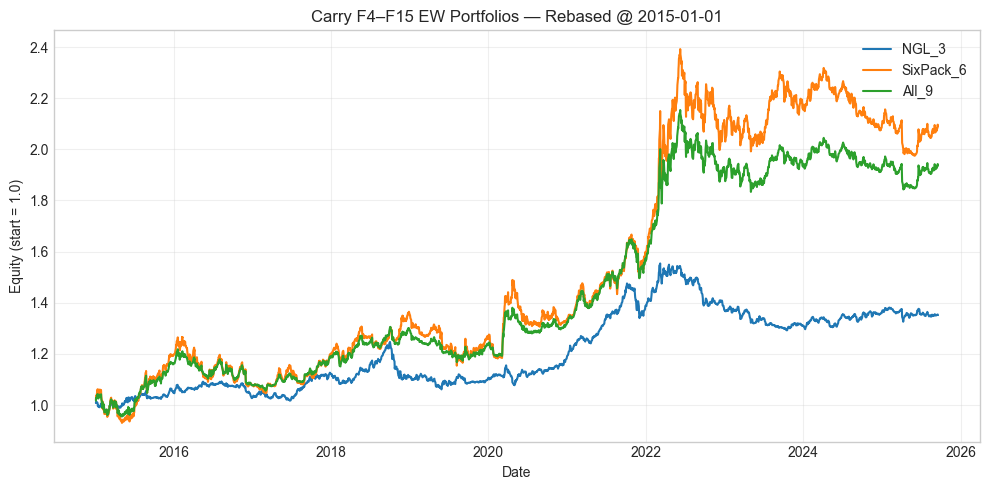

,Ann_Sharpe,Ann_Return,Ann_Vol,Max_DD
NGL_3,0.5027,0.0278,0.0546,-0.1684
SixPack_6,0.5107,0.0692,0.1278,-0.1743
All_9,0.6270,0.0621,0.0937,-0.1486


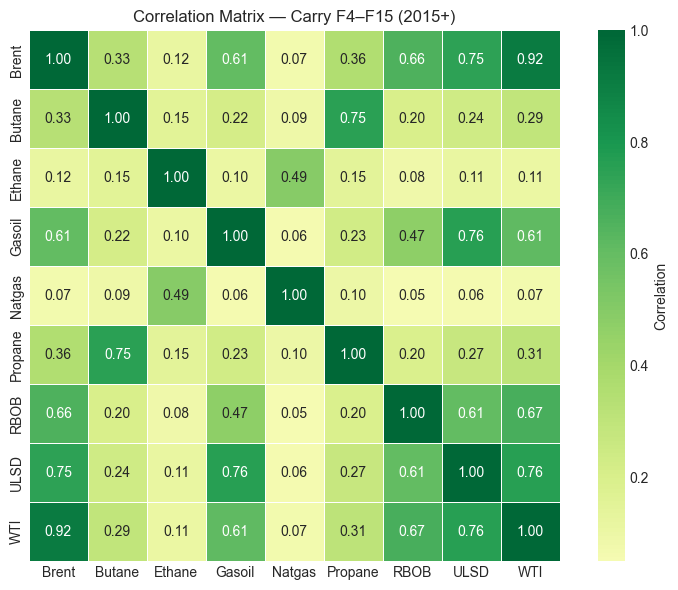

,Brent,Butane,Ethane,Gasoil,Natgas,Propane,RBOB,ULSD,WTI
Brent,1.0000,0.3330,0.1180,0.6100,0.0680,0.3610,0.6620,0.7470,0.9190
Butane,0.3330,1.0000,0.1520,0.2180,0.0940,0.7510,0.2010,0.2430,0.2920
Ethane,0.1180,0.1520,1.0000,0.1030,0.4930,0.1500,0.0830,0.1130,0.1060
Gasoil,0.6100,0.2180,0.1030,1.0000,0.0580,0.2330,0.4750,0.7550,0.6110
Natgas,0.0680,0.0940,0.4930,0.0580,1.0000,0.1000,0.0500,0.0630,0.0680
Propane,0.3610,0.7510,0.1500,0.2330,0.1000,1.0000,0.1970,0.2680,0.3130
RBOB,0.6620,0.2010,0.0830,0.4750,0.0500,0.1970,1.0000,0.6060,0.6720
ULSD,0.7470,0.2430,0.1130,0.7550,0.0630,0.2680,0.6060,1.0000,0.7560
WTI,0.9190,0.2920,0.1060,0.6110,0.0680,0.3130,0.6720,0.7560,1.0000


In [ ]:
# ==============================================================
# Carry F4–F15 EW Portfolios from 2015 + 9-Asset Correlation
# Uses existing: carry(), RollingStrategy, metrics()
# ==============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

INIT_CAPITAL    = 10_000_000
WARMUP_START    = "2014-12-01"
START_DATE      = pd.Timestamp("2015-01-01")

CARRY_FRONT_COL = "F4"
CARRY_END_COL   = "F15"

NGL_NAMES = ["Propane", "Ethane", "Butane"]
SIX_PACK  = ["WTI", "Brent", "ULSD", "RBOB", "Natgas", "Gasoil"]

ALL_CARRY = {}   # commodity -> ['equity_norm', 'log_ret']


# ---------------- Per-commodity Carry F4–F15 strategies ----------------
for commodity, cfg in BASE_ROLL_STYLES.items():
    if commodity not in COMMODITIES:
        continue

    ticker, contracts, units, t_cost = COMMODITIES[commodity]

    # Prices with warmup
    prices = load_prices(commodity, ticker, normalize=True)
    prices = prices.loc[WARMUP_START:].sort_index()
    if prices.empty:
        continue

    expiry_cal = load_expiry(ticker)
    style      = cfg["style"]
    front_col  = cfg.get("front_col", "F1")
    next_col   = cfg.get("next_col", "F2")

    rs = RollingStrategy(
        prices=prices,
        expiry_calendar=expiry_cal,
        front_col=front_col,
        next_col=next_col,
    )

    if style == "eom_ngl":
        rolled_df = rs.equity(
            style="eom_ngl",
            t_cost=t_cost,
            mid_col=cfg.get("mid_col", "F3"),
            far_col=cfg.get("far_col", "F4"),
        )
    elif style == "eom_mid":
        rolled_df = rs.equity(style="eom_mid", t_cost=t_cost)
    elif style == "eom_dynamic":
        rolled_df = rs.equity(
            style="eom_dynamic",
            t_cost=t_cost,
            third_col=cfg.get("third_col", "F3"),
        )
    elif style == "eom_eom":
        rolled_df = rs.equity(
            style="eom_eom",
            t_cost=t_cost,
            third_col=cfg.get("third_col", "F3"),
        )
    else:
        continue

    rolled_df = rolled_df.sort_index()
    if not all(col in rolled_df.columns for col in ["daily_pnl", "t_cost", "roll_day_flag"]):
        continue

    # Carry signal & PnL using existing carry()
    carry_df = carry(
        prices=prices,
        rolled_df=rolled_df,
        front_col=CARRY_FRONT_COL,
        end_col=CARRY_END_COL,
        t_cost=t_cost,
        epsilon=0.0,
    ).sort_index()

    if "net_pnl" not in carry_df.columns:
        continue

    # Trading account in USD over warmup+trade
    exposure = contracts * units
    carry_df["pnl_usd"]        = carry_df["net_pnl"] * exposure
    carry_df["cum_pnl_usd"]    = carry_df["pnl_usd"].cumsum()
    carry_df["equity_account"] = INIT_CAPITAL + carry_df["cum_pnl_usd"]

    # Restrict to trade window & rebase at START_DATE
    trade = carry_df.loc[START_DATE:].copy()
    trade = trade[trade["equity_account"].notna()]
    if trade.empty:
        continue

    E0 = float(trade["equity_account"].iloc[0])
    if not np.isfinite(E0) or E0 <= 0:
        continue

    trade["equity_norm"] = trade["equity_account"] / E0

    # Log returns from rebased equity
    acc = trade["equity_norm"].astype(float)
    ret_ratio = acc / acc.shift(1)
    valid = (acc > 0) & (acc.shift(1) > 0) & ret_ratio.notna()

    trade["log_ret"] = np.nan
    trade.loc[valid, "log_ret"] = np.log(ret_ratio[valid])

    ALL_CARRY[commodity] = trade[["equity_norm", "log_ret"]]


# ---------------- Helper: build EW portfolio ----------------
def build_portfolio(name, commodities):
    cols = [c for c in commodities if c in ALL_CARRY]
    if len(cols) == 0:
        return None

    logret_df = pd.concat(
        {c: ALL_CARRY[c]["log_ret"].astype(float) for c in cols},
        axis=1
    ).sort_index()

    ret_df = np.exp(logret_df) - 1.0
    port_ret = ret_df.mean(axis=1, skipna=True)

    port_eq = (1.0 + port_ret).cumprod()

    rr = port_eq / port_eq.shift(1)
    port_log_ret = np.log(rr.where(rr > 0))
    lr = port_log_ret.dropna()
    if lr.empty:
        return None

    eq_end = float(np.exp(lr.cumsum()).iloc[-1])
    years = (lr.index[-1] - lr.index[0]).days / 365.25
    ann_ret = (eq_end ** (1 / years) - 1.0) if years > 0 else np.nan
    ann_vol = lr.std() * np.sqrt(252)
    sharpe = _annualized_sharpe(lr)

    eq_curve = np.exp(lr.cumsum())
    dd = eq_curve / eq_curve.cummax() - 1.0
    max_dd = float(dd.min()) if len(dd) else np.nan

    return {
        "name": name,
        "equity": port_eq,
        "log_ret": port_log_ret,
        "Ann_Sharpe": sharpe,
        "Ann_Return": ann_ret,
        "Ann_Vol": ann_vol,
        "Max_DD": max_dd,
    }


# ---------------- Build 3 portfolios ----------------
ngl_port = build_portfolio("NGL_3", NGL_NAMES)
six_port = build_portfolio("SixPack_6", SIX_PACK)
all_port = build_portfolio("All_9", sorted(set(NGL_NAMES + SIX_PACK)))

ports = [p for p in [ngl_port, six_port, all_port] if p is not None]


# ---------------- Plot 3 EW portfolio curves ----------------
plt.figure(figsize=(10, 5))
for p in ports:
    plt.plot(p["equity"].index, p["equity"], label=p["name"])
plt.title(f"Carry F4–F15 EW Portfolios — Rebased @ {START_DATE.date()}")
plt.xlabel("Date")
plt.ylabel("Equity (start = 1.0)")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


# ---------------- Metrics table for the 3 portfolios ----------------
metrics_df = pd.DataFrame(
    {
        p["name"]: {
            "Ann_Sharpe": p["Ann_Sharpe"],
            "Ann_Return": p["Ann_Return"],
            "Ann_Vol":    p["Ann_Vol"],
            "Max_DD":     p["Max_DD"],
        }
        for p in ports
    }
).T

display(metrics_df.round(4))


# ---------------- Correlation matrix: 9 Carry log-return series ----------------
all_names = sorted(set(NGL_NAMES + SIX_PACK))
logret_all = pd.DataFrame(
    {
        c: ALL_CARRY[c]["log_ret"].astype(float)
        for c in all_names
        if c in ALL_CARRY
    }
).loc[START_DATE:].dropna(how="all")

corr_mat = logret_all.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(
    corr_mat,
    cmap="RdYlGn",
    center=0,
    annot=True,
    fmt=".2f",
    cbar_kws={"label": "Correlation"},
    square=True,
    linewidths=0.5,
)
plt.title("Correlation Matrix — Carry F4–F15 (2015+)")
plt.tight_layout()
plt.show()

display(corr_mat.round(3))


## Value

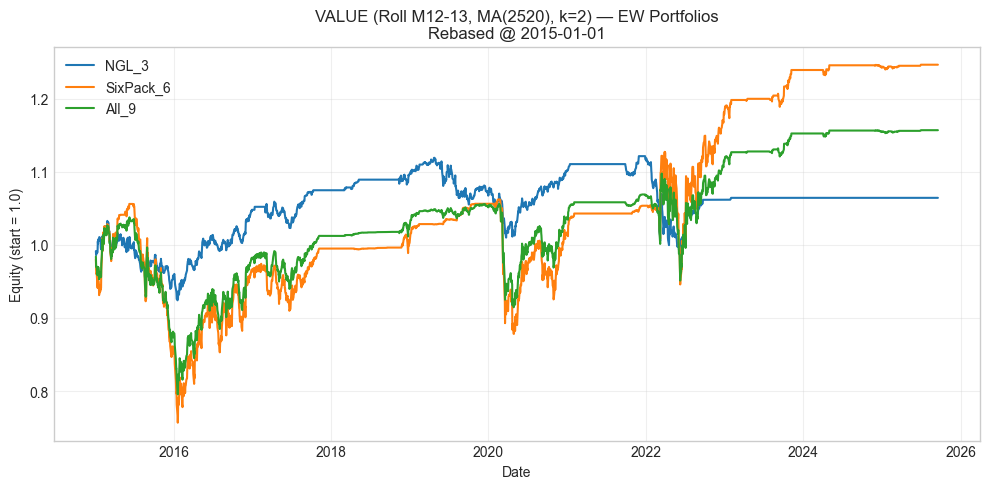

,Ann_Sharpe,Ann_Return,Ann_Vol,Max_DD
NGL_3,0.1538,0.0067,0.0432,-0.1216
SixPack_6,0.2220,0.0227,0.0987,-0.2834
All_9,0.1917,0.0152,0.0770,-0.2333


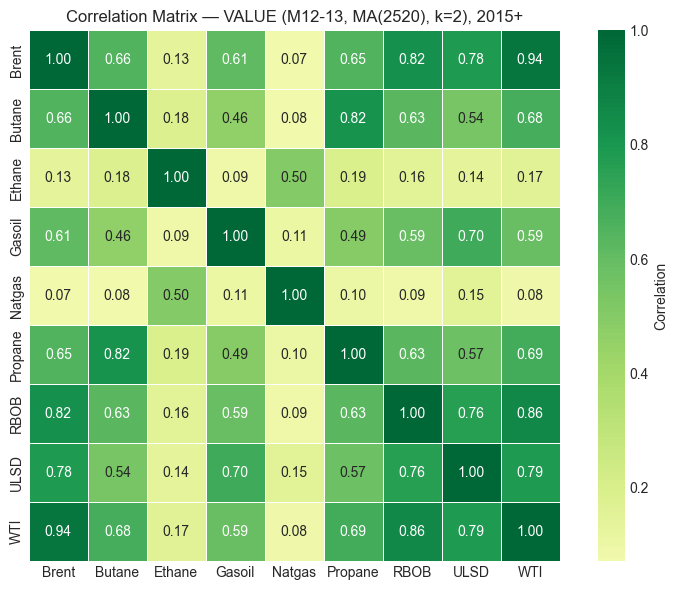

,Brent,Butane,Ethane,Gasoil,Natgas,Propane,RBOB,ULSD,WTI
Brent,1.0000,0.6550,0.1350,0.6090,0.0720,0.6510,0.8250,0.7790,0.9370
Butane,0.6550,1.0000,0.1810,0.4640,0.0760,0.8170,0.6280,0.5450,0.6780
Ethane,0.1350,0.1810,1.0000,0.0910,0.5010,0.1890,0.1580,0.1350,0.1650
Gasoil,0.6090,0.4640,0.0910,1.0000,0.1110,0.4930,0.5870,0.7020,0.5930
Natgas,0.0720,0.0760,0.5010,0.1110,1.0000,0.0990,0.0950,0.1530,0.0850
Propane,0.6510,0.8170,0.1890,0.4930,0.0990,1.0000,0.6330,0.5740,0.6880
RBOB,0.8250,0.6280,0.1580,0.5870,0.0950,0.6330,1.0000,0.7620,0.8600
ULSD,0.7790,0.5450,0.1350,0.7020,0.1530,0.5740,0.7620,1.0000,0.7870
WTI,0.9370,0.6780,0.1650,0.5930,0.0850,0.6880,0.8600,0.7870,1.0000


In [ ]:
# ==============================================================
# VALUE Strategy — Roll M12-13, MA(2520), k=2
# NGL (3) vs 6-Pack (6) vs All (9) EW Portfolios + Correlation
# Uses existing: value(), RollingStrategy, _annualized_sharpe
# ==============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

INIT_CAPITAL  = 10_000_000
WARMUP_START  = "2010-01-01"          # for long MA(2520) warmup
START_DATE    = pd.Timestamp("2015-01-01")

VALUE_LONG_MA    = 2520               # 10y
VALUE_VOL_WINDOW = 252                # 1y vol
VALUE_K          = 0.30                # epsilon_factor

NGL_NAMES = ["Propane", "Ethane", "Butane"]
SIX_PACK  = ["WTI", "Brent", "ULSD", "RBOB", "Natgas", "Gasoil"]

ALL_VAL = {}   # commodity -> ['equity_norm', 'log_ret']


# ---------------- Per-commodity VALUE strategies ----------------
for commodity, cfg in BASE_ROLL_STYLES.items():
    if commodity not in COMMODITIES:
        continue

    ticker, contracts, units, t_cost = COMMODITIES[commodity]

    # Full history for long MA
    prices_full = load_prices(commodity, ticker, normalize=True)
    prices_full = prices_full.loc[WARMUP_START:].sort_index()
    if prices_full.empty:
        continue

    expiry_cal = load_expiry(ticker)
    cols       = prices_full.columns

    # Force long roll on M12/M13 (with fallbacks)
    if "F12" in cols and "F13" in cols:
        roll_front, roll_next = "F12", "F13"
    elif "F12" in cols:
        roll_front = roll_next = "F12"
    elif "F13" in cols:
        roll_front = roll_next = "F13"
    else:
        roll_front = cfg.get("front_col", "F1")
        roll_next  = cfg.get("next_col", "F2")

    rs = RollingStrategy(
        prices=prices_full,
        expiry_calendar=expiry_cal,
        front_col=roll_front,
        next_col=roll_next,
    )

    rolled_full = rs.equity(style="eom_mid", t_cost=t_cost).sort_index()
    if not all(c in rolled_full.columns for c in ["daily_pnl", "t_cost", "roll_day_flag"]):
        continue

    # Build VAL_ANCHOR as M12/M13 anchor (or fallback)
    if "F12" in cols and "F13" in cols:
        anchor = 0.5 * prices_full["F12"].astype(float) + 0.5 * prices_full["F13"].astype(float)
    elif "F12" in cols:
        anchor = prices_full["F12"].astype(float)
    elif "F13" in cols:
        anchor = prices_full["F13"].astype(float)
    else:
        anchor = prices_full[roll_front].astype(float)

    # Align to rolled index
    anchor = anchor.reindex(rolled_full.index).ffill()
    if anchor.dropna().empty:
        continue

    prices_val = pd.DataFrame({"VAL_ANCHOR": anchor})

    # VALUE (fixed best params)
    val_full = value(
        prices=prices_val,
        rolled_df=rolled_full,
        front_col="VAL_ANCHOR",
        long_ma=VALUE_LONG_MA,
        vol_window=VALUE_VOL_WINDOW,
        epsilon_factor=VALUE_K,
        t_cost=t_cost,
    ).sort_index()

    if "net_pnl" not in val_full.columns:
        continue

    # Trading account in USD
    exposure = contracts * units
    val_full["pnl_usd"]        = val_full["net_pnl"] * exposure
    val_full["cum_pnl_usd"]    = val_full["pnl_usd"].cumsum()
    val_full["equity_account"] = INIT_CAPITAL + val_full["cum_pnl_usd"]

    # Restrict to trade window & rebase at START_DATE
    trade = val_full.loc[START_DATE:].copy()
    trade = trade[trade["equity_account"].notna()]
    if trade.empty:
        continue

    E0 = float(trade["equity_account"].iloc[0])
    if not np.isfinite(E0) or E0 <= 0:
        continue

    trade["equity_norm"] = trade["equity_account"] / E0

    # Log returns from rebased equity
    acc = trade["equity_norm"].astype(float)
    ret_ratio = acc / acc.shift(1)
    valid = (acc > 0) & (acc.shift(1) > 0) & ret_ratio.notna()
    trade["log_ret"] = np.nan
    trade.loc[valid, "log_ret"] = np.log(ret_ratio[valid])

    ALL_VAL[commodity] = trade[["equity_norm", "log_ret"]]


# ---------------- Helper: build EW VALUE portfolio ----------------
def build_portfolio(name, commodities):
    cols = [c for c in commodities if c in ALL_VAL]
    if len(cols) == 0:
        return None

    logret_df = pd.concat(
        {c: ALL_VAL[c]["log_ret"].astype(float) for c in cols},
        axis=1
    ).sort_index()

    ret_df = np.exp(logret_df) - 1.0
    port_ret = ret_df.mean(axis=1, skipna=True)

    port_eq = (1.0 + port_ret).cumprod()

    rr = port_eq / port_eq.shift(1)
    port_log_ret = np.log(rr.where(rr > 0))
    lr = port_log_ret.dropna()
    if lr.empty:
        return None

    eq_end = float(np.exp(lr.cumsum()).iloc[-1])
    years = (lr.index[-1] - lr.index[0]).days / 365.25
    ann_ret = (eq_end ** (1 / years) - 1.0) if years > 0 else np.nan
    ann_vol = lr.std() * np.sqrt(252)
    sharpe = _annualized_sharpe(lr)

    eq_curve = np.exp(lr.cumsum())
    dd = eq_curve / eq_curve.cummax() - 1.0
    max_dd = float(dd.min()) if len(dd) else np.nan

    return {
        "name": name,
        "equity": port_eq,
        "log_ret": port_log_ret,
        "Ann_Sharpe": sharpe,
        "Ann_Return": ann_ret,
        "Ann_Vol": ann_vol,
        "Max_DD": max_dd,
    }


# ---------------- Build 3 VALUE portfolios ----------------
ngl_port = build_portfolio("NGL_3", NGL_NAMES)
six_port = build_portfolio("SixPack_6", SIX_PACK)
all_port = build_portfolio("All_9", sorted(set(NGL_NAMES + SIX_PACK)))

ports = [p for p in [ngl_port, six_port, all_port] if p is not None]


# ---------------- Plot 3 EW VALUE portfolio curves ----------------
plt.figure(figsize=(10, 5))
for p in ports:
    plt.plot(p["equity"].index, p["equity"], label=p["name"])
plt.title(
    f"VALUE (Roll M12-13, MA(2520), k=2) — EW Portfolios\n"
    f"Rebased @ {START_DATE.date()}"
)
plt.xlabel("Date")
plt.ylabel("Equity (start = 1.0)")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


# ---------------- Metrics table for the 3 VALUE portfolios ----------------
metrics_df = pd.DataFrame(
    {
        p["name"]: {
            "Ann_Sharpe": p["Ann_Sharpe"],
            "Ann_Return": p["Ann_Return"],
            "Ann_Vol":    p["Ann_Vol"],
            "Max_DD":     p["Max_DD"],
        }
        for p in ports
    }
).T

display(metrics_df.round(4))


# ---------------- Correlation matrix: 9 VALUE log-return series ----------------
all_names = sorted(set(NGL_NAMES + SIX_PACK))
logret_all = pd.DataFrame(
    {
        c: ALL_VAL[c]["log_ret"].astype(float)
        for c in all_names
        if c in ALL_VAL
    }
).loc[START_DATE:].dropna(how="all")

corr_mat = logret_all.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(
    corr_mat,
    cmap="RdYlGn",
    center=0,
    annot=True,
    fmt=".2f",
    cbar_kws={"label": "Correlation"},
    square=True,
    linewidths=0.5,
)
plt.title("Correlation Matrix — VALUE (M12-13, MA(2520), k=2), 2015+")
plt.tight_layout()
plt.show()

display(corr_mat.round(3))


## 50% Momentum, 50% Value

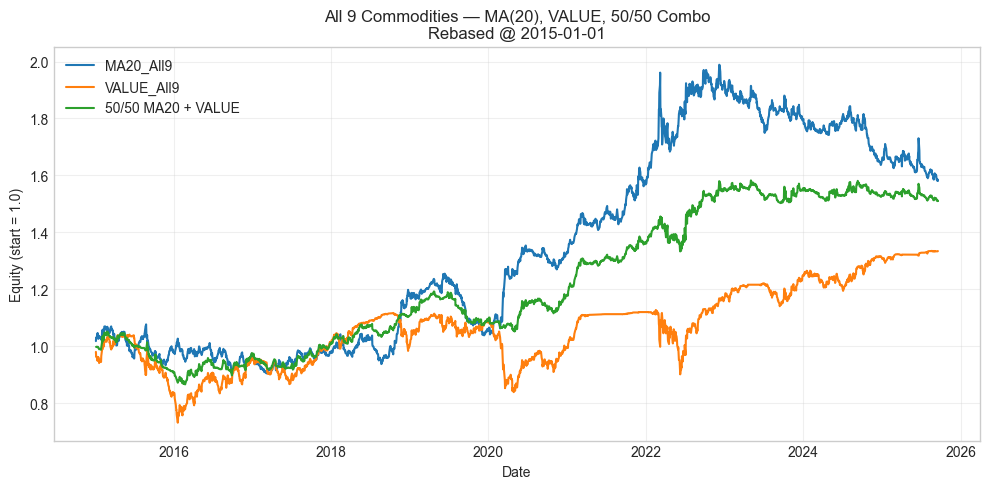

,Ann_Sharpe,Ann_Return,Ann_Vol,Max_DD
MA20_All9,0.3840,0.0420,0.1046,-0.2053
VALUE_All9,0.2464,0.0293,0.1142,-0.2973
50_50_MA20_VALUE_All9,0.5315,0.0395,0.0712,-0.1767


In [ ]:
# ==============================================================
# 50/50 MA(20) + VALUE Combo — All 9 Commodities
# Plots: MA-only, VALUE-only, Combined
# Uses existing: momentum(), value(), RollingStrategy, _annualized_sharpe
# ==============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------- Config ----------
INIT_CAPITAL     = 10_000_000
WARMUP_MA_START  = "2014-12-01"
WARMUP_VAL_START = "2010-01-01"
START_DATE       = pd.Timestamp("2015-01-01")

# MA leg
MA_WINDOW = 20

# VALUE leg (fixed optimal params)
VALUE_LONG_MA    = 2520     # 10y
VALUE_VOL_WINDOW = 252      # 1y
VALUE_K          = 2.0

# Universe
NGL_NAMES = ["Propane", "Ethane", "Butane"]
SIX_PACK  = ["WTI", "Brent", "ULSD", "RBOB", "Natgas", "Gasoil"]
ALL_NAMES = sorted(set(NGL_NAMES + SIX_PACK))

# If not defined elsewhere:
def _annualized_sharpe(log_ret: pd.Series, min_obs: int = 60) -> float:
    lr = log_ret.replace([np.inf, -np.inf], np.nan).dropna()
    if lr.size < min_obs:
        return np.nan
    vol = lr.std()
    if vol == 0 or np.isnan(vol):
        return np.nan
    return (lr.mean() / vol) * np.sqrt(252)


# ==============================================================
# 1) Build MA(20) per commodity (ALL_MA20)
# ==============================================================

ALL_MA20 = {}

for commodity, cfg in BASE_ROLL_STYLES.items():
    if commodity not in COMMODITIES or commodity not in ALL_NAMES:
        continue

    ticker, contracts, units, t_cost = COMMODITIES[commodity]

    prices = load_prices(commodity, ticker, normalize=True)
    prices = prices.loc[WARMUP_MA_START:].sort_index()
    if prices.empty:
        continue

    expiry_cal = load_expiry(ticker)
    style      = cfg["style"]
    front_col  = cfg.get("front_col", "F1")
    next_col   = cfg.get("next_col", "F2")

    rs = RollingStrategy(
        prices=prices,
        expiry_calendar=expiry_cal,
        front_col=front_col,
        next_col=next_col,
    )

    if style == "eom_ngl":
        rolled_df = rs.equity(
            style="eom_ngl",
            t_cost=t_cost,
            mid_col=cfg.get("mid_col", "F3"),
            far_col=cfg.get("far_col", "F4"),
        )
    elif style == "eom_mid":
        rolled_df = rs.equity(style="eom_mid", t_cost=t_cost)
    elif style == "eom_dynamic":
        rolled_df = rs.equity(
            style="eom_dynamic",
            t_cost=t_cost,
            third_col=cfg.get("third_col", "F3"),
        )
    elif style == "eom_eom":
        rolled_df = rs.equity(
            style="eom_eom",
            t_cost=t_cost,
            third_col=cfg.get("third_col", "F3"),
        )
    else:
        continue

    rolled_df = rolled_df.sort_index()
    if not all(c in rolled_df.columns for c in ["daily_pnl", "t_cost", "roll_day_flag"]):
        continue

    mom_df = momentum(
        prices=prices,
        rolled_df=rolled_df,
        front_col=front_col,
        short_ma=1,
        long_ma=MA_WINDOW,
        t_cost=t_cost,
        epsilon=0.0,
    ).sort_index()

    if "net_pnl" not in mom_df.columns:
        continue

    exposure = contracts * units
    mom_df["pnl_usd"]        = mom_df["net_pnl"] * exposure
    mom_df["cum_pnl_usd"]    = mom_df["pnl_usd"].cumsum()
    mom_df["equity_account"] = INIT_CAPITAL + mom_df["cum_pnl_usd"]

    trade = mom_df.loc[START_DATE:].copy()
    trade = trade[trade["equity_account"].notna()]
    if trade.empty:
        continue

    E0 = float(trade["equity_account"].iloc[0])
    if not np.isfinite(E0) or E0 <= 0:
        continue

    trade["equity_norm"] = trade["equity_account"] / E0

    acc = trade["equity_norm"].astype(float)
    rr = acc / acc.shift(1)
    valid = (acc > 0) & (acc.shift(1) > 0) & rr.notna()
    trade["log_ret"] = np.nan
    trade.loc[valid, "log_ret"] = np.log(rr[valid])

    ALL_MA20[commodity] = trade[["equity_norm", "log_ret"]]


# ==============================================================
# 2) Build VALUE (M12-13, MA2520, k=2) per commodity (ALL_VAL)
# ==============================================================

ALL_VAL = {}

for commodity, cfg in BASE_ROLL_STYLES.items():
    if commodity not in COMMODITIES or commodity not in ALL_NAMES:
        continue

    ticker, contracts, units, t_cost = COMMODITIES[commodity]

    prices_full = load_prices(commodity, ticker, normalize=True)
    prices_full = prices_full.loc[WARMUP_VAL_START:].sort_index()
    if prices_full.empty:
        continue

    expiry_cal = load_expiry(ticker)
    cols       = prices_full.columns

    # Force long roll on M12/M13 (fallbacks)
    if "F12" in cols and "F13" in cols:
        roll_front, roll_next = "F12", "F13"
    elif "F12" in cols:
        roll_front = roll_next = "F12"
    elif "F13" in cols:
        roll_front = roll_next = "F13"
    else:
        roll_front = cfg.get("front_col", "F1")
        roll_next  = cfg.get("next_col", "F2")

    rs = RollingStrategy(
        prices=prices_full,
        expiry_calendar=expiry_cal,
        front_col=roll_front,
        next_col=roll_next,
    )

    rolled_full = rs.equity(style="eom_mid", t_cost=t_cost).sort_index()
    if not all(c in rolled_full.columns for c in ["daily_pnl", "t_cost", "roll_day_flag"]):
        continue

    # Build VAL_ANCHOR
    if "F12" in cols and "F13" in cols:
        anchor = 0.5 * prices_full["F12"].astype(float) + 0.5 * prices_full["F13"].astype(float)
    elif "F12" in cols:
        anchor = prices_full["F12"].astype(float)
    elif "F13" in cols:
        anchor = prices_full["F13"].astype(float)
    else:
        anchor = prices_full[roll_front].astype(float)

    anchor = anchor.reindex(rolled_full.index).ffill()
    if anchor.dropna().empty:
        continue

    prices_val = pd.DataFrame({"VAL_ANCHOR": anchor})

    val_full = value(
        prices=prices_val,
        rolled_df=rolled_full,
        front_col="VAL_ANCHOR",
        long_ma=VALUE_LONG_MA,
        vol_window=VALUE_VOL_WINDOW,
        epsilon_factor=VALUE_K,
        t_cost=t_cost,
    ).sort_index()

    if "net_pnl" not in val_full.columns:
        continue

    exposure = contracts * units
    val_full["pnl_usd"]        = val_full["net_pnl"] * exposure
    val_full["cum_pnl_usd"]    = val_full["pnl_usd"].cumsum()
    val_full["equity_account"] = INIT_CAPITAL + val_full["cum_pnl_usd"]

    trade = val_full.loc[START_DATE:].copy()
    trade = trade[trade["equity_account"].notna()]
    if trade.empty:
        continue

    E0 = float(trade["equity_account"].iloc[0])
    if not np.isfinite(E0) or E0 <= 0:
        continue

    trade["equity_norm"] = trade["equity_account"] / E0

    acc = trade["equity_norm"].astype(float)
    rr = acc / acc.shift(1)
    valid = (acc > 0) & (acc.shift(1) > 0) & rr.notna()
    trade["log_ret"] = np.nan
    trade.loc[valid, "log_ret"] = np.log(rr[valid])

    ALL_VAL[commodity] = trade[["equity_norm", "log_ret"]]


# ==============================================================
# 3) Build All-9 MA portfolio, All-9 VALUE portfolio, 50/50 combo
# ==============================================================

def build_portfolio_from_dict(name, data_dict):
    cols = [c for c in ALL_NAMES if c in data_dict]
    if not cols:
        return None

    logret_df = pd.concat(
        {c: data_dict[c]["log_ret"].astype(float) for c in cols},
        axis=1
    ).sort_index()

    ret_df = np.exp(logret_df) - 1.0
    port_ret = ret_df.mean(axis=1, skipna=True)

    port_eq = (1.0 + port_ret).cumprod()

    rr = port_eq / port_eq.shift(1)
    port_log_ret = np.log(rr.where(rr > 0))
    lr = port_log_ret.dropna()
    if lr.empty:
        return None

    # Metrics
    eq_end = float(np.exp(lr.cumsum()).iloc[-1])
    years = (lr.index[-1] - lr.index[0]).days / 365.25
    ann_ret = (eq_end ** (1 / years) - 1.0) if years > 0 else np.nan
    ann_vol = lr.std() * np.sqrt(252)
    sharpe = _annualized_sharpe(lr)

    eq_curve = np.exp(lr.cumsum())
    dd = eq_curve / eq_curve.cummax() - 1.0
    max_dd = float(dd.min()) if len(dd) else np.nan

    return {
        "name": name,
        "equity": port_eq,
        "log_ret": port_log_ret,
        "Ann_Sharpe": sharpe,
        "Ann_Return": ann_ret,
        "Ann_Vol": ann_vol,
        "Max_DD": max_dd,
    }

ma_port  = build_portfolio_from_dict("MA20_All9", ALL_MA20)
val_port = build_portfolio_from_dict("VALUE_All9", ALL_VAL)

if (ma_port is None) or (val_port is None):
    raise RuntimeError("Missing MA or VALUE portfolio for All 9 commodities.")

# 50-50 combination at portfolio level (use linear returns)
ma_ret  = np.exp(ma_port["log_ret"])  - 1.0
val_ret = np.exp(val_port["log_ret"]) - 1.0

idx = ma_ret.index.intersection(val_ret.index)
ma_ret  = ma_ret.loc[idx]
val_ret = val_ret.loc[idx]

combo_ret = 0.5 * ma_ret + 0.5 * val_ret
combo_eq  = (1.0 + combo_ret).cumprod()

# Derive combo log-returns & metrics
rr_c   = combo_eq / combo_eq.shift(1)
log_c  = np.log(rr_c.where(rr_c > 0))
lr_c   = log_c.dropna()

eq_end = float(np.exp(lr_c.cumsum()).iloc[-1]) if not lr_c.empty else np.nan
years  = (lr_c.index[-1] - lr_c.index[0]).days / 365.25 if not lr_c.empty else np.nan
ann_ret_c = (eq_end ** (1 / years) - 1.0) if (years and years > 0) else np.nan
ann_vol_c = lr_c.std() * np.sqrt(252) if not lr_c.empty else np.nan
sharpe_c  = _annualized_sharpe(lr_c) if not lr_c.empty else np.nan

eq_curve_c = np.exp(lr_c.cumsum()) if not lr_c.empty else pd.Series(dtype=float)
dd_c = eq_curve_c / eq_curve_c.cummax() - 1.0 if not eq_curve_c.empty else pd.Series(dtype=float)
max_dd_c = float(dd_c.min()) if not dd_c.empty else np.nan

combo_port = {
    "name": "50_50_MA20_VALUE_All9",
    "equity": combo_eq,
    "log_ret": log_c,
    "Ann_Sharpe": sharpe_c,
    "Ann_Return": ann_ret_c,
    "Ann_Vol": ann_vol_c,
    "Max_DD": max_dd_c,
}

# ==============================================================
# 4) Plot MA piece, VALUE piece, and Combined on one chart
# ==============================================================

plt.figure(figsize=(10, 5))

# Align equities to common index for visual comparability
common_idx = ma_port["equity"].index.intersection(val_port["equity"].index).intersection(combo_eq.index)

plt.plot(common_idx, ma_port["equity"].reindex(common_idx),   label="MA20_All9")
plt.plot(common_idx, val_port["equity"].reindex(common_idx),  label="VALUE_All9")
plt.plot(common_idx, combo_eq.reindex(common_idx),            label="50/50 MA20 + VALUE")

plt.title(f"All 9 Commodities — MA(20), VALUE, 50/50 Combo\nRebased @ {START_DATE.date()}")
plt.xlabel("Date")
plt.ylabel("Equity (start = 1.0)")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# Optional: metrics table for the three
metrics_df = pd.DataFrame({
    ma_port["name"]: {
        "Ann_Sharpe": ma_port["Ann_Sharpe"],
        "Ann_Return": ma_port["Ann_Return"],
        "Ann_Vol":    ma_port["Ann_Vol"],
        "Max_DD":     ma_port["Max_DD"],
    },
    val_port["name"]: {
        "Ann_Sharpe": val_port["Ann_Sharpe"],
        "Ann_Return": val_port["Ann_Return"],
        "Ann_Vol":    val_port["Ann_Vol"],
        "Max_DD":     val_port["Max_DD"],
    },
    combo_port["name"]: {
        "Ann_Sharpe": combo_port["Ann_Sharpe"],
        "Ann_Return": combo_port["Ann_Return"],
        "Ann_Vol":    combo_port["Ann_Vol"],
        "Max_DD":     combo_port["Max_DD"],
    },
}).T

display(metrics_df.round(4))


## Stat-Arb: Gasoil Refining

[Sub-Portfolio Gasoil] Roll=M12_13, Pairs requested=4
[Sub-Portfolio] Using roll=M12_13, pairs=4, Portfolio Sharpe=0.7454


,Type,Name,Leg_i,Leg_j,Sharpe
0,Portfolio,EW_Gasoil_Spreads,,,0.7454
1,Spread,Brent-Gasoil,Brent,Gasoil,1.4536
2,Spread,Gasoil-ULSD,Gasoil,ULSD,1.1923
3,Spread,Gasoil-RBOB,Gasoil,RBOB,0.9925
4,Spread,Gasoil-WTI,Gasoil,WTI,0.2169


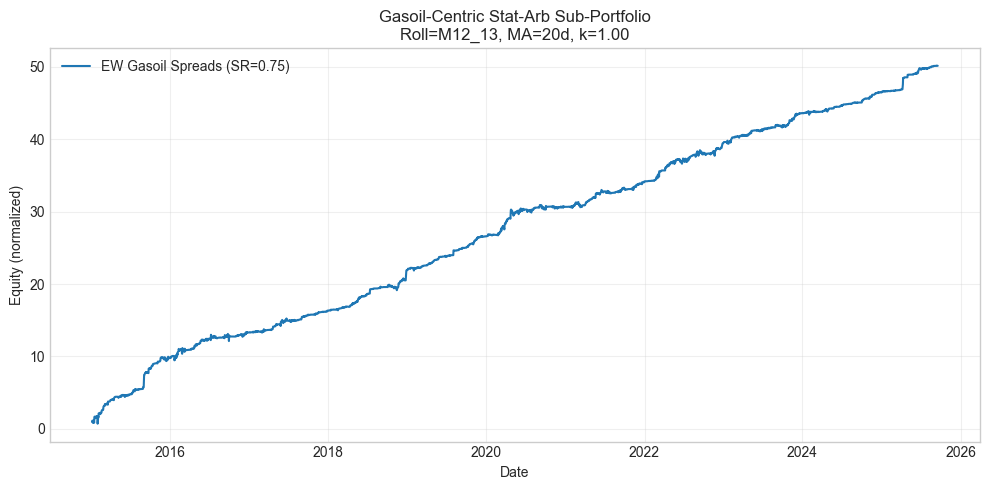

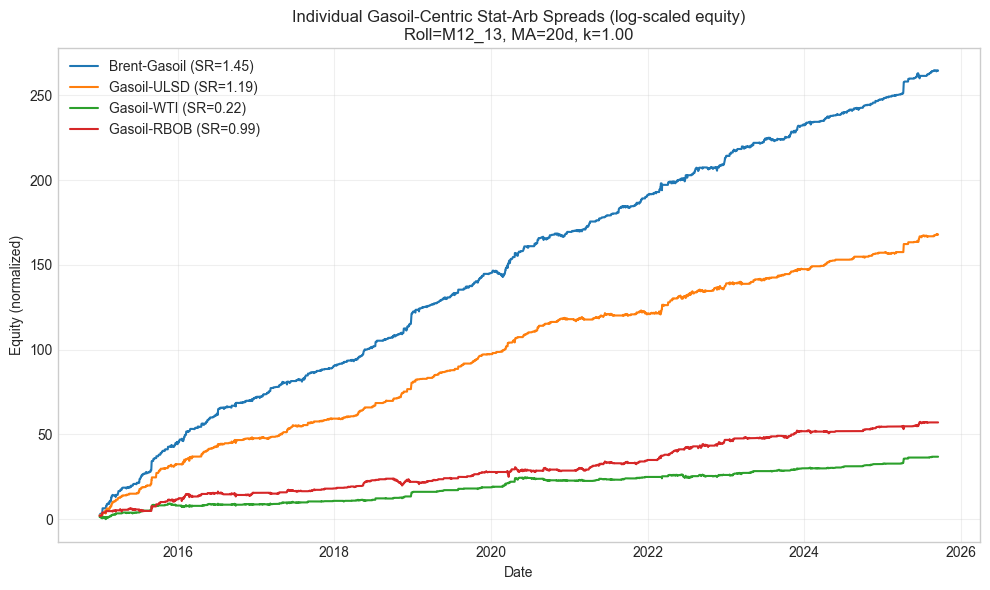

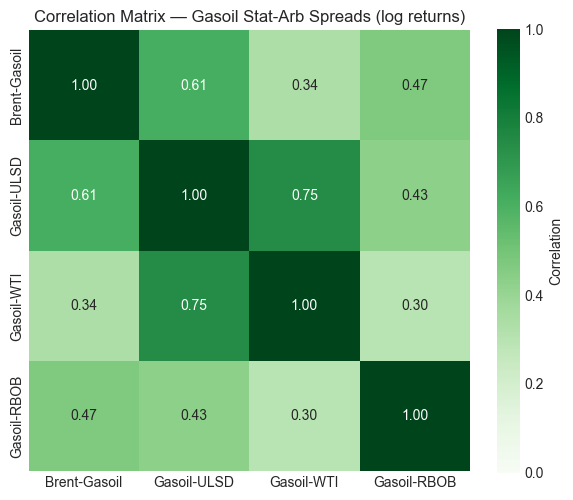

,Brent-Gasoil,Gasoil-ULSD,Gasoil-WTI,Gasoil-RBOB
Brent-Gasoil,1.0000,0.6116,0.3353,0.4673
Gasoil-ULSD,0.6116,1.0000,0.7456,0.4335
Gasoil-WTI,0.3353,0.7456,1.0000,0.2982
Gasoil-RBOB,0.4673,0.4335,0.2982,1.0000


In [ ]:
# =====================================================================
# Gasoil-Centric Stat-Arb Sub-Portfolio (LOG-SCALED)
# Pairs:
#   Brent-Gasoil, Gasoil-ULSD, Gasoil-WTI, Gasoil-RBOB
# =====================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
from itertools import combinations

# -------------------------------------------------
# 1) Config
# -------------------------------------------------
SELECTED_ROLL_SETUP = "M12_13"   # consistent with earlier work
SELECTED_PARAMS = {
    "long_ma": 20,
    "vol_window": 20,
    "epsilon_factor": 1.0,
    "t_cost": 0.01,
}

HIST_START   = "2010-01-01"
TRADE_START  = START_DATE

ROLL_SETUPS = {
    "Base_short": {"kind": "base"},
    "M6_7":       {"kind": "tenor", "front": "F6",  "next": "F7"},
    "M9_10":      {"kind": "tenor", "front": "F9",  "next": "F10"},
    "M12_13":     {"kind": "tenor", "front": "F12", "next": "F13"},
}

PAIR_LIST = [
    ("Brent",  "Gasoil"),
    ("Gasoil", "ULSD"),
    ("Gasoil", "WTI"),
    ("Gasoil", "RBOB"),
]

if SELECTED_ROLL_SETUP not in ROLL_SETUPS:
    raise ValueError(f"Unknown roll setup '{SELECTED_ROLL_SETUP}'.")

setup_cfg = ROLL_SETUPS[SELECTED_ROLL_SETUP]

# -------------------------------------------------
# 2) Helpers (log-return Sharpe + scaling)
# -------------------------------------------------
def _annualized_sharpe(log_ret: pd.Series, min_obs: int = 60) -> float:
    """Annualized Sharpe from daily log returns."""
    lr = log_ret.replace([np.inf, -np.inf], np.nan).dropna()
    if lr.size < min_obs:
        return np.nan
    vol = lr.std()
    if vol == 0 or np.isnan(vol):
        return np.nan
    return (lr.mean() / vol) * np.sqrt(252)


def _scale_pnl_to_log_equity(net_pnl: pd.Series) -> tuple[pd.Series, pd.Series]:
    """
    Convert a net_pnl series into:
      - eq_norm: normalized positive equity curve
      - log_ret: daily log returns of eq_norm
    """
    net = net_pnl.fillna(0.0)
    cum_pnl = net.cumsum()

    if cum_pnl.empty:
        idx = net.index
        return pd.Series(index=idx, dtype=float), pd.Series(index=idx, dtype=float)

    min_cum = cum_pnl.min()
    A = 1.05 * max(abs(min_cum), 1.0)  # keep equity > 0 with small buffer

    equity = (A + cum_pnl).clip(lower=1e-9)
    eq_norm = equity / A

    ret_ratio = eq_norm / eq_norm.shift(1)
    log_ret = np.log(ret_ratio.replace([np.inf, -np.inf], np.nan))

    return eq_norm, log_ret

# -------------------------------------------------
# 3) Build legs/prices for selected roll setup
# -------------------------------------------------
def _build_legs_for_roll_setup(roll_name: str, cfg_setup: dict):
    rolled_legs = {}
    anchor_cols = {}

    for commodity, cfg in BASE_ROLL_STYLES.items():
        if commodity not in COMMODITIES:
            raise KeyError(f"{commodity} missing in COMMODITIES.")

        ticker, contracts, units, t_cost = COMMODITIES[commodity]

        prices_full = load_prices(commodity, ticker, normalize=True)
        prices_full = prices_full.loc[HIST_START:].sort_index()
        if prices_full.empty:
            print(f"[{roll_name} WARN] No prices for {commodity}, skipping.")
            continue

        expiry_cal = load_expiry(ticker)
        cols = prices_full.columns
        kind = cfg_setup["kind"]

        # ---------- A) Base per-commodity roll ----------
        if kind == "base":
            style     = cfg["style"]
            front_col = cfg.get("front_col", "F1")
            next_col  = cfg.get("next_col", "F2")

            rs = RollingStrategy(
                prices=prices_full,
                expiry_calendar=expiry_cal,
                front_col=front_col,
                next_col=next_col,
            )

            if style == "eom_ngl":
                rolled_df = rs.equity(
                    style="eom_ngl",
                    t_cost=t_cost,
                    mid_col=cfg.get("mid_col", "F3"),
                    far_col=cfg.get("far_col", "F4"),
                )
            elif style == "eom_mid":
                rolled_df = rs.equity(style="eom_mid", t_cost=t_cost)
            elif style == "eom_dynamic":
                rolled_df = rs.equity(
                    style="eom_dynamic",
                    t_cost=t_cost,
                    third_col=cfg.get("third_col", "F3"),
                )
            elif style == "eom_eom":
                rolled_df = rs.equity(
                    style="eom_eom",
                    t_cost=t_cost,
                    third_col=cfg.get("third_col", "F3"),
                )
            else:
                raise ValueError(f"Unknown style '{style}' for {commodity}")

            rolled_df = rolled_df.sort_index()
            anchor_src = front_col if front_col in cols else "F1"
            anchor = prices_full[anchor_src].astype(float)

        # ---------- B) Tenor-based forced roll ----------
        elif kind == "tenor":
            front = cfg_setup["front"]
            nxt   = cfg_setup["next"]

            if (front in cols) and (nxt in cols):
                roll_front, roll_next = front, nxt
            elif front in cols:
                roll_front = roll_next = front
            elif nxt in cols:
                roll_front = roll_next = nxt
            else:
                roll_front = cfg.get("front_col", "F1")
                roll_next  = cfg.get("next_col", "F2")

            rs = RollingStrategy(
                prices=prices_full,
                expiry_calendar=expiry_cal,
                front_col=roll_front,
                next_col=roll_next,
            )

            rolled_df = rs.equity(style="eom_mid", t_cost=t_cost).sort_index()

            if (front in cols) and (nxt in cols):
                anchor = 0.5 * (
                    prices_full[front].astype(float)
                    + prices_full[nxt].astype(float)
                )
            elif front in cols:
                anchor = prices_full[front].astype(float)
            elif nxt in cols:
                anchor = prices_full[nxt].astype(float)
            else:
                anchor = prices_full[roll_front].astype(float)
        else:
            raise ValueError(f"Unknown roll kind '{kind}'")

        for col in ["daily_pnl", "t_cost", "roll_day_flag"]:
            if col not in rolled_df.columns:
                raise ValueError(
                    f"'{col}' missing in rolled_df for {commodity} under {roll_name}"
                )

        anchor = anchor.reindex(rolled_df.index).ffill()

        leg_name = commodity
        rolled_legs[leg_name] = rolled_df
        anchor_cols[leg_name] = anchor

    if len(rolled_legs) < 2:
        raise RuntimeError(f"[{roll_name}] Need at least two legs for stat-arb.")

    prices_for_spreads = pd.DataFrame(anchor_cols).dropna(how="all").sort_index()
    return rolled_legs, prices_for_spreads


rolled_legs, prices_all = _build_legs_for_roll_setup(
    SELECTED_ROLL_SETUP, setup_cfg
)

print(
    f"[Sub-Portfolio Gasoil] Roll={SELECTED_ROLL_SETUP}, "
    f"Pairs requested={len(PAIR_LIST)}"
)

# -------------------------------------------------
# 4) Run stat-arb for the selected pairs
# -------------------------------------------------
spread_metrics = []
spread_eq = {}
spread_log_rets = {}

for (c_i, c_j) in PAIR_LIST:
    if c_i not in rolled_legs or c_j not in rolled_legs:
        print(f"[WARN] Skipping {c_i}-{c_j}: missing leg.")
        continue

    sub_rolled_legs = {
        c_i: rolled_legs[c_i],
        c_j: rolled_legs[c_j],
    }
    sub_prices = prices_all[[c_i, c_j]]

    sa_df = statistical_arbitrage(
        rolled_legs=sub_rolled_legs,
        prices=sub_prices,
        pairs=[(c_i, c_j)],
        long_ma=SELECTED_PARAMS["long_ma"],
        vol_window=SELECTED_PARAMS["vol_window"],
        epsilon_factor=SELECTED_PARAMS["epsilon_factor"],
        t_cost=SELECTED_PARAMS["t_cost"],
    ).loc[TRADE_START:].copy()

    name = f"{c_i}-{c_j}"

    if sa_df.empty:
        sharpe = np.nan
        eq_norm = pd.Series(dtype=float)
        log_ret = pd.Series(dtype=float)
    else:
        eq_norm, log_ret = _scale_pnl_to_log_equity(sa_df["net_pnl"])
        sharpe = _annualized_sharpe(log_ret)

    spread_metrics.append(
        {"Type": "Spread", "Name": name, "Leg_i": c_i, "Leg_j": c_j, "Sharpe": sharpe}
    )
    spread_eq[name] = eq_norm
    spread_log_rets[name] = log_ret

# Drop pairs that failed completely
spread_metrics_df = pd.DataFrame(spread_metrics).dropna(subset=["Sharpe"], how="all")
valid_spreads = [m["Name"] for m in spread_metrics if not np.isnan(m["Sharpe"])]

if not valid_spreads:
    raise RuntimeError("No valid spreads in Gasoil sub-portfolio.")

# -------------------------------------------------
# 5) Build EW portfolio from log returns of valid spreads
# -------------------------------------------------
log_ret_df = pd.concat(
    {name: spread_log_rets[name] for name in valid_spreads},
    axis=1
).sort_index()

# EW across available spreads each day
port_log_ret = log_ret_df.mean(axis=1, skipna=True)

port_sharpe = _annualized_sharpe(port_log_ret)

# Rebuild normalized portfolio equity from log returns
port_cum_log = port_log_ret.cumsum()
port_eq = np.exp(port_cum_log)  # start ~1.0

# Prepend portfolio row to metrics table
portfolio_row = {
    "Type": "Portfolio",
    "Name": "EW_Gasoil_Spreads",
    "Leg_i": "",
    "Leg_j": "",
    "Sharpe": port_sharpe,
}
metrics_table = pd.concat(
    [
        pd.DataFrame([portfolio_row]),
        spread_metrics_df.sort_values("Sharpe", ascending=False)
    ],
    ignore_index=True
)

print("[Sub-Portfolio] Using roll="
      f"{SELECTED_ROLL_SETUP}, pairs={len(valid_spreads)}, "
      f"Portfolio Sharpe={port_sharpe:.4f}")
display(metrics_table)

# -------------------------------------------------
# 6) Plot portfolio equity (normalized)
# -------------------------------------------------
plt.figure(figsize=(10, 5))
plt.plot(port_eq.index, port_eq, label=f"EW Gasoil Spreads (SR={port_sharpe:.2f})")
plt.title(
    "Gasoil-Centric Stat-Arb Sub-Portfolio\n"
    f"Roll={SELECTED_ROLL_SETUP}, MA={SELECTED_PARAMS['long_ma']}d, "
    f"k={SELECTED_PARAMS['epsilon_factor']:.2f}"
)
plt.xlabel("Date")
plt.ylabel("Equity (normalized)")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# -------------------------------------------------
# 7) Plot individual spread equity curves (separate chart)
# -------------------------------------------------
plt.figure(figsize=(10, 6))

for name in valid_spreads:
    eq_norm = spread_eq[name]
    if eq_norm is None or eq_norm.empty:
        continue
    sr = float(spread_metrics_df.loc[spread_metrics_df["Name"] == name, "Sharpe"])
    plt.plot(eq_norm.index, eq_norm, label=f"{name} (SR={sr:.2f})")

plt.title(
    "Individual Gasoil-Centric Stat-Arb Spreads (log-scaled equity)\n"
    f"Roll={SELECTED_ROLL_SETUP}, MA={SELECTED_PARAMS['long_ma']}d, "
    f"k={SELECTED_PARAMS['epsilon_factor']:.2f}"
)
plt.xlabel("Date")
plt.ylabel("Equity (normalized)")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# =====================================================================
# Correlation Matrix — Gasoil Spreads (log returns)
# =====================================================================

# Gather log returns for valid spreads
log_ret_df = pd.concat(
    {name: spread_log_rets[name] for name in valid_spreads},
    axis=1
).sort_index()

corr_mat = log_ret_df.corr()

plt.figure(figsize=(6, 5))
sns.heatmap(
    corr_mat,
    annot=True,
    fmt=".2f",
    cmap="Greens",
    vmin=0,
    vmax=1,
    cbar_kws={"label": "Correlation"},
    square=True,
)
plt.title("Correlation Matrix — Gasoil Stat-Arb Spreads (log returns)")
plt.tight_layout()
plt.show()

display(corr_mat)


## Stat-arb: Virtual Barrels

[Sub-Portfolio] Using roll=M12_13, pairs=9


,Type,Name,Leg_i,Leg_j,Sharpe
0,Portfolio,EW_Selected_Spreads,,,-0.0704
1,Spread,Ethane-Natgas,Ethane,Natgas,0.1004
2,Spread,Butane-RBOB,Butane,RBOB,0.0611
3,Spread,ULSD-WTI,ULSD,WTI,-0.0051
4,Spread,Brent-ULSD,Brent,ULSD,-0.0255
5,Spread,RBOB-Brent,RBOB,Brent,-0.0317
6,Spread,Propane-Ethane,Propane,Ethane,-0.0895
7,Spread,Brent-WTI,Brent,WTI,-0.1223
8,Spread,WTI-Brent,WTI,Brent,-0.1223
9,Spread,Propane-Butane,Propane,Butane,-0.1806


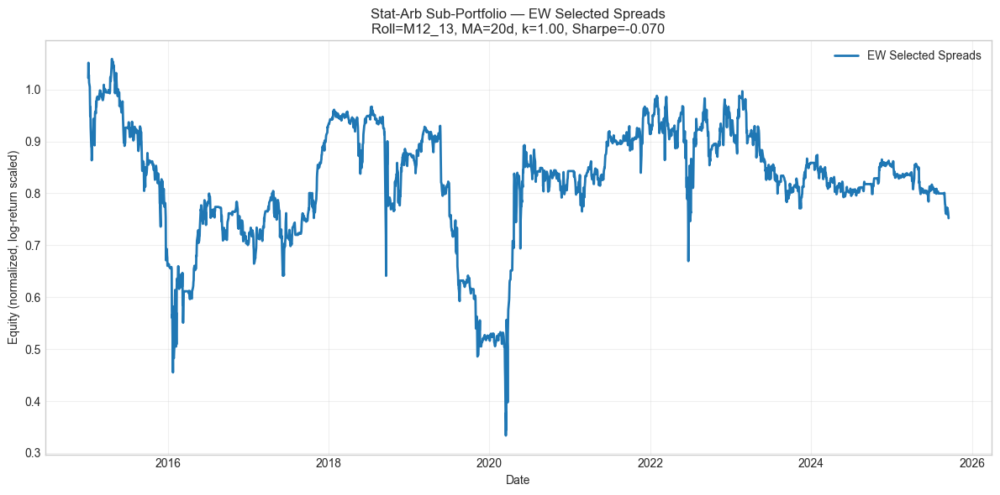

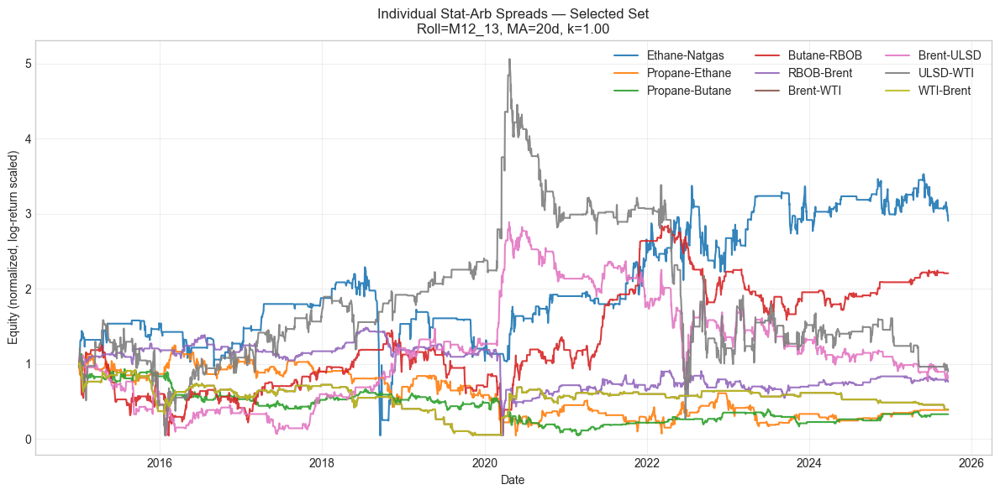

In [ ]:
# =====================================================================
# Stat-Arb Sub-Portfolio: Selected Spreads (EW), Log-Scaled
# =====================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations

# -------------------------------------------------
# 1) Config: roll + params
# -------------------------------------------------
SELECTED_ROLL_SETUP = "M12_13"   # "Base_short", "M6_7", "M9_10", "M12_13"

SELECTED_PARAMS = {
    "long_ma": 20,
    "vol_window": 20,
    "epsilon_factor": 1.0,
    "t_cost": 0.01,
}

HIST_START  = "2010-01-01"
TRADE_START = START_DATE

ROLL_SETUPS = {
    "Base_short": {"kind": "base"},
    "M6_7":       {"kind": "tenor", "front": "F6",  "next": "F7"},
    "M9_10":      {"kind": "tenor", "front": "F9",  "next": "F10"},
    "M12_13":     {"kind": "tenor", "front": "F12", "next": "F13"},
}

if SELECTED_ROLL_SETUP not in ROLL_SETUPS:
    raise ValueError(f"Unknown roll setup '{SELECTED_ROLL_SETUP}'")
setup_cfg = ROLL_SETUPS[SELECTED_ROLL_SETUP]

# -------------------------------------------------
# 2) Helpers
# -------------------------------------------------
def _annualized_sharpe(log_ret: pd.Series, min_obs: int = 60) -> float:
    """Ann. Sharpe from daily log returns."""
    lr = log_ret.replace([np.inf, -np.inf], np.nan).dropna()
    if lr.size < min_obs:
        return np.nan
    vol = lr.std()
    if vol == 0 or np.isnan(vol):
        return np.nan
    return (lr.mean() / vol) * np.sqrt(252)

def _scale_pnl_to_log_equity(net_pnl: pd.Series) -> tuple[pd.Series, pd.Series]:
    """
    Map net PnL to a positive, log-able equity curve.
    Returns (eq_norm, log_ret).
    """
    cum_pnl = net_pnl.cumsum()
    if cum_pnl.empty:
        idx = net_pnl.index
        return pd.Series(dtype=float, index=idx), pd.Series(dtype=float, index=idx)

    min_cum = cum_pnl.min()
    A = 1.05 * max(abs(min_cum), 1.0)  # ensure equity > 0 with small buffer

    equity = (A + cum_pnl).clip(lower=1e-9)
    eq_norm = equity / A

    ret_ratio = eq_norm / eq_norm.shift(1)
    log_ret = np.log(ret_ratio.replace([np.inf, -np.inf], np.nan))

    return eq_norm, log_ret

def _build_legs_for_roll_setup(roll_name: str, cfg_setup: dict):
    """Build rolled_legs + anchor prices for given roll setup."""
    rolled_legs = {}
    anchor_cols = {}

    for commodity, cfg in BASE_ROLL_STYLES.items():
        if commodity not in COMMODITIES:
            raise KeyError(f"{commodity} missing in COMMODITIES.")

        ticker, contracts, units, t_cost = COMMODITIES[commodity]

        prices_full = load_prices(commodity, ticker, normalize=True)
        prices_full = prices_full.loc[HIST_START:].sort_index()
        if prices_full.empty:
            print(f"[{roll_name} WARN] No prices for {commodity}, skipping.")
            continue

        expiry_cal = load_expiry(ticker)
        cols = prices_full.columns
        kind = cfg_setup["kind"]

        if kind == "base":
            style     = cfg["style"]
            front_col = cfg.get("front_col", "F1")
            next_col  = cfg.get("next_col", "F2")

            rs = RollingStrategy(
                prices=prices_full,
                expiry_calendar=expiry_cal,
                front_col=front_col,
                next_col=next_col,
            )

            if style == "eom_ngl":
                rolled_df = rs.equity(
                    style="eom_ngl",
                    t_cost=t_cost,
                    mid_col=cfg.get("mid_col", "F3"),
                    far_col=cfg.get("far_col", "F4"),
                )
            elif style == "eom_mid":
                rolled_df = rs.equity(style="eom_mid", t_cost=t_cost)
            elif style == "eom_dynamic":
                rolled_df = rs.equity(
                    style="eom_dynamic",
                    t_cost=t_cost,
                    third_col=cfg.get("third_col", "F3"),
                )
            elif style == "eom_eom":
                rolled_df = rs.equity(
                    style="eom_eom",
                    t_cost=t_cost,
                    third_col=cfg.get("third_col", "F3"),
                )
            else:
                raise ValueError(f"Unknown style '{style}' for {commodity}")

            rolled_df = rolled_df.sort_index()
            anchor_src = front_col if front_col in cols else "F1"
            anchor = prices_full[anchor_src].astype(float)

        elif kind == "tenor":
            front = cfg_setup["front"]
            nxt   = cfg_setup["next"]

            if (front in cols) and (nxt in cols):
                roll_front, roll_next = front, nxt
            elif front in cols:
                roll_front = roll_next = front
            elif nxt in cols:
                roll_front = roll_next = nxt
            else:
                roll_front = cfg.get("front_col", "F1")
                roll_next  = cfg.get("next_col", "F2")

            rs = RollingStrategy(
                prices=prices_full,
                expiry_calendar=expiry_cal,
                front_col=roll_front,
                next_col=roll_next,
            )

            rolled_df = rs.equity(style="eom_mid", t_cost=t_cost).sort_index()

            if (front in cols) and (nxt in cols):
                anchor = 0.5 * (
                    prices_full[front].astype(float)
                    + prices_full[nxt].astype(float)
                )
            elif front in cols:
                anchor = prices_full[front].astype(float)
            elif nxt in cols:
                anchor = prices_full[nxt].astype(float)
            else:
                anchor = prices_full[roll_front].astype(float)
        else:
            raise ValueError(f"Unknown roll kind '{kind}'")

        for col in ["daily_pnl", "t_cost", "roll_day_flag"]:
            if col not in rolled_df.columns:
                raise ValueError(
                    f"'{col}' missing in rolled_df for {commodity} under {roll_name}"
                )

        anchor = anchor.reindex(rolled_df.index).ffill()

        leg_name = commodity
        rolled_legs[leg_name] = rolled_df
        anchor_cols[leg_name] = anchor

    if len(rolled_legs) < 2:
        raise RuntimeError(f"[{roll_name}] Need at least two legs for stat-arb.")

    prices_for_spreads = pd.DataFrame(anchor_cols).dropna(how="all").sort_index()
    return rolled_legs, prices_for_spreads


# -------------------------------------------------
# 3) Build legs/prices for selected roll setup
# -------------------------------------------------
rolled_legs, prices_all = _build_legs_for_roll_setup(
    SELECTED_ROLL_SETUP, setup_cfg
)

# -------------------------------------------------
# 4) Define chosen spreads (ordered as requested)
# -------------------------------------------------
raw_pairs = [
    ("Ethane", "Natgas"),
    ("Propane", "Ethane"),
    ("Propane", "Butane"),
    ("Butane", "RBOB"),
    ("RBOB", "Brent"),
    ("Brent", "WTI"),
    ("Brent", "ULSD"),
    ("ULSD", "WTI"),
    ("WTI", "Brent"),
]

# keep only pairs where both legs exist
selected_pairs = [
    (i, j) for (i, j) in raw_pairs
    if (i in rolled_legs) and (j in rolled_legs)
]

if not selected_pairs:
    raise RuntimeError("No valid pairs from selection found in rolled_legs.")

print(f"[Sub-Portfolio] Using roll={SELECTED_ROLL_SETUP}, pairs={len(selected_pairs)}")

# -------------------------------------------------
# 5) Run stat-arb on each selected spread
# -------------------------------------------------
spread_metrics = []
spread_equities = {}
spread_logrets = {}

for (c_i, c_j) in selected_pairs:
    name = f"{c_i}-{c_j}"

    sub_rolled_legs = {
        c_i: rolled_legs[c_i],
        c_j: rolled_legs[c_j],
    }
    sub_prices = prices_all[[c_i, c_j]]

    sa_df = statistical_arbitrage(
        rolled_legs=sub_rolled_legs,
        prices=sub_prices,
        pairs=[(c_i, c_j)],
        long_ma=SELECTED_PARAMS["long_ma"],
        vol_window=SELECTED_PARAMS["vol_window"],
        epsilon_factor=SELECTED_PARAMS["epsilon_factor"],
        t_cost=SELECTED_PARAMS["t_cost"],
    ).loc[TRADE_START:].copy()

    if sa_df.empty:
        sharpe = np.nan
        eq_norm = pd.Series(dtype=float)
        log_ret = pd.Series(dtype=float)
    else:
        eq_norm, log_ret = _scale_pnl_to_log_equity(sa_df["net_pnl"])
        sharpe = _annualized_sharpe(log_ret)

    spread_metrics.append(
        {
            "Type": "Spread",
            "Name": name,
            "Leg_i": c_i,
            "Leg_j": c_j,
            "Sharpe": sharpe,
        }
    )
    spread_equities[name] = eq_norm
    spread_logrets[name] = log_ret

# -------------------------------------------------
# 6) Build equally weighted portfolio of selected spreads
# -------------------------------------------------
logret_df = pd.DataFrame(spread_logrets).sort_index()
# Equal-weight: average log returns across available spreads each day
port_log_ret = logret_df.mean(axis=1, skipna=True)
port_sharpe = _annualized_sharpe(port_log_ret)

# Portfolio equity from log returns
port_eq_norm = np.exp(port_log_ret.cumsum())

# -------------------------------------------------
# 7) Metrics table: portfolio on top, spreads sorted by Sharpe
# -------------------------------------------------
metrics_df = pd.DataFrame(spread_metrics)
metrics_df = metrics_df.sort_values("Sharpe", ascending=False)

# Insert portfolio as first row
portfolio_row = pd.DataFrame(
    [{
        "Type": "Portfolio",
        "Name": "EW_Selected_Spreads",
        "Leg_i": "",
        "Leg_j": "",
        "Sharpe": port_sharpe,
    }]
)

metrics_with_port = pd.concat([portfolio_row, metrics_df], ignore_index=True)

display(metrics_with_port)

# -------------------------------------------------
# 8) Plot portfolio equity (normalized, log-scaled)
# -------------------------------------------------
plt.figure(figsize=(12, 6))
plt.plot(port_eq_norm.index, port_eq_norm, label="EW Selected Spreads", linewidth=2)
plt.title(
    f"Stat-Arb Sub-Portfolio — EW Selected Spreads\n"
    f"Roll={SELECTED_ROLL_SETUP}, MA={SELECTED_PARAMS['long_ma']}d, "
    f"k={SELECTED_PARAMS['epsilon_factor']:.2f}, Sharpe={port_sharpe:.3f}"
)
plt.xlabel("Date")
plt.ylabel("Equity (normalized, log-return scaled)")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# -------------------------------------------------
# 9) Plot individual spread equities (separate chart)
# -------------------------------------------------
plt.figure(figsize=(12, 6))

for name, eq_norm in spread_equities.items():
    if eq_norm.empty:
        continue
    plt.plot(eq_norm.index, eq_norm, label=name, alpha=0.9)

plt.title(
    f"Individual Stat-Arb Spreads — Selected Set\n"
    f"Roll={SELECTED_ROLL_SETUP}, MA={SELECTED_PARAMS['long_ma']}d, "
    f"k={SELECTED_PARAMS['epsilon_factor']:.2f}"
)
plt.xlabel("Date")
plt.ylabel("Equity (normalized, log-return scaled)")
plt.grid(alpha=0.3)
plt.legend(ncol=3)
plt.tight_layout()
plt.show()


## Correlation Across Portfolios

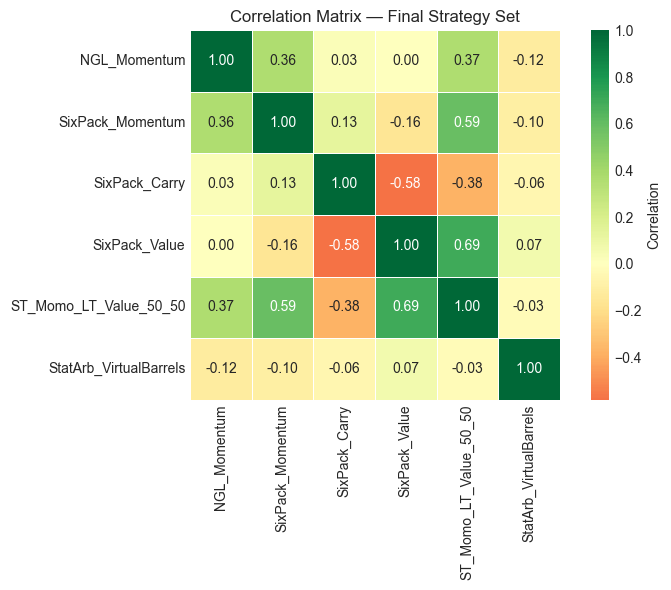

,NGL_Momentum,SixPack_Momentum,SixPack_Carry,SixPack_Value,ST_Momo_LT_Value_50_50,StatArb_VirtualBarrels
NGL_Momentum,1.0000,0.3630,0.0280,0.0030,0.3650,-0.1220
SixPack_Momentum,0.3630,1.0000,0.1270,-0.1560,0.5900,-0.1040
SixPack_Carry,0.0280,0.1270,1.0000,-0.5820,-0.3760,-0.0600
SixPack_Value,0.0030,-0.1560,-0.5820,1.0000,0.6930,0.0690
ST_Momo_LT_Value_50_50,0.3650,0.5900,-0.3760,0.6930,1.0000,-0.0290
StatArb_VirtualBarrels,-0.1220,-0.1040,-0.0600,0.0690,-0.0290,1.0000


,Ann_Sharpe,Ann_Return,Ann_Vol,Total_Return,Max_DD
NGL_Momentum,1.0376,0.0578,0.0542,0.8242,-0.0983
SixPack_Momentum,0.1982,0.0297,0.1441,0.3676,-0.3114
SixPack_Carry,0.5107,0.0692,0.1278,1.0458,-0.1743
SixPack_Value,0.2462,0.0390,0.1516,0.5059,-0.3644
ST_Momo_LT_Value_50_50,0.5315,0.0395,0.0712,0.5140,-0.1767
StatArb_VirtualBarrels,-0.0496,-0.0190,0.3769,-0.1854,-0.6176


In [ ]:
# ==============================================================
# Strategy-Level Correlation & Metrics
# Final Strategies:
#  1) NGL Momentum
#  2) 6-Pack Momentum
#  3) 6-Pack Carry
#  4) 6-Pack Value
#  5) Short Term Momentum, Long Term Value (50-50, All 9)
#  6) Stat-Arb: Gasoil Pairs
#  7) Stat-Arb: Virtual Barrels
# ==============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ----------- Global Config -----------
INIT_CAPITAL      = 10_000_000
START_DATE        = pd.Timestamp("2015-01-01")

MA_WINDOW_SHORT   = 20

CARRY_FRONT_COL   = "F4"
CARRY_END_COL     = "F15"

VALUE_LONG_MA     = 2520   # 10y
VALUE_VOL_WINDOW  = 252
VALUE_K           = 2.0

STATARB_PARAMS = {
    "long_ma": 20,
    "vol_window": 20,
    "epsilon_factor": 1.0,
    "t_cost": 0.01,
}

ROLL_SETUPS = {
    "Base_short": {"kind": "base"},
    "M6_7":       {"kind": "tenor", "front": "F6",  "next": "F7"},
    "M9_10":      {"kind": "tenor", "front": "F9",  "next": "F10"},
    "M12_13":     {"kind": "tenor", "front": "F12", "next": "F13"},
}

# universes
NGL_NAMES  = ["Propane", "Ethane", "Butane"]
SIX_PACK   = ["WTI", "Brent", "ULSD", "RBOB", "Natgas", "Gasoil"]
ALL_9      = sorted(set(NGL_NAMES + SIX_PACK))

# ----------- Helper: Sharpe -----------
def _annualized_sharpe(log_ret: pd.Series, min_obs: int = 60) -> float:
    lr = log_ret.replace([np.inf, -np.inf], np.nan).dropna()
    if lr.size < min_obs:
        return np.nan
    vol = lr.std()
    if vol == 0 or np.isnan(vol):
        return np.nan
    return (lr.mean() / vol) * np.sqrt(252)


# ==============================================================
# 1) MA(20) portfolios
# ==============================================================

def build_ma20_portfolio(name, commodities, warmup_start="2014-12-01"):
    per_log = []

    for c in commodities:
        if c not in BASE_ROLL_STYLES or c not in COMMODITIES:
            continue

        cfg = BASE_ROLL_STYLES[c]
        ticker, contracts, units, t_cost = COMMODITIES[c]

        prices = load_prices(c, ticker, normalize=True)
        prices = prices.loc[warmup_start:].sort_index()
        if prices.empty:
            continue

        expiry_cal = load_expiry(ticker)
        style      = cfg["style"]
        front_col  = cfg.get("front_col", "F1")
        next_col   = cfg.get("next_col", "F2")

        rs = RollingStrategy(
            prices=prices,
            expiry_calendar=expiry_cal,
            front_col=front_col,
            next_col=next_col,
        )

        if style == "eom_ngl":
            rolled = rs.equity(
                style="eom_ngl",
                t_cost=t_cost,
                mid_col=cfg.get("mid_col", "F3"),
                far_col=cfg.get("far_col", "F4"),
            )
        elif style == "eom_mid":
            rolled = rs.equity(style="eom_mid", t_cost=t_cost)
        elif style == "eom_dynamic":
            rolled = rs.equity(
                style="eom_dynamic",
                t_cost=t_cost,
                third_col=cfg.get("third_col", "F3"),
            )
        elif style == "eom_eom":
            rolled = rs.equity(
                style="eom_eom",
                t_cost=t_cost,
                third_col=cfg.get("third_col", "F3"),
            )
        else:
            continue

        rolled = rolled.sort_index()
        if not all(col in rolled.columns for col in ["daily_pnl", "t_cost", "roll_day_flag"]):
            continue

        mom = momentum(
            prices=prices,
            rolled_df=rolled,
            front_col=front_col,
            short_ma=1,
            long_ma=MA_WINDOW_SHORT,
            t_cost=t_cost,
            epsilon=0.0,
        ).sort_index()

        if "net_pnl" not in mom.columns:
            continue

        exposure = contracts * units
        mom["pnl_usd"]        = mom["net_pnl"] * exposure
        mom["cum_pnl_usd"]    = mom["pnl_usd"].cumsum()
        mom["equity_account"] = INIT_CAPITAL + mom["cum_pnl_usd"]

        tr = mom.loc[START_DATE:].copy()
        tr = tr[tr["equity_account"].notna()]
        if tr.empty:
            continue

        E0 = float(tr["equity_account"].iloc[0])
        if not np.isfinite(E0) or E0 <= 0:
            continue

        eq = (tr["equity_account"] / E0).astype(float)
        rr = eq / eq.shift(1)
        log_ret = np.log(rr.where((eq > 0) & (eq.shift(1) > 0)))
        per_log.append(log_ret)

    if not per_log:
        return None

    logret_df = pd.concat(per_log, axis=1)
    ret_df    = np.exp(logret_df) - 1.0
    port_ret  = ret_df.mean(axis=1, skipna=True)
    port_eq   = (1.0 + port_ret).cumprod()
    rr        = port_eq / port_eq.shift(1)
    port_log  = np.log(rr.where(rr > 0))

    return {"name": name, "log_ret": port_log}


# ==============================================================
# 2) Carry F4–F15 portfolios
# ==============================================================

def build_carry_portfolio(name, commodities, warmup_start="2014-12-01"):
    per_log = []

    for c in commodities:
        if c not in BASE_ROLL_STYLES or c not in COMMODITIES:
            continue

        cfg = BASE_ROLL_STYLES[c]
        ticker, contracts, units, t_cost = COMMODITIES[c]

        prices = load_prices(c, ticker, normalize=True)
        prices = prices.loc[warmup_start:].sort_index()
        if prices.empty:
            continue

        expiry_cal = load_expiry(ticker)
        style      = cfg["style"]
        front_col  = cfg.get("front_col", "F1")
        next_col   = cfg.get("next_col", "F2")

        rs = RollingStrategy(
            prices=prices,
            expiry_calendar=expiry_cal,
            front_col=front_col,
            next_col=next_col,
        )

        if style == "eom_ngl":
            rolled = rs.equity(
                style="eom_ngl",
                t_cost=t_cost,
                mid_col=cfg.get("mid_col", "F3"),
                far_col=cfg.get("far_col", "F4"),
            )
        elif style == "eom_mid":
            rolled = rs.equity(style="eom_mid", t_cost=t_cost)
        elif style == "eom_dynamic":
            rolled = rs.equity(
                style="eom_dynamic",
                t_cost=t_cost,
                third_col=cfg.get("third_col", "F3"),
            )
        elif style == "eom_eom":
            rolled = rs.equity(
                style="eom_eom",
                t_cost=t_cost,
                third_col=cfg.get("third_col", "F3"),
            )
        else:
            continue

        rolled = rolled.sort_index()
        if not all(col in rolled.columns for col in ["daily_pnl", "t_cost", "roll_day_flag"]):
            continue

        cdf = carry(
            prices=prices,
            rolled_df=rolled,
            front_col=CARRY_FRONT_COL,
            end_col=CARRY_END_COL,
            t_cost=t_cost,
            epsilon=0.0,
        ).sort_index()

        if "net_pnl" not in cdf.columns:
            continue

        exposure = contracts * units
        cdf["pnl_usd"]        = cdf["net_pnl"] * exposure
        cdf["cum_pnl_usd"]    = cdf["pnl_usd"].cumsum()
        cdf["equity_account"] = INIT_CAPITAL + cdf["cum_pnl_usd"]

        tr = cdf.loc[START_DATE:].copy()
        tr = tr[tr["equity_account"].notna()]
        if tr.empty:
            continue

        E0 = float(tr["equity_account"].iloc[0])
        if not np.isfinite(E0) or E0 <= 0:
            continue

        eq = (tr["equity_account"] / E0).astype(float)
        rr = eq / eq.shift(1)
        log_ret = np.log(rr.where((eq > 0) & (eq.shift(1) > 0)))
        per_log.append(log_ret)

    if not per_log:
        return None

    logret_df = pd.concat(per_log, axis=1)
    ret_df    = np.exp(logret_df) - 1.0
    port_ret  = ret_df.mean(axis=1, skipna=True)
    port_eq   = (1.0 + port_ret).cumprod()
    rr        = port_eq / port_eq.shift(1)
    port_log  = np.log(rr.where(rr > 0))

    return {"name": name, "log_ret": port_log}


# ==============================================================
# 3) VALUE (M12-13, MA2520, k=2) portfolios
# ==============================================================

def build_value_portfolio(name, commodities, warmup_start="2010-01-01"):
    per_log = []

    for c in commodities:
        if c not in BASE_ROLL_STYLES or c not in COMMODITIES:
            continue

        cfg = BASE_ROLL_STYLES[c]
        ticker, contracts, units, t_cost = COMMODITIES[c]

        prices_full = load_prices(c, ticker, normalize=True)
        prices_full = prices_full.loc[warmup_start:].sort_index()
        if prices_full.empty:
            continue

        expiry_cal = load_expiry(ticker)
        cols       = prices_full.columns

        if "F12" in cols and "F13" in cols:
            roll_front, roll_next = "F12", "F13"
        elif "F12" in cols:
            roll_front = roll_next = "F12"
        elif "F13" in cols:
            roll_front = roll_next = "F13"
        else:
            roll_front = cfg.get("front_col", "F1")
            roll_next  = cfg.get("next_col", "F2")

        rs = RollingStrategy(
            prices=prices_full,
            expiry_calendar=expiry_cal,
            front_col=roll_front,
            next_col=roll_next,
        )

        rolled = rs.equity(style="eom_mid", t_cost=t_cost).sort_index()
        if not all(col in rolled.columns for col in ["daily_pnl", "t_cost", "roll_day_flag"]):
            continue

        if "F12" in cols and "F13" in cols:
            anchor = 0.5*prices_full["F12"].astype(float) + 0.5*prices_full["F13"].astype(float)
        elif "F12" in cols:
            anchor = prices_full["F12"].astype(float)
        elif "F13" in cols:
            anchor = prices_full["F13"].astype(float)
        else:
            anchor = prices_full[roll_front].astype(float)

        anchor = anchor.reindex(rolled.index).ffill()
        if anchor.dropna().empty:
            continue

        prices_val = pd.DataFrame({"VAL_ANCHOR": anchor})

        vdf = value(
            prices=prices_val,
            rolled_df=rolled,
            front_col="VAL_ANCHOR",
            long_ma=VALUE_LONG_MA,
            vol_window=VALUE_VOL_WINDOW,
            epsilon_factor=VALUE_K,
            t_cost=t_cost,
        ).sort_index()

        if "net_pnl" not in vdf.columns:
            continue

        exposure = contracts * units
        vdf["pnl_usd"]        = vdf["net_pnl"] * exposure
        vdf["cum_pnl_usd"]    = vdf["pnl_usd"].cumsum()
        vdf["equity_account"] = INIT_CAPITAL + vdf["cum_pnl_usd"]

        tr = vdf.loc[START_DATE:].copy()
        tr = tr[tr["equity_account"].notna()]
        if tr.empty:
            continue

        E0 = float(tr["equity_account"].iloc[0])
        if not np.isfinite(E0) or E0 <= 0:
            continue

        eq = (tr["equity_account"] / E0).astype(float)
        rr = eq / eq.shift(1)
        log_ret = np.log(rr.where((eq > 0) & (eq.shift(1) > 0)))
        per_log.append(log_ret)

    if not per_log:
        return None

    logret_df = pd.concat(per_log, axis=1)
    ret_df    = np.exp(logret_df) - 1.0
    port_ret  = ret_df.mean(axis=1, skipna=True)
    port_eq   = (1.0 + port_ret).cumprod()
    rr        = port_eq / port_eq.shift(1)
    port_log  = np.log(rr.where(rr > 0))

    return {"name": name, "log_ret": port_log}


# ==============================================================
# 4) Stat-Arb helpers
# ==============================================================

def _build_legs_for_roll_setup(roll_name, cfg_setup, hist_start="2010-01-01"):
    rolled_legs = {}
    anchor_cols = {}

    for commodity, cfg in BASE_ROLL_STYLES.items():
        if commodity not in COMMODITIES:
            continue

        ticker, contracts, units, t_cost = COMMODITIES[commodity]
        prices_full = load_prices(commodity, ticker, normalize=True)
        prices_full = prices_full.loc[hist_start:].sort_index()
        if prices_full.empty:
            continue

        expiry_cal = load_expiry(ticker)
        cols = prices_full.columns
        kind = cfg_setup["kind"]

        if kind == "base":
            style     = cfg["style"]
            front_col = cfg.get("front_col", "F1")
            next_col  = cfg.get("next_col", "F2")

            rs = RollingStrategy(
                prices=prices_full,
                expiry_calendar=expiry_cal,
                front_col=front_col,
                next_col=next_col,
            )

            if style == "eom_ngl":
                rolled = rs.equity(
                    style="eom_ngl", t_cost=t_cost,
                    mid_col=cfg.get("mid_col", "F3"),
                    far_col=cfg.get("far_col", "F4"),
                )
            elif style == "eom_mid":
                rolled = rs.equity(style="eom_mid", t_cost=t_cost)
            elif style == "eom_dynamic":
                rolled = rs.equity(
                    style="eom_dynamic", t_cost=t_cost,
                    third_col=cfg.get("third_col", "F3"),
                )
            elif style == "eom_eom":
                rolled = rs.equity(
                    style="eom_eom", t_cost=t_cost,
                    third_col=cfg.get("third_col", "F3"),
                )
            else:
                continue

            rolled = rolled.sort_index()
            anchor_src = front_col if front_col in cols else "F1"
            anchor = prices_full[anchor_src].astype(float)

        elif kind == "tenor":
            front = cfg_setup["front"]
            nxt   = cfg_setup["next"]

            if (front in cols) and (nxt in cols):
                roll_front, roll_next = front, nxt
            elif front in cols:
                roll_front = roll_next = front
            elif nxt in cols:
                roll_front = roll_next = nxt
            else:
                roll_front = cfg.get("front_col", "F1")
                roll_next  = cfg.get("next_col", "F2")

            rs = RollingStrategy(
                prices=prices_full,
                expiry_calendar=expiry_cal,
                front_col=roll_front,
                next_col=roll_next,
            )

            rolled = rs.equity(style="eom_mid", t_cost=t_cost).sort_index()

            if (front in cols) and (nxt in cols):
                anchor = 0.5 * (
                    prices_full[front].astype(float)
                    + prices_full[nxt].astype(float)
                )
            elif front in cols:
                anchor = prices_full[front].astype(float)
            elif nxt in cols:
                anchor = prices_full[nxt].astype(float)
            else:
                anchor = prices_full[roll_front].astype(float)
        else:
            continue

        if not all(col in rolled.columns for col in ["daily_pnl","t_cost","roll_day_flag"]):
            continue

        anchor = anchor.reindex(rolled.index).ffill()
        rolled_legs[commodity] = rolled
        anchor_cols[commodity] = anchor

    if len(rolled_legs) < 2:
        return {}, pd.DataFrame()

    prices_all = pd.DataFrame(anchor_cols).dropna(how="all").sort_index()
    return rolled_legs, prices_all

def _scale_pnl_to_log_equity(net_pnl: pd.Series):
    cum_pnl = net_pnl.cumsum()
    if cum_pnl.empty:
        idx = net_pnl.index
        return pd.Series(dtype=float, index=idx), pd.Series(dtype=float, index=idx)
    A = 1.05 * max(abs(cum_pnl.min()), 1.0)
    eq = (A + cum_pnl).clip(lower=1e-9)
    eq_norm = eq / A
    rr = eq_norm / eq_norm.shift(1)
    log_ret = np.log(rr.replace([np.inf, -np.inf], np.nan))
    return eq_norm, log_ret


def build_statarb_gasoil_pairs(name="StatArb_GasoilPairs"):
    setup_cfg = ROLL_SETUPS["Base_short"]
    rolled_legs, prices_all = _build_legs_for_roll_setup("Base_short", setup_cfg)
    if not rolled_legs:
        return None

    raw_pairs = [
        ("Gasoil", "Brent"),
        ("Gasoil", "WTI"),
        ("ULSD",   "Gasoil"),
    ]
    pairs = [(i, j) for (i, j) in raw_pairs if i in rolled_legs and j in rolled_legs]
    if not pairs:
        return None

    logrets = []
    for (ci, cj) in pairs:
        sub_legs = {ci: rolled_legs[ci], cj: rolled_legs[cj]}
        sub_px   = prices_all[[ci, cj]]
        sa = statistical_arbitrage(
            rolled_legs=sub_legs,
            prices=sub_px,
            pairs=[(ci, cj)],
            **STATARB_PARAMS,
        ).loc[START_DATE:].copy()
        if sa.empty:
            continue
        _, lr = _scale_pnl_to_log_equity(sa["net_pnl"])
        logrets.append(lr)

    if not logrets:
        return None

    lr_df = pd.concat(logrets, axis=1)
    port_lr = lr_df.mean(axis=1, skipna=True)
    return {"name": name, "log_ret": port_lr}


def build_statarb_virtual_barrels(name="StatArb_VirtualBarrels"):
    setup_cfg = ROLL_SETUPS["M12_13"]
    rolled_legs, prices_all = _build_legs_for_roll_setup("M12_13", setup_cfg)
    if not rolled_legs:
        return None

    raw_pairs = [
        ("Ethane", "Natgas"),
        ("Propane", "Ethane"),
        ("Propane", "Butane"),
        ("Butane", "RBOB"),
        ("RBOB", "Brent"),
        ("Brent", "WTI"),
        ("Brent", "ULSD"),
        ("ULSD", "WTI"),
    ]
    pairs = [(i, j) for (i, j) in raw_pairs if i in rolled_legs and j in rolled_legs]
    if not pairs:
        return None

    logrets = []
    for (ci, cj) in pairs:
        sub_legs = {ci: rolled_legs[ci], cj: rolled_legs[cj]}
        sub_px   = prices_all[[ci, cj]]
        sa = statistical_arbitrage(
            rolled_legs=sub_legs,
            prices=sub_px,
            pairs=[(ci, cj)],
            **STATARB_PARAMS,
        ).loc[START_DATE:].copy()
        if sa.empty:
            continue
        _, lr = _scale_pnl_to_log_equity(sa["net_pnl"])
        logrets.append(lr)

    if not logrets:
        return None

    lr_df = pd.concat(logrets, axis=1)
    port_lr = lr_df.mean(axis=1, skipna=True)
    return {"name": name, "log_ret": port_lr}


# ==============================================================
# 5) 50-50 MA(20) + VALUE (All 9)
# ==============================================================

def build_50_50_ma_value_all9(name="ST_Momo_LT_Value_50_50"):
    ma_all9  = build_ma20_portfolio("tmp_ma_all9", ALL_9)
    val_all9 = build_value_portfolio("tmp_val_all9", ALL_9)
    if (ma_all9 is None) or (val_all9 is None):
        return None

    lr_ma  = ma_all9["log_ret"].dropna()
    lr_val = val_all9["log_ret"].dropna()
    idx = lr_ma.index.intersection(lr_val.index)
    if idx.empty:
        return None

    ret_ma  = np.exp(lr_ma.loc[idx])  - 1.0
    ret_val = np.exp(lr_val.loc[idx]) - 1.0

    combo_ret = 0.5 * ret_ma + 0.5 * ret_val
    combo_eq  = (1.0 + combo_ret).cumprod()
    rr        = combo_eq / combo_eq.shift(1)
    combo_lr  = np.log(rr.where(rr > 0))

    return {"name": name, "log_ret": combo_lr}


# ==============================================================
# 6) Build all final strategy series
# ==============================================================

strategies = []

ngl_mom   = build_ma20_portfolio("NGL_Momentum", NGL_NAMES)
if ngl_mom is not None:
    strategies.append(ngl_mom)

six_mom   = build_ma20_portfolio("SixPack_Momentum", SIX_PACK)
if six_mom is not None:
    strategies.append(six_mom)

six_carry = build_carry_portfolio("SixPack_Carry", SIX_PACK)
if six_carry is not None:
    strategies.append(six_carry)

six_val   = build_value_portfolio("SixPack_Value", SIX_PACK)
if six_val is not None:
    strategies.append(six_val)

combo_50  = build_50_50_ma_value_all9()
if combo_50 is not None:
    strategies.append(combo_50)

# sa_gasoil = build_statarb_gasoil_pairs()
# if sa_gasoil is not None:
#     strategies.append(sa_gasoil)

sa_vb     = build_statarb_virtual_barrels()
if sa_vb is not None:
    strategies.append(sa_vb)

if not strategies:
    raise RuntimeError("No strategies constructed; check inputs and functions.")


# ==============================================================
# 7) Correlation Matrix of Final Strategies (daily log returns)
# ==============================================================

logret_df = pd.concat(
    {s["name"]: s["log_ret"].astype(float) for s in strategies},
    axis=1
).dropna(how="all")

corr_mat = logret_df.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(
    corr_mat,
    cmap="RdYlGn",
    center=0,
    annot=True,
    fmt=".2f",
    cbar_kws={"label": "Correlation"},
    square=True,
    linewidths=0.5,
)
plt.title("Correlation Matrix — Final Strategy Set")
plt.tight_layout()
plt.show()

display(corr_mat.round(3))


# ==============================================================
# 8) Metrics Table for Final Strategies
# ==============================================================

metrics = {}
for s in strategies:
    name = s["name"]
    lr = s["log_ret"].replace([np.inf, -np.inf], np.nan).dropna()
    if lr.empty:
        continue

    eq_curve = np.exp(lr.cumsum())
    eq_end   = float(eq_curve.iloc[-1])
    total_ret = eq_end - 1.0

    days = (lr.index[-1] - lr.index[0]).days
    years = days / 365.25 if days > 0 else np.nan
    ann_ret = (eq_end ** (1 / years) - 1.0) if years and years > 0 else np.nan

    ann_vol = lr.std() * np.sqrt(252)
    sharpe  = _annualized_sharpe(lr)

    dd = eq_curve / eq_curve.cummax() - 1.0
    max_dd = float(dd.min()) if len(dd) else np.nan

    metrics[name] = {
        "Ann_Sharpe": sharpe,
        "Ann_Return": ann_ret,
        "Ann_Vol":    ann_vol,
        "Total_Return": total_ret,
        "Max_DD":     max_dd,
    }

metrics_df = pd.DataFrame(metrics).T
display(metrics_df.round(4))




# Portfolio of Portfolios

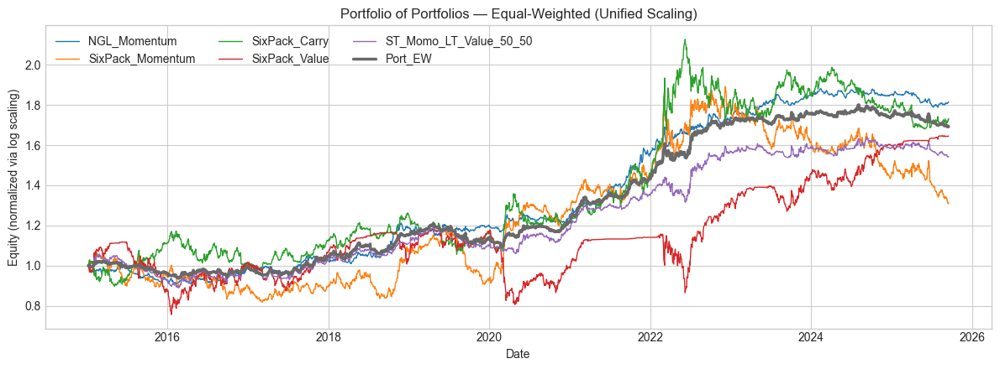

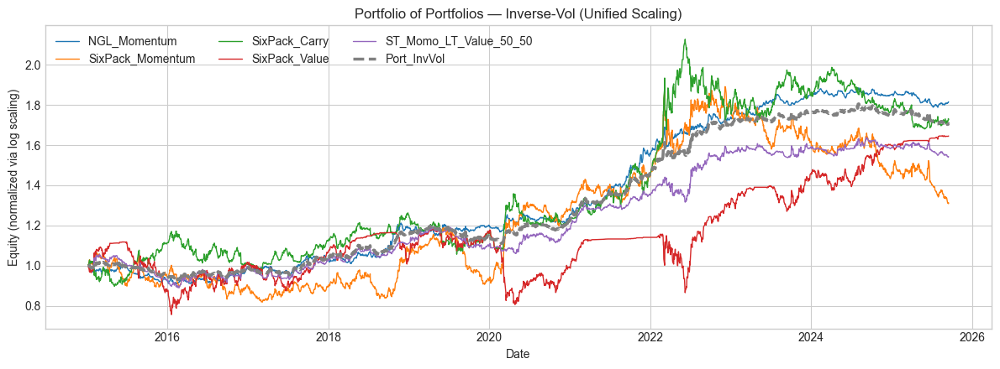

,Ann_Sharpe,Ann_Vol,Ann_Mean_LogRet
Name,,,
NGL_Momentum,1.0289,0.0542,0.0558
SixPack_Momentum,0.1742,0.1448,0.0252
SixPack_Carry,0.3979,0.1285,0.0511
SixPack_Value,0.3062,0.1523,0.0466
ST_Momo_LT_Value_50_50,0.5713,0.0709,0.0405
Port_EW,0.9144,0.0539,0.0493
Port_InvVol,1.0096,0.0495,0.0500


In [ ]:
# ==============================================================
# Portfolio of Portfolios (Default Matplotlib, Clean Formatting)
# ==============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------- Config ----------
EXCLUDE = ["StatArb_VirtualBarrels"]

# ---------- Helpers ----------
def _eq_from_logret(lr: pd.Series) -> pd.Series:
    lr = lr.replace([np.inf, -np.inf], np.nan).dropna()
    return np.exp(lr.cumsum())

def _portfolio_from_linrets(lin_ret: pd.Series):
    lr = np.log1p(lin_ret).replace([np.inf, -np.inf], np.nan).dropna()
    eq = np.exp(lr.cumsum())
    return eq, lr

def _portfolio_metrics(name: str, lr: pd.Series) -> dict:
    lr = lr.replace([np.inf, -np.inf], np.nan).dropna()
    if lr.empty:
        return {"Name": name, "Ann_Sharpe": np.nan, "Ann_Vol": np.nan, "Ann_Mean_LogRet": np.nan}
    ann_vol  = lr.std() * np.sqrt(252)
    ann_mean = lr.mean() * 252.0
    sharpe   = ann_mean / ann_vol if ann_vol > 0 else np.nan
    return {"Name": name, "Ann_Sharpe": sharpe, "Ann_Vol": ann_vol, "Ann_Mean_LogRet": ann_mean}

# ---------- Build matrix of strategy log-returns ----------
strategy_logrets = {
    s["name"]: s["log_ret"].astype(float).replace([np.inf, -np.inf], np.nan)
    for s in strategies
    if s["name"] not in EXCLUDE
}
logret_mat_full = pd.DataFrame(strategy_logrets)
logret_common = logret_mat_full.dropna(axis=0, how="any")

if logret_common.empty:
    raise RuntimeError("No common sample across all strategies.")

# Convert to linear returns
linret_common = np.exp(logret_common) - 1.0

# ==============================================================
# 1) Equal-Weighted Portfolio
# ==============================================================

ew_lin = linret_common.mean(axis=1)
ew_eq, ew_lr = _portfolio_from_linrets(ew_lin)

plt.figure(figsize=(12, 4.5))

for name in logret_common.columns:
    eq_i = _eq_from_logret(logret_common[name])
    plt.plot(eq_i.index, eq_i, linewidth=1.0, label=name)

plt.plot(ew_eq.index, ew_eq, color="dimgray", linewidth=2.5, label="Port_EW")

plt.title("Portfolio of Portfolios — Equal-Weighted (Unified Scaling)")
plt.xlabel("Date")
plt.ylabel("Equity (normalized via log scaling)")
plt.legend(loc="upper left", ncol=3)
plt.tight_layout()
plt.show()

# ==============================================================
# 2) Inverse-Vol Portfolio
# ==============================================================

vols = logret_common.std(axis=0) * np.sqrt(252)
inv_vol = 1.0 / vols.replace(0, np.nan)
inv_vol = inv_vol.dropna()
w_inv = inv_vol / inv_vol.sum()

iv_lin = (linret_common[w_inv.index] * w_inv).sum(axis=1)
iv_eq, iv_lr = _portfolio_from_linrets(iv_lin)

plt.figure(figsize=(12, 4.5))

for name in logret_common.columns:
    eq_i = _eq_from_logret(logret_common[name])
    plt.plot(eq_i.index, eq_i, linewidth=1.0, label=name)

plt.plot(iv_eq.index, iv_eq, color="gray", linewidth=2.5, linestyle="--", label="Port_InvVol")

plt.title("Portfolio of Portfolios — Inverse-Vol (Unified Scaling)")
plt.xlabel("Date")
plt.ylabel("Equity (normalized via log scaling)")
plt.legend(loc="upper left", ncol=3)
plt.tight_layout()
plt.show()

# ==============================================================
# 3) Metrics Table
# ==============================================================

metrics = []

# Strategy-level
for name in logret_common.columns:
    metrics.append(_portfolio_metrics(name, logret_common[name]))

# Portfolios
metrics.append(_portfolio_metrics("Port_EW", ew_lr))
metrics.append(_portfolio_metrics("Port_InvVol", iv_lr))

metrics_df = pd.DataFrame(metrics).set_index("Name").round(4)
display(metrics_df)


# Transaction Cost Analysis